<a href="https://colab.research.google.com/github/SkabinD/ml_car_biw/blob/main/Car_BiW_properties_prediction_using_machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem description

An attempt to use ML and DL methods to predict global stiffness and eigenfrequences of car body frame. Data set was generated by multiparamtric CAE-analysis.

Main goal is to train model that should approximate the original data set with sufficient accuracy. In this case, when changing the original design of the power frame of the car, no additional numerical calculations will be required to obtain the target characteristics.

# Import

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import os

from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, KFold
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Save flags

In [ ]:
SAVE_IMAGES = False
SAVE_MODELS = False

# Main dir
WORK_DIR_PATH = os.getcwd() + '/DATA'

# Save images dir
IMAGES_PATH = WORK_DIR_PATH + '/IMAGES'

CANVAS_PATH = IMAGES_PATH + '/CANVAS'
SCATTER_PATH = IMAGES_PATH + '/SCATTER'
CM_PATH = IMAGES_PATH + '/CM'
HISTORY_PATH = IMAGES_PATH + '/HISTORY'

FILE_FORMAT = '.pdf'

if SAVE_IMAGES:
  for path in [CANVAS_PATH, SCATTER_PATH, CM_PATH, HISTORY_PATH]:
    if not os.path.isdir(path):
      os.makedirs(path)

# Save models dir
MODELS_PATH = WORK_DIR_PATH + '/MODELS'

NN_PATH = MODELS_PATH + '/NN'
LR_PATH = MODELS_PATH + '/LR'

if SAVE_MODELS:
  for path in [NN_PATH, LR_PATH]:
    if not os.path.isdir(path):
      os.makedirs(path)

# Data download from Google disk

In [ ]:
!wget -O data.csv 'https://docs.google.com/uc?export=download&id=15zZp4WxivrA-5MCAU8n4jZJIJpJBjnNq'

--2023-09-25 07:31:32--  https://docs.google.com/uc?export=download&id=15zZp4WxivrA-5MCAU8n4jZJIJpJBjnNq
Resolving docs.google.com (docs.google.com)... 74.125.197.138, 74.125.197.100, 74.125.197.101, ...
Connecting to docs.google.com (docs.google.com)|74.125.197.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-24-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/p5oqn8kibr9kr61rmmt40gicfhfilaba/1695627075000/13323538496181563724/*/15zZp4WxivrA-5MCAU8n4jZJIJpJBjnNq?e=download&uuid=a4fbfa01-8c75-4963-a7da-b21c98a9b50b [following]
--2023-09-25 07:31:33--  https://doc-08-24-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/p5oqn8kibr9kr61rmmt40gicfhfilaba/1695627075000/13323538496181563724/*/15zZp4WxivrA-5MCAU8n4jZJIJpJBjnNq?e=download&uuid=a4fbfa01-8c75-4963-a7da-b21c98a9b50b
Resolving doc-08-24-docs.googleusercontent.com (doc-08-24-docs.googleusercontent.com)... 74.125.197.132, 2607:f8b0:

In [ ]:
df = pd.read_csv('data.csv', header=1, skiprows=[2])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 59 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Point                      2000 non-null   int64  
 1   Kp_h                       2000 non-null   float64
 2   Kp_w                       2000 non-null   float64
 3   angl_long                  2000 non-null   float64
 4   floor_trans_cs_height      2000 non-null   float64
 5   floor_trans_cs_width       2000 non-null   float64
 6   front_bump_cs_height       2000 non-null   float64
 7   front_long_height          2000 non-null   float64
 8   front_longeron_cs_height   2000 non-null   float64
 9   front_longeron_cs_width    2000 non-null   float64
 10  front_support_cs_height    2000 non-null   float64
 11  front_support_cs_width     2000 non-null   float64
 12  front_susp_braket_x_rot    2000 non-null   float64
 13  front_susp_braket_x_trans  2000 non-null   float

In [ ]:
display(df)

,Point,Kp_h,Kp_w,angl_long,floor_trans_cs_height,floor_trans_cs_width,front_bump_cs_height,front_long_height,front_longeron_cs_height,front_longeron_cs_width,...,Z_DISP_238,Z_DISP_239,Z_DELT,K_Tors,total_mass,Z_DISP_678,K_Bend,MultObj,ConViol,Unnamed: 58
0,1,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.393127,-4.403807,8.796934,5277.863585,235870.994782,-0.656945,3044.394934,1.000000e+30,0.0,NaN
1,2,4.605232,2.497378,-1.804889,-5.135377,9.487287,10.553480,44.439829,23.955537,-4.173449,...,3.984259,-4.033130,8.017389,5791.030356,324722.865598,-0.382069,5234.659948,1.000000e+30,0.0,NaN
2,3,3.444775,4.758808,0.019712,-1.061629,1.087489,30.327235,35.161095,-4.831802,0.837879,...,3.676170,-3.651351,7.327521,6336.232937,315937.854711,-0.471531,4241.506399,1.000000e+30,0.0,NaN
3,4,4.150312,2.622256,2.287004,6.185346,-5.116281,23.793461,6.202514,18.606362,25.867792,...,3.482643,-3.505769,6.988412,6643.691648,349270.885842,-0.370911,5392.123879,1.000000e+30,0.0,NaN
4,5,2.598574,1.694972,2.504113,-8.353945,5.936826,-18.160657,-2.967269,-45.400906,16.012348,...,3.881306,-3.859468,7.740773,5997.968869,320825.798489,-0.496185,4030.758251,1.000000e+30,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1996,1.162169,1.807608,-2.265485,-5.242465,7.515336,-2.504081,35.194841,-27.472239,18.294716,...,4.002841,-3.987227,7.990068,5810.831267,304930.677194,-0.426874,4685.220528,1.000000e+30,0.0,NaN
1996,1997,4.747522,4.191246,-2.457180,-8.680647,-9.746811,7.862135,-14.823800,-26.936892,11.688163,...,3.348555,-3.342877,6.691432,6938.549212,324972.634152,-0.379451,5270.775580,1.000000e+30,0.0,NaN
1997,1998,2.915918,2.104565,6.877196,-0.744265,-8.697809,-13.285021,-2.148492,15.229103,7.216526,...,3.611906,-3.605221,7.217126,6433.152024,334158.829206,-0.454148,4403.846445,1.000000e+30,0.0,NaN
1998,1999,1.913972,3.661871,-7.034040,6.893818,8.674453,0.871730,40.781974,-8.024539,17.062174,...,3.857652,-3.873211,7.730863,6005.657482,332096.703738,-0.463315,4316.721084,1.000000e+30,0.0,NaN


# Data preprocessing

In [ ]:
for column in df.columns:
  print(f'{column}, unique values: {len(df[column].unique())}')

Point, unique values: 2000
Kp_h, unique values: 2000
Kp_w, unique values: 2000
angl_long, unique values: 2000
floor_trans_cs_height, unique values: 2000
floor_trans_cs_width, unique values: 2000
front_bump_cs_height, unique values: 2000
front_long_height, unique values: 2000
front_longeron_cs_height, unique values: 2000
front_longeron_cs_width, unique values: 2000
front_support_cs_height, unique values: 2000
front_support_cs_width, unique values: 2000
front_susp_braket_x_rot, unique values: 2000
front_susp_braket_x_trans, unique values: 2000
front_susp_support_trans, unique values: 2000
mid_longeron_cs_height, unique values: 2000
mid_longeron_cs_width, unique values: 2000
pillarA_bot_height, unique values: 2000
pillarA_cs_in_thick, unique values: 2000
pillarA_cs_out_thick, unique values: 2000
pillarA_tail_cs_height, unique values: 2000
pillarA_tail_cs_width, unique values: 2000
pillarA_top_height, unique values: 2000
pillarA_top_width, unique values: 2000
pillarB_cs_height, unique valu

In [ ]:
# Drop extra columns
df.drop(columns=['Point', 'MultObj', 'ConViol', 'Unnamed: 58'], inplace=True)
df.drop(columns=['Z_DISP_238', 'Z_DISP_239', 'Z_DELT', 'Z_DISP_678'], inplace=True)

In [ ]:
# Lists of input and target column names
INPUTS_FULL = ['Kp_h', 'Kp_w', 'angl_long', 'floor_trans_cs_height',
       'floor_trans_cs_width', 'front_bump_cs_height', 'front_long_height',
       'front_longeron_cs_height', 'front_longeron_cs_width',
       'front_support_cs_height', 'front_support_cs_width',
       'front_susp_braket_x_rot', 'front_susp_braket_x_trans',
       'front_susp_support_trans', 'mid_longeron_cs_height',
       'mid_longeron_cs_width', 'pillarA_bot_height', 'pillarA_cs_in_thick',
       'pillarA_cs_out_thick', 'pillarA_tail_cs_height',
       'pillarA_tail_cs_width', 'pillarA_top_height', 'pillarA_top_width',
       'pillarB_cs_height', 'pillarB_cs_thick', 'pillarB_cs_width',
       'pillarB_x_trans', 'pillarC_cs_in_height', 'pillarC_cs_in_width',
       'pillarC_cs_out_height', 'pillarC_cs_out_width', 'pillarC_cs_thick',
       'rear_frame_height', 'rear_frame_width', 'rear_susp_braket_x_rot',
       'rocker_cs_bottom_height', 'rocker_cs_in_thick', 'rocker_cs_out_thick',
       'rocker_cs_top_angle', 'rocker_cs_top_height',
       'under_powertrain_height', 'under_powertrain_x_trans']

TARGETS_FULL = ['freq_7_tors_x',
       'freq_10_bend_z', 'freq_8_bend_y', 'freq_11_shear_yz',
       'freq_13_bend_z_2', 'freq_15_bend_z_3', 'K_Tors', 'total_mass',
       'K_Bend']

TARGETS_LIGHT = ['K_Tors', 'K_Bend', 'freq_7_tors_x', 'freq_15_bend_z_3']

In [ ]:
print(len(INPUTS_FULL), len(TARGETS_FULL))

42 9


# Visualisation

## Def's

In [ ]:
def get_scatter(col_1, col_2, df=df, start_id=None, end_id=None, save_flag=SAVE_IMAGES, save_path=SCATTER_PATH, file_format=FILE_FORMAT):
  """Get scatter plot for two variables"""

  plt.figure(figsize=(8, 8))

  plt.rc('xtick', labelsize=16)
  plt.rc('ytick', labelsize=16)

  plt.scatter(df[col_1][start_id:end_id], df[col_2][start_id:end_id])

  plt.xlabel(col_1, fontsize=16)
  plt.ylabel(col_2, fontsize=16)

  plt.grid();

  if save_flag:
    file_name = '/' + str(col_1) + '-' + str(col_2)
    plt.savefig(save_path + file_name + file_format)

  plt.show()

## Correlation matrix

Spearman correlation coefficient is used because of existence of nonlinear dependencies in data set

link:

https://snaptik.ru/rangovaya-korrelyacziya-spirmena-v-excel-formula-i-grafik/

https://medstatistic.ru/methods/methods9.html

In [ ]:
corr_mtx = df.corr(method='spearman')

In [ ]:
plt.figure(figsize=(30,30))
sb.heatmap(corr_mtx, cmap='coolwarm', center=0,  vmin=-1, vmax=1, square=False, annot=True, fmt='.2f', cbar=False, linewidths=0.5, linecolor= 'white')

if SAVE_IMAGES:
  plt.savefig(CM_PATH + '/full_cm' + FILE_FORMAT)

plt.show()

In [ ]:
# Corr matrix only with parameters/targets dependencies

plt.figure(figsize=(5,20))
sb.heatmap(corr_mtx.loc[INPUTS_FULL, TARGETS_LIGHT], cmap='coolwarm', center=0,  vmin=-1, vmax=1, square=False, annot=True, fmt='.2f', cbar=False, linewidths =0.5, linecolor= 'white')

if SAVE_IMAGES:
  plt.savefig(CM_PATH + '/inp_vs_target' + FILE_FORMAT)

plt.show()

In [ ]:
# Comparison of Spearman and Pearson methods

fig, ax = plt.subplots(1, 2, figsize=(20,20))

sb.heatmap(df.corr(method='spearman').loc[INPUTS_FULL, TARGETS_LIGHT], cmap='coolwarm', center=0,  vmin=-1, vmax=1, square=False, annot=True, fmt='.2f', cbar=False, linewidths=0.5, linecolor='white', ax=ax[0])
sb.heatmap(df.corr(method='pearson').loc[INPUTS_FULL, TARGETS_LIGHT], cmap='coolwarm', center=0,  vmin=-1, vmax=1, square=False, annot=True, fmt='.2f', cbar=False, linewidths=0.5, linecolor='white', ax=ax[1])

plt.show()

## Plots

### Big canvas

In [ ]:
fig, ax = plt.subplots(len(TARGETS_LIGHT), len(INPUTS_FULL), figsize=(len(INPUTS_FULL) * 4, len(TARGETS_LIGHT) * 4))

for i, target in enumerate(TARGETS_LIGHT):

  for j, input in enumerate(INPUTS_FULL):

    if i == 3:
      ax[i, j].set_xlabel(input)
    if j == 0:
      ax[i, j].set_ylabel(target)

    ax[i, j].hexbin(df[input], df[target], gridsize=30, cmap='Blues')
    ax[i, j].set_title('{:.2f}'.format(corr_mtx.loc[input, target]))
    ax[i, j].tick_params(axis='both', which='major', labelsize=8)

if SAVE_IMAGES:
  plt.savefig(CANVAS_PATH + '/hexbin_canvas' + FILE_FORMAT)

plt.show()

In [ ]:
fig, ax = plt.subplots(len(TARGETS_LIGHT), len(INPUTS_FULL), figsize=(len(INPUTS_FULL) * 4, len(TARGETS_LIGHT) * 4))

for i, target in enumerate(TARGETS_LIGHT):
  for j, input in enumerate(INPUTS_FULL):
    if i == 3:
      ax[i, j].set_xlabel(input)
    if j == 0:
      ax[i, j].set_ylabel(target)
    ax[i, j].scatter(df[input], df[target], alpha=.4)
    ax[i, j].set_title('{:.2f}'.format(corr_mtx.loc[input, target]))
    ax[i, j].tick_params(axis='both', which='major', labelsize=8)

if SAVE_IMAGES:
  plt.savefig(CANVAS_PATH + '/scatter_canvas' + FILE_FORMAT)

plt.show()

### Correlations between stiffness and eigenfrequences of car BiW

In [ ]:
TARGETS_FULL

['freq_7_tors_x',
 'freq_10_bend_z',
 'freq_8_bend_y',
 'freq_11_shear_yz',
 'freq_13_bend_z_2',
 'freq_15_bend_z_3',
 'K_Tors',
 'total_mass',
 'K_Bend']

In [ ]:
get_scatter('K_Bend', 'freq_15_bend_z_3', df=df)

In [ ]:
get_scatter('K_Tors', 'freq_7_tors_x', df=df)

### Dataset statistics

In [ ]:
stats = df.describe()
display(stats)

,Kp_h,Kp_w,angl_long,floor_trans_cs_height,floor_trans_cs_width,front_bump_cs_height,front_long_height,front_longeron_cs_height,front_longeron_cs_width,front_support_cs_height,...,under_powertrain_x_trans,freq_7_tors_x,freq_10_bend_z,freq_8_bend_y,freq_11_shear_yz,freq_13_bend_z_2,freq_15_bend_z_3,K_Tors,total_mass,K_Bend
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,2.999011,2.998990,0.000085,0.000009,-0.000033,14.992545,19.989671,-0.000726,9.994946,24.142067,...,49.975093,0.021905,0.041379,0.029309,0.042832,0.051118,0.066542,6334.325942,316689.638858,4459.696206
std,1.155569,1.155559,4.618744,5.773456,5.773580,20.210125,23.098653,28.867065,11.549154,13.955824,...,28.889188,0.000705,0.002435,0.001173,0.001891,0.002392,0.004061,385.880215,17692.940200,535.676524
min,1.000000,1.000000,-7.998115,-9.997149,-9.990674,-19.996125,-19.983341,-49.997306,-9.992007,0.000000,...,0.000000,0.019064,0.030350,0.025765,0.037628,0.043922,0.056661,5016.041520,235870.994782,3044.394934
25%,1.998831,1.999759,-3.997366,-4.998013,-4.997886,-2.472863,-0.003255,-24.962141,-0.002682,12.065943,...,24.977264,0.021420,0.039794,0.028526,0.041510,0.049464,0.063870,6071.832379,304645.648913,4033.930984
50%,2.998191,2.999170,0.000072,-0.002387,0.000558,14.968291,19.974612,0.007437,9.993042,24.145820,...,49.966585,0.021938,0.041538,0.029268,0.042817,0.051137,0.066146,6338.685566,316459.849730,4394.566232
75%,3.998505,3.999368,3.998926,4.990676,4.995782,32.479445,39.965978,24.959752,19.991410,36.225182,...,74.995334,0.022399,0.043107,0.030056,0.044211,0.052786,0.068489,6607.808438,328131.726506,4823.954167
max,4.999287,4.999001,7.992830,9.994959,9.991136,49.980048,59.960390,49.984803,29.987107,48.284713,...,99.974391,0.023912,0.048917,0.033730,0.047830,0.058859,0.083225,7547.170960,379838.098009,6303.966024


In [ ]:
fig, ax = plt.subplots(len(df.columns), 1, figsize=(len(INPUTS_FULL) * 4, len(TARGETS_LIGHT) * 4))

for col in df.columns:

  for i, target in enumerate(TARGETS_LIGHT):

    for j, input in enumerate(INPUTS_FULL):

      if i == 3:
        ax[i, j].set_xlabel(input)
      if j == 0:
        ax[i, j].set_ylabel(target)

      ax[i, j].hexbin(df[input], df[target], gridsize=30, cmap='Blues')
      ax[i, j].set_title('{:.2f}'.format(corr_mtx.loc[input, target]))
      ax[i, j].tick_params(axis='both', which='major', labelsize=8)

if SAVE_IMAGES:
  plt.savefig(CANVAS_PATH + '/hexbin_canvas' + FILE_FORMAT)

plt.show()

# Feature selection

## Utils

Проверка существования переменной, содержащей корреляционную матрицу

In [ ]:
def get_corr_parameters(inputs, targets, df=df, threshold=.2, verbose=False):

  corr_mtx = df.corr().loc[inputs, targets]
  corr_params = []

  for target in targets:
    correlations = corr_mtx[target][abs(corr_mtx[target].values) >= threshold]

    if verbose:
      print(f'Correlations for {target}:\n{correlations}')
    corr_params.extend(correlations.keys())

  # Возвращает все коррелирующие параметры кроме заданных в parameters
  return list(set(corr_params) - set(targets))

## Feature selection by correlation coefficient

Тупа берем все входные параметры, которые коррелируют хотя бы с одним из выходных параметров более чем на 10% (threshold)

In [ ]:
INPUTS_FROM_CM = get_corr_parameters(INPUTS_FULL, TARGETS_LIGHT, threshold=.1, verbose=True)

Correlations for K_Tors:
angl_long                   -0.179413
floor_trans_cs_height        0.162908
floor_trans_cs_width        -0.230956
front_long_height           -0.101674
front_longeron_cs_height     0.137266
front_support_cs_height      0.498189
front_support_cs_width       0.312653
front_susp_braket_x_trans    0.347532
mid_longeron_cs_height      -0.101947
mid_longeron_cs_width       -0.217868
pillarA_cs_out_thick         0.168215
pillarA_top_height           0.210610
pillarA_top_width            0.285382
pillarB_cs_thick             0.100427
rocker_cs_bottom_height     -0.127878
rocker_cs_out_thick          0.106629
Name: K_Tors, dtype: float64
Correlations for K_Bend:
angl_long                    0.128062
front_support_cs_height      0.203355
front_support_cs_width       0.224426
front_susp_braket_x_rot     -0.809997
front_susp_braket_x_trans   -0.235982
pillarA_cs_in_thick          0.102100
pillarA_top_height           0.173375
rocker_cs_bottom_height     -0.172625
rocker_cs

In [ ]:
print(f'Было:  {len(INPUTS_FULL)}\nСтало: {len(INPUTS_FROM_CM)}')

Было:  42
Стало: 23


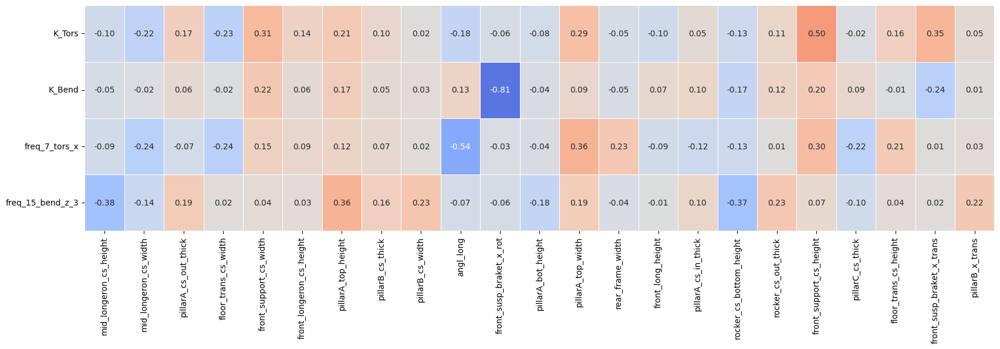

In [ ]:
plt.figure(figsize=(20,5))
sb.heatmap(df.corr().loc[TARGETS_LIGHT, INPUTS_FROM_CM], cmap='coolwarm', center=0,  vmin=-1, vmax=1, square=False, annot=True, fmt='.2f', cbar=False, linewidths =0.5, linecolor= 'white')
plt.show()

## F-test

Одномерный анализ (Univariate Analysis) -- простейшая форма статистического анализа.

UFS выбирает лучшие признаки на основе одномерных статистических тестов. Метод основан на F-тесте, который оценивает степень линейной зависимости между двумя переменными.

F-stat = MSR / MSE,
где MSR -- средняя сумма квадратов регрессии (вариация переменной, обусловленная , показывает как хорошо модель отражает данные), MSE -- средняя квадратическая ошибка (вариация переменной обусловаленная ошибкой). F-stat показывает меру важности признака, которая оценивает значимость зависимости между признаком и целевой переменной.

p-stat -- вероятность получения для данной модели F-stat больше или равного наблюдаемому в случае, если нулевая гипотеза верна, в данном случае то, что между выбраным признаком и целевой переменной нет зависимости

**SOURCE**: https://www.codecamp.ru/blog/a-simple-guide-to-understanding-the-f-test-of-overall-significance-in-regression/

In [ ]:
F_stat, p_stat = f_regression(df[INPUTS_FULL], df[TARGETS_LIGHT[0]])

In [ ]:
print('-'*69)
print('|{:^26}|{:^20}|{:^20}|'.format('column', 'F-stat', 'p-stat'))
print('-'*69)
for i, col in enumerate(df.loc[:, INPUTS_FULL].columns):
  print('|{:<26}|{:^20.2f}|{:^20.6f}|'.format(col, F_stat[i], p_stat[i]))

---------------------------------------------------------------------
|          column          |       F-stat       |       p-stat       |
---------------------------------------------------------------------
|Kp_h                      |        0.01        |      0.906555      |
|Kp_w                      |        3.08        |      0.079413      |
|angl_long                 |       66.45        |      0.000000      |
|floor_trans_cs_height     |       54.47        |      0.000000      |
|floor_trans_cs_width      |       112.58       |      0.000000      |
|front_bump_cs_height      |        1.62        |      0.202677      |
|front_long_height         |       20.87        |      0.000005      |
|front_longeron_cs_height  |       38.37        |      0.000000      |
|front_longeron_cs_width   |        8.15        |      0.004339      |
|front_support_cs_height   |       659.59       |      0.000000      |
|front_support_cs_width    |       216.47       |      0.000000      |
|front_s

# Train, valid and test data preparation

## Параметры разбиения

In [ ]:
TEST_SPLIT = .15
VAL_SPLIT = .15

x_scaler = StandardScaler()
y_scaler = StandardScaler()

## Разбиение на выборки

In [ ]:
x_data = df[INPUTS_FROM_CM]
y_data = df[TARGETS_LIGHT]

x_data = np.array(x_data)
y_data = np.array(y_data)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=TEST_SPLIT, shuffle=True, random_state=1337)

In [ ]:
print(x_train.shape, y_train.shape)

(1700, 23) (1700, 4)


## Нормализация данных

Для повышения точности ML-моделирования входные данные часто подвергают нормализации и/или стандартизации.

In [ ]:
x_train_scaled = x_scaler.fit_transform(x_train)
y_train_scaled = y_scaler.fit_transform(y_train)

# Models

## Utils

MAPE table

In [ ]:
def evaluate_model(y_pred, y_test, target_names=TARGETS_LIGHT, table_len=None, return_stats=False):
  y_size = y_test.shape[1]

  if not table_len:
    table_len = y_test.shape[0]

  if table_len > 99:
    id_width = len(str(table_len)) + 2
  else:
    id_width = 4

  subcolumn_width = max(len(str(int(np.max(np.concatenate([y_test, y_pred]))))), *[len(x) for x in target_names]) + 2

  column_width = subcolumn_width * y_size + y_size - 1

  table_width = (id_width + 2 + (column_width + 1) * 4)

  print('-' * table_width)
  print('|{:^{:}}|{:^{:}}|{:^{:}}|{:^{:}}|{:^{:}}|'.format('ID', id_width,
                                                           'TEST', column_width,
                                                           'PRED', column_width,
                                                           'AE', column_width,
                                                           'APE, %', column_width))
  print('-' * table_width)

  subcolumns = '|{:^{:}}|' + ('{:^{:}}:' * (y_size - 1) + '{:^{:}}|') * 4
  subcolumns_names = []
  for name in target_names:
    subcolumns_names.append(name)
    subcolumns_names.append(str(subcolumn_width))

  print(subcolumns.format('##', id_width,
                          *subcolumns_names * y_size))
  print('-' * table_width)

  for i in range(table_len):

    ae = [abs(y_test[i, j] - y_pred[i, j]) for j in range(y_size)]
    ape = [abs(y_test[i, j] - y_pred[i, j]) / y_test[i, j] for j in range(y_size)]

    subcolumns = '|{:^{:}}|' + ('{:^{:}.1f}:' * 2 + '{:^{:}.2e}:{:^{:}.2e}|') * 2 + '{:^{:}.1f}:' * 2 + '{:^{:}.2e}:{:^{:}.2e}|' + '{:^{:}.1%}:' * (y_size - 1) + '{:^{:}.1%}|'

    values = np.concatenate([y_test[i], y_pred[i], ae, ape])
    subcolumns_values = []
    for value in values:
      subcolumns_values.append(value)
      subcolumns_values.append(subcolumn_width)

    print(subcolumns.format(i, id_width,
                            *subcolumns_values))
  print('-' * table_width)

  mape = [mean_absolute_percentage_error(y_test[:, i], y_pred[:, i]) for i in range(y_size)]
  mae = [mean_absolute_error(y_test[:, i], y_pred[:, i]) for i in range(y_size)]

  mape_values = []
  mae_values = []

  for i in range(y_size):
    mape_values.append(target_names[i])
    mape_values.append(mape[i])

  output_mape = 'MAPE:\n ' + '{:}:{:5.1%}  ' * y_size

  print(output_mape.format(*mape_values))

  print('MAPE SUM:\n {:5.1%}'.format(sum(mape)))

  if return_stats:
    return mape

In [ ]:
def plot_history(history, save_flag=SAVE_IMAGES, model_name=''):
  data = history.history

  for metric in data:
    if 'val' not in metric:
      plt.figure(figsize=(10, 5))
      plt.plot(data[metric], label=metric)

      if 'val_'+metric in data:
        plt.plot(data['val_'+metric], label='val_'+metric)
      else:
        print('No validation data found!')

      plt.grid()
      plt.legend()

      if save_flag:
        plt.savefig(HISTORY_PATH + '/' + model_name + '-' + metric + FILE_FORMAT)

      plt.show()

In [ ]:
def cross_val_kfold(model, k, x_data=x_data, y_data=y_data, x_scaler=x_scaler, y_scaler=y_scaler, scale=True):
  scores = []
  kf = KFold(n_splits=5)
  splits = kf.split(x_data)
  if scale:
    x_data_scaled = x_scaler.transform(x_data)
    y_data_scaled = y_scaler.transform(y_data)
  else:
    x_data_scaled = x_data
    y_data_scaled = y_data

  for split in splits:
    model.fit(x_data_scaled[split[0]], y_data_scaled[split[0]])
    y_pred = y_scaler.inverse_transform(model.predict(x_data_scaled[split[1]]))
    mape = mean_absolute_percentage_error(y_pred, y_data[split[1]])
    scores.append(mape)
  return scores

In [ ]:
cross_val_kfold(LinearRegression(), k=5)

[0.017875260147512024,
 0.01777063421819131,
 0.017724517955455543,
 0.017710885194715947,
 0.017697920012518697]

## Linear regression

In [ ]:
lr_model = LinearRegression()

lr_model.fit(x_train_scaled, y_train_scaled)

y_pred = y_scaler.inverse_transform(lr_model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6696.6 : 5449.4 :2.21e-02:6.85e-02|  59.8  :  50.6  :1.60e-04:2.22e-03|  0.9%  :  0.9%  :  0.7%  :  3.4%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02| 6265.8 : 3923.1 :2.21e-02:6.52e-02|  51.8  :

In [ ]:
scores = []
scores_cv = []
test_size = [.5, .10, .15, .20, .25, .30]
x_data_sc = x_scaler.transform(x_data)
y_data_sc = y_scaler.transform(y_data)
for size in test_size:
  x_train, x_test, y_train, y_test = train_test_split(x_data_sc, y_data_sc, test_size=size, shuffle=True)
  lr_model = LinearRegression()
  lr_model.fit(x_train, y_train)
  mape = mean_absolute_percentage_error(y_scaler.inverse_transform(y_test), y_scaler.inverse_transform(lr_model.predict(x_test)))
  # cv_mape = cross_val_kfold(lr_model, k=5, x_data=x_)
  scores.append(mape)
print(scores)

[0.017367144595566354, 0.017369047799303833, 0.017684679558750475, 0.018174765732585727, 0.017970151440887323, 0.017253354330489037]


In [ ]:
lr_model.intercept_

array([3.48893616e-04, 3.97751057e-03, 1.26102236e-05, 1.86305586e-03])

In [ ]:
x_line = x_scaler.transform(x_test)
x_line[:, 7].sort()
y_line = lr_model.coef_[2, 7] * x_line[:, 7]

In [ ]:
min(y_scaler.transform(y_data)[:, 2])

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(5, 10))

axs[0].scatter(x_scaler.transform(x_data)[:, 0], y_scaler.transform(y_data)[:, 0], s=10, alpha=.7)
# axs[0].grid()
axs[0].spines['left'].set_position('zero')
axs[0].spines['right'].set_color('none')
axs[0].spines['bottom'].set_position('zero')
axs[0].spines['top'].set_color('none')

axs[1].scatter(x_data[:, 0], y_data[:, 0], s=10, alpha=.7)
# axs[0].grid()
axs[1].set_xlim((0, max(x_data[:, 0])))
axs[1].set_ylim((0, max(y_data[:, 0])))
axs[1].spines['left'].set_position('zero')
axs[1].spines['right'].set_color('none')
axs[1].spines['bottom'].set_position('zero')
axs[1].spines['top'].set_color('none')

plt.show()
# plt.scatter(x_data[:, 0], y_data[:, 0])
# plt.grid()
# plt.spines['left'].set_position('zero')
# plt.spines['right'].set_color('none')
# plt.spines['bottom'].set_position('zero')
# plt.spines['top'].set_color('none')
# plt.show()

In [ ]:
def get_model_plot(x_row, y_col, model, x_data=x_data, y_data=y_data):
  # coefs = model.coef_

  # Get predicts
  y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_data)))

  # Target Data
  plt.scatter(x_data[:, x_row], y_data[:, y_col], label='Traget', s=20, alpha=.8)

  # Predicted Data
  plt.scatter(x_data[:, x_row], y_pred[:, y_col], label='Predict', s=20, alpha=.8)

  # Get Line
  # x_data[:, x_row].sort()

  # y_line = x_data[:, x_row] * coefs[:, x_row]
  # # y_line = y_line[:, y_col]

  # plt.plot(x_data[:, x_row], y_line)

  # y_min = float(min(y_line))
  # y_max = float(max(y_line))

  # plt.ylim((y_min, y_max))
  plt.legend()
  plt.show()

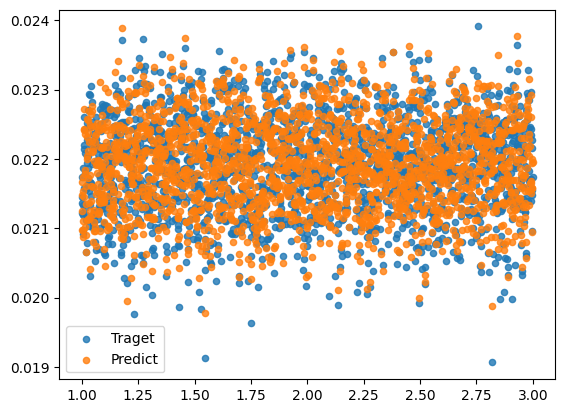

In [ ]:
get_model_plot(17, 2, lr_model)

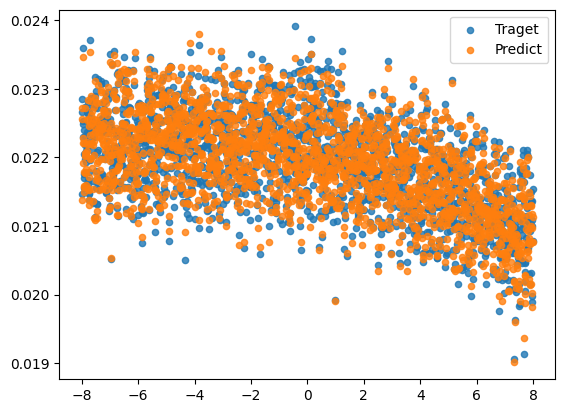

In [ ]:
get_model_plot(17, 2, pr_model)

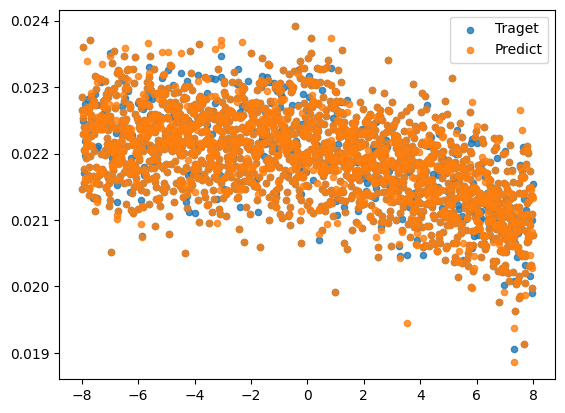

In [ ]:
get_model_plot(17, 2, pr_model)

63/63 [==============================] - 0s 4ms/step


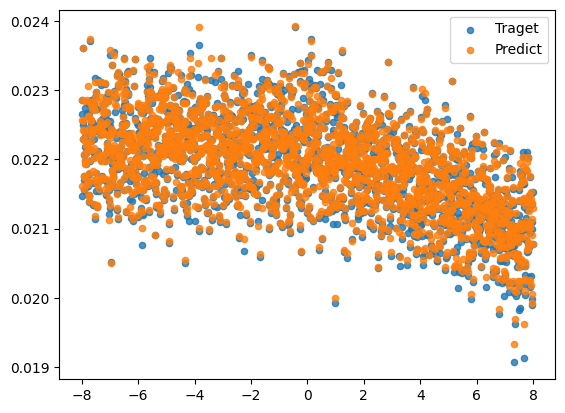

In [ ]:
y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_data)))

  # Target Data
plt.scatter(x_data[:, 17], y_data[:, 2], label='Traget', s=20, alpha=.8)

  # Predicted Data
plt.scatter(x_data[:, 17], y_pred[:, 2], label='Predict', s=20, alpha=.8)

  # Get Line
  # x_data[:, x_row].sort()

  # y_line = x_data[:, x_row] * coefs[:, x_row]
  # # y_line = y_line[:, y_col]

  # plt.plot(x_data[:, x_row], y_line)

  # y_min = float(min(y_line))
  # y_max = float(max(y_line))

  # plt.ylim((y_min, y_max))
plt.legend()
plt.show()

In [ ]:
plt.scatter(x_scaler.transform(x_data)[:, 7], y_scaler.transform(y_data)[:, 2])
# y_pred = y_scaler.inverse_transform(lr_model.predict(x_line))
# plt.scatter(x_scaler.transform(x_test)[:, 7], y_scaler.transform(y_pred)[:, 2])
plt.plot(x_line[:, 2], y_line, linewidth=3, c='k')
# plt.ylim(min(y_scaler.transform(y_data)[:, 2]), max(y_scaler.transform(y_data)[:, 2]))
# plt.xlim(min(x_scaler.transform(x_data)[:, 7]), max(x_scaler.transform(x_data)[:, 7]))

plt.show()

In [ ]:
# x_data.shape, y_data.shape

i: 0; j: 0


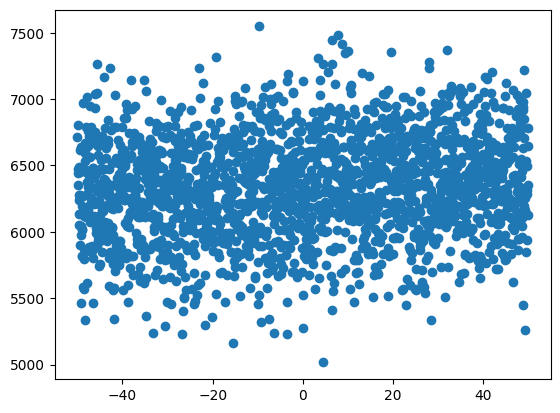

i: 0; j: 1


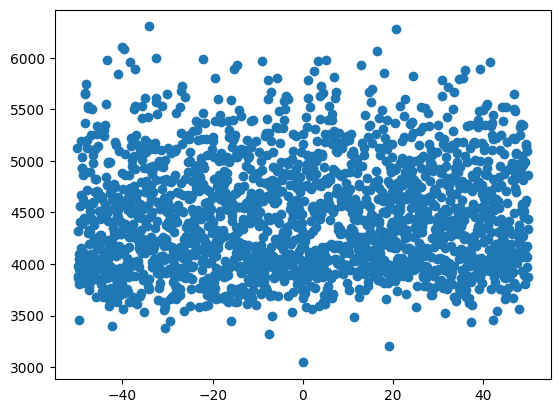

i: 0; j: 2


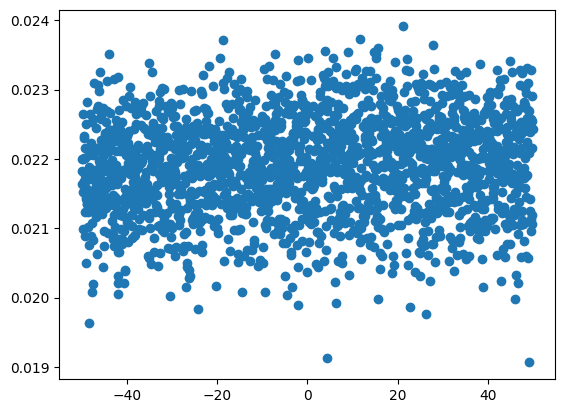

i: 0; j: 3


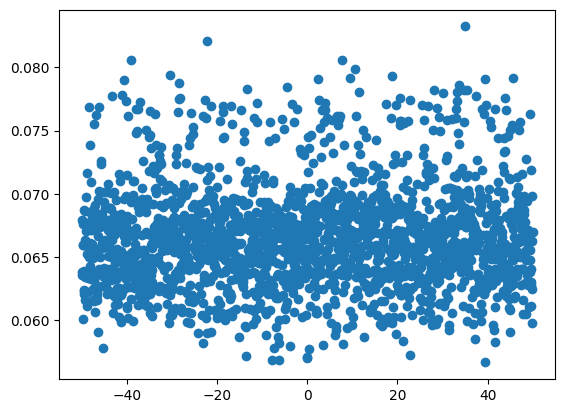

i: 1; j: 0


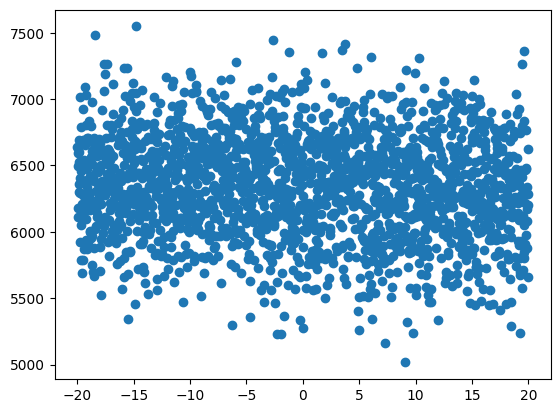

i: 1; j: 1


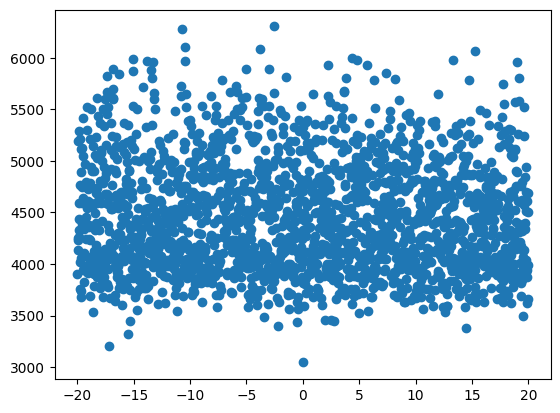

i: 1; j: 2


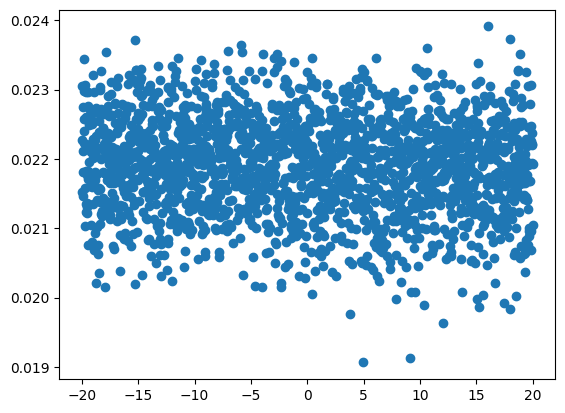

i: 1; j: 3


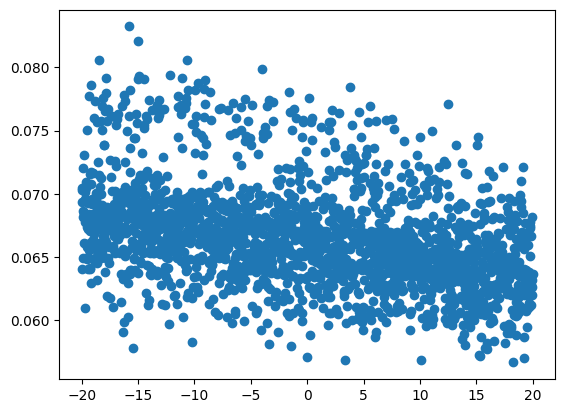

i: 2; j: 0


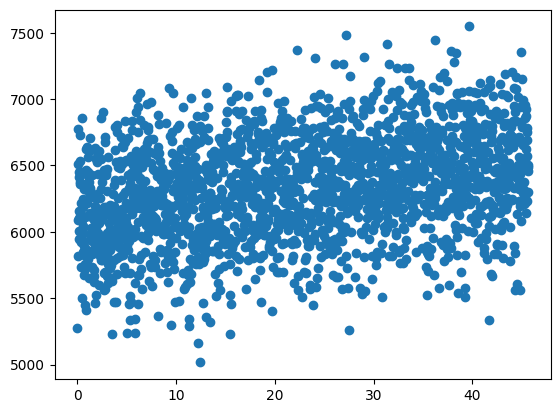

i: 2; j: 1


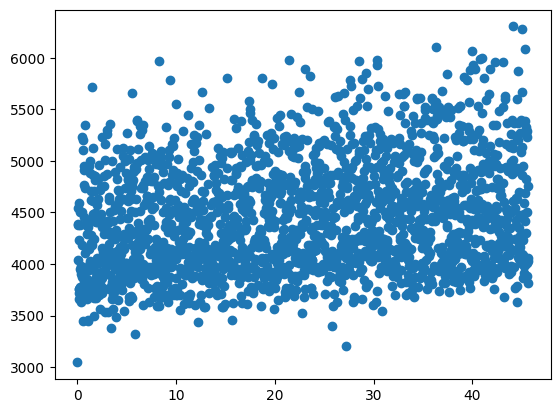

i: 2; j: 2


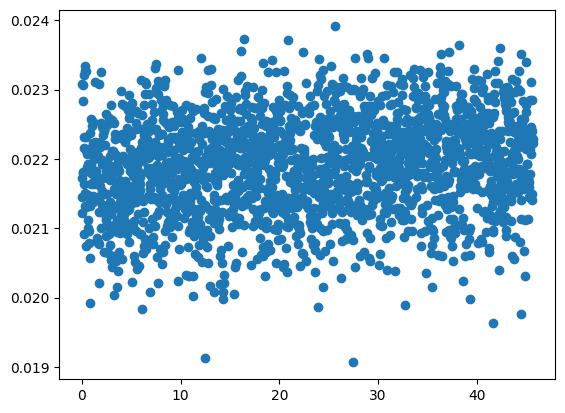

i: 2; j: 3


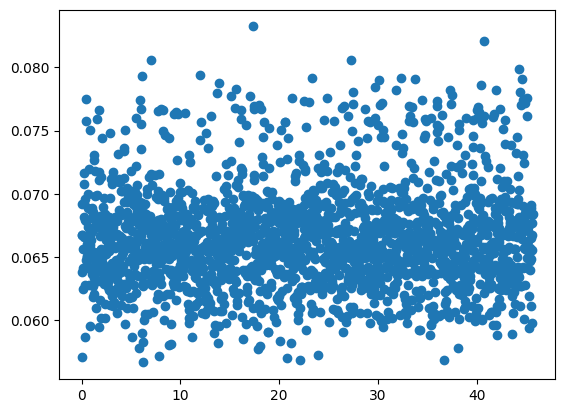

i: 3; j: 0


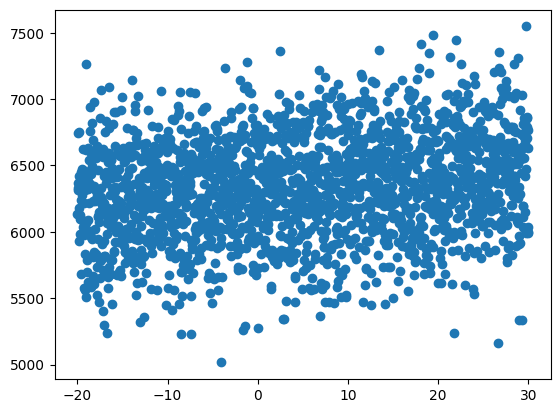

i: 3; j: 1


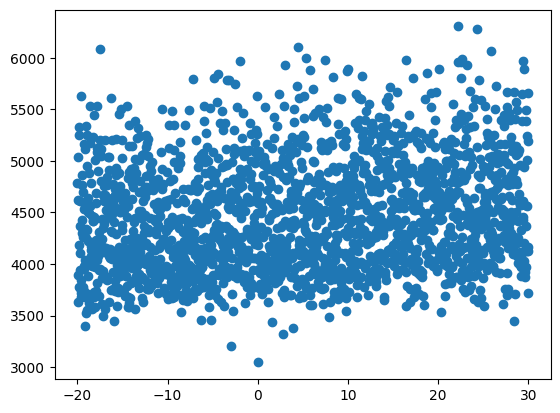

i: 3; j: 2


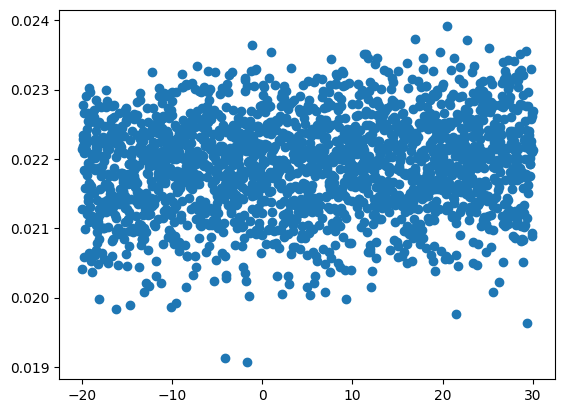

i: 3; j: 3


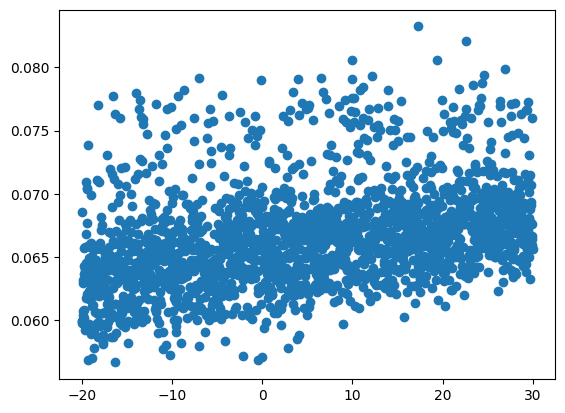

i: 4; j: 0


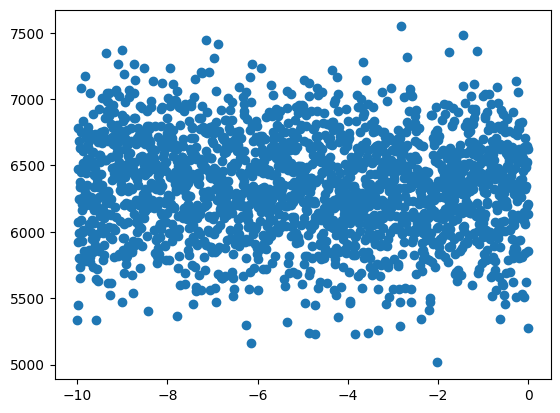

i: 4; j: 1


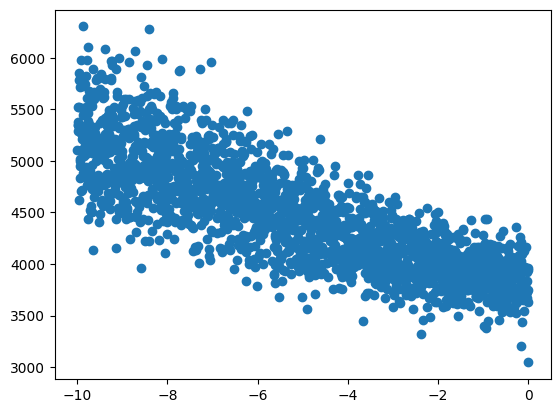

i: 4; j: 2


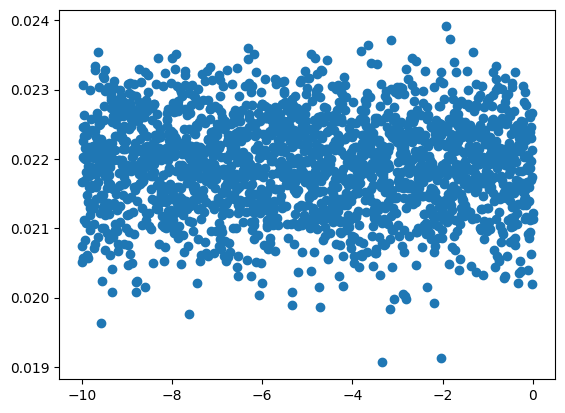

i: 4; j: 3


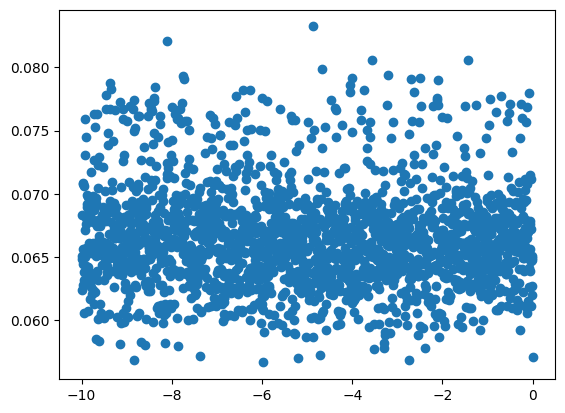

i: 5; j: 0


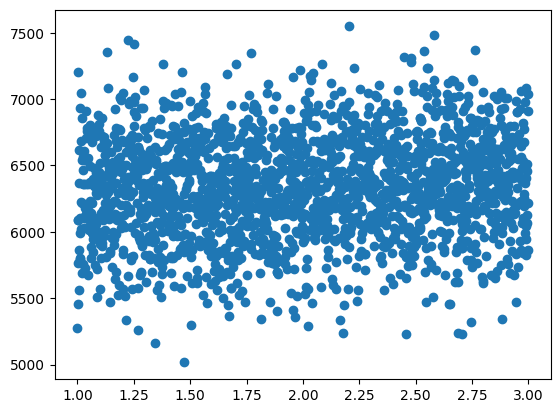

i: 5; j: 1


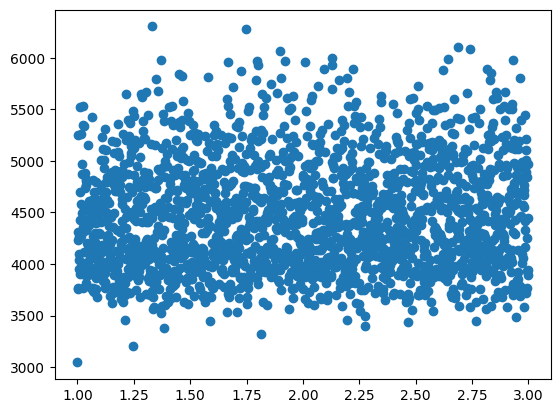

i: 5; j: 2


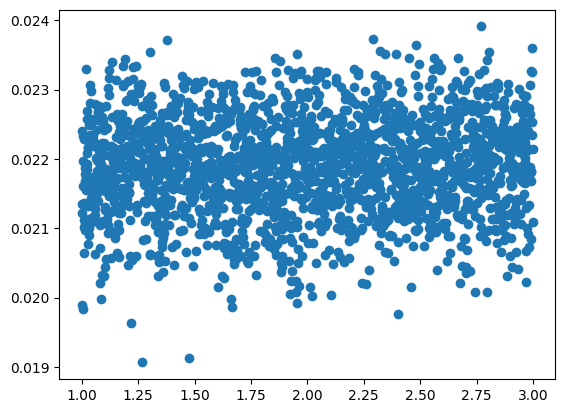

i: 5; j: 3


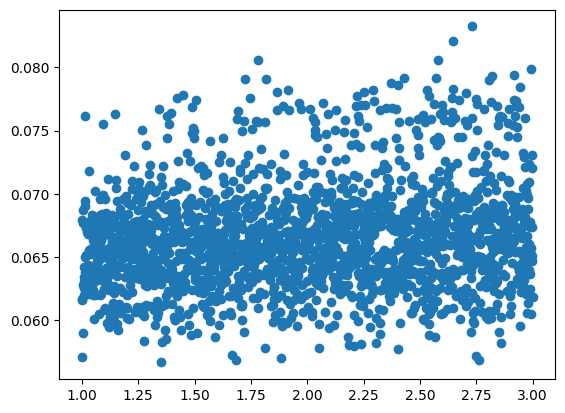

i: 6; j: 0


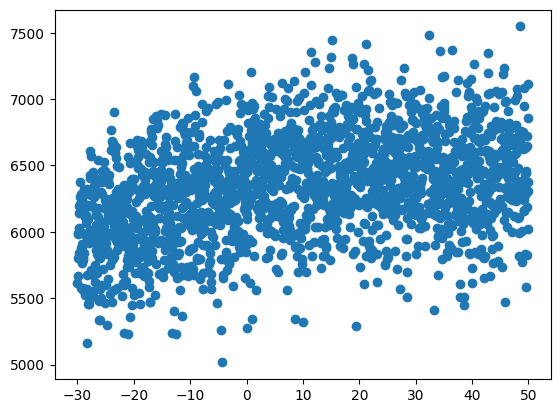

i: 6; j: 1


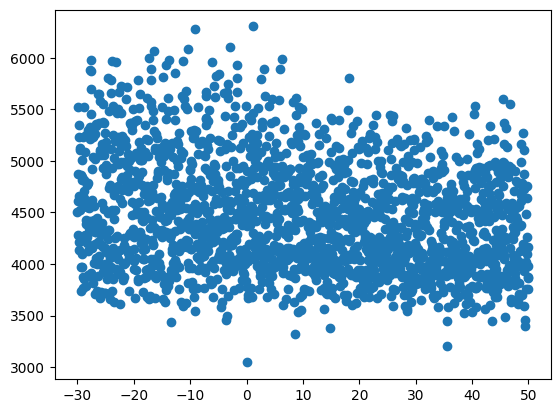

i: 6; j: 2


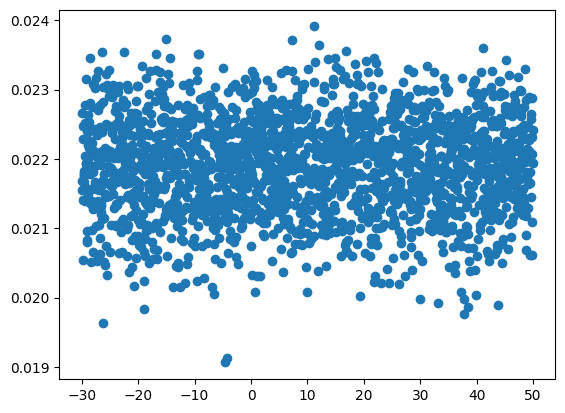

i: 6; j: 3


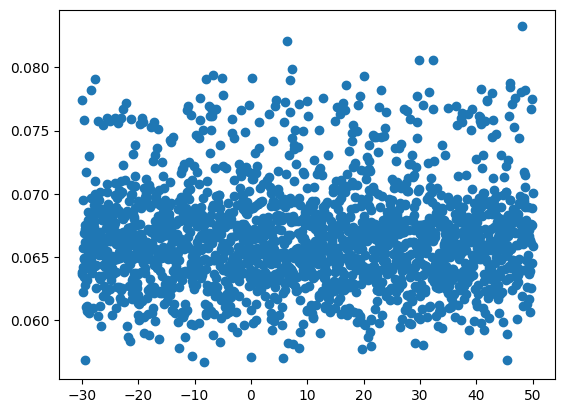

i: 7; j: 0


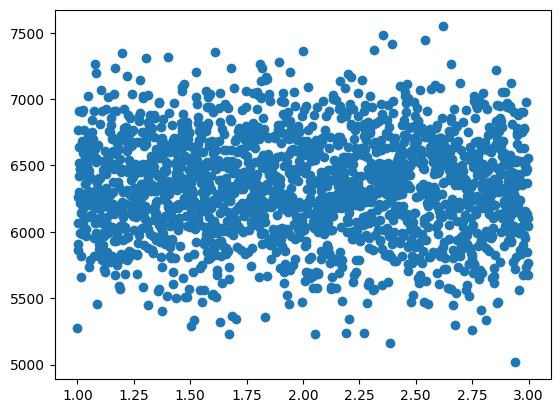

i: 7; j: 1


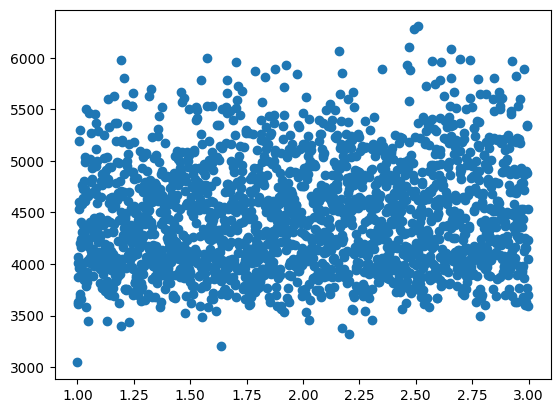

i: 7; j: 2


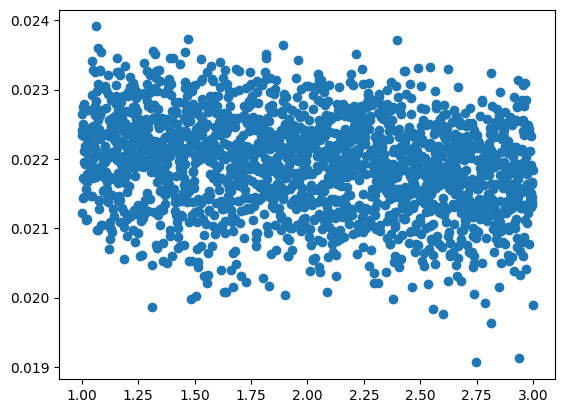

i: 7; j: 3


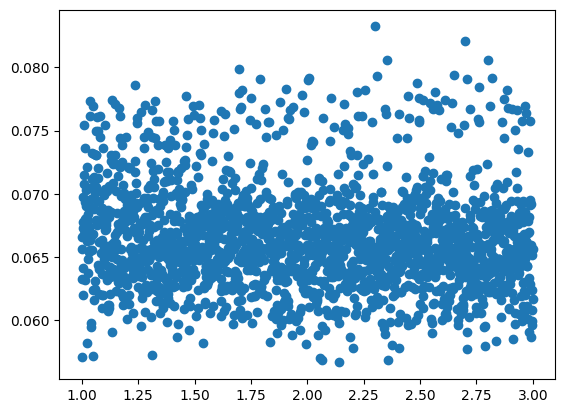

i: 8; j: 0


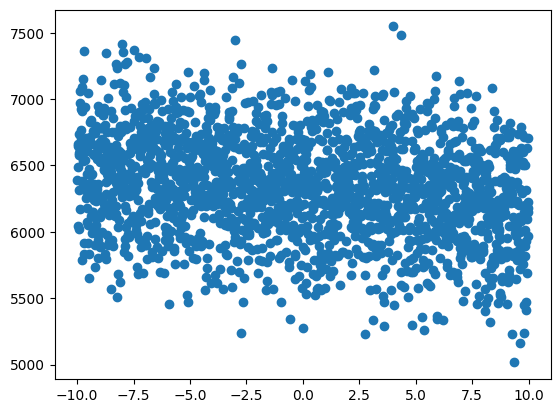

i: 8; j: 1


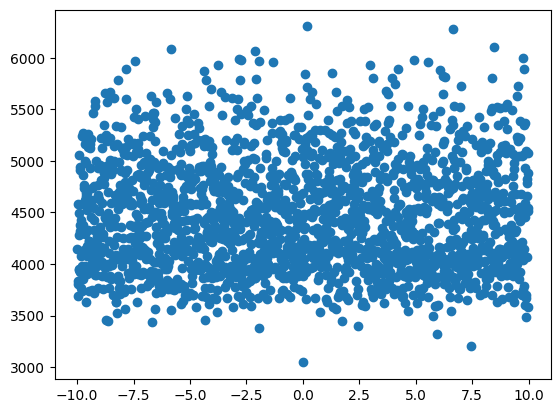

i: 8; j: 2


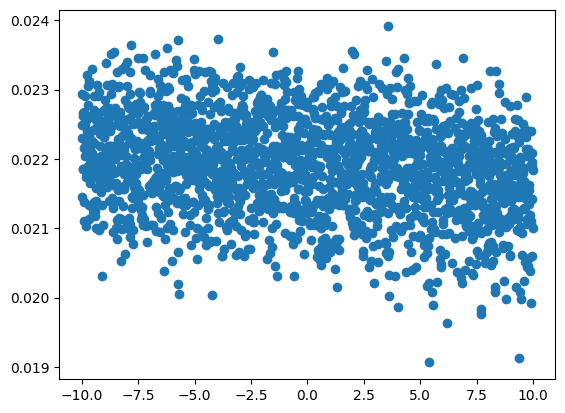

i: 8; j: 3


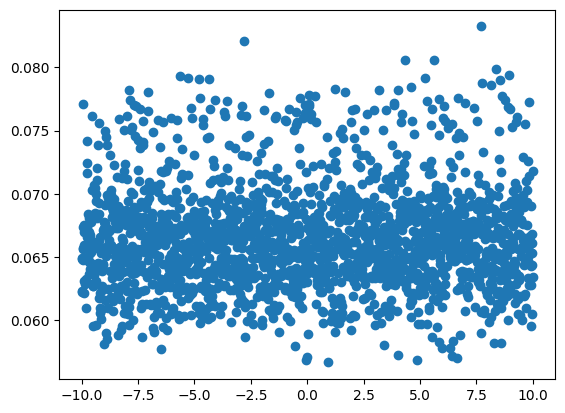

i: 9; j: 0


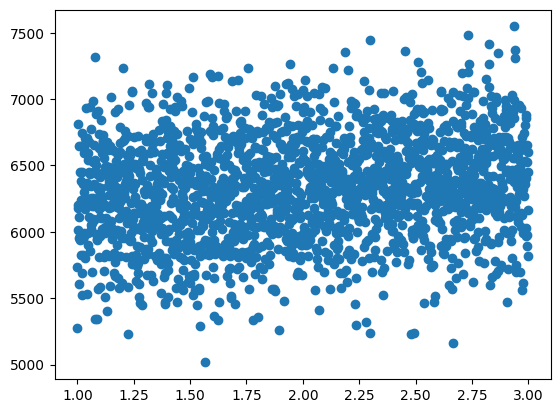

i: 9; j: 1


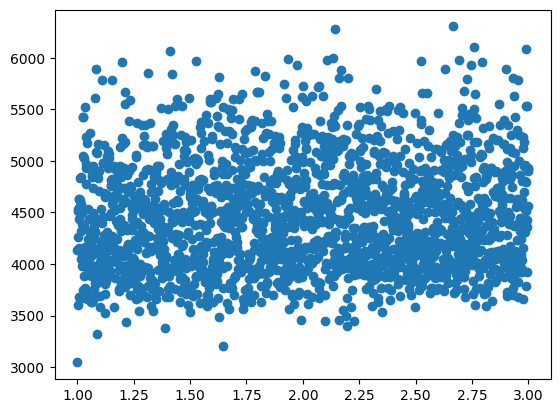

i: 9; j: 2


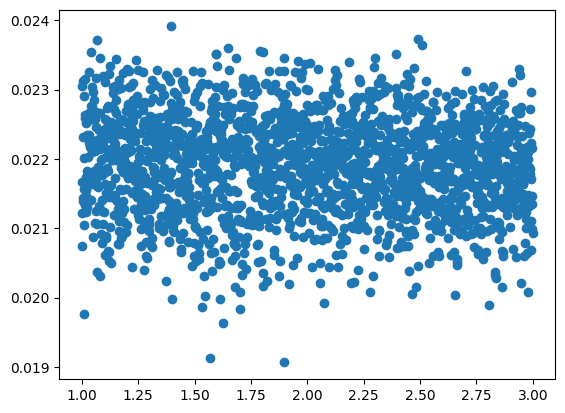

i: 9; j: 3


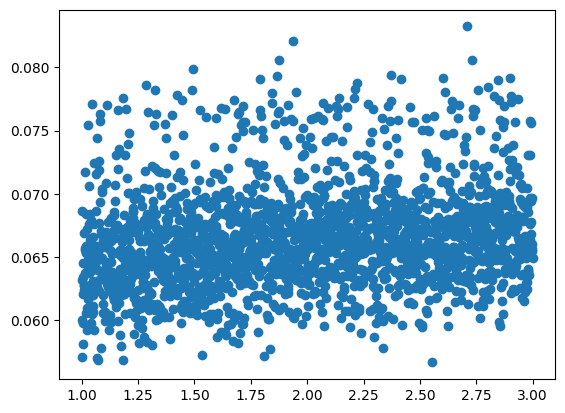

i: 10; j: 0


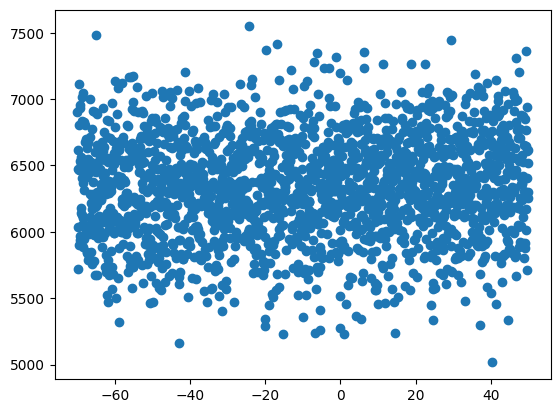

i: 10; j: 1


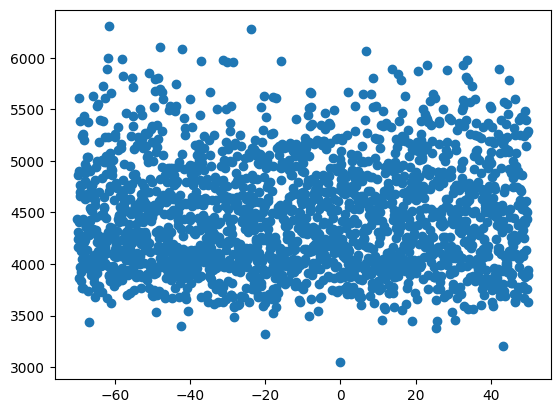

i: 10; j: 2


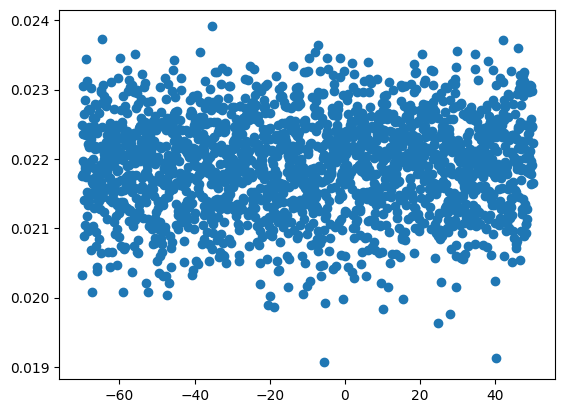

i: 10; j: 3


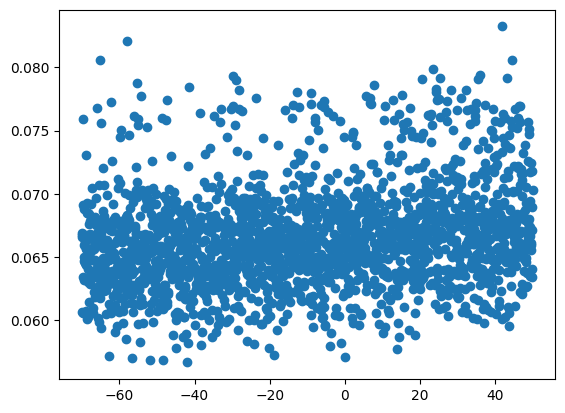

i: 11; j: 0


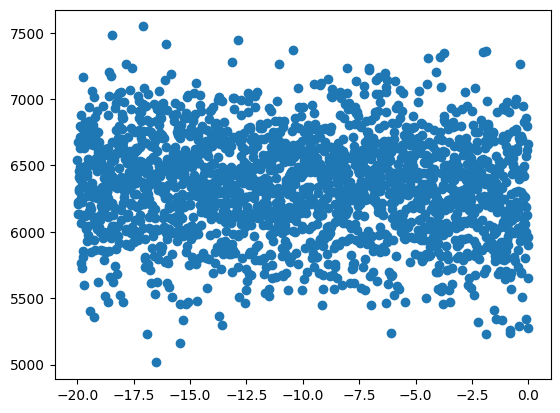

i: 11; j: 1


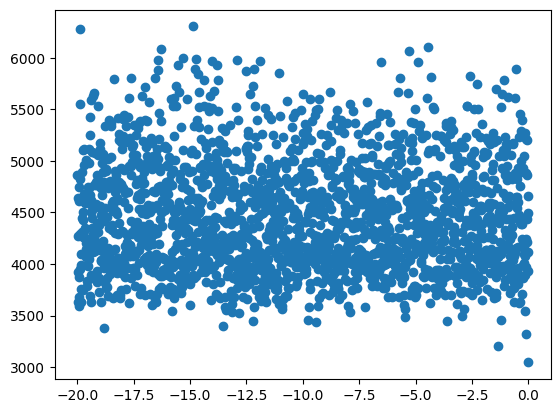

i: 11; j: 2


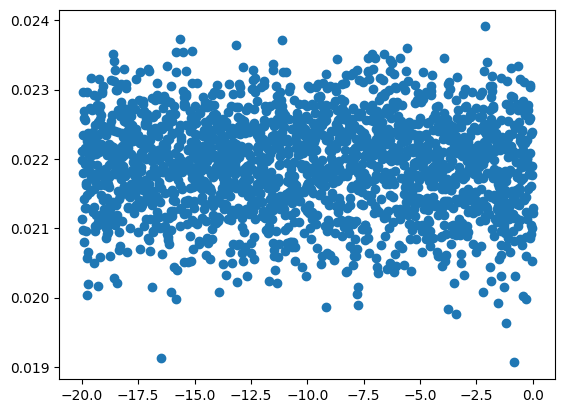

i: 11; j: 3


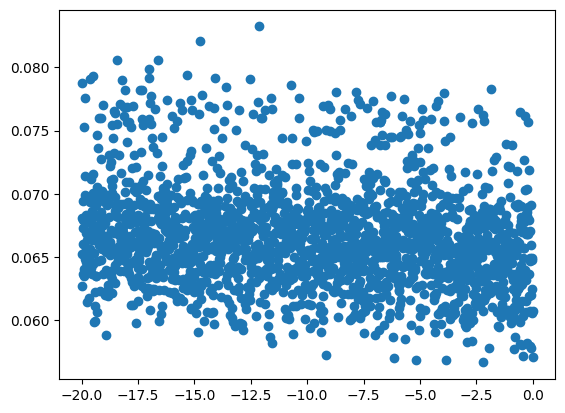

i: 12; j: 0


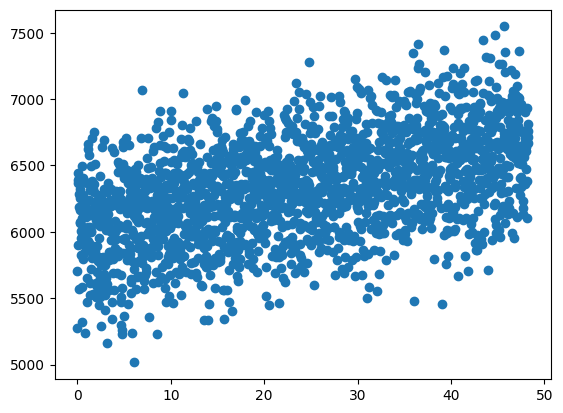

i: 12; j: 1


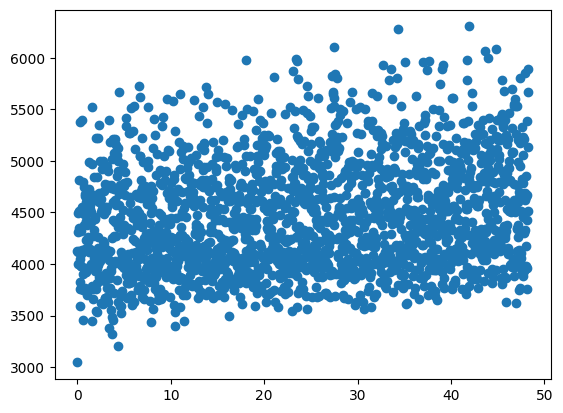

i: 12; j: 2


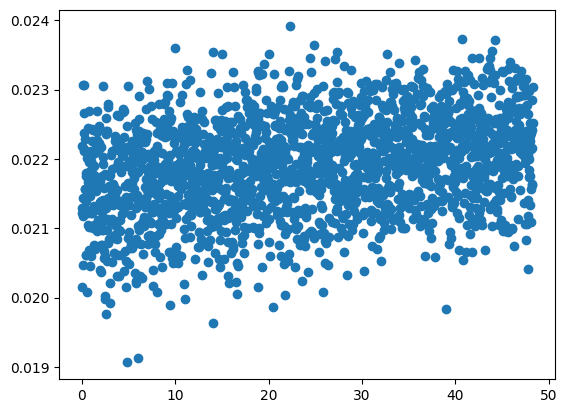

i: 12; j: 3


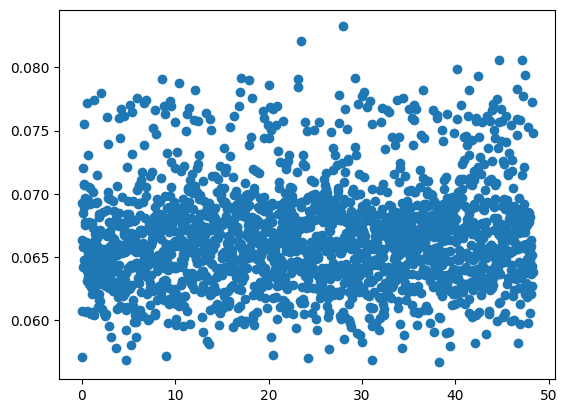

i: 13; j: 0


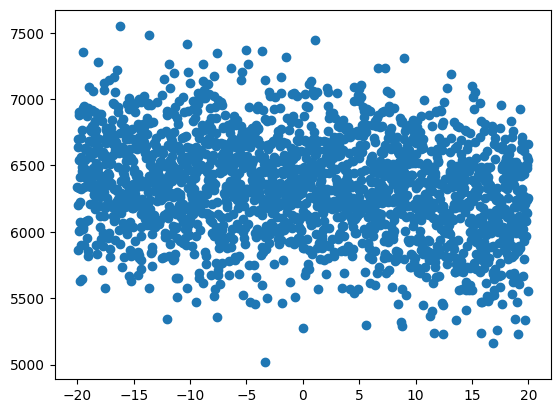

i: 13; j: 1


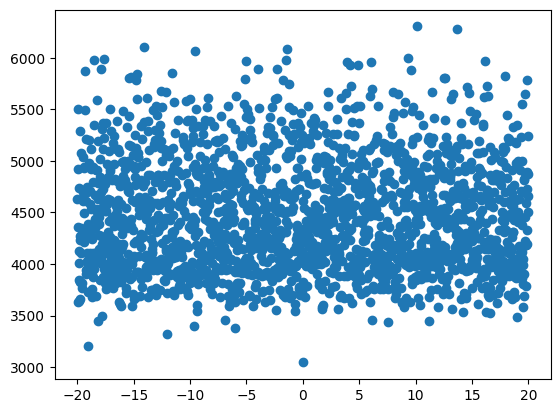

i: 13; j: 2


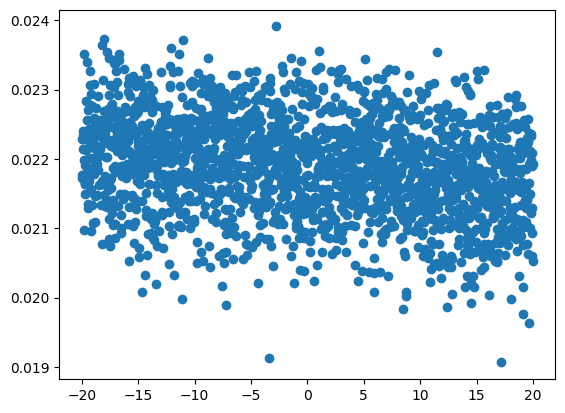

i: 13; j: 3


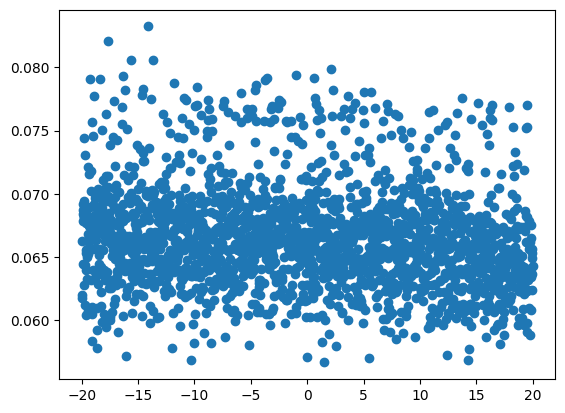

i: 14; j: 0


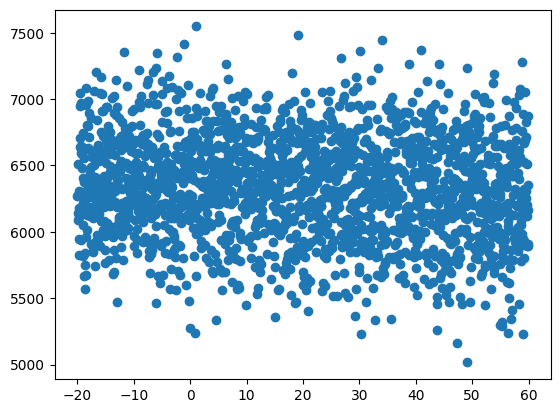

i: 14; j: 1


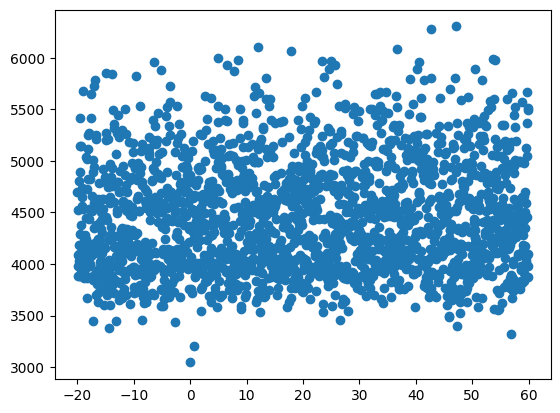

i: 14; j: 2


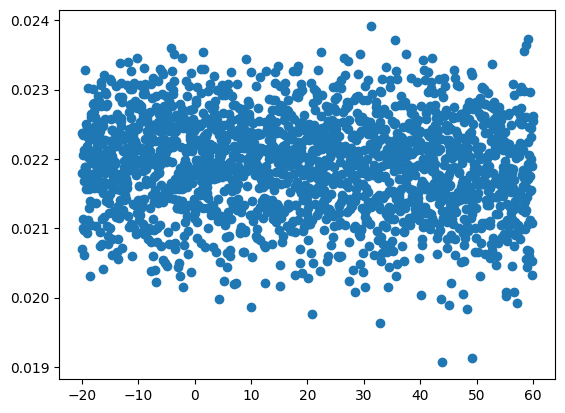

i: 14; j: 3


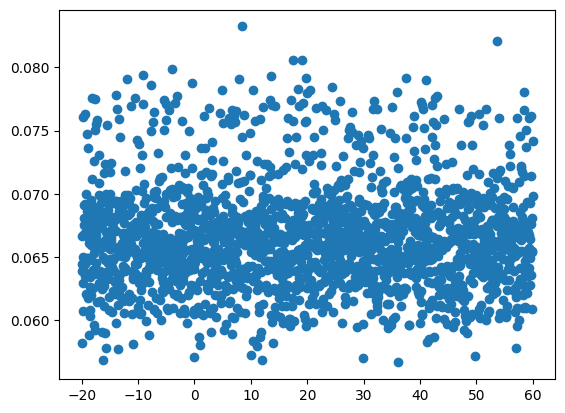

i: 15; j: 0


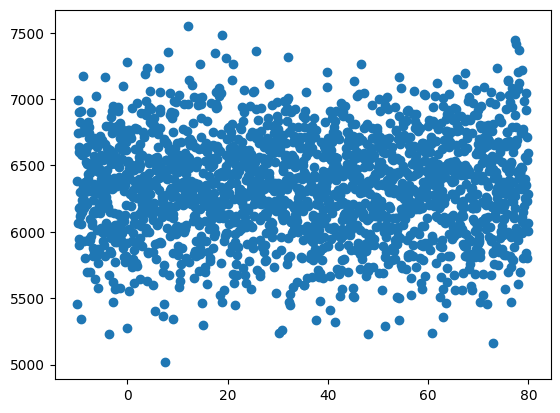

i: 15; j: 1


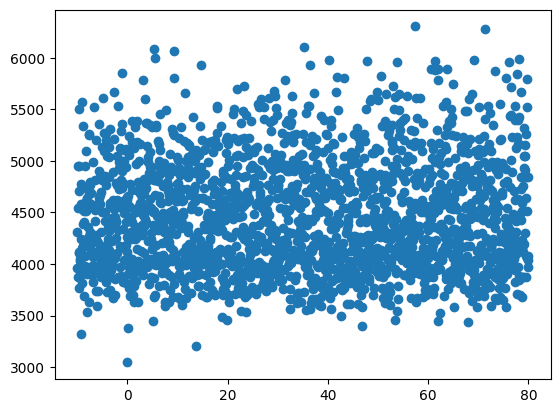

i: 15; j: 2


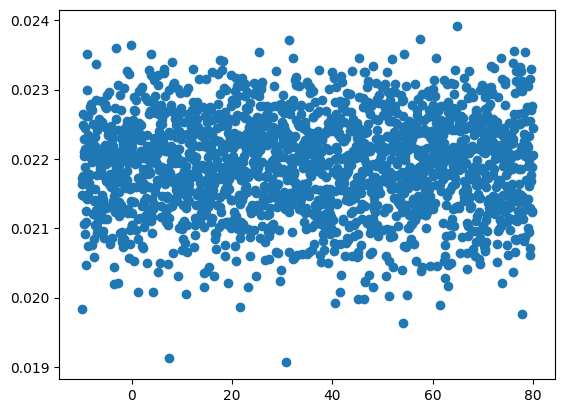

i: 15; j: 3


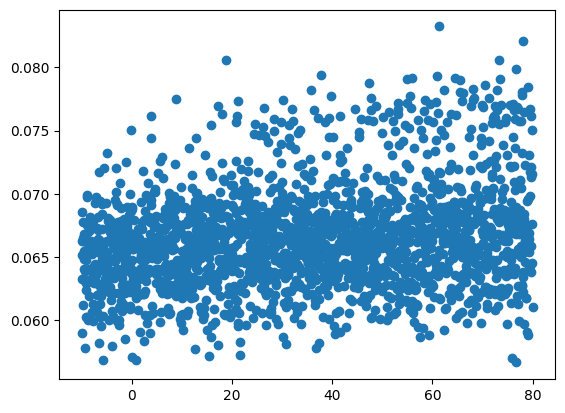

i: 16; j: 0


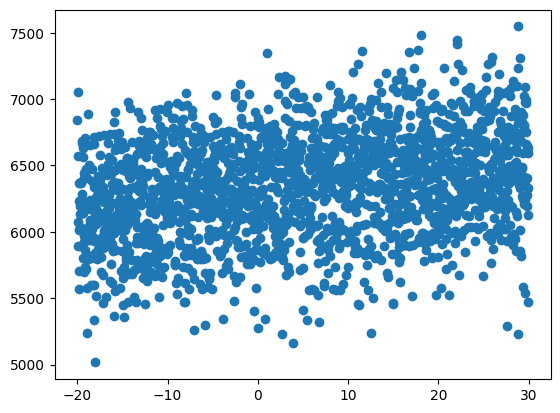

i: 16; j: 1


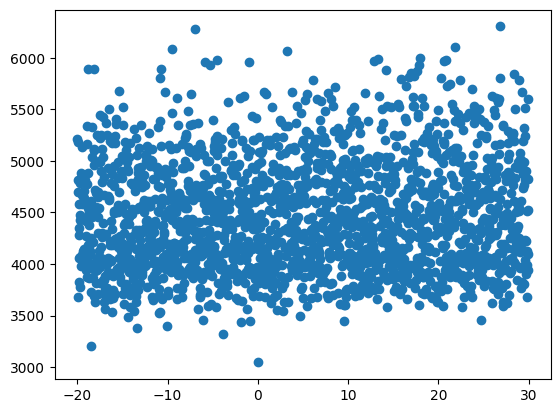

i: 16; j: 2


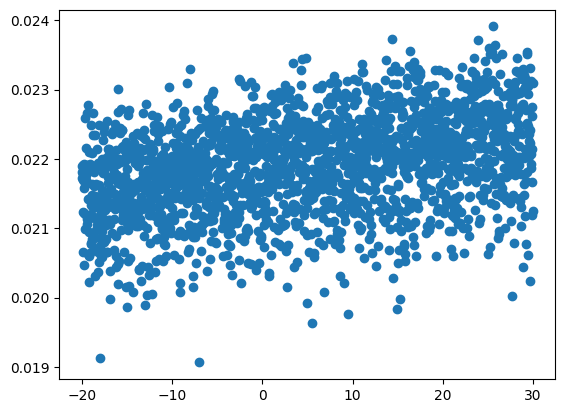

i: 16; j: 3


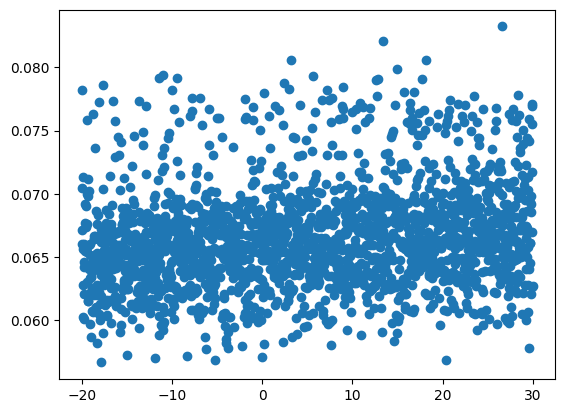

i: 17; j: 0


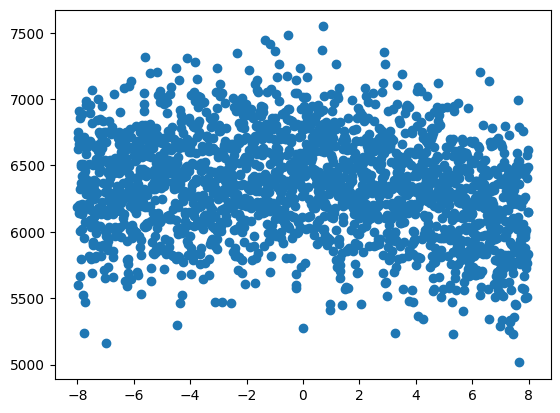

i: 17; j: 1


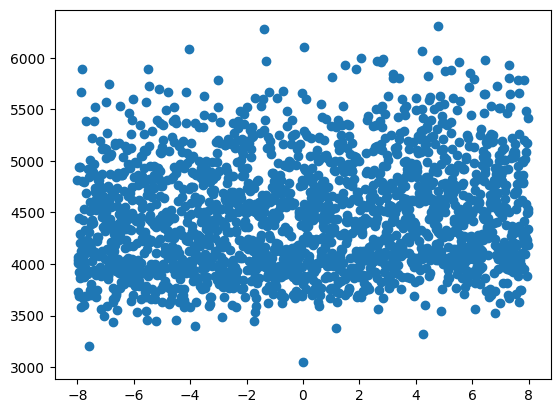

i: 17; j: 2


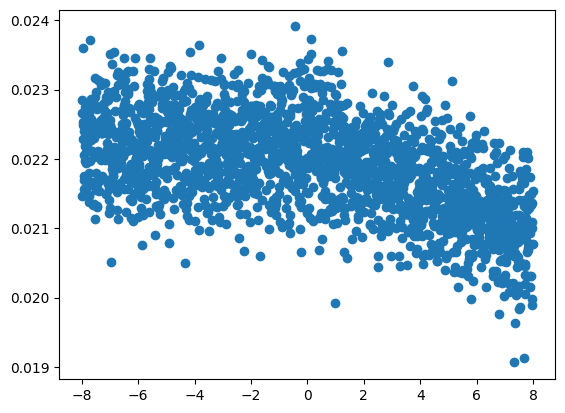

i: 17; j: 3


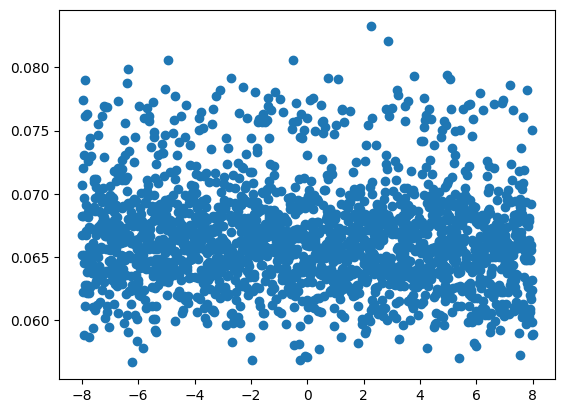

i: 18; j: 0


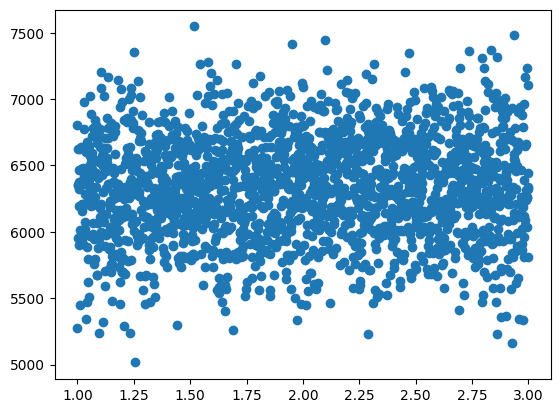

i: 18; j: 1


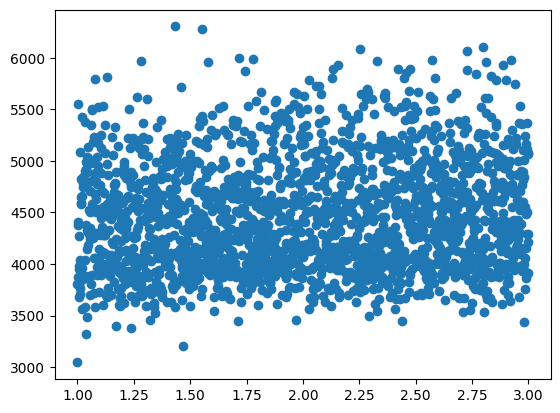

i: 18; j: 2


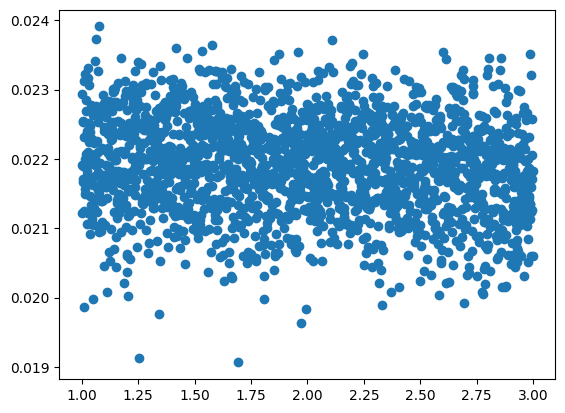

i: 18; j: 3


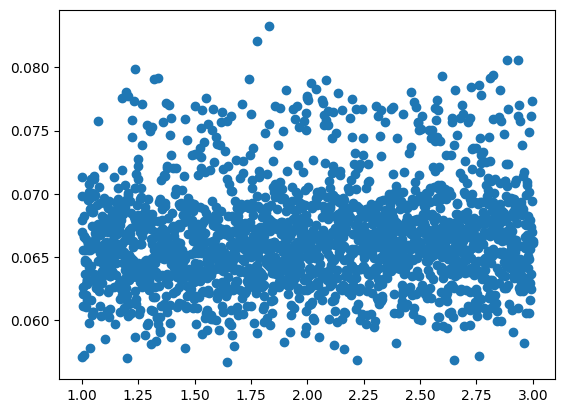

i: 19; j: 0


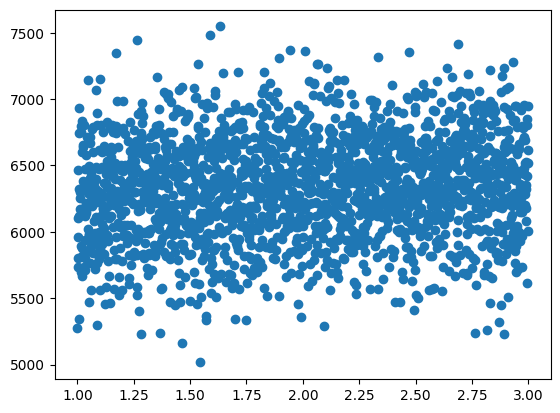

i: 19; j: 1


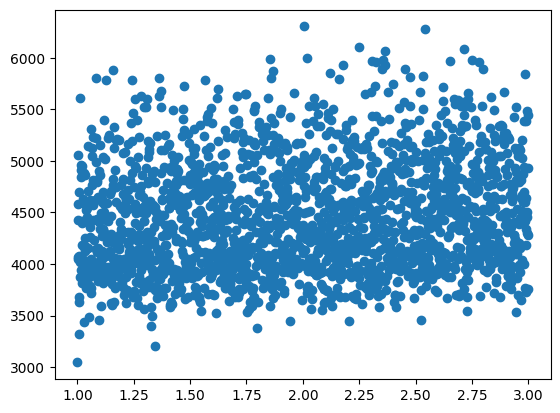

i: 19; j: 2


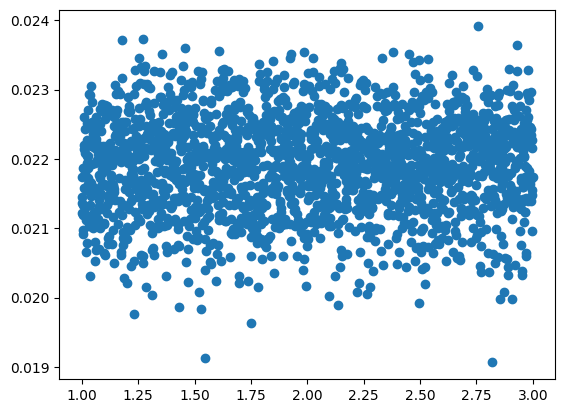

i: 19; j: 3


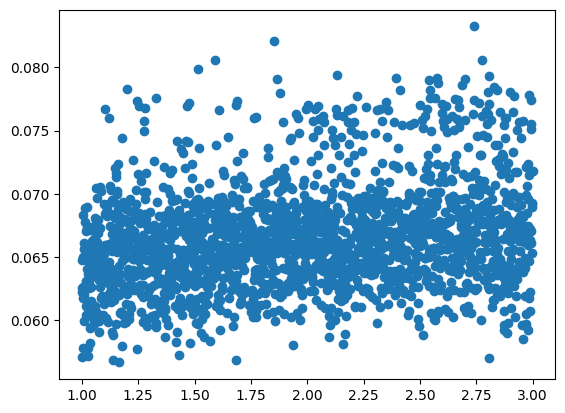

i: 20; j: 0


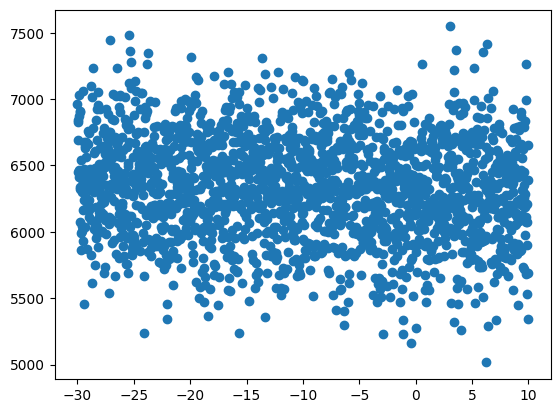

i: 20; j: 1


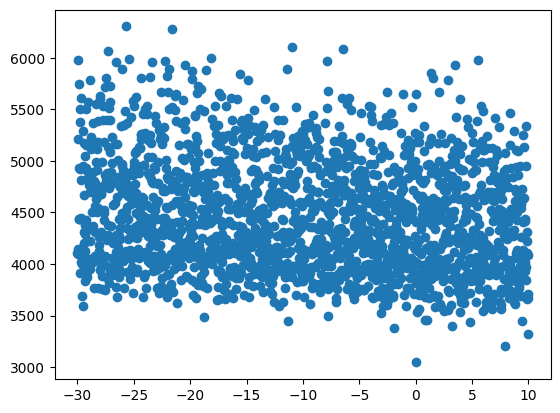

i: 20; j: 2


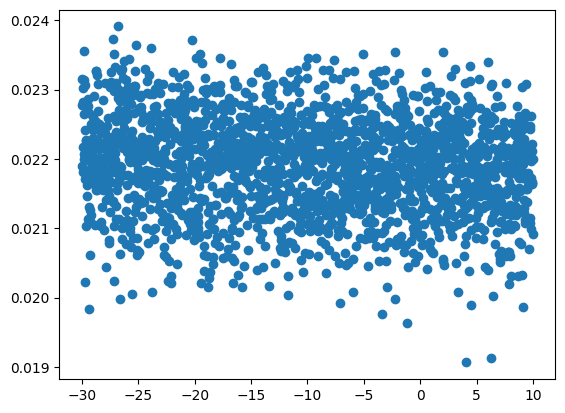

i: 20; j: 3


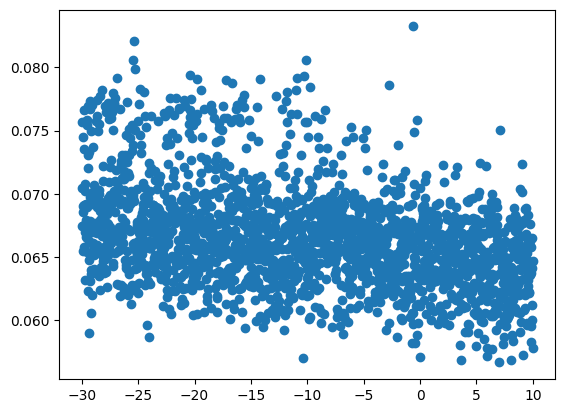

i: 21; j: 0


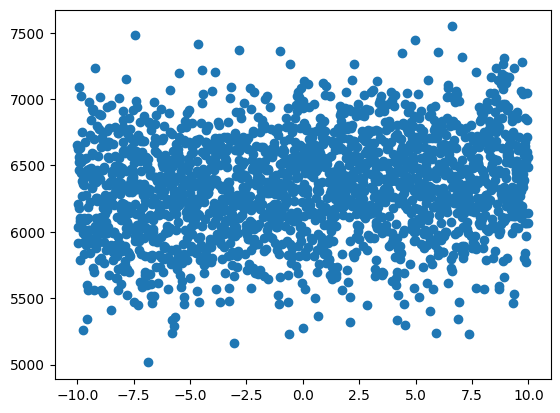

i: 21; j: 1


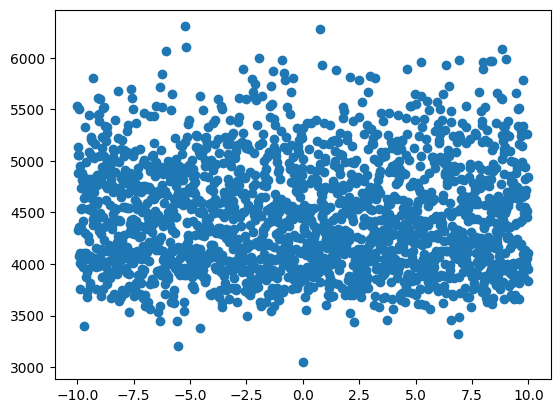

i: 21; j: 2


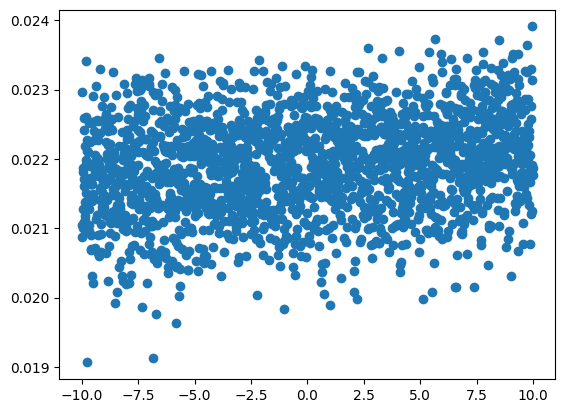

i: 21; j: 3


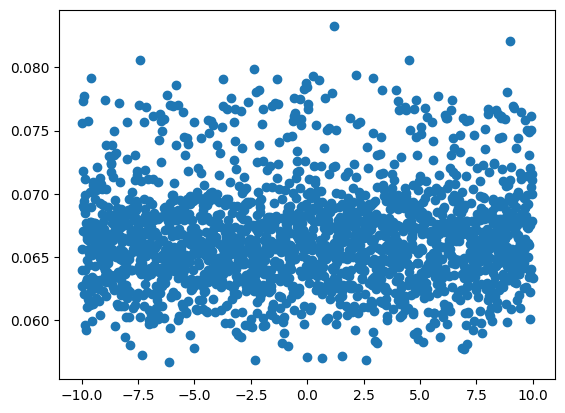

i: 22; j: 0


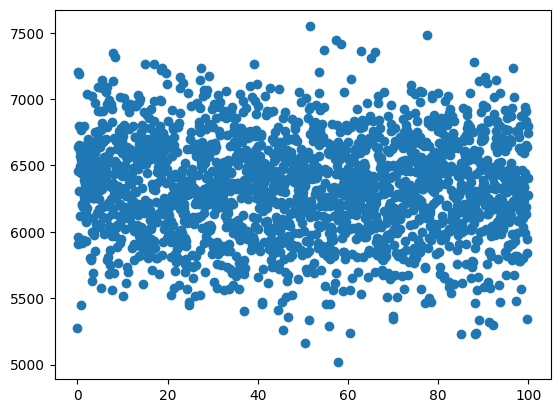

i: 22; j: 1


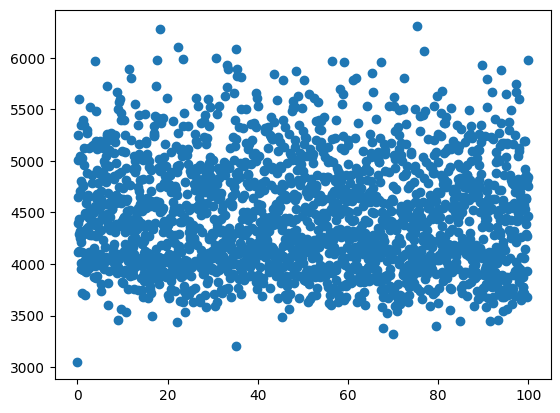

i: 22; j: 2


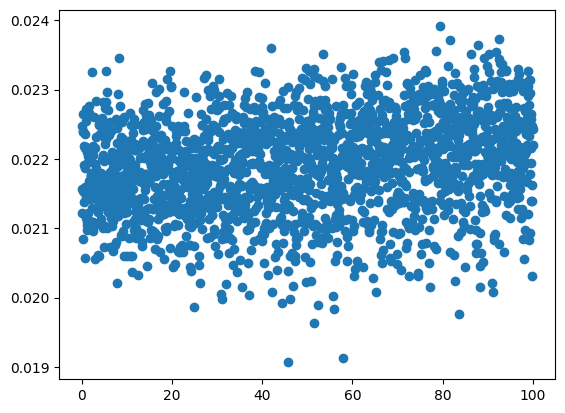

i: 22; j: 3


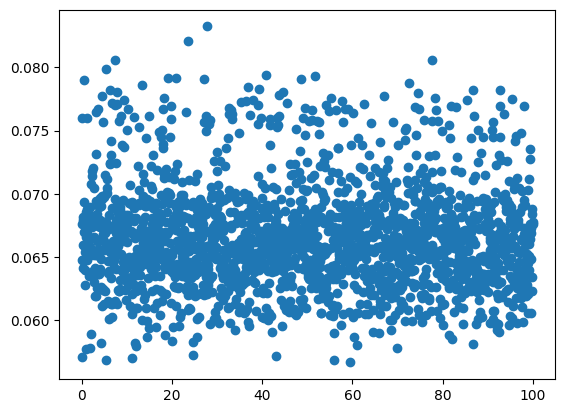

In [ ]:
for i in range(x_data.shape[1]):
  for j in range(y_data.shape[1]):
    print(f'i: {i}; j: {j}')
    plt.scatter(x_data[:, i], y_data[:, j])
    plt.show()

Cross validation

In [ ]:
lr_model = LinearRegression()

kf = KFold(n_splits=5, random_state=None)

result = cross_val_score(lr_model, x_data, y_data, scoring='neg_mean_absolute_percentage_error', cv=kf)

print("Avg accuracy: {}".format(abs(result.mean())))
print(result)

In [ ]:
lr_model.fit(x_train_scaled, y_train_scaled)

mean_absolute_error(y_train_scaled, lr_model.predict(x_train_scaled))

In [ ]:
x_train_scaled.shape, x_test.shape

## Polynomial regression

Second order polynom

In [ ]:
poly = PolynomialFeatures(degree=2, include_bias=False)
x_poly_features = poly.fit_transform(x_scaler.transform(x_train))
pr_model = LinearRegression()
pr_model.fit(x_poly_features, y_train_scaled)


# x_train_pf, x_test_pf, y_train, y_test = train_test_split(x_poly_features, y, test_size=0.3, random_state=42)

In [ ]:
pr_model = Pipeline([('poly', PolynomialFeatures(degree=2)),
                     ('linear', LinearRegression(fit_intercept=False))])

pr_model.fit(x_train_scaled, y_train_scaled)

y_pred = y_scaler.inverse_transform(pr_model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6645.6 : 5512.4 :2.21e-02:6.62e-02|  8.8   :  12.4  :1.61e-04:7.53e-05|  0.1%  :  0.2%  :  0.7%  :  0.1%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02| 6270.6 : 3951.2 :2.23e-02:6.53e-02|  56.6  :

In [ ]:
mean_absolute_percentage_error(y_pred, y_test)

0.012805650426627391

In [ ]:
x_line = x_scaler.transform(x_test)
x_line[:, 3].sort()
y_line = pr_model.coef_[2, 0] * x_line[:, 0]

AttributeError: ignored

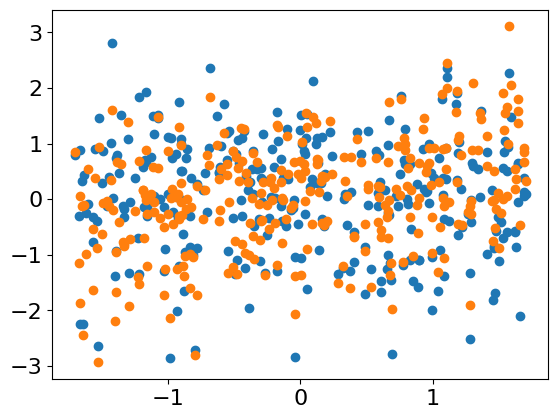

In [ ]:
plt.scatter(x_scaler.transform(x_test)[:, 0], y_scaler.transform(y_test)[:, 0])
# y_pred = y_scaler.inverse_transform(lr_model.predict)
plt.scatter(x_scaler.transform(x_test)[:, 0], y_scaler.transform(y_pred)[:, 0])
# plt.plot(x_line[:, 0], y_line, linewidth=3, c='k')
plt.xlim = max(x_scaler.transform(x_test)[:, 0]); plt.ylim = max(y_scaler.transform(y_test)[:, 0])

plt.show()

In [ ]:
pr_model = Pipeline([('poly', PolynomialFeatures(degree=3)),
                     ('linear', LinearRegression(fit_intercept=False))])

pr_model.fit(x_train_scaled, y_train_scaled)

y_pred = y_scaler.inverse_transform(pr_model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 7058.3 : 5759.4 :2.25e-02:7.25e-02| 421.6  : 259.4  :2.19e-04:6.27e-03|  6.4%  :  4.7%  :  1.0%  :  9.5%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02| 6378.0 : 3983.2 :2.24e-02:6.37e-02| 164.0  :

In [ ]:
pr_model = Pipeline([('poly', PolynomialFeatures(degree=4)),
                     ('linear', LinearRegression(fit_intercept=False))])

pr_model.fit(x_train_scaled, y_train_scaled)

y_pred = y_scaler.inverse_transform(pr_model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6662.2 : 5427.6 :2.21e-02:6.69e-02|  25.5  :  72.4  :1.54e-04:6.61e-04|  0.4%  :  1.3%  :  0.7%  :  1.0%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02| 6386.6 : 3974.2 :2.23e-02:6.56e-02| 172.6  :

In [ ]:
pr_model = Pipeline([('poly', PolynomialFeatures(degree=5)),
                     ('linear', LinearRegression(fit_intercept=False))])

pr_model.fit(x_train_scaled, y_train_scaled)

y_pred = y_scaler.inverse_transform(pr_model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6790.3 : 5746.9 :2.21e-02:6.95e-02| 153.6  : 246.9  :1.95e-04:3.22e-03|  2.3%  :  4.5%  :  0.9%  :  4.9%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02| 6209.0 : 3849.5 :2.21e-02:6.50e-02|  4.9   :

## FFNN

### Original model

In [ ]:
# PlaceHolder

model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

model.compile(loss='mse', metrics=['mae'], optimizer=Adam(learning_rate=1e-3))

h = model.fit(x_train_scaled, y_train_scaled, epochs=100, batch_size=64, validation_split=VAL_SPLIT)

Epoch 1/100
23/23 [==============================] - 3s 57ms/step - loss: 0.3341 - mae: 0.4298 - val_loss: 0.1627 - val_mae: 0.3029
Epoch 2/100
23/23 [==============================] - 1s 36ms/step - loss: 0.1529 - mae: 0.2935 - val_loss: 0.1303 - val_mae: 0.2718
Epoch 3/100
23/23 [==============================] - 1s 26ms/step - loss: 0.1209 - mae: 0.2574 - val_loss: 0.1140 - val_mae: 0.2509
Epoch 4/100
23/23 [==============================] - 1s 25ms/step - loss: 0.1034 - mae: 0.2368 - val_loss: 0.1014 - val_mae: 0.2308
Epoch 5/100
23/23 [==============================] - 1s 26ms/step - loss: 0.0882 - mae: 0.2180 - val_loss: 0.1004 - val_mae: 0.2331
Epoch 6/100
23/23 [==============================] - 1s 26ms/step - loss: 0.0811 - mae: 0.2103 - val_loss: 0.0962 - val_mae: 0.2239
Epoch 7/100
23/23 [==============================] - 1s 28ms/step - loss: 0.0766 - mae: 0.2062 - val_loss: 0.0987 - val_mae: 0.2280
Epoch 8/100
23/23 [==============================] - 1s 27ms/step - loss: 0.

10/10 [==============================] - 0s 3ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6602.9 : 5566.9 :2.22e-02:6.70e-02|  33.8  :  66.9  :8.72e-05:7.13e-04|  0.5%  :  1.2%  :  0.4%  :  1.1%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

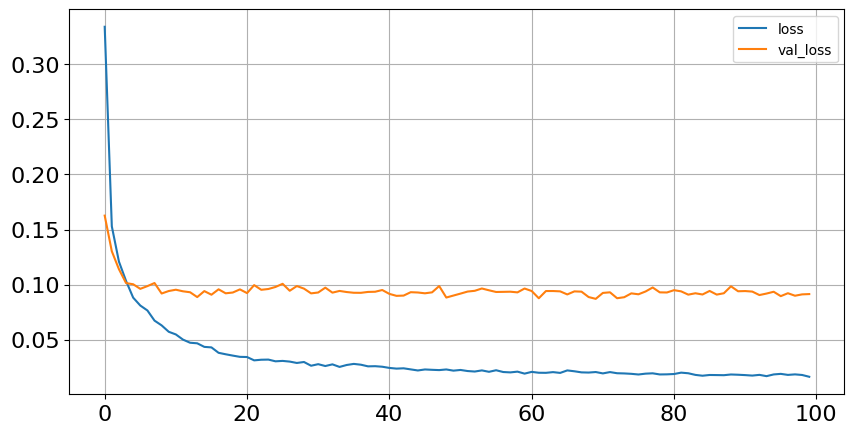

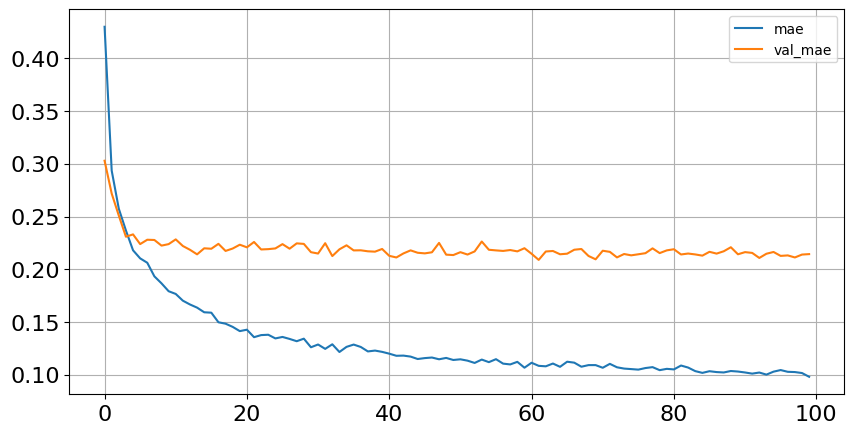

In [ ]:
y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred, y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'])
plot_history(h)

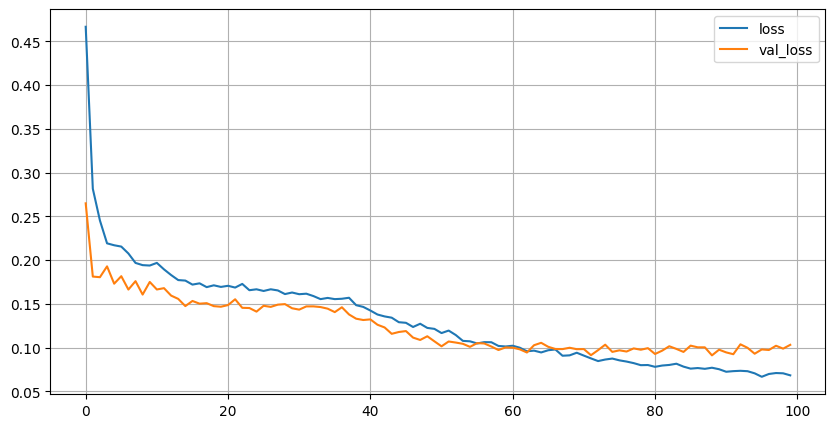

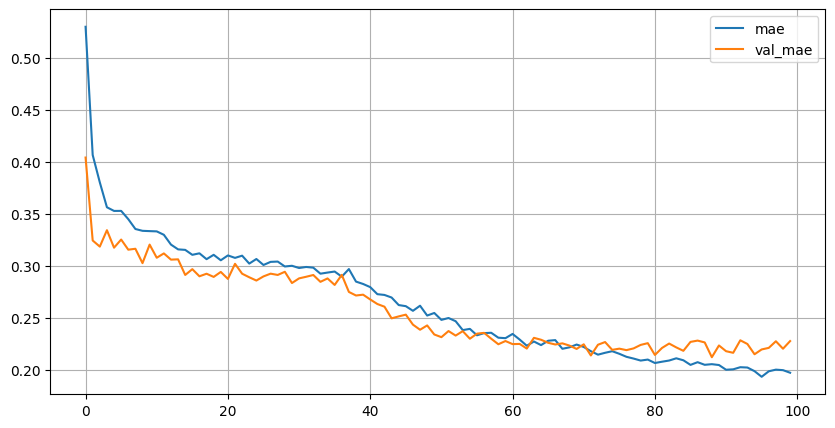

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='tanh'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='tanh'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

model.compile(loss='mse', metrics=['mae'], optimizer=Adam(learning_rate=1e-3))

h = model.fit(x_train_scaled, y_train_scaled, epochs=100, batch_size=64, validation_split=VAL_SPLIT, verbose=0)

plot_history(h)

In [ ]:
y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred, y_test, table_len=5, target_names=['tors', 'bend', 'f_tors', 'f_bend'])

10/10 [==============================] - 0s 5ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6600.5 : 5469.7 :2.21e-02:6.66e-02|  36.2  :  30.3  :1.54e-04:3.02e-04|  0.5%  :  0.6%  :  0.7%  :  0.5%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

### ChatGPT model

In [ ]:
model = Sequential([
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(4, activation='linear')
])

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

h = model.fit(x_train_scaled, y_train_scaled, epochs=50, batch_size=32, validation_split=VAL_SPLIT)

Epoch 1/50
46/46 [==============================] - 1s 6ms/step - loss: 0.9337 - mse: 0.9337 - val_loss: 0.8711 - val_mse: 0.8711
Epoch 2/50
46/46 [==============================] - 0s 3ms/step - loss: 0.6521 - mse: 0.6521 - val_loss: 0.5234 - val_mse: 0.5234
Epoch 3/50
46/46 [==============================] - 0s 3ms/step - loss: 0.3496 - mse: 0.3496 - val_loss: 0.2637 - val_mse: 0.2637
Epoch 4/50
46/46 [==============================] - 0s 3ms/step - loss: 0.2196 - mse: 0.2196 - val_loss: 0.2136 - val_mse: 0.2136
Epoch 5/50
46/46 [==============================] - 0s 2ms/step - loss: 0.1831 - mse: 0.1831 - val_loss: 0.1857 - val_mse: 0.1857
Epoch 6/50
46/46 [==============================] - 0s 2ms/step - loss: 0.1642 - mse: 0.1642 - val_loss: 0.1694 - val_mse: 0.1694
Epoch 7/50
46/46 [==============================] - 0s 2ms/step - loss: 0.1490 - mse: 0.1490 - val_loss: 0.1590 - val_mse: 0.1590
Epoch 8/50
46/46 [==============================] - 0s 2ms/step - loss: 0.1386 - mse: 0.13

10/10 [==============================] - 0s 1ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6677.3 : 5704.5 :2.20e-02:6.66e-02|  40.6  : 204.5  :2.73e-04:3.54e-04|  0.6%  :  3.7%  :  1.2%  :  0.5%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

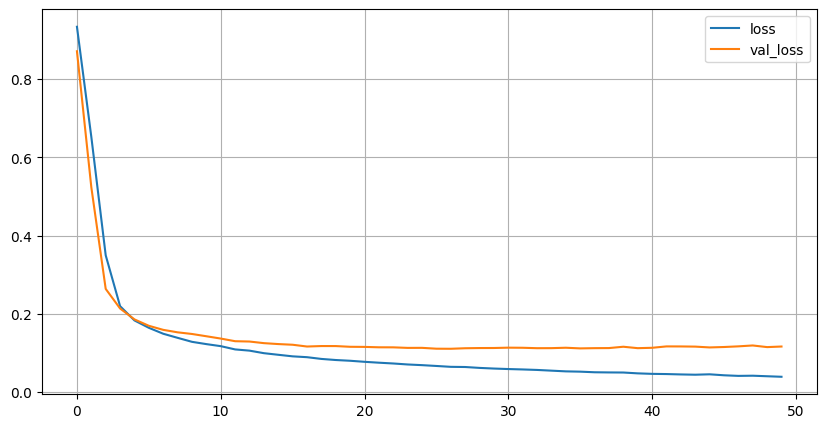

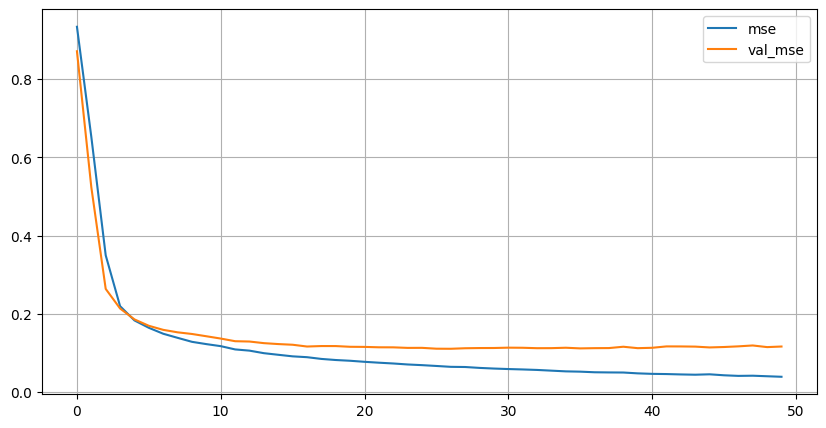

In [ ]:
y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred, y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'])
plot_history(h)

### Hyperparameters tuning

По предварительным тестам relu сходится за 20 эпох, tanh за ~100. Делаем вывод што tanh это фигня. Из активационных функций оставляем relu.

batch_size и количество эпох не должно качественно сказываться на результатах, только на скорости обучения, поэтому их фиксирую и буду варьировать только слои

На глобальном исследовании параметров используем супер подход в виде проверки моих гипотез. Семплирование по методике выбора красивых комбинаций чисел

In [ ]:
layers_list = [[32, 32],     [32, 32, 32],       [32, 16, 8],
               [64, 64],     [64, 64, 64],       [64, 32, 16],
               [128, 128],   [128, 128, 128],    [128, 64, 32],
               [256, 256],   [256, 256, 256],    [256, 128, 64],
               [512, 512],   [512, 512, 512],    [512, 256, 128],
               [1024, 1024], [1024, 1024, 1024], [1024, 512, 256]]

epochs = 20
batch_size = 32

In [ ]:
def create_ffn(layers):
  model = Sequential()
  for i, layer in enumerate(layers):
    if i < len(layers) - 1:
      model.add(Dense(layer, activation='relu'))
    else:
      model.add(Dense(4, activation='linear'))
  model.compile(loss='mse', metrics=['mae'], optimizer=Adam(learning_rate=1e-2))
  return model



ITERATION: 0, MODEL: ffn_32x32



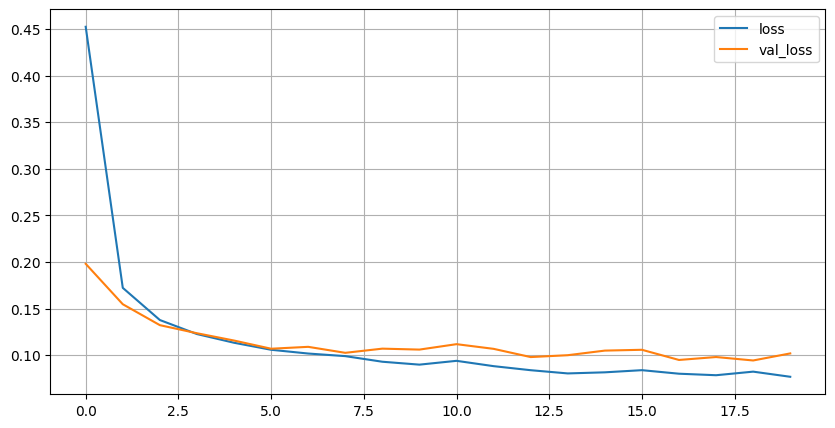

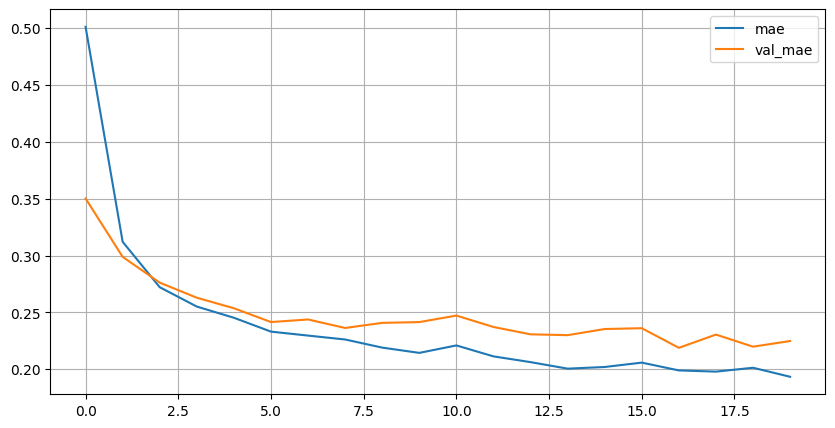

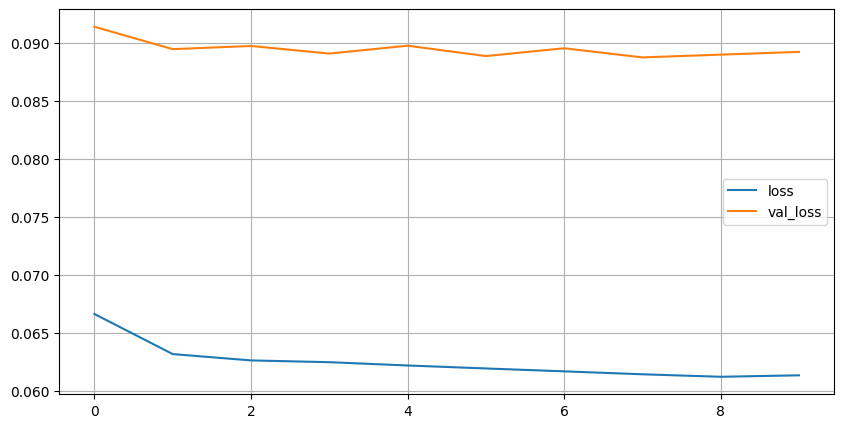

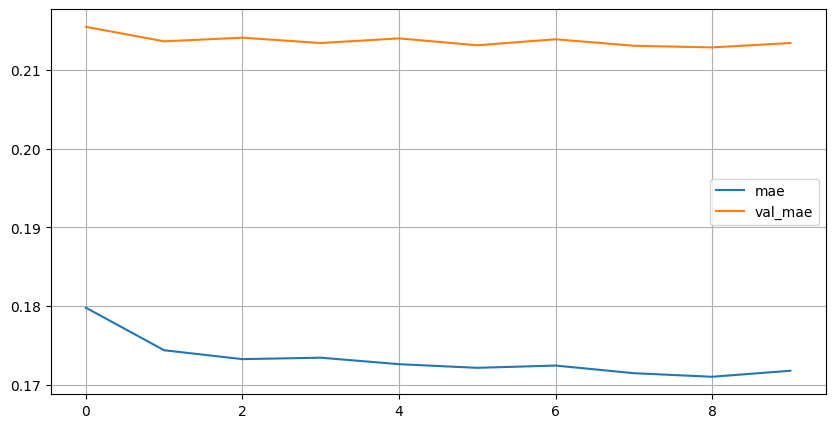

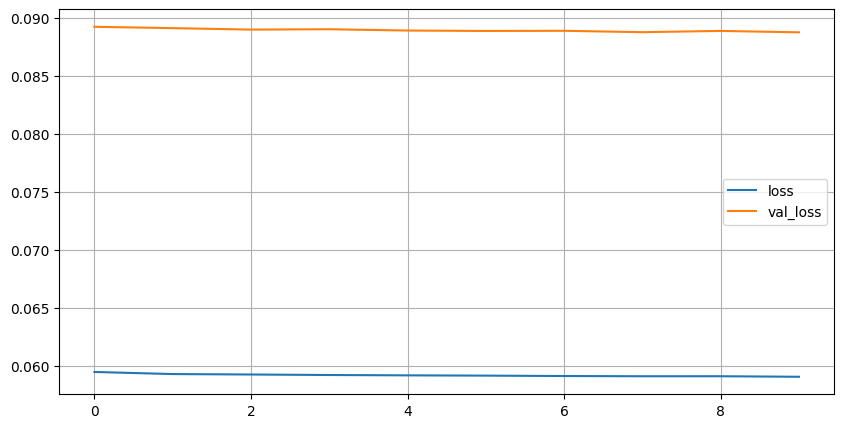

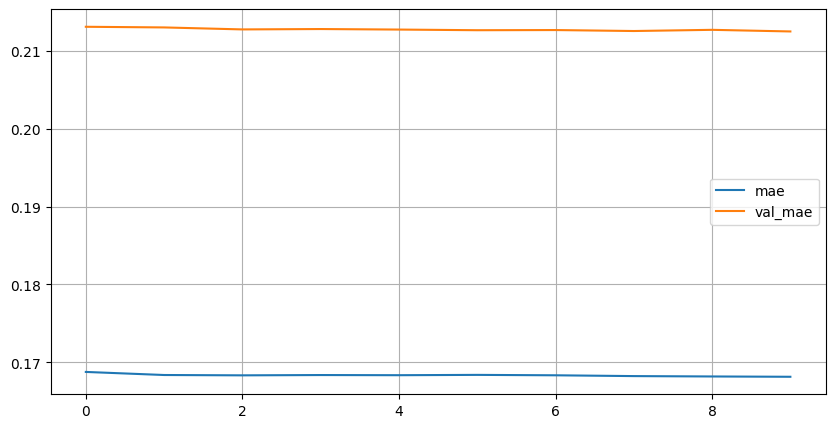

10/10 [==============================] - 0s 1ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6590.0 : 5590.9 :2.22e-02:6.71e-02|  46.8  :  90.9  :5.70e-05:8.33e-04|  0.7%  :  1.7%  :  0.3%  :  1.3%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

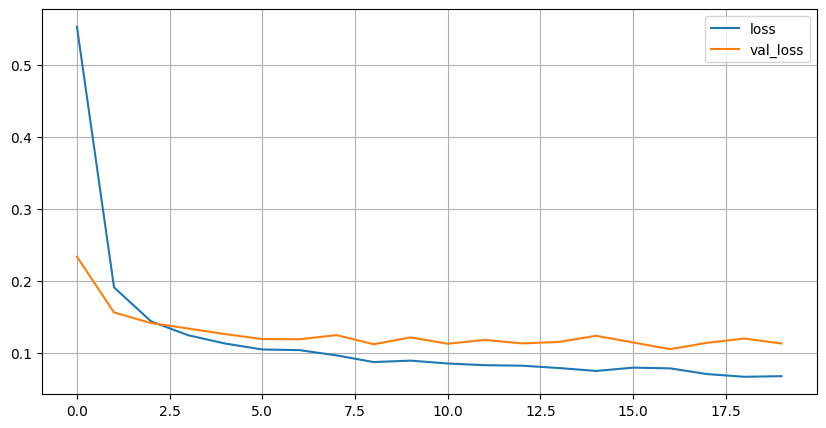

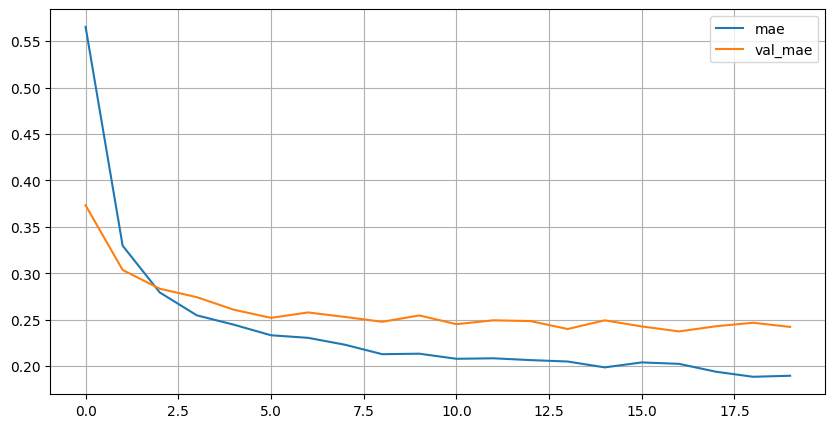

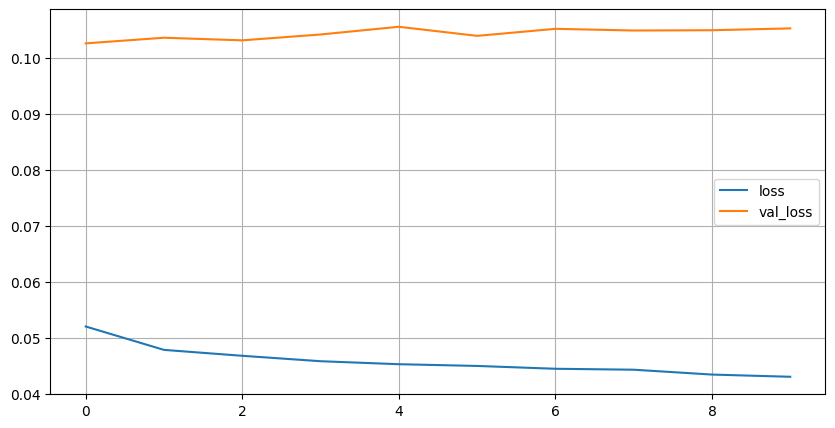

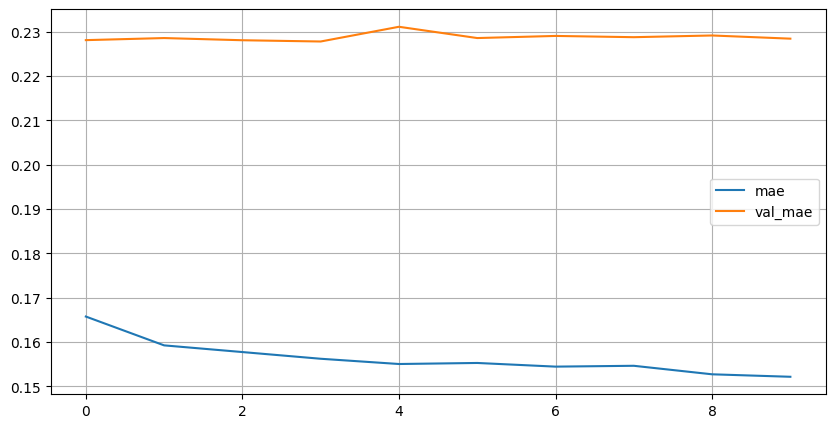

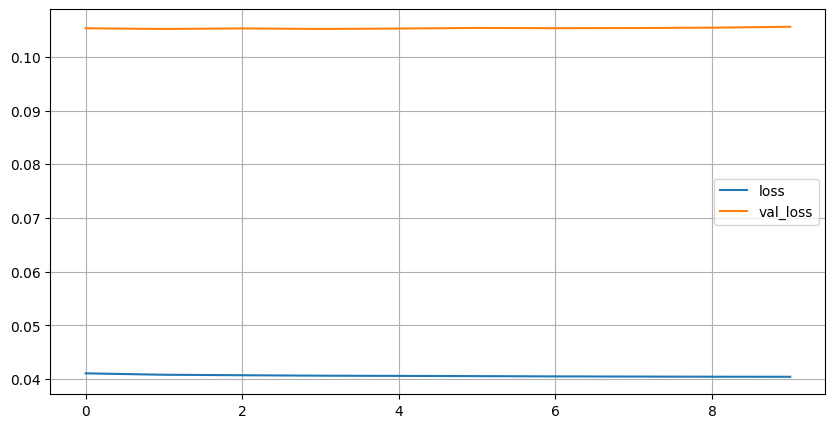

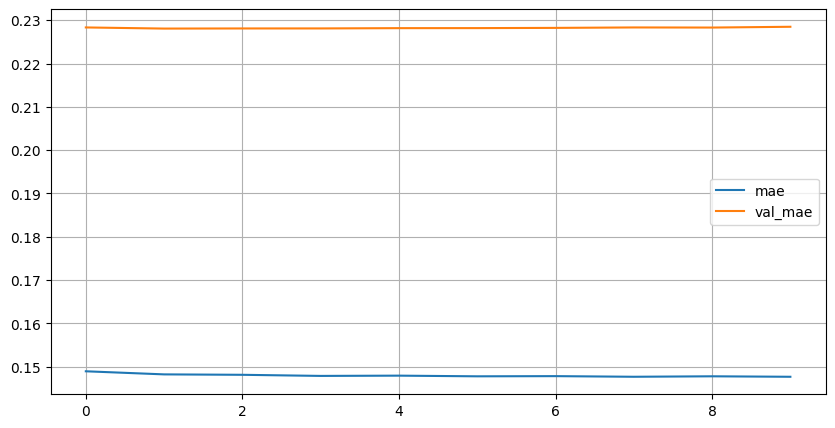

10/10 [==============================] - 0s 1ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6689.0 : 5561.2 :2.21e-02:6.52e-02|  52.3  :  61.2  :1.89e-04:1.03e-03|  0.8%  :  1.1%  :  0.8%  :  1.6%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

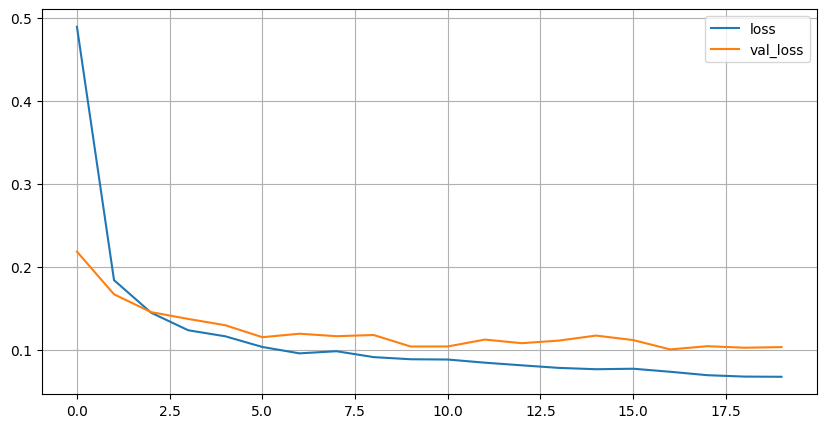

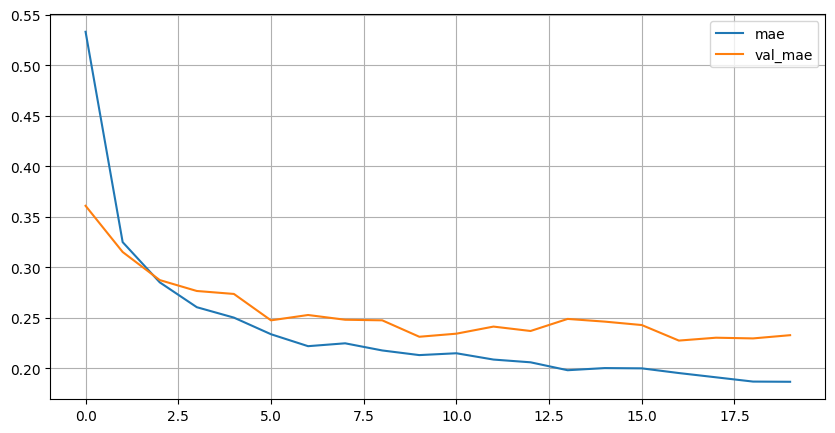

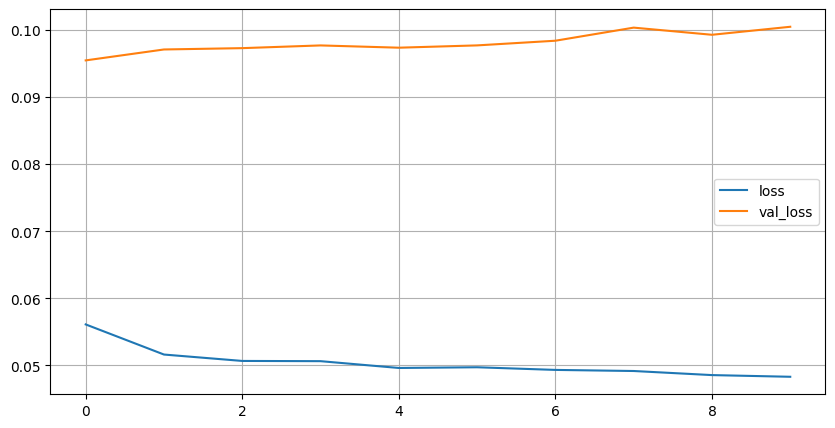

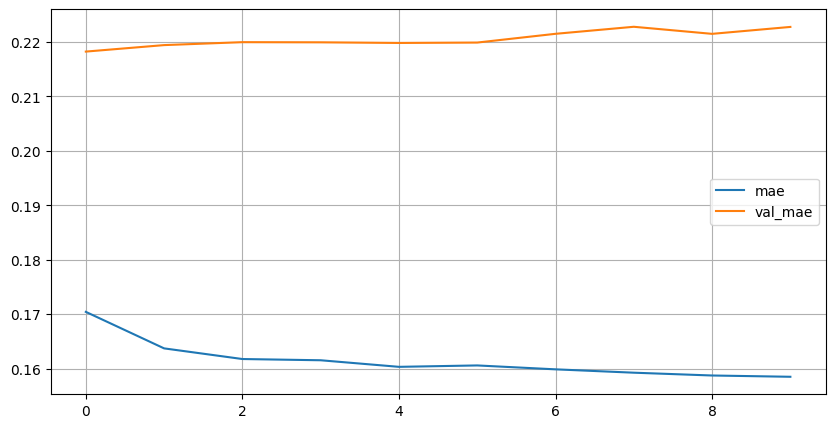

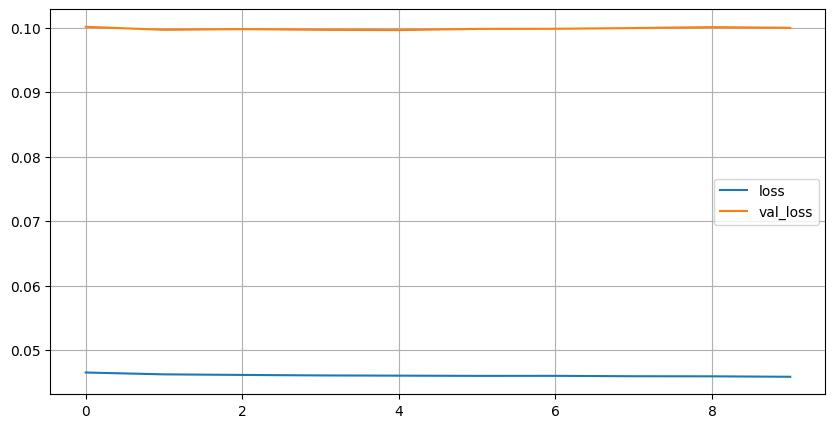

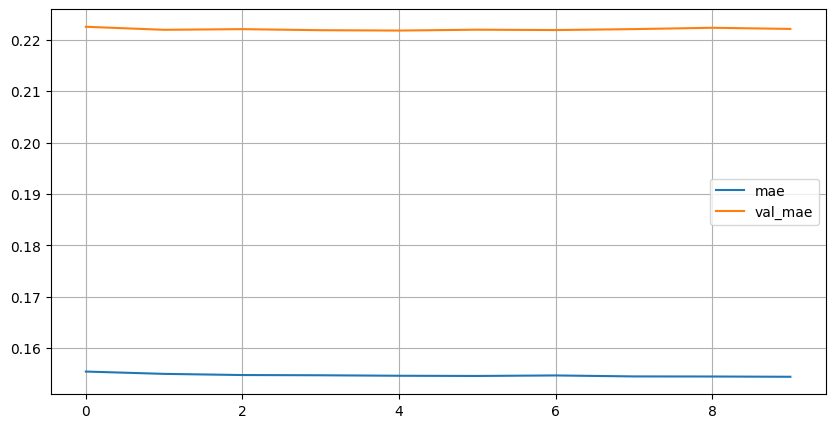

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6722.8 : 5715.4 :2.22e-02:6.56e-02|  86.0  : 215.4  :7.86e-05:6.49e-04|  1.3%  :  3.9%  :  0.4%  :  1.0%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

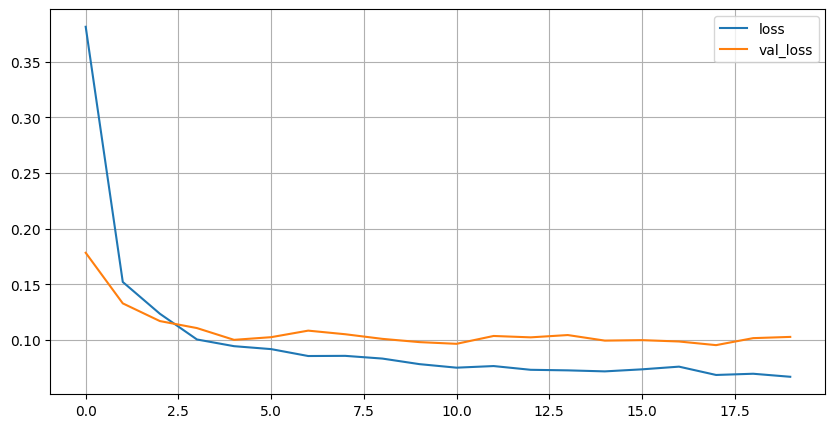

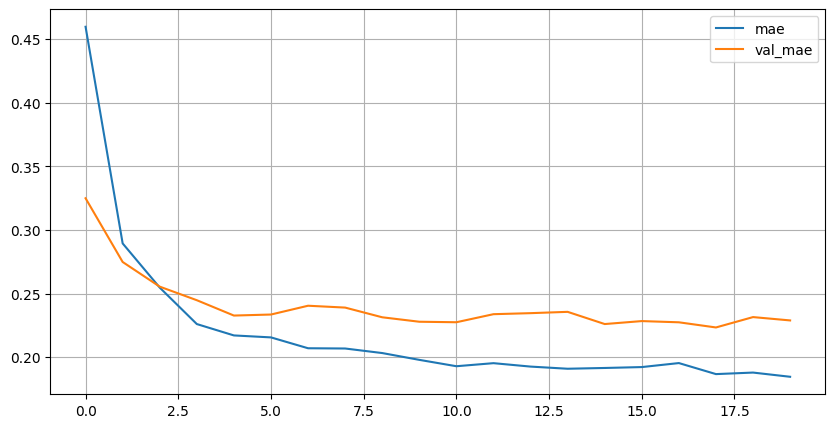

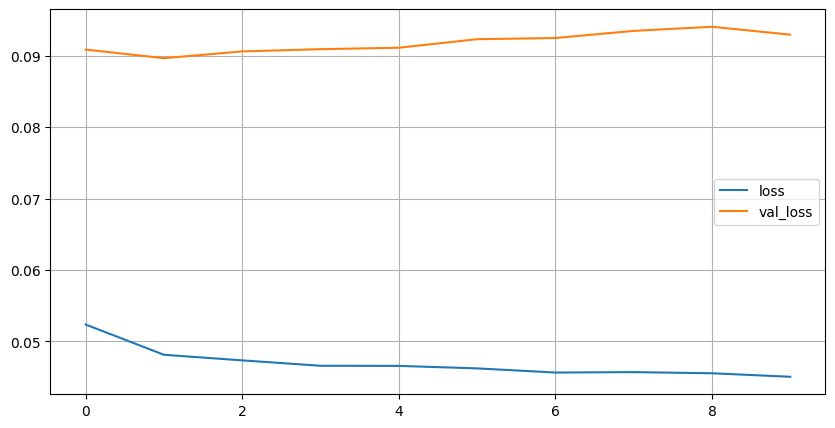

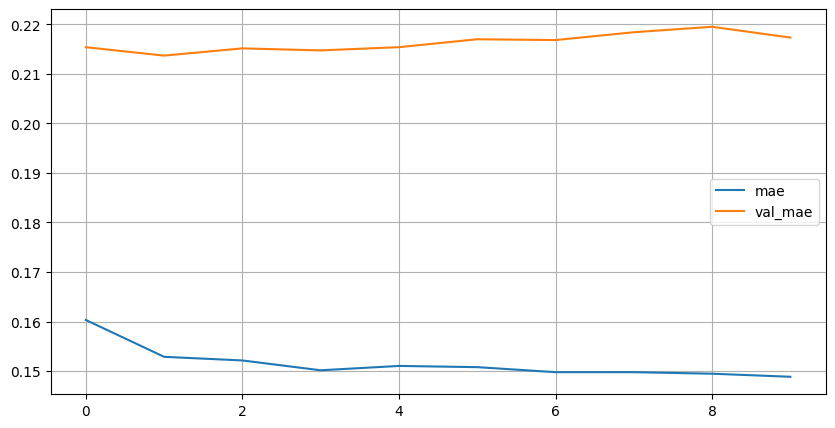

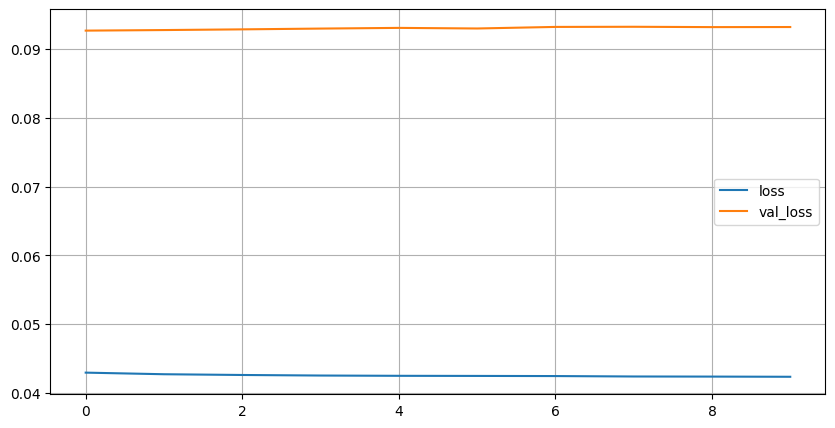

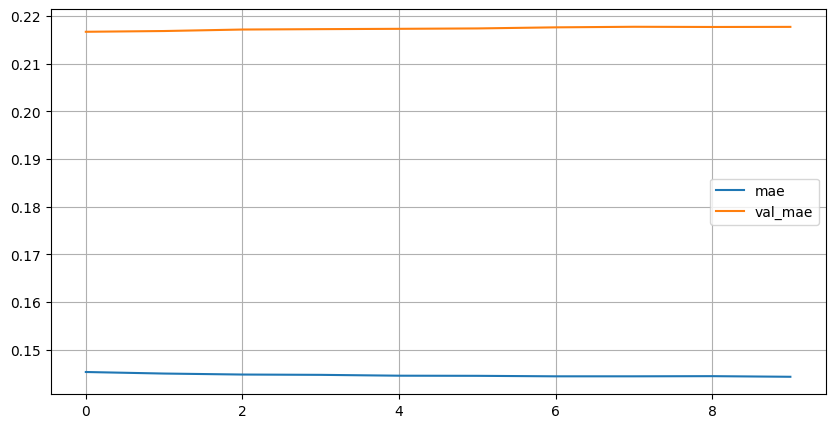

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6543.2 : 5531.3 :2.20e-02:6.64e-02|  93.5  :  31.3  :2.65e-04:1.20e-04|  1.4%  :  0.6%  :  1.2%  :  0.2%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

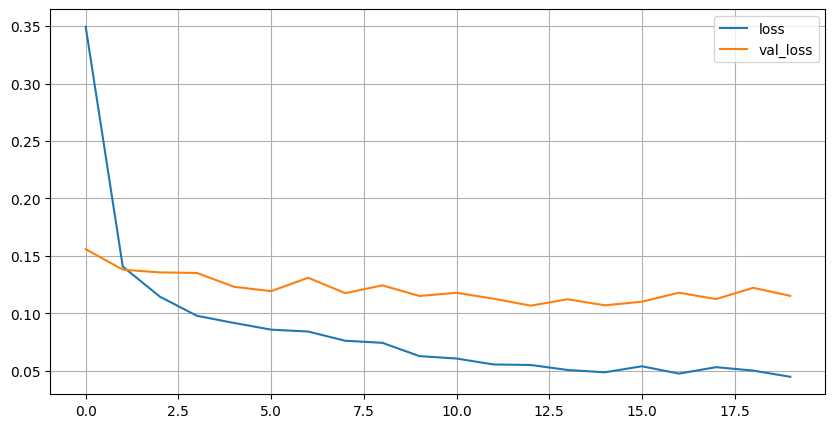

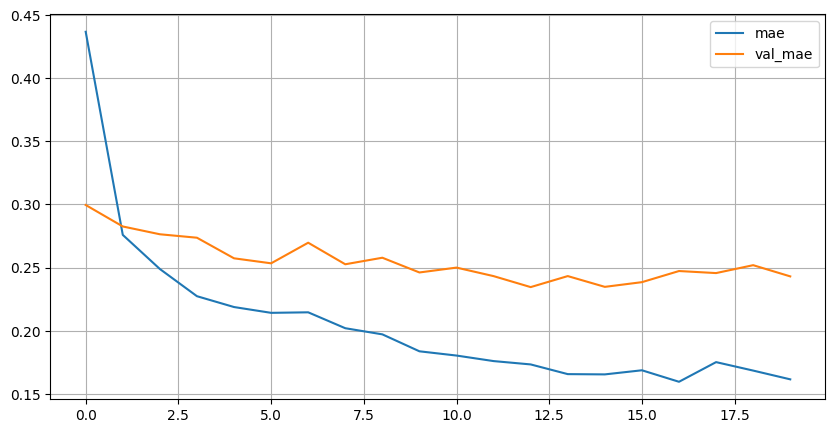

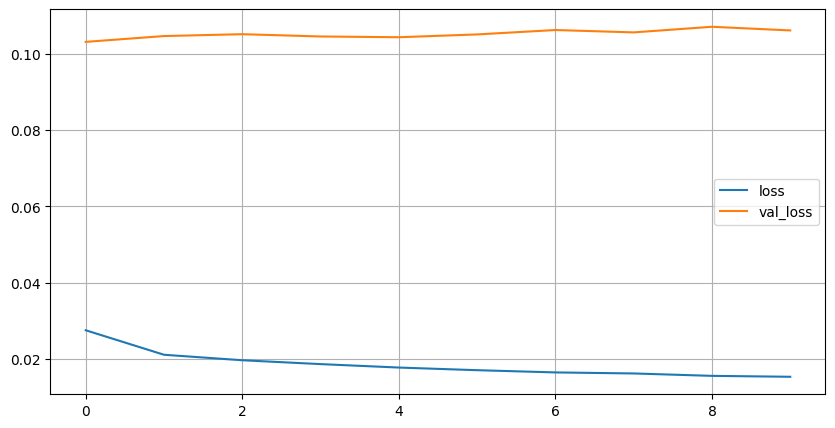

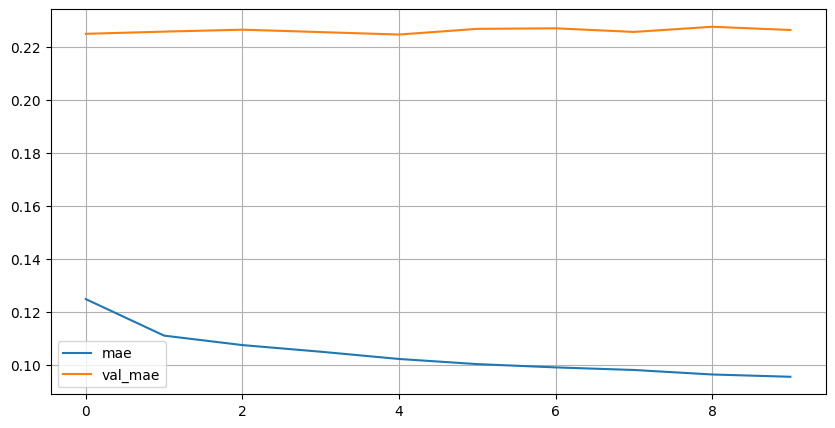

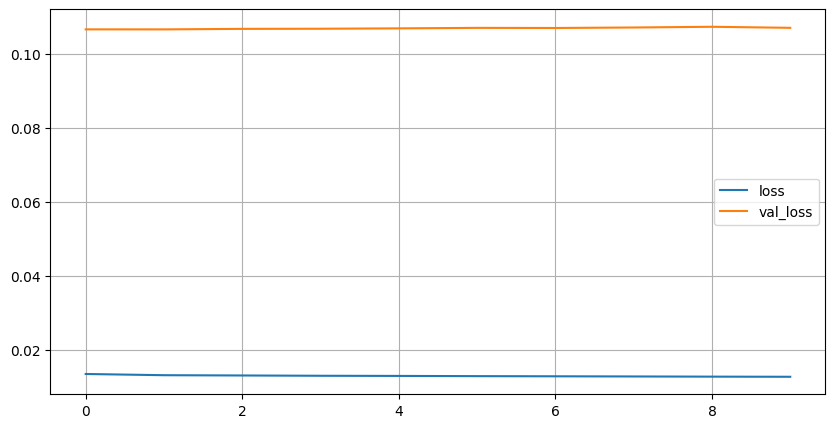

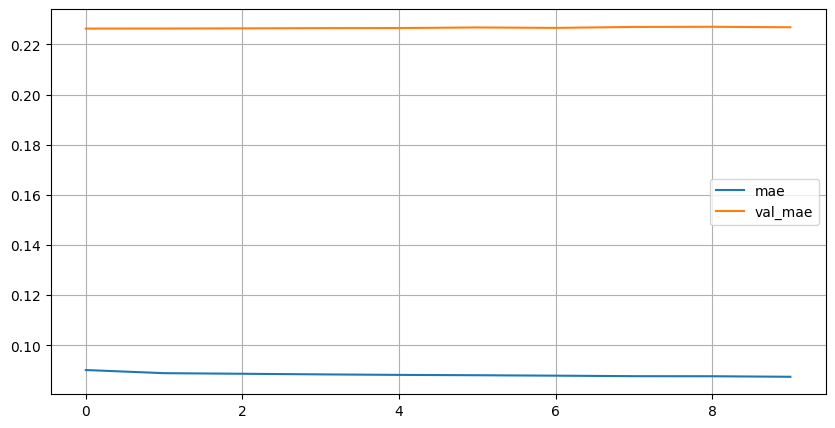

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6557.9 : 5404.4 :2.20e-02:6.45e-02|  78.8  :  95.6  :3.33e-04:1.79e-03|  1.2%  :  1.7%  :  1.5%  :  2.7%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

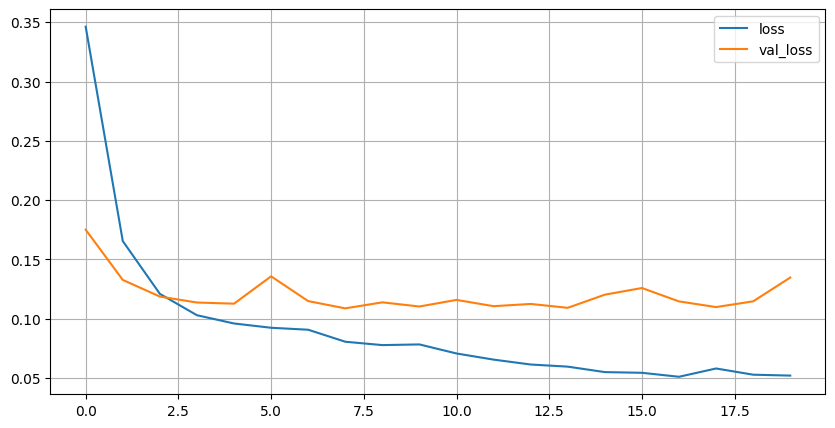

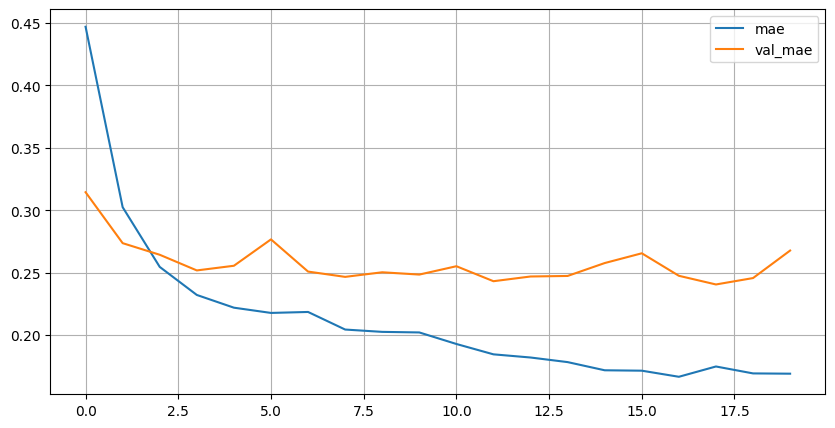

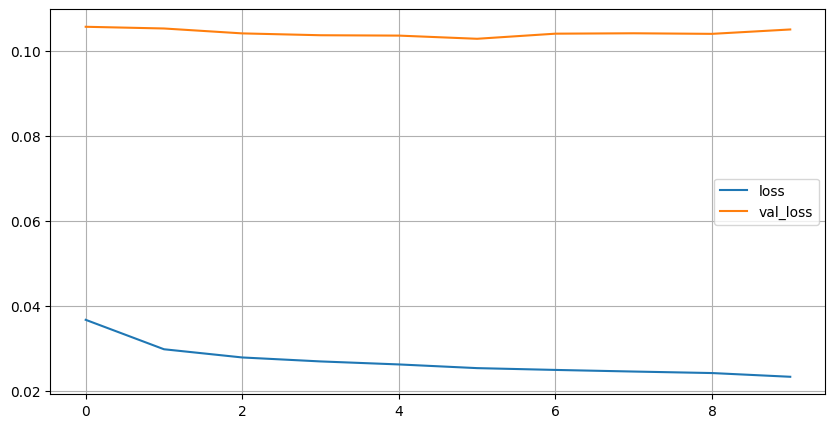

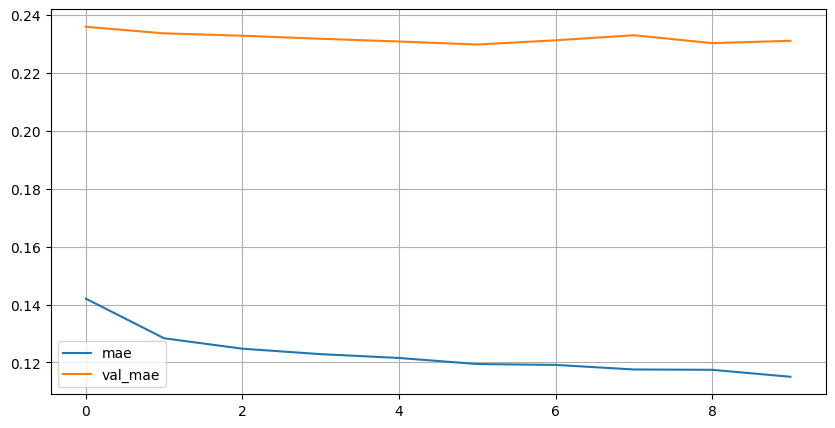

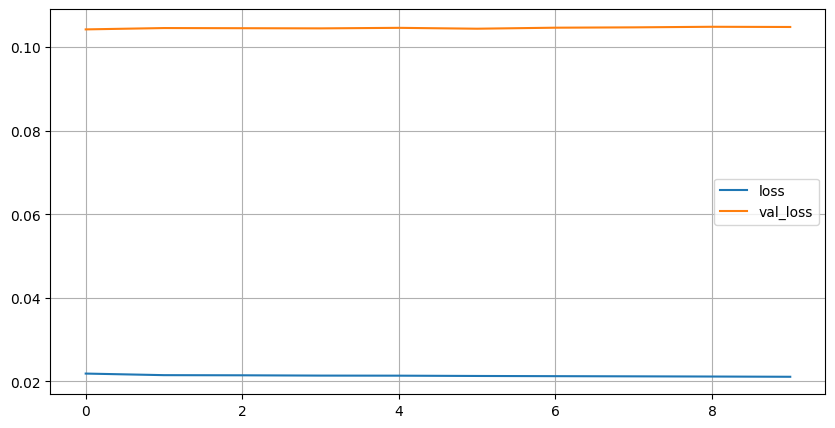

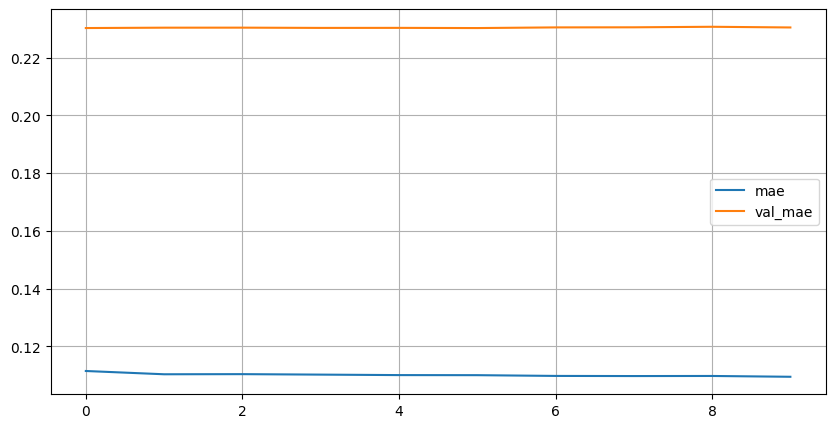

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6644.4 : 5598.8 :2.21e-02:6.49e-02|  7.7   :  98.8  :1.66e-04:1.40e-03|  0.1%  :  1.8%  :  0.7%  :  2.1%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

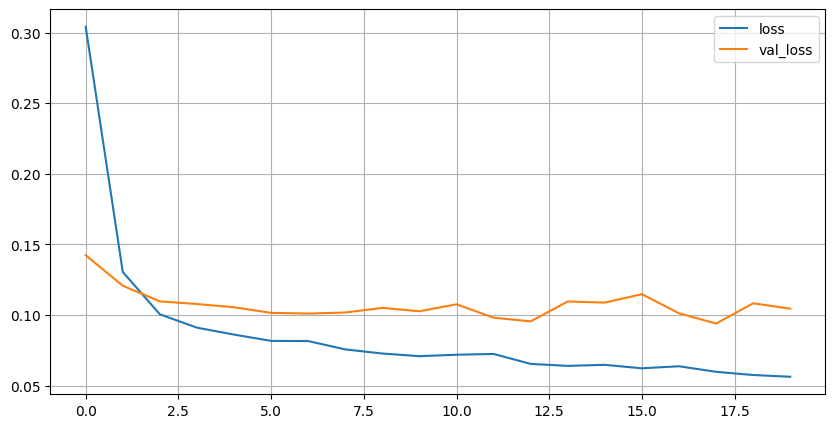

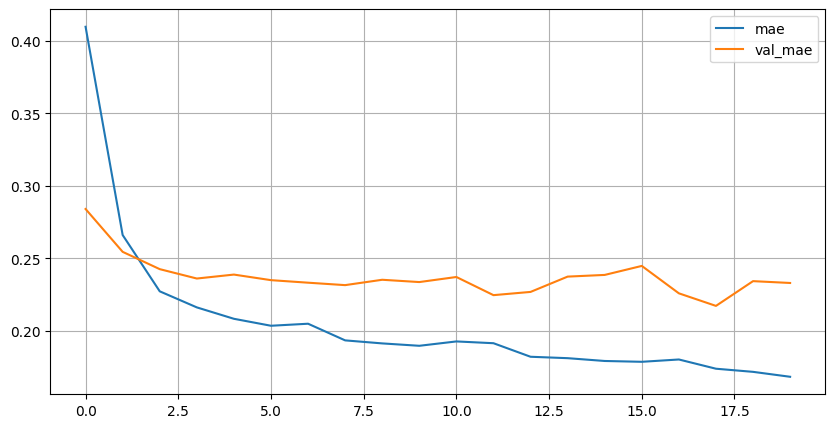

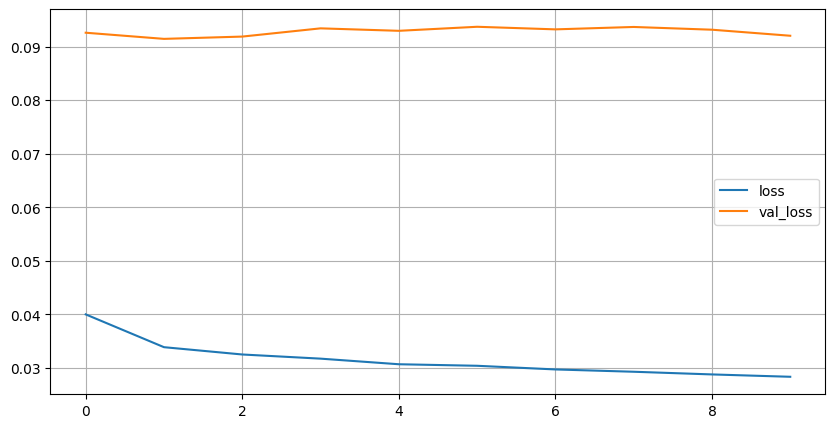

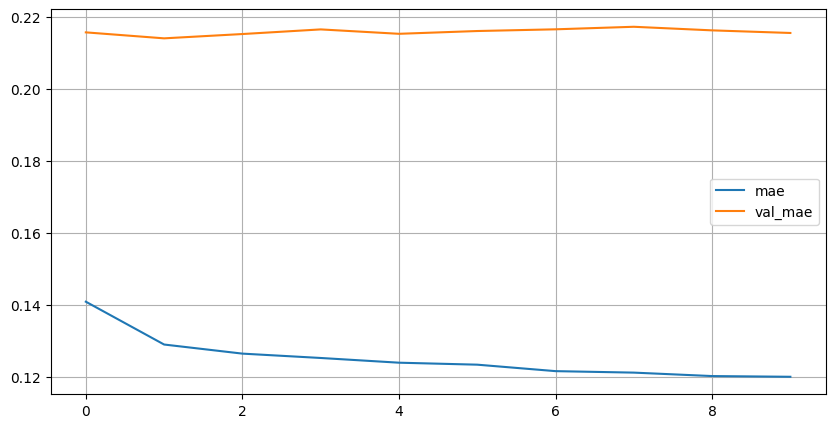

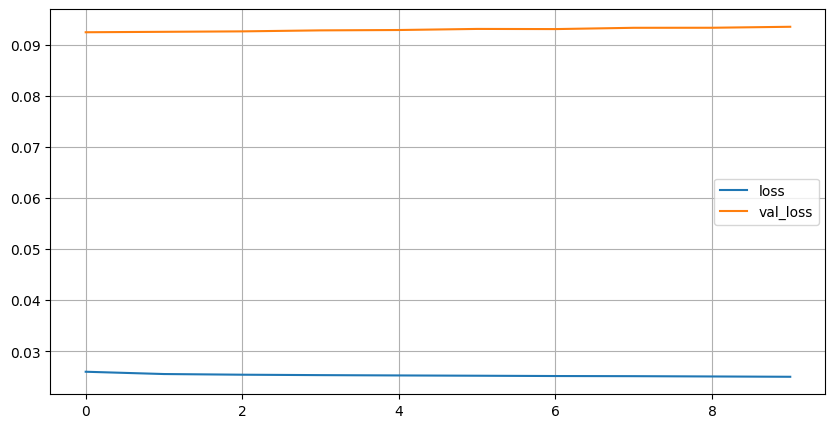

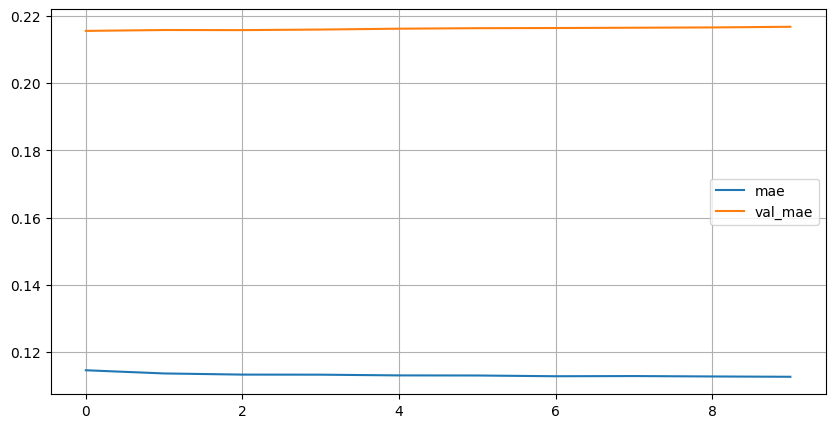

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6728.9 : 5557.2 :2.23e-02:6.63e-02|  92.2  :  57.2  :1.77e-05:6.87e-05|  1.4%  :  1.0%  :  0.1%  :  0.1%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

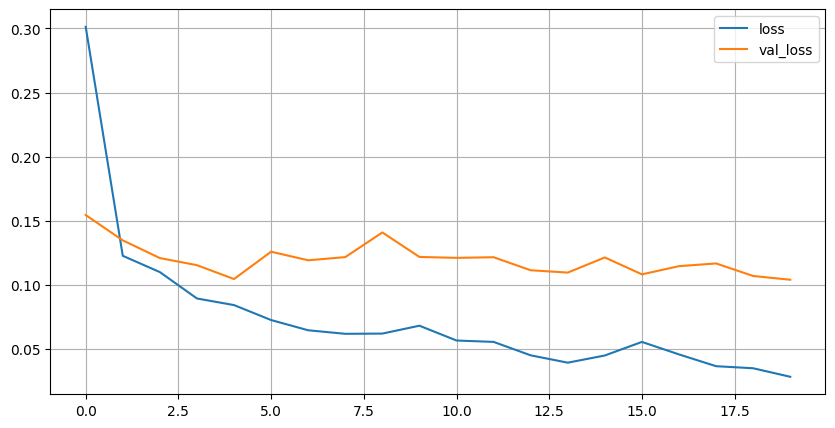

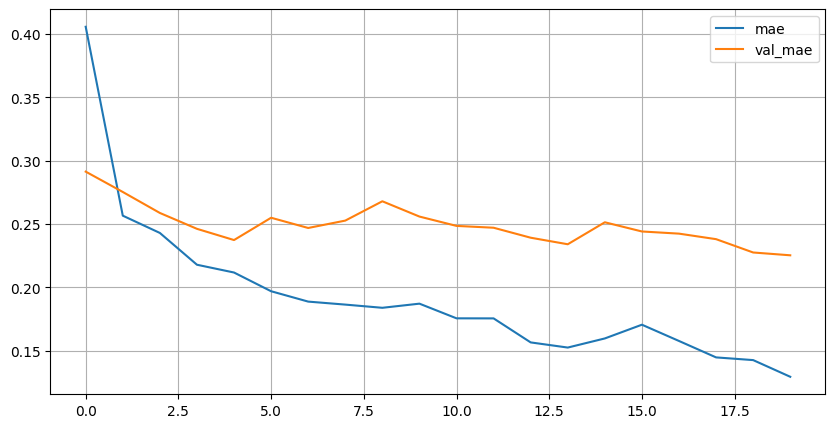

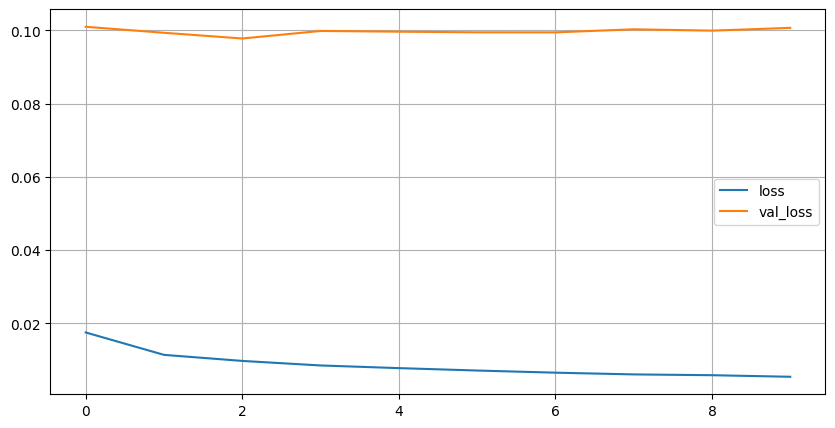

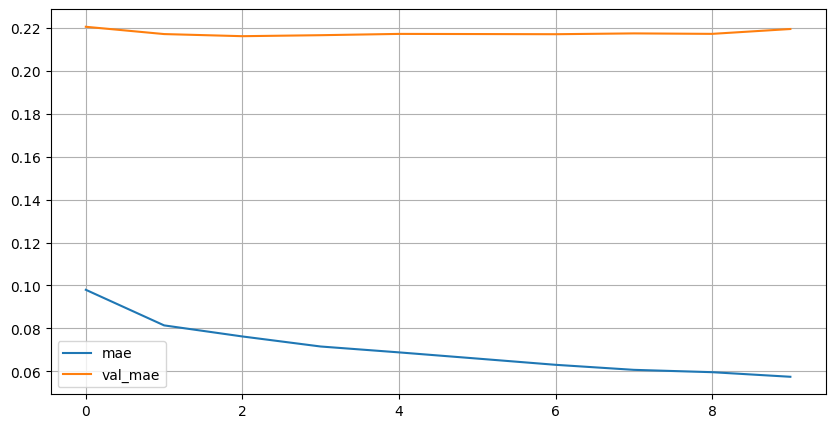

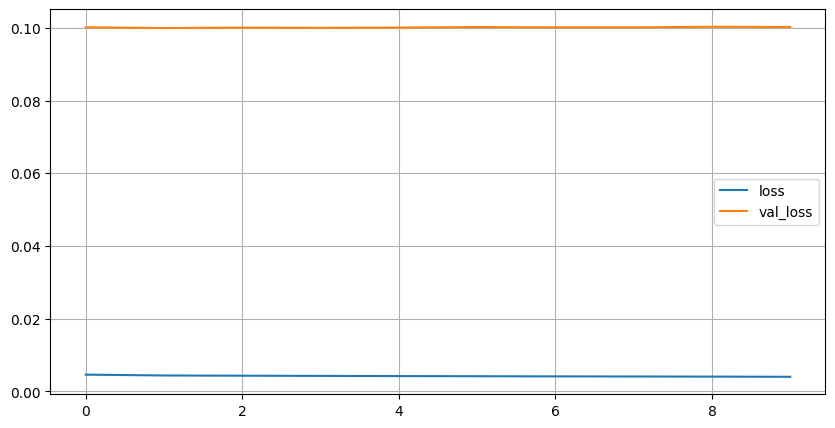

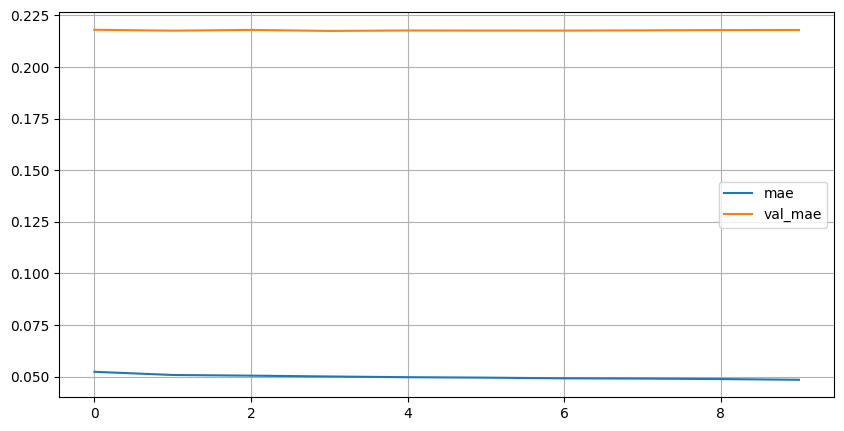

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6587.8 : 5390.1 :2.21e-02:6.59e-02|  48.9  : 109.9  :1.87e-04:3.30e-04|  0.7%  :  2.0%  :  0.8%  :  0.5%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

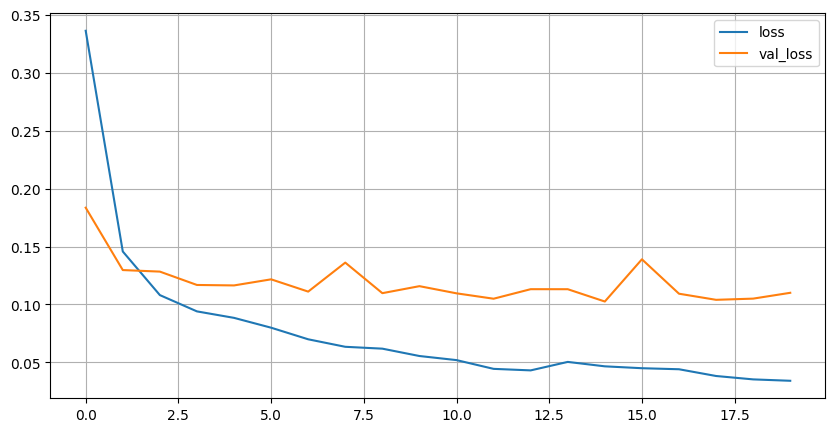

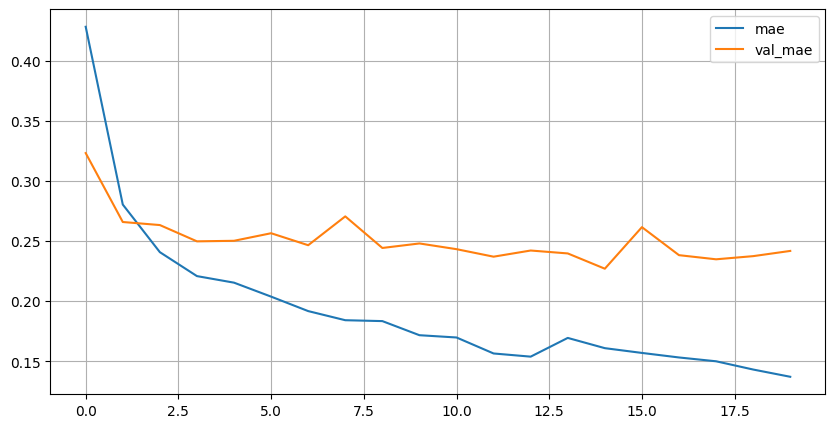

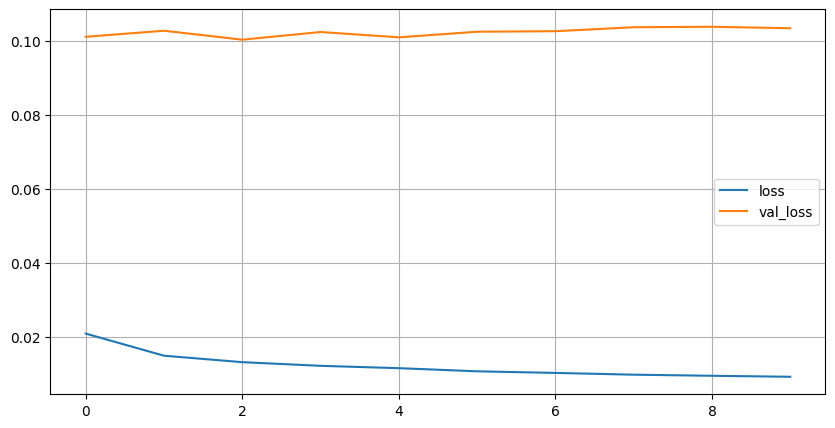

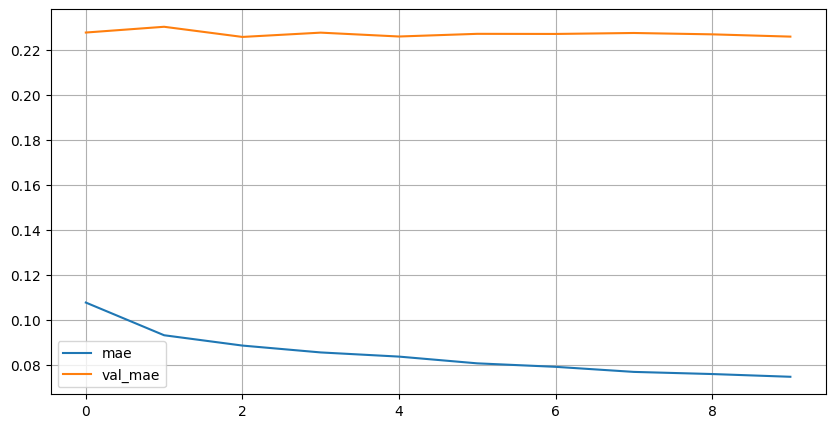

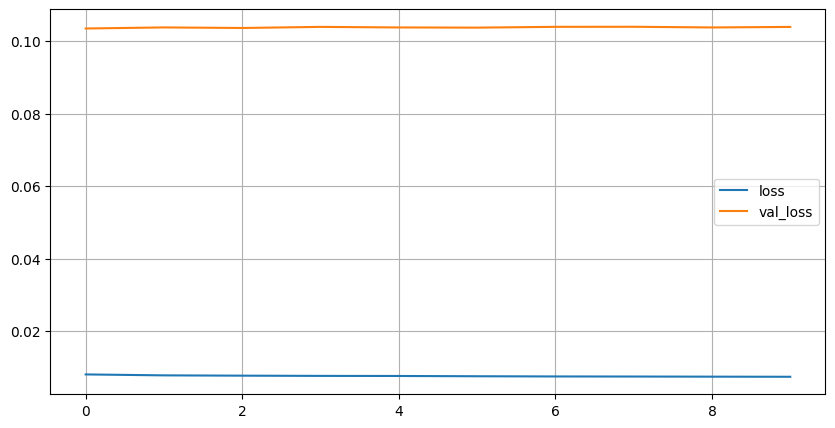

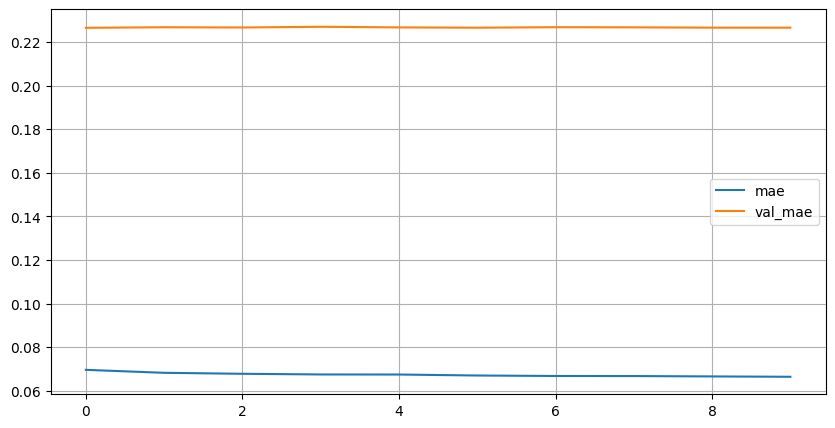

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6698.5 : 5616.7 :2.20e-02:6.62e-02|  61.8  : 116.7  :2.94e-04:1.03e-04|  0.9%  :  2.1%  :  1.3%  :  0.2%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

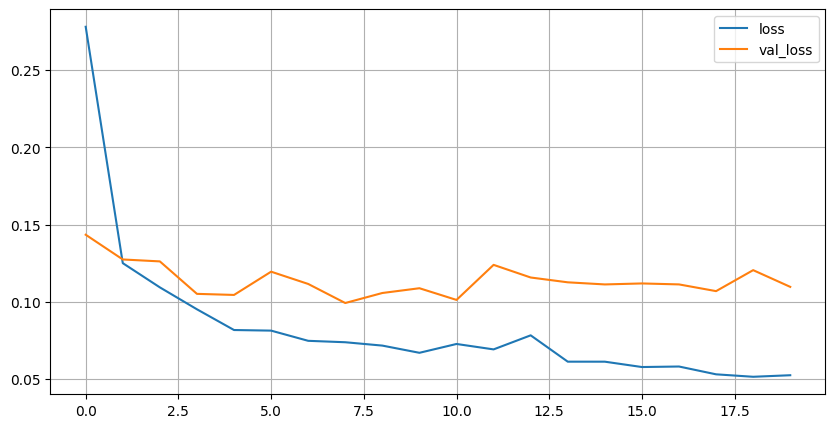

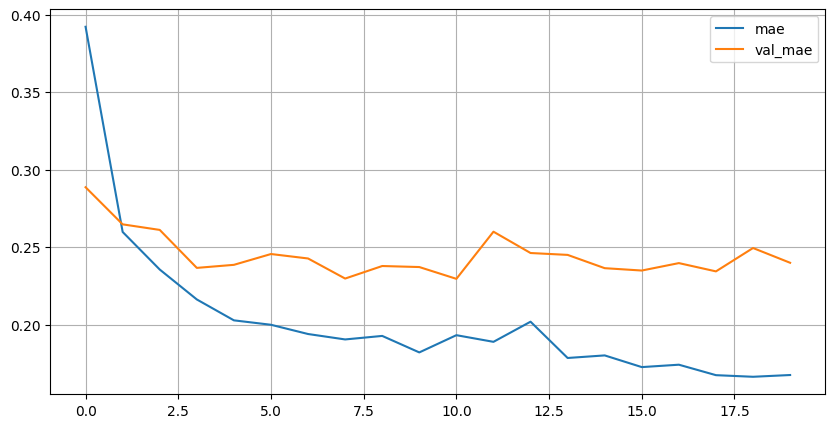

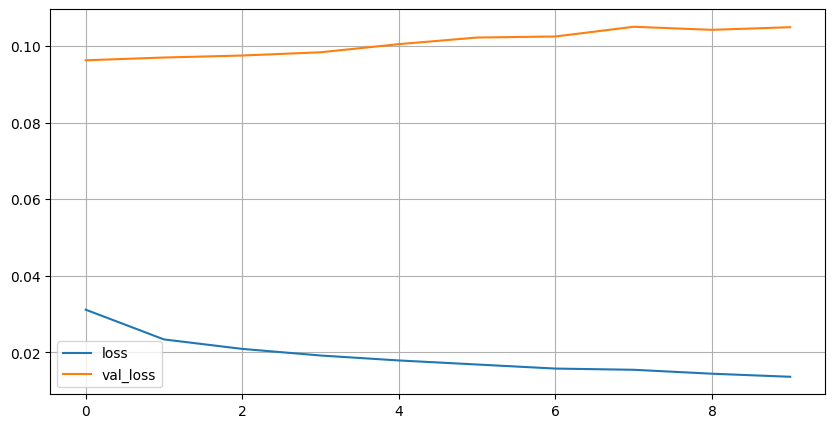

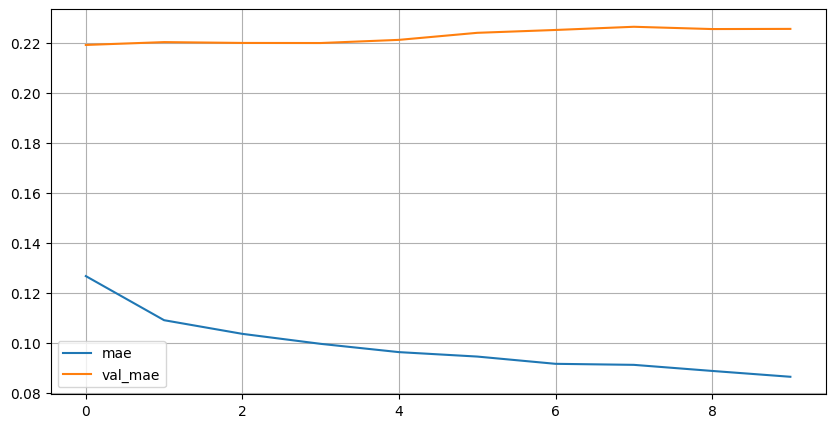

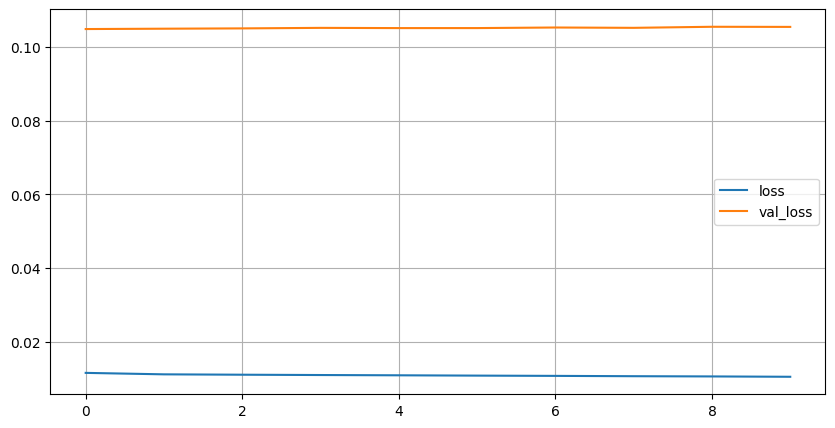

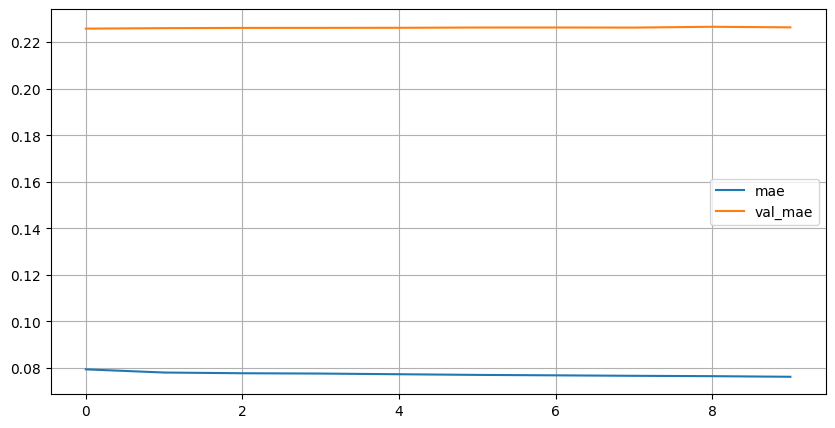

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6565.2 : 5522.8 :2.21e-02:6.58e-02|  71.5  :  22.8  :1.75e-04:4.76e-04|  1.1%  :  0.4%  :  0.8%  :  0.7%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

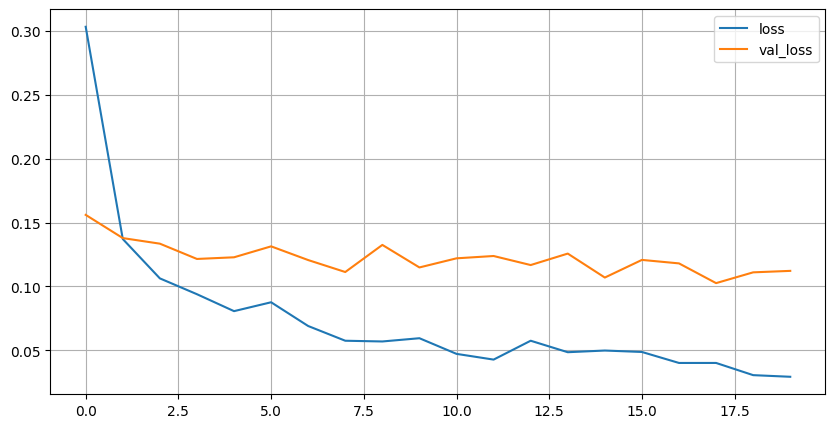

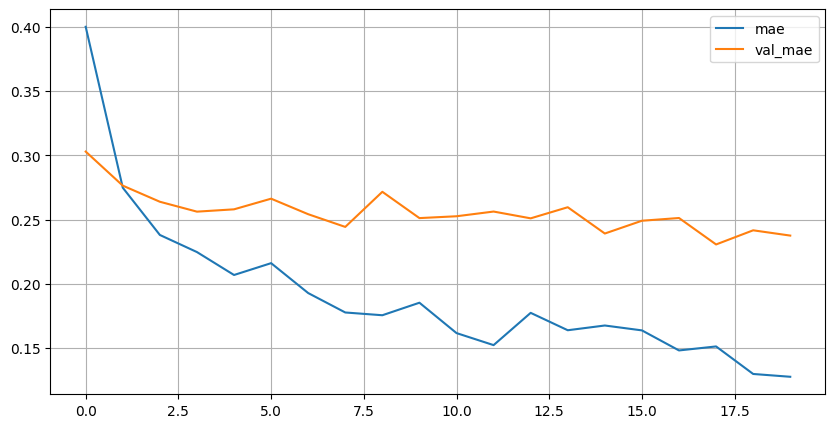

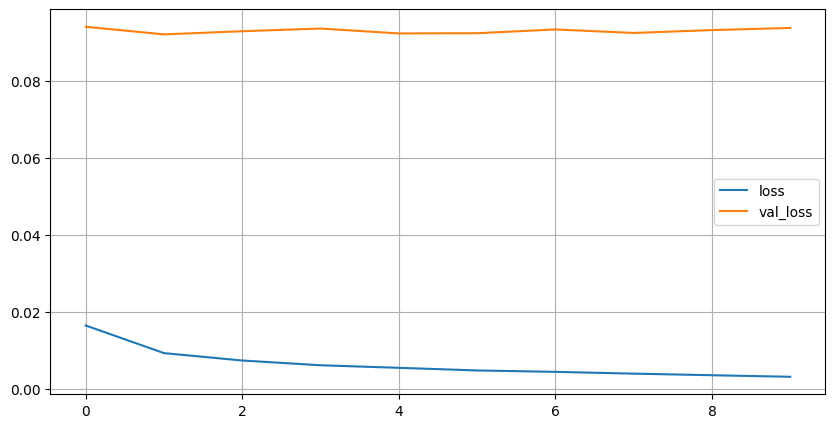

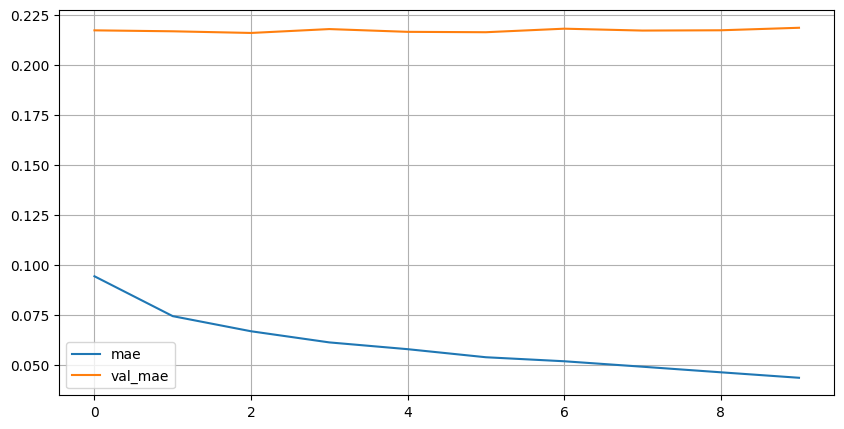

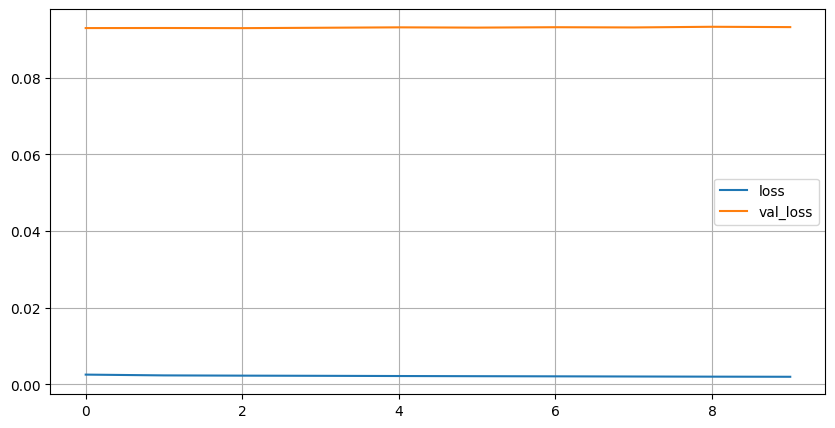

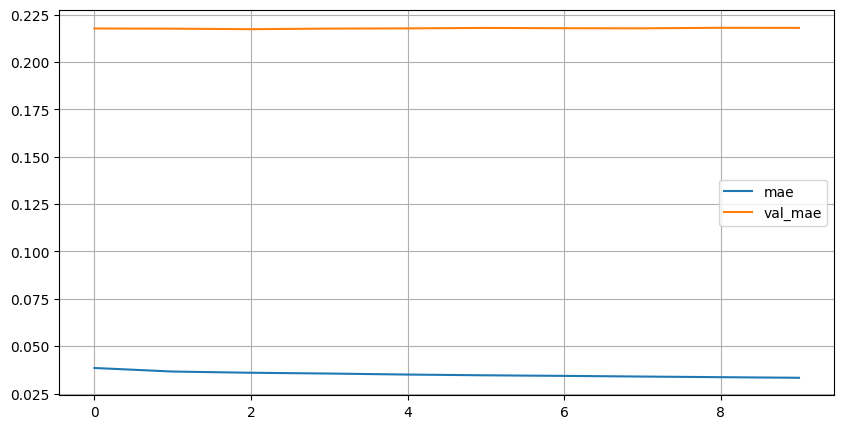

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6654.8 : 5487.7 :2.22e-02:6.76e-02|  18.1  :  12.2  :1.32e-04:1.35e-03|  0.3%  :  0.2%  :  0.6%  :  2.0%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

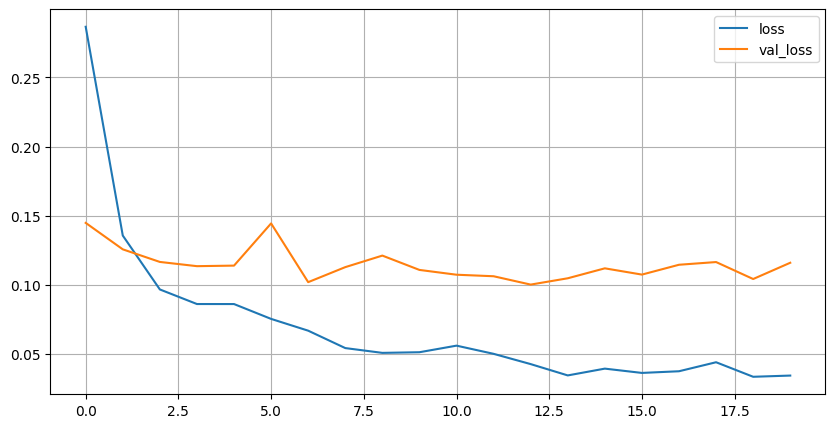

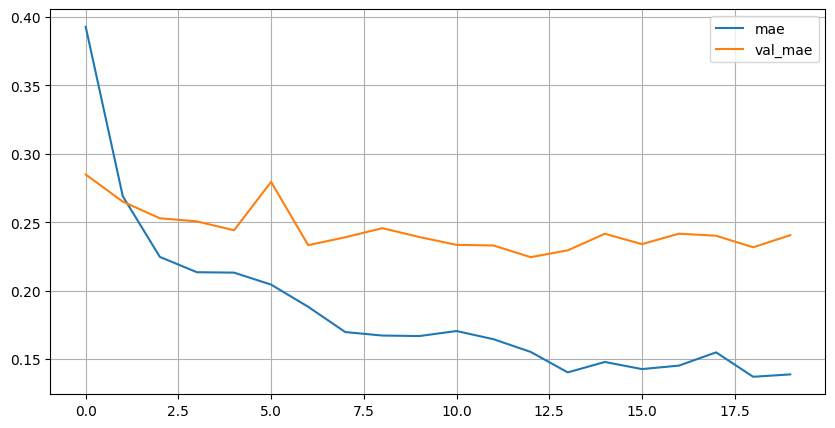

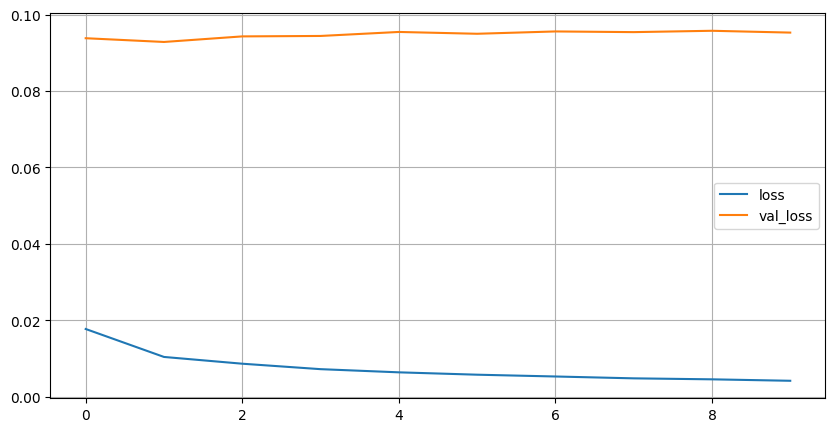

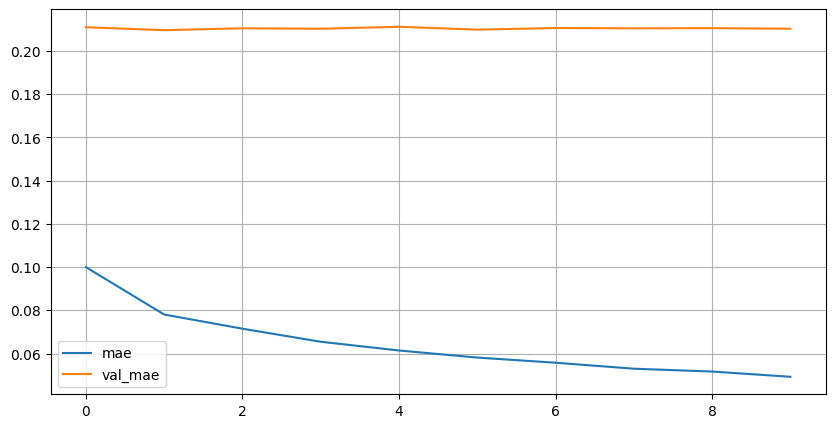

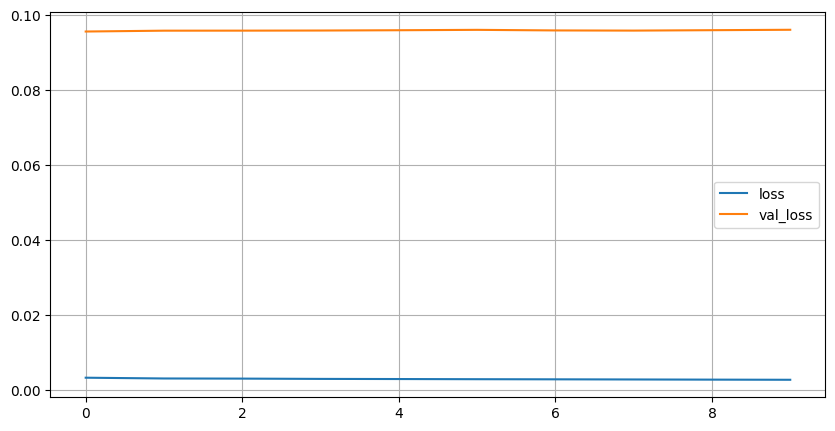

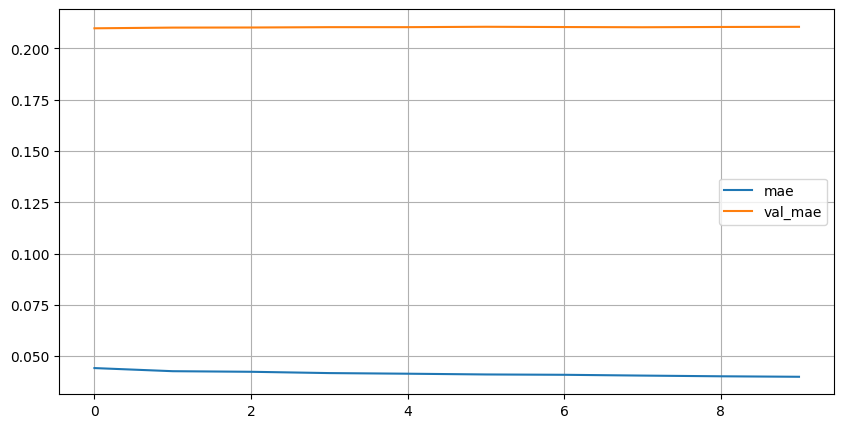

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6698.4 : 5415.2 :2.22e-02:6.64e-02|  61.7  :  84.8  :8.24e-05:9.46e-05|  0.9%  :  1.5%  :  0.4%  :  0.1%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

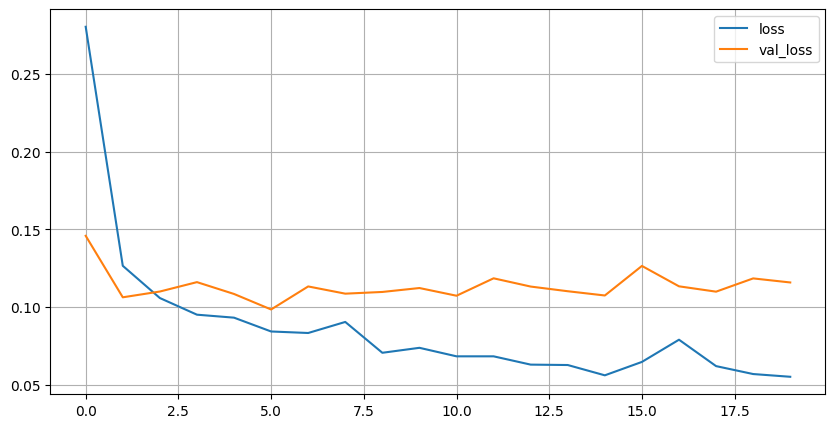

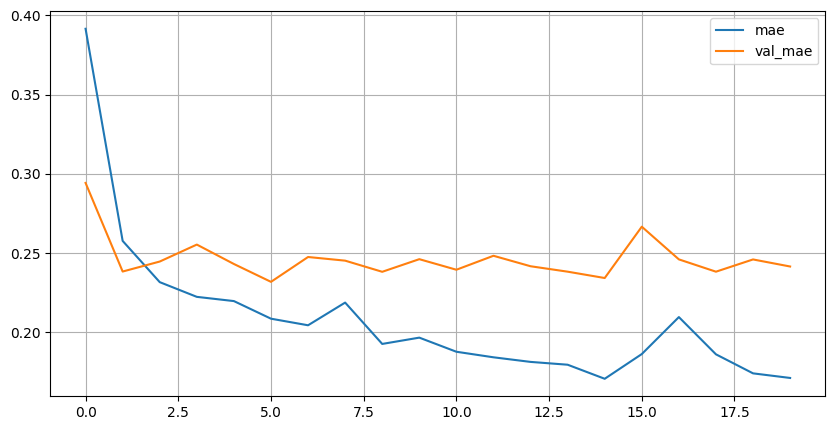

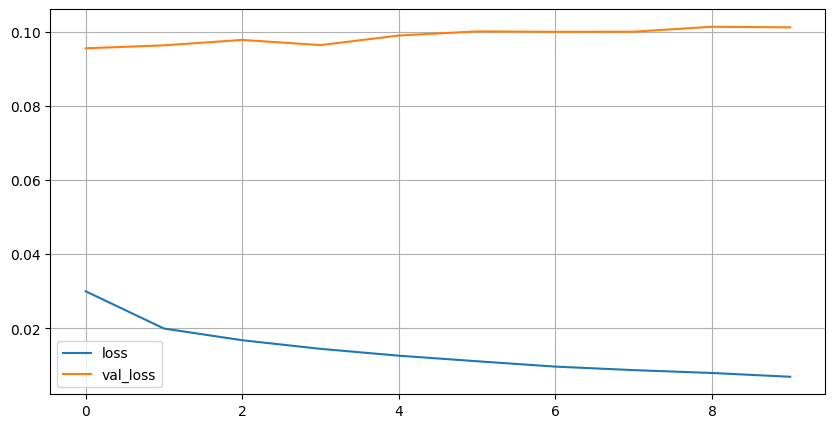

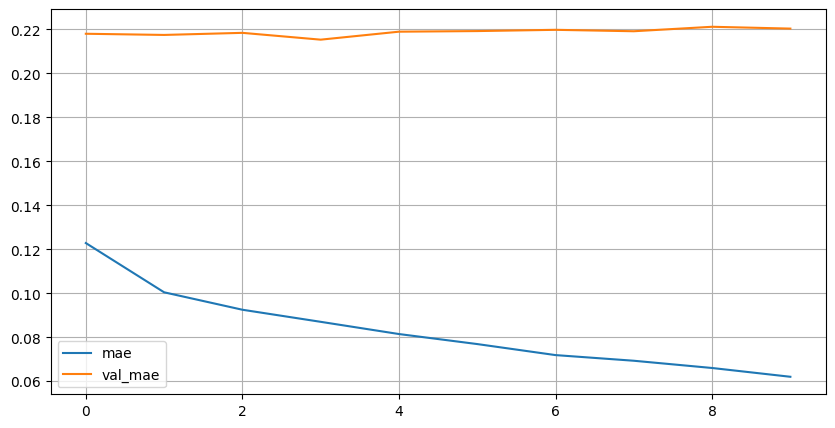

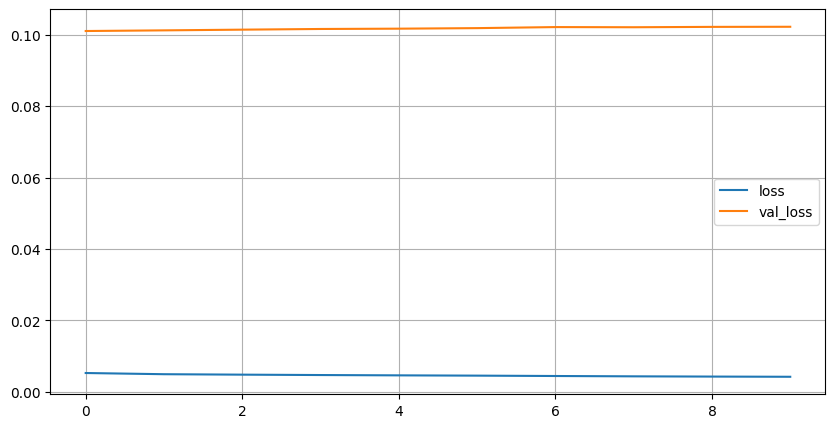

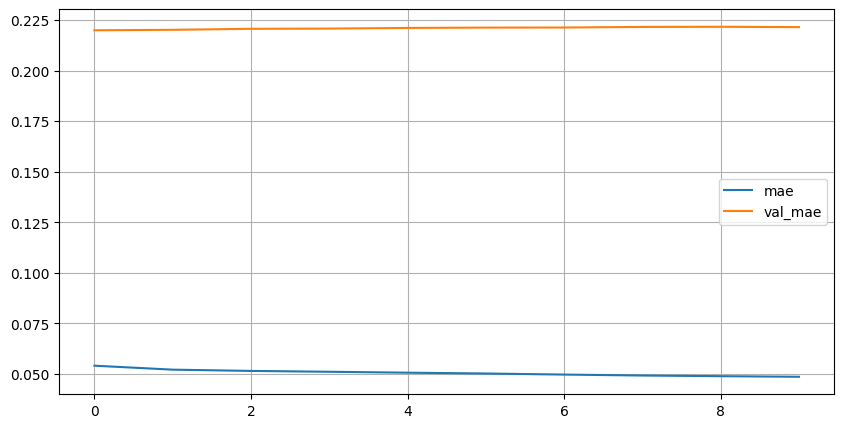

10/10 [==============================] - 0s 1ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6747.0 : 5508.2 :2.23e-02:6.47e-02| 110.2  :  8.2   :9.97e-06:1.60e-03|  1.7%  :  0.1%  :  0.0%  :  2.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

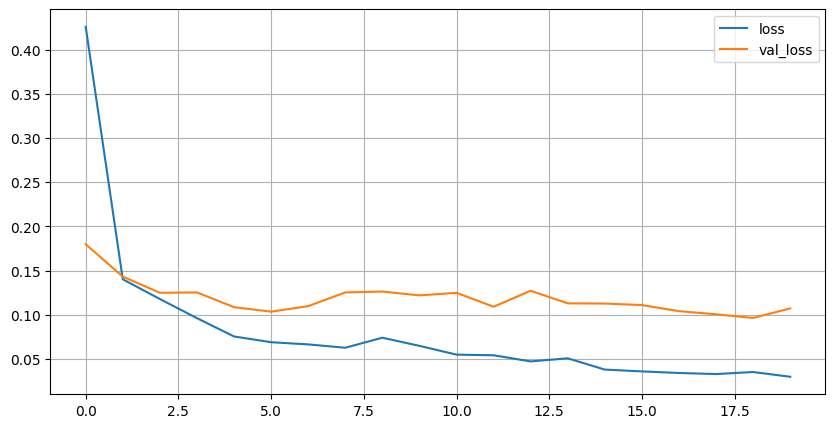

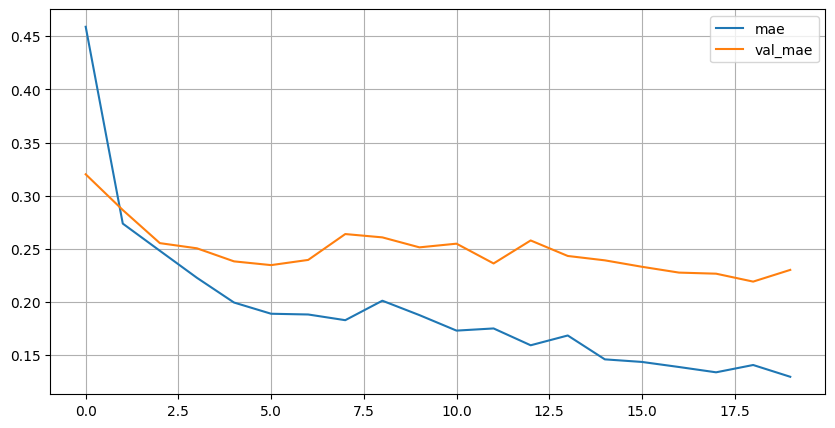

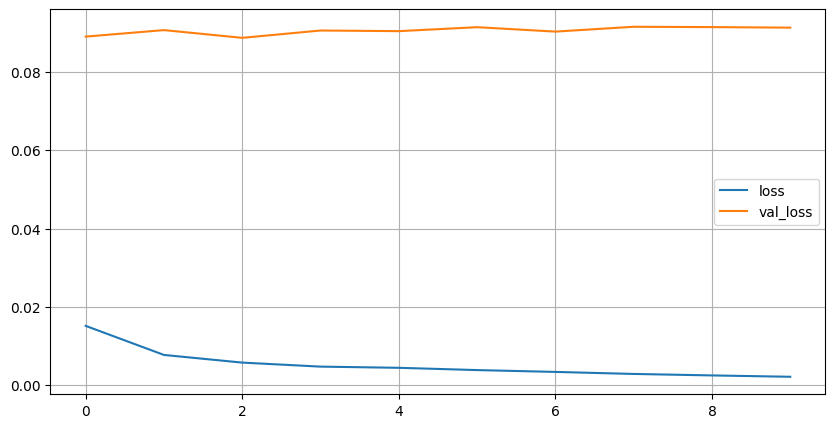

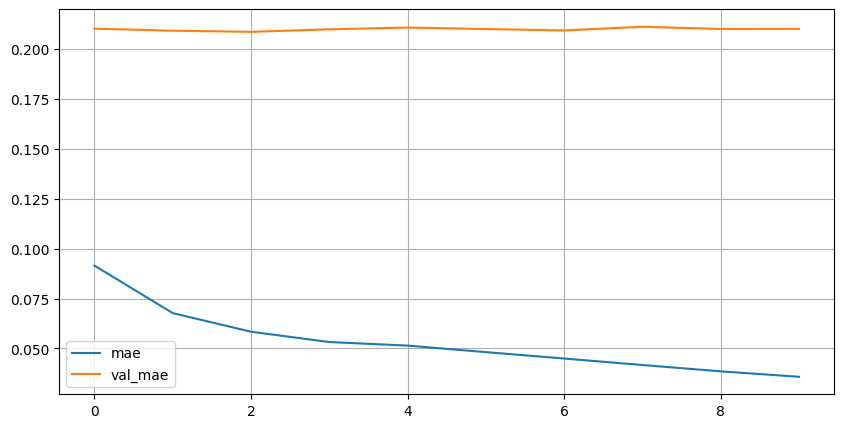

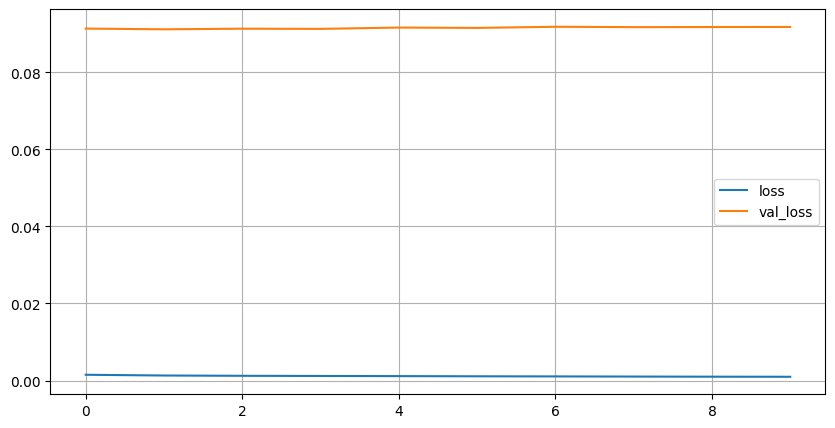

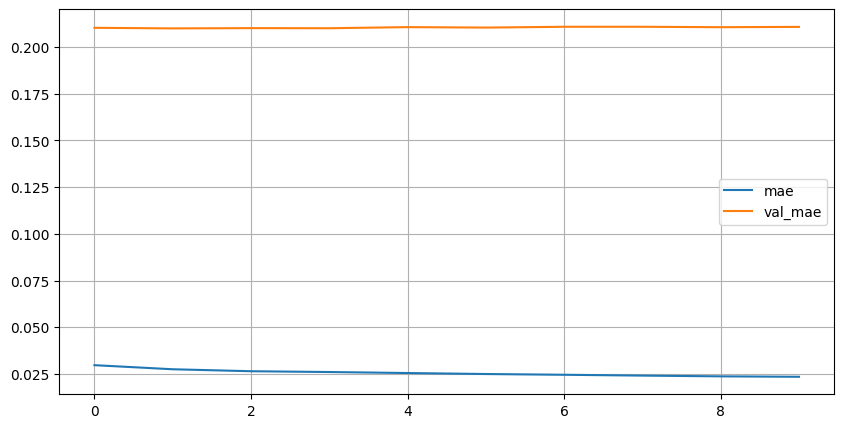

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6655.7 : 5503.6 :2.22e-02:6.64e-02|  19.0  :  3.6   :4.49e-05:1.53e-04|  0.3%  :  0.1%  :  0.2%  :  0.2%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

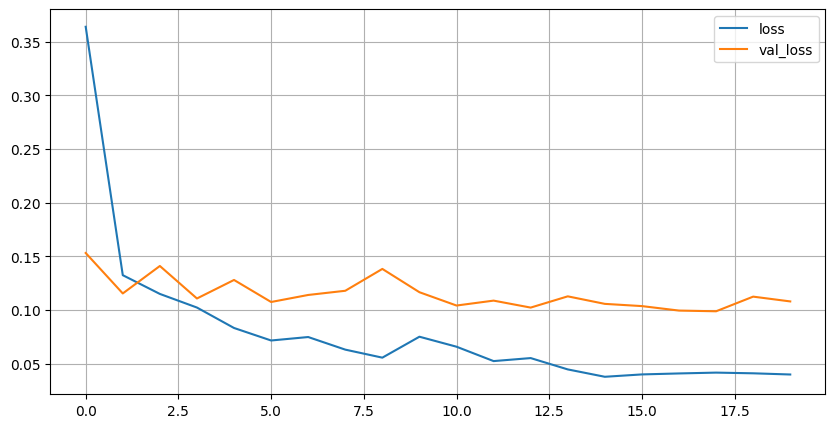

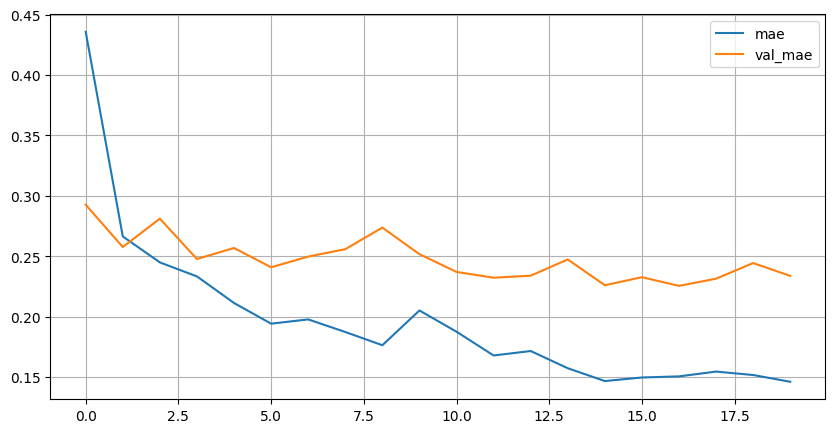

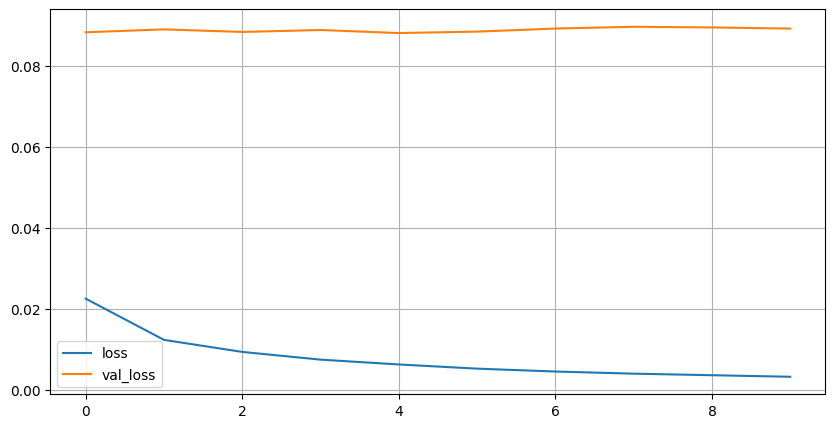

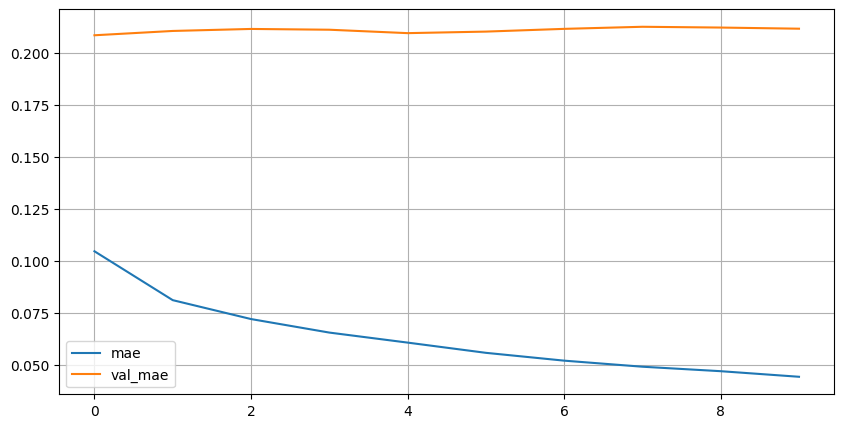

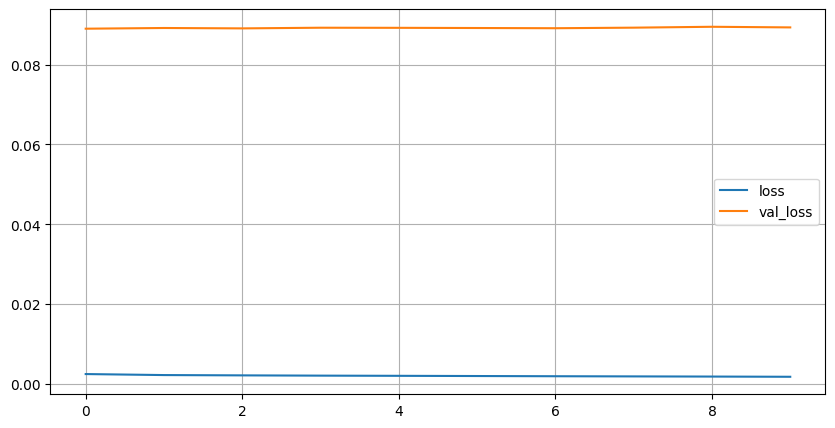

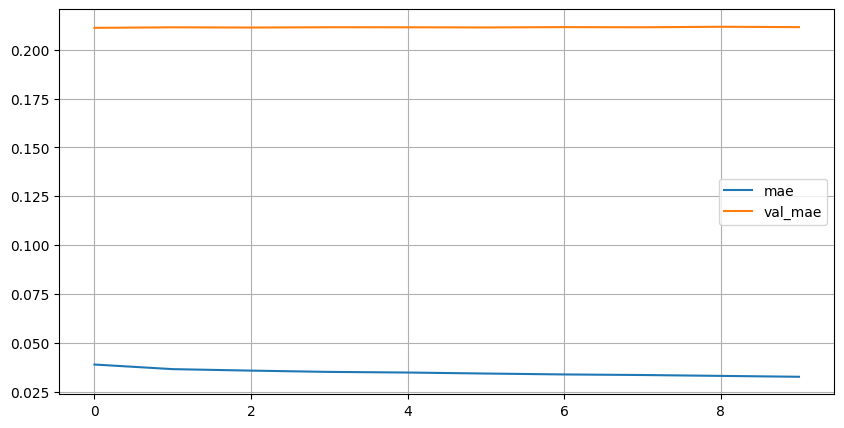

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6675.6 : 5527.9 :2.21e-02:6.57e-02|  38.9  :  27.9  :1.44e-04:5.61e-04|  0.6%  :  0.5%  :  0.6%  :  0.8%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

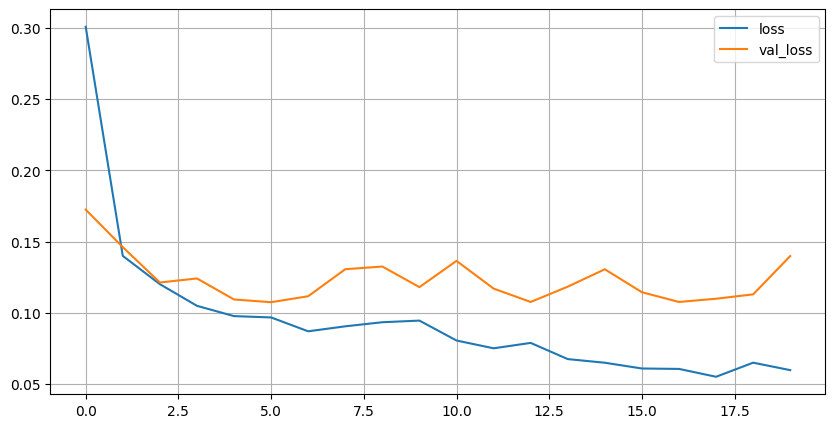

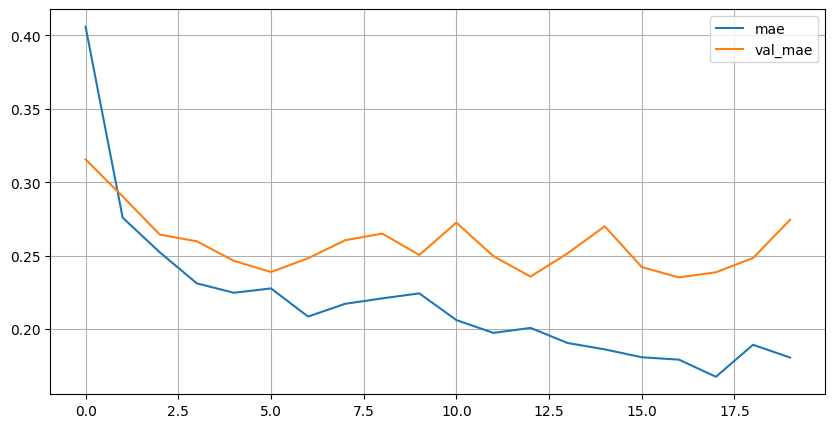

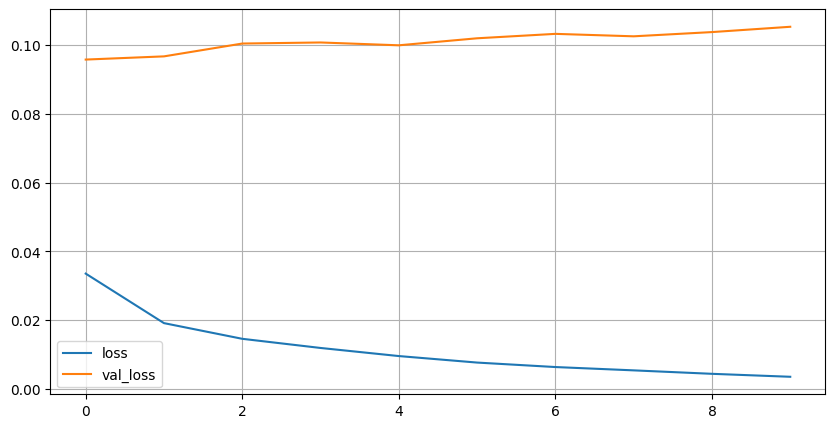

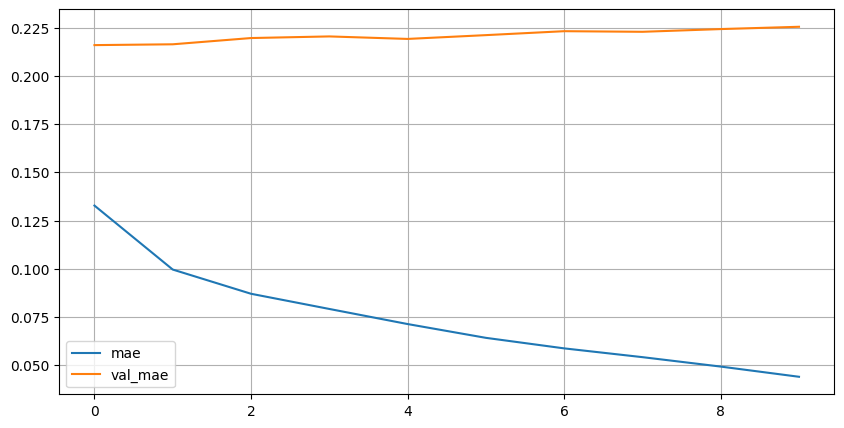

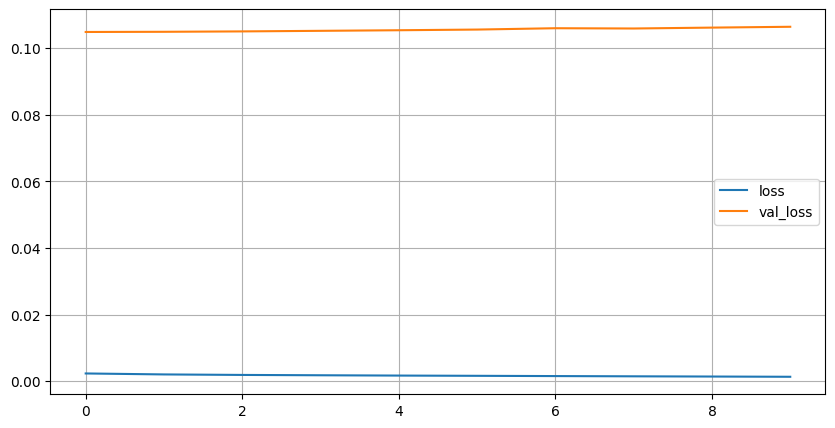

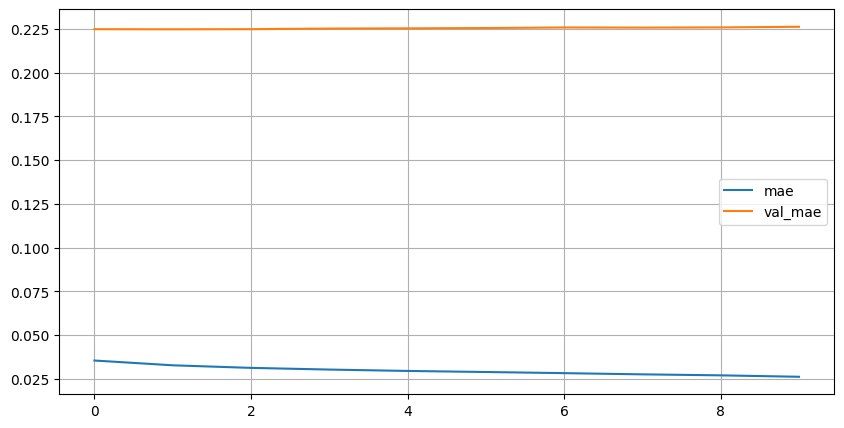

10/10 [==============================] - 0s 1ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6656.5 : 5570.0 :2.22e-02:6.69e-02|  19.7  :  70.0  :5.32e-05:6.01e-04|  0.3%  :  1.3%  :  0.2%  :  0.9%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

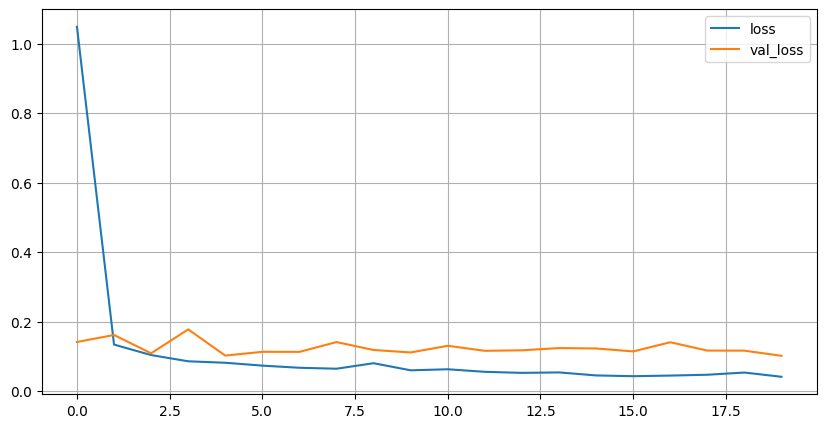

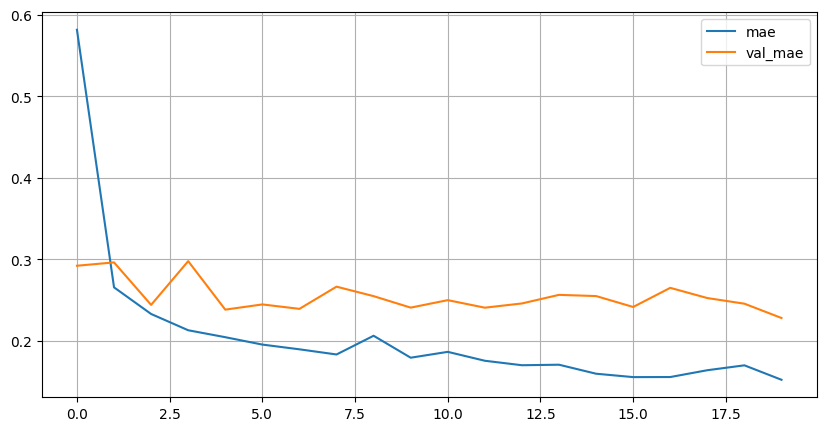

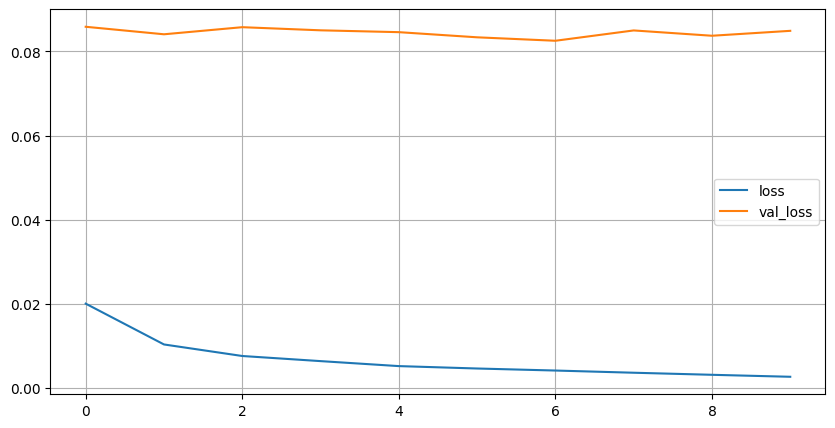

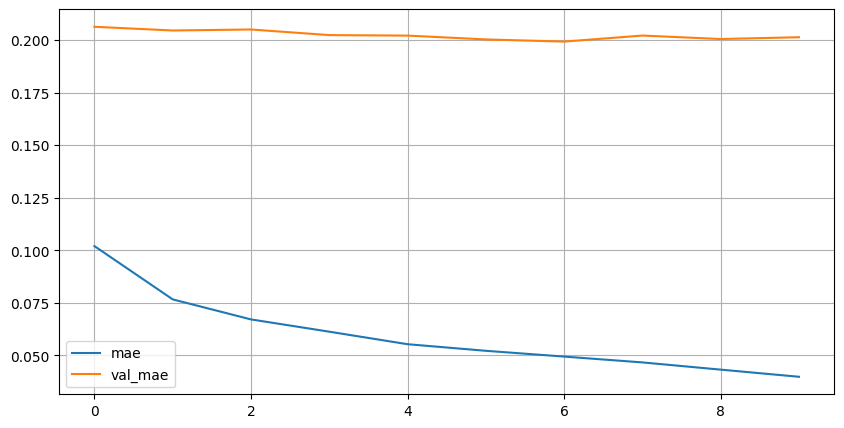

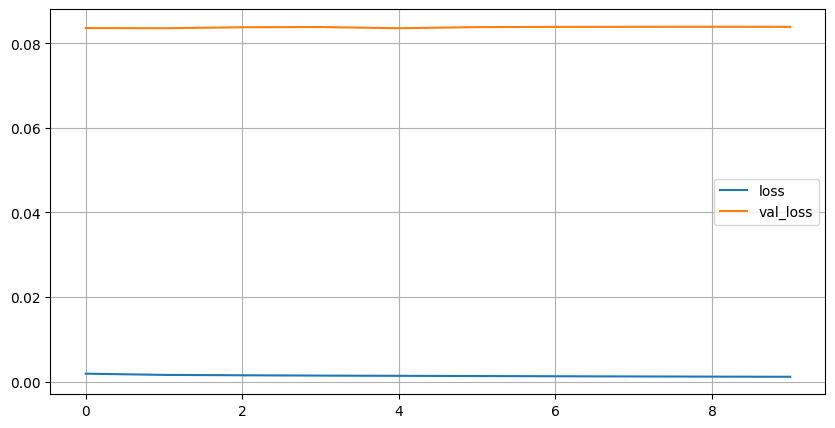

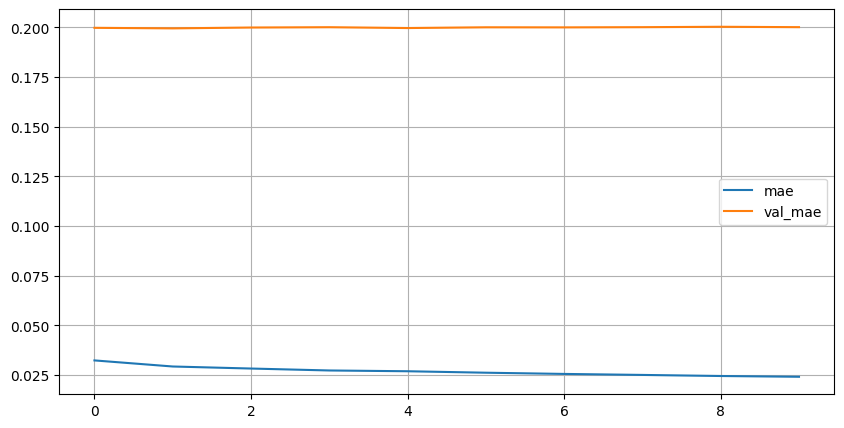

10/10 [==============================] - 0s 5ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6588.7 : 5504.7 :2.21e-02:6.79e-02|  48.0  :  4.7   :2.09e-04:1.60e-03|  0.7%  :  0.1%  :  0.9%  :  2.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

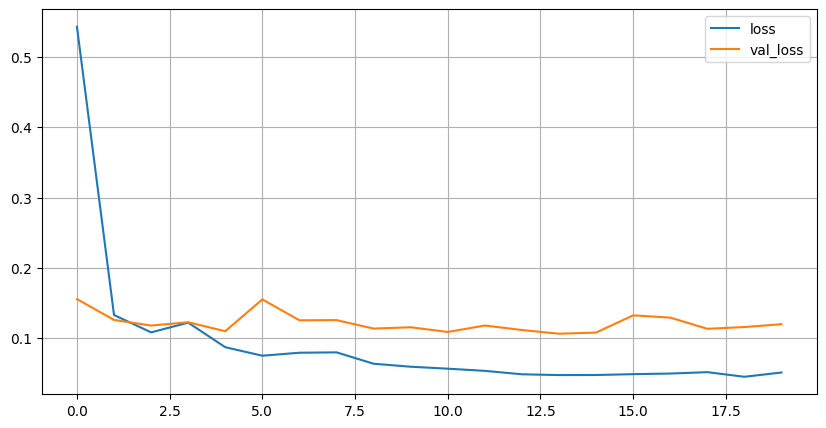

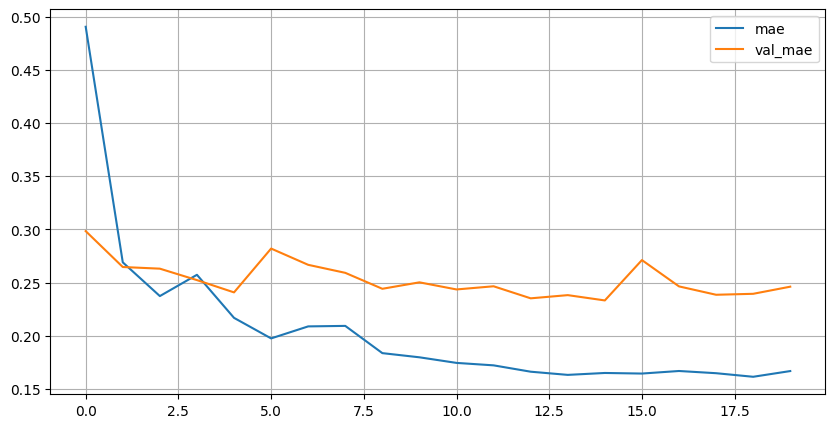

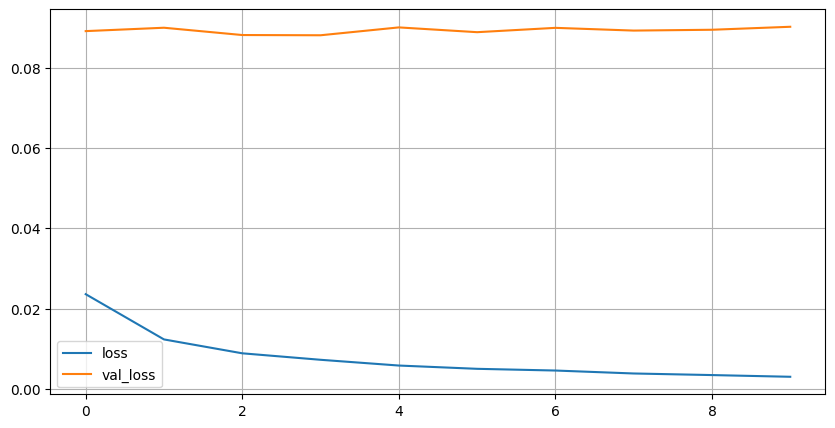

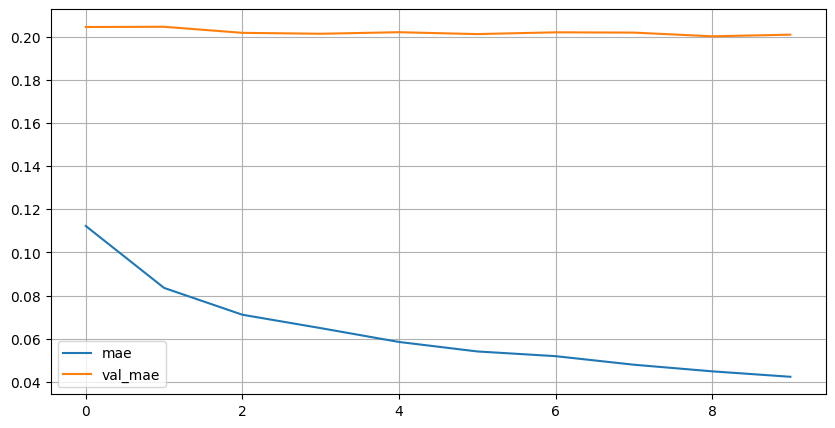

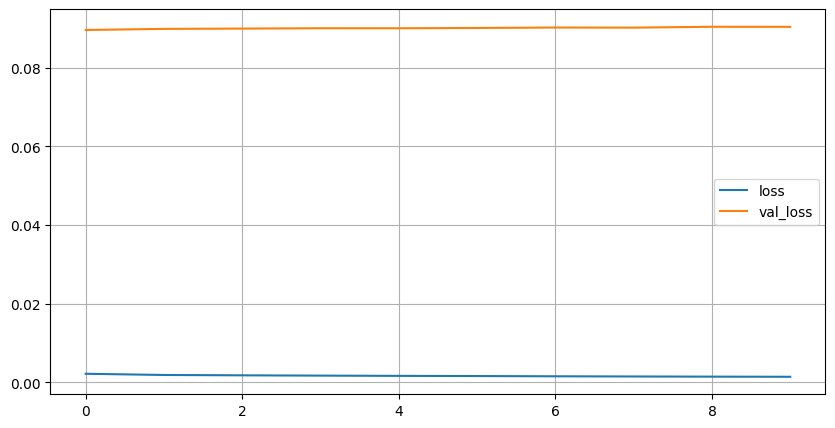

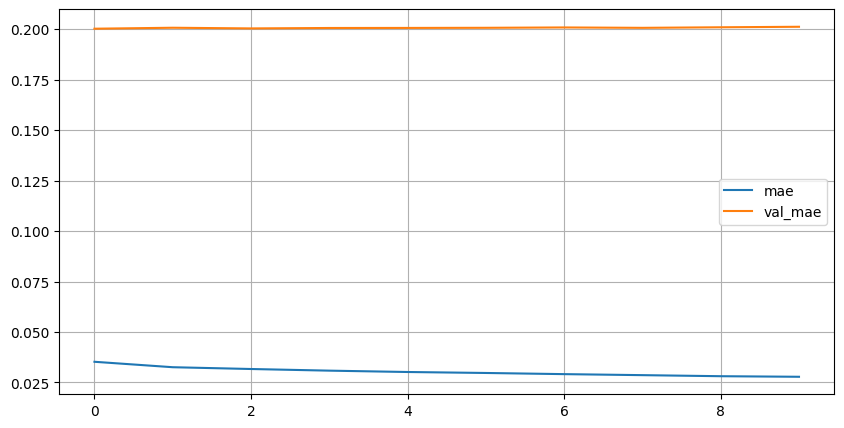

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6697.2 : 5487.6 :2.21e-02:6.63e-02|  60.5  :  12.4  :1.64e-04:7.76e-06|  0.9%  :  0.2%  :  0.7%  :  0.0%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
summary = dict()

for i, layers in enumerate(layers_list):
  eval_hist = []

  model_name = 'ffn_' + 'x'.join(str(n) for n in layers)

  model = create_ffn(layers)

  print(f'\n\nITERATION: {i}, MODEL: {model_name}\n')

  h = model.fit(x_train_scaled, y_train_scaled, validation_split=VAL_SPLIT, epochs=epochs, batch_size=batch_size, verbose=0)
  plot_history(h)

  model.compile(loss='mse', metrics=['mae'], optimizer=Adam(learning_rate=1e-3))
  h = model.fit(x_train_scaled, y_train_scaled, validation_split=VAL_SPLIT, epochs=10, batch_size=batch_size, verbose=0)
  plot_history(h)

  model.compile(loss='mse', metrics=['mae'], optimizer=Adam(learning_rate=1e-4))
  h = model.fit(x_train_scaled, y_train_scaled, validation_split=VAL_SPLIT, epochs=10, batch_size=batch_size, verbose=0)
  plot_history(h)

  y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

  mape = evaluate_model(y_pred, y_test, table_len=5, target_names=['tors', 'bend', 'f_tors', 'f_bend'], return_stats=True)

  summary[model_name] = sum(mape)

In [ ]:
summary

{'ffn_32x32': 0.051652843006513335,
 'ffn_32x32x32': 0.05658486433536934,
 'ffn_32x16x8': 0.056230723839301,
 'ffn_64x64': 0.053768559255940276,
 'ffn_64x64x64': 0.056582387017714786,
 'ffn_64x32x16': 0.05706357305263242,
 'ffn_128x128': 0.05307065291950651,
 'ffn_128x128x128': 0.05589494164373206,
 'ffn_128x64x32': 0.056491176548635946,
 'ffn_256x256': 0.05440105668381476,
 'ffn_256x256x256': 0.05365650383824437,
 'ffn_256x128x64': 0.05292249219113605,
 'ffn_512x512': 0.05434342819536101,
 'ffn_512x512x512': 0.05184663114271605,
 'ffn_512x256x128': 0.05120404929744361,
 'ffn_1024x1024': 0.05388226510527947,
 'ffn_1024x1024x1024': 0.05053767655399262,
 'ffn_1024x512x256': 0.049845717135862166}

Epoch 1/100
23/23 [==============================] - 1s 14ms/step - loss: 0.5384 - mae: 0.5569 - val_loss: 0.1894 - val_mae: 0.3385
Epoch 2/100
23/23 [==============================] - 0s 6ms/step - loss: 0.2146 - mae: 0.3577 - val_loss: 0.1661 - val_mae: 0.3134
Epoch 3/100
23/23 [==============================] - 0s 7ms/step - loss: 0.1747 - mae: 0.3163 - val_loss: 0.1357 - val_mae: 0.2780
Epoch 4/100
23/23 [==============================] - 0s 8ms/step - loss: 0.1528 - mae: 0.2950 - val_loss: 0.1247 - val_mae: 0.2634
Epoch 5/100
23/23 [==============================] - 0s 8ms/step - loss: 0.1337 - mae: 0.2761 - val_loss: 0.1201 - val_mae: 0.2548
Epoch 6/100
23/23 [==============================] - 0s 7ms/step - loss: 0.1218 - mae: 0.2606 - val_loss: 0.1087 - val_mae: 0.2419
Epoch 7/100
23/23 [==============================] - 0s 6ms/step - loss: 0.1151 - mae: 0.2551 - val_loss: 0.1120 - val_mae: 0.2452
Epoch 8/100
23/23 [==============================] - 0s 5ms/step - loss: 0.1060 - 

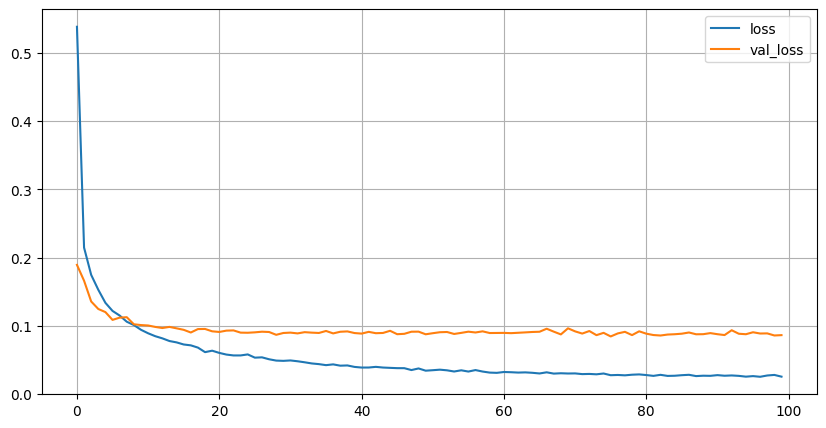

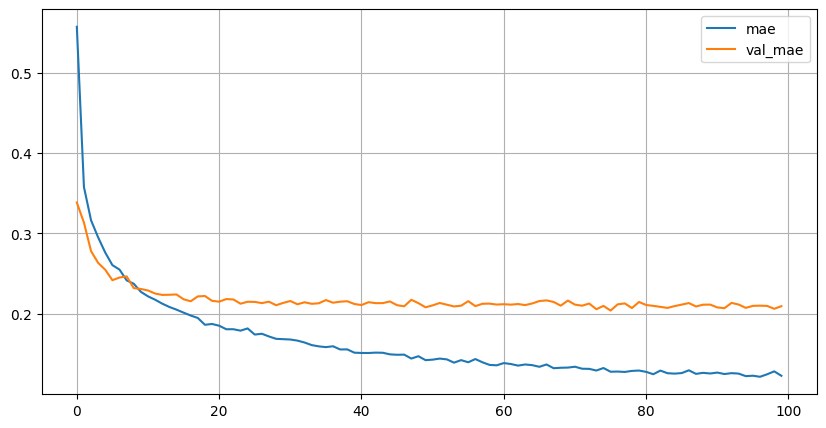

Epoch 1/100
23/23 [==============================] - 1s 9ms/step - loss: 0.0241 - mae: 0.1199 - val_loss: 0.0858 - val_mae: 0.2069
Epoch 2/100
23/23 [==============================] - 0s 5ms/step - loss: 0.0229 - mae: 0.1158 - val_loss: 0.0860 - val_mae: 0.2077
Epoch 3/100
23/23 [==============================] - 0s 4ms/step - loss: 0.0232 - mae: 0.1146 - val_loss: 0.0858 - val_mae: 0.2072
Epoch 4/100
23/23 [==============================] - 0s 5ms/step - loss: 0.0222 - mae: 0.1149 - val_loss: 0.0859 - val_mae: 0.2074
Epoch 5/100
23/23 [==============================] - 0s 5ms/step - loss: 0.0229 - mae: 0.1151 - val_loss: 0.0859 - val_mae: 0.2062
Epoch 6/100
23/23 [==============================] - 0s 5ms/step - loss: 0.0222 - mae: 0.1149 - val_loss: 0.0850 - val_mae: 0.2057
Epoch 7/100
23/23 [==============================] - 0s 6ms/step - loss: 0.0222 - mae: 0.1144 - val_loss: 0.0852 - val_mae: 0.2058
Epoch 8/100
23/23 [==============================] - 0s 5ms/step - loss: 0.0222 - m

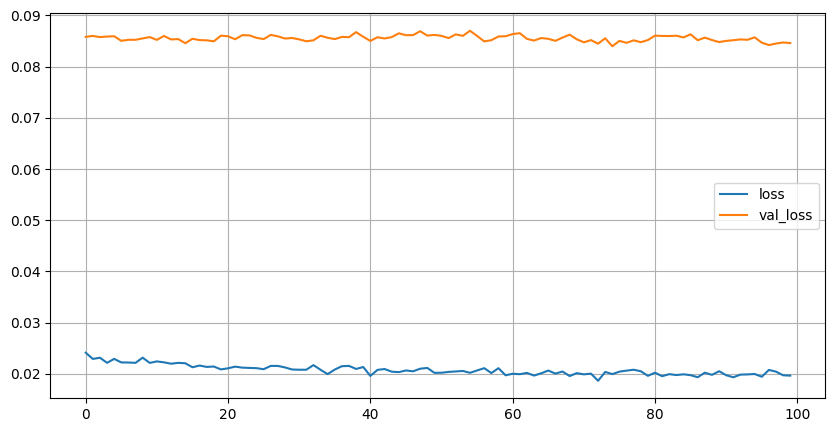

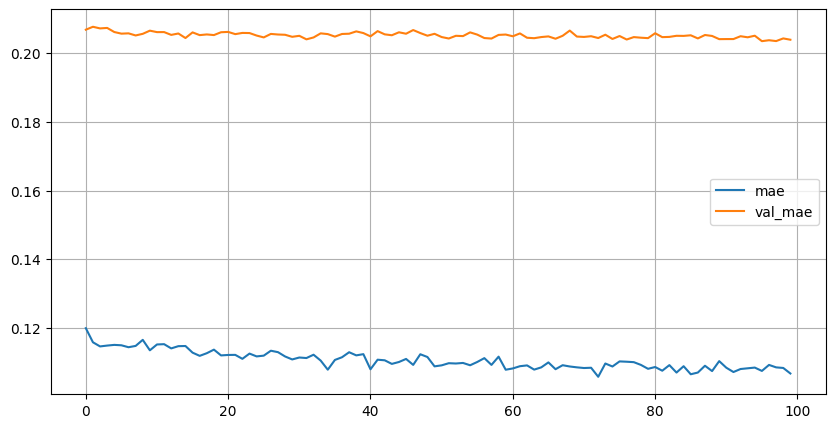

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6641.0 : 5504.3 :2.21e-02:6.61e-02|  4.3   :  4.3   :1.54e-04:1.83e-04|  0.1%  :  0.1%  :  0.7%  :  0.3%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(256, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(256, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.1))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

print(model.summary())

Epoch 1/100
23/23 [==============================] - 1s 18ms/step - loss: 0.3457 - mae: 0.4418 - val_loss: 0.1572 - val_mae: 0.3040
Epoch 2/100
23/23 [==============================] - 0s 12ms/step - loss: 0.1485 - mae: 0.2864 - val_loss: 0.1196 - val_mae: 0.2564
Epoch 3/100
23/23 [==============================] - 0s 15ms/step - loss: 0.1106 - mae: 0.2427 - val_loss: 0.1102 - val_mae: 0.2443
Epoch 4/100
23/23 [==============================] - 0s 19ms/step - loss: 0.0940 - mae: 0.2240 - val_loss: 0.1210 - val_mae: 0.2453
Epoch 5/100
23/23 [==============================] - 0s 18ms/step - loss: 0.0821 - mae: 0.2088 - val_loss: 0.1046 - val_mae: 0.2337
Epoch 6/100
23/23 [==============================] - 0s 18ms/step - loss: 0.0702 - mae: 0.1936 - val_loss: 0.0967 - val_mae: 0.2243
Epoch 7/100
23/23 [==============================] - 0s 19ms/step - loss: 0.0640 - mae: 0.1845 - val_loss: 0.1018 - val_mae: 0.2317
Epoch 8/100
23/23 [==============================] - 0s 15ms/step - loss: 0.

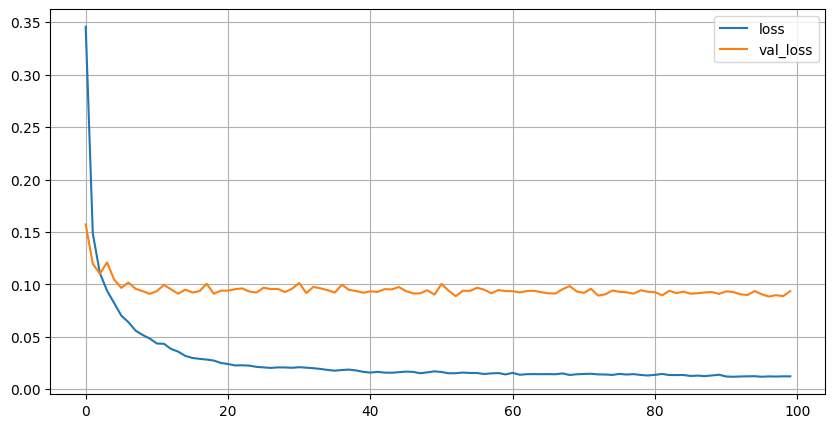

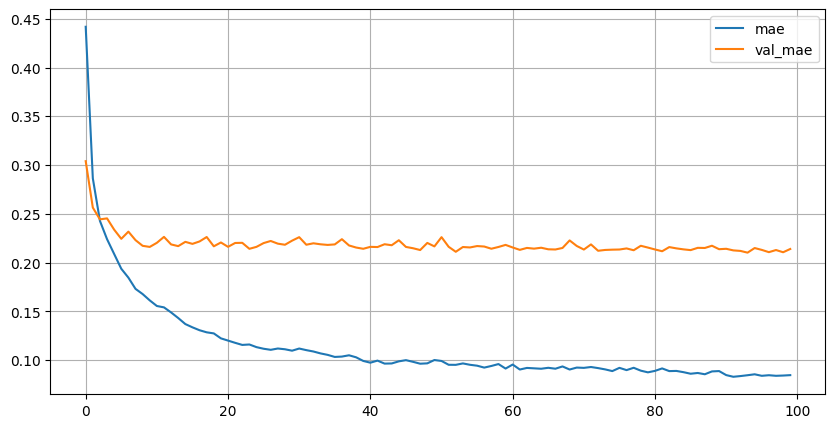

Epoch 1/100
23/23 [==============================] - 1s 18ms/step - loss: 0.0108 - mae: 0.0792 - val_loss: 0.0886 - val_mae: 0.2085
Epoch 2/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0094 - mae: 0.0739 - val_loss: 0.0885 - val_mae: 0.2079
Epoch 3/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0087 - mae: 0.0708 - val_loss: 0.0884 - val_mae: 0.2090
Epoch 4/100
23/23 [==============================] - 0s 14ms/step - loss: 0.0090 - mae: 0.0724 - val_loss: 0.0888 - val_mae: 0.2089
Epoch 5/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0086 - mae: 0.0712 - val_loss: 0.0880 - val_mae: 0.2078
Epoch 6/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0084 - mae: 0.0704 - val_loss: 0.0879 - val_mae: 0.2083
Epoch 7/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0082 - mae: 0.0693 - val_loss: 0.0875 - val_mae: 0.2074
Epoch 8/100
23/23 [==============================] - 0s 13ms/step - loss: 0.

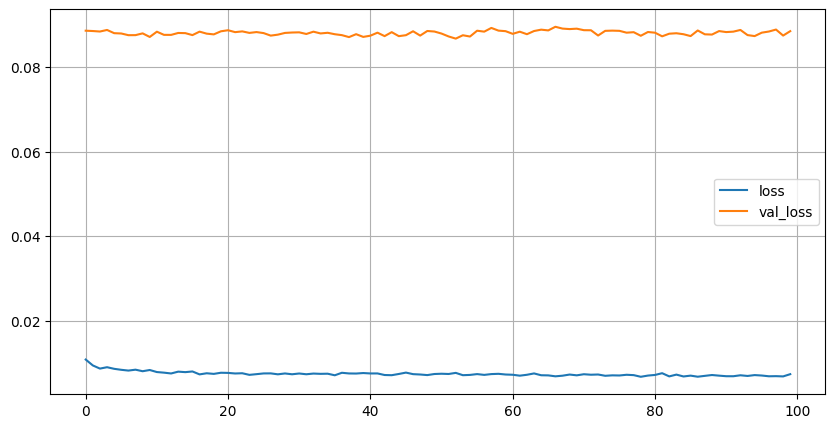

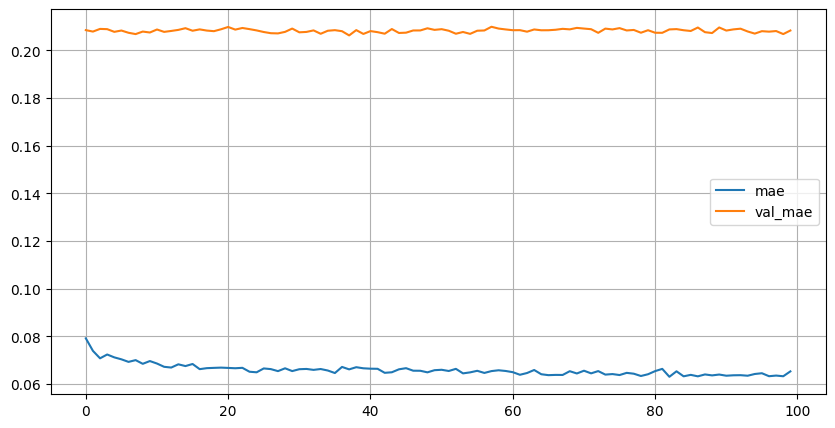

19/19 [==============================] - 0s 4ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  |  -0.3  :  -0.0  :-1.13e+00:-9.19e-01| 4718.1 : 2233.0 :2.16e-02:5.17e-02| 4718.4 : 2233.1 :1.15e+00:9.71e-01|-1409362.4%:-55869626.1%:-101.9% :-105.6% |
| 1  |  1.9   :  1.4   :1.20e+00

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.1))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

print(model.summary())

Epoch 1/100
23/23 [==============================] - 1s 14ms/step - loss: 0.3845 - mae: 0.4625 - val_loss: 0.1583 - val_mae: 0.3033
Epoch 2/100
23/23 [==============================] - 0s 10ms/step - loss: 0.1559 - mae: 0.2956 - val_loss: 0.1254 - val_mae: 0.2684
Epoch 3/100
23/23 [==============================] - 0s 10ms/step - loss: 0.1267 - mae: 0.2655 - val_loss: 0.1124 - val_mae: 0.2493
Epoch 4/100
23/23 [==============================] - 0s 8ms/step - loss: 0.1068 - mae: 0.2405 - val_loss: 0.1035 - val_mae: 0.2387
Epoch 5/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0966 - mae: 0.2290 - val_loss: 0.1008 - val_mae: 0.2352
Epoch 6/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0868 - mae: 0.2178 - val_loss: 0.1001 - val_mae: 0.2296
Epoch 7/100
23/23 [==============================] - 0s 8ms/step - loss: 0.0757 - mae: 0.2011 - val_loss: 0.1040 - val_mae: 0.2352
Epoch 8/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0710 

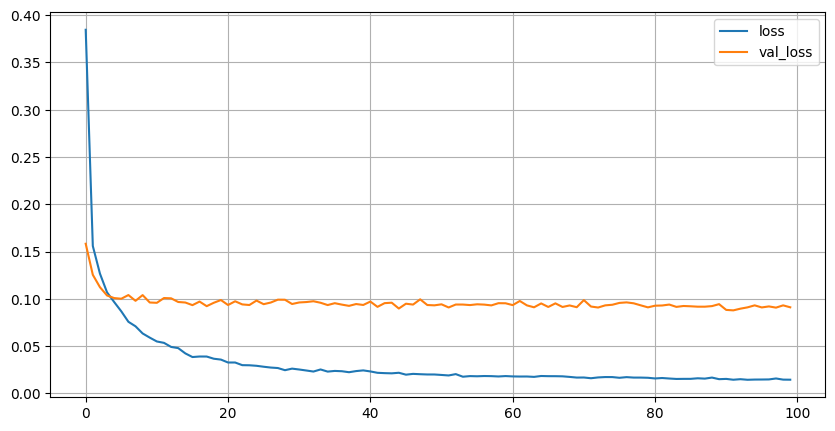

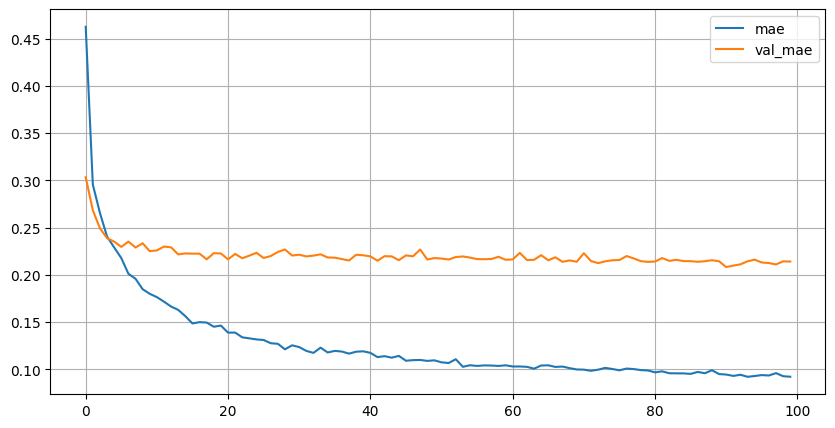

Epoch 1/100
23/23 [==============================] - 1s 15ms/step - loss: 0.0126 - mae: 0.0863 - val_loss: 0.0921 - val_mae: 0.2133
Epoch 2/100
23/23 [==============================] - 0s 10ms/step - loss: 0.0114 - mae: 0.0832 - val_loss: 0.0913 - val_mae: 0.2112
Epoch 3/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0116 - mae: 0.0827 - val_loss: 0.0899 - val_mae: 0.2103
Epoch 4/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0113 - mae: 0.0810 - val_loss: 0.0919 - val_mae: 0.2129
Epoch 5/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0112 - mae: 0.0813 - val_loss: 0.0905 - val_mae: 0.2105
Epoch 6/100
23/23 [==============================] - 0s 10ms/step - loss: 0.0114 - mae: 0.0823 - val_loss: 0.0909 - val_mae: 0.2114
Epoch 7/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0107 - mae: 0.0800 - val_loss: 0.0902 - val_mae: 0.2097
Epoch 8/100
23/23 [==============================] - 0s 9ms/step - loss: 0.0110 

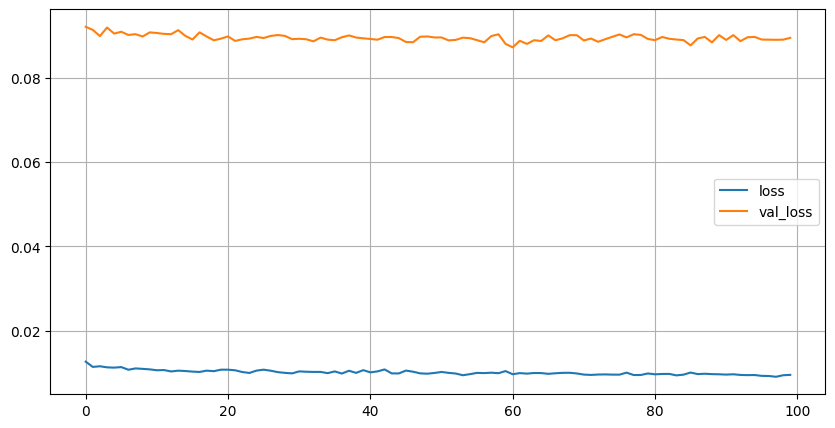

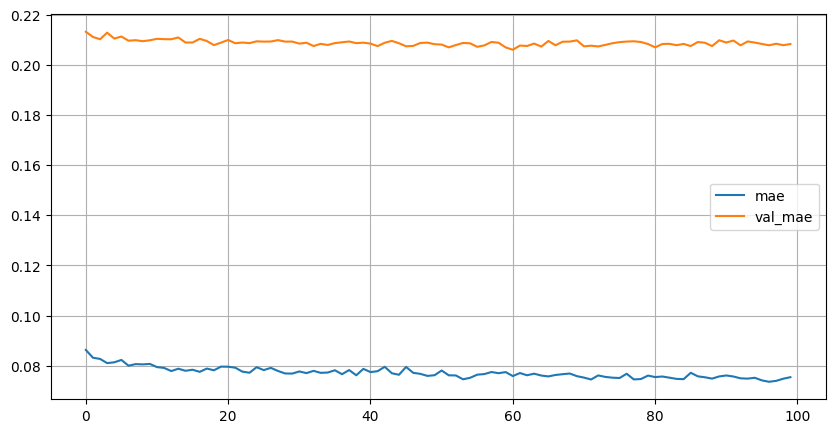

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6751.7 : 5547.2 :2.22e-02:6.63e-02| 114.9  :  47.2  :1.03e-04:2.25e-05|  1.7%  :  0.9%  :  0.5%  :  0.0%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.1))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

print(model.summary())

Epoch 1/100
23/23 [==============================] - 1s 28ms/step - loss: 0.3119 - mae: 0.4146 - val_loss: 0.1728 - val_mae: 0.3098
Epoch 2/100
23/23 [==============================] - 1s 22ms/step - loss: 0.1444 - mae: 0.2832 - val_loss: 0.1291 - val_mae: 0.2601
Epoch 3/100
23/23 [==============================] - 1s 23ms/step - loss: 0.1093 - mae: 0.2392 - val_loss: 0.1132 - val_mae: 0.2452
Epoch 4/100
23/23 [==============================] - 1s 23ms/step - loss: 0.0857 - mae: 0.2121 - val_loss: 0.0998 - val_mae: 0.2321
Epoch 5/100
23/23 [==============================] - 1s 34ms/step - loss: 0.0714 - mae: 0.1935 - val_loss: 0.1022 - val_mae: 0.2338
Epoch 6/100
23/23 [==============================] - 1s 47ms/step - loss: 0.0648 - mae: 0.1835 - val_loss: 0.0933 - val_mae: 0.2241
Epoch 7/100
23/23 [==============================] - 1s 48ms/step - loss: 0.0569 - mae: 0.1737 - val_loss: 0.0940 - val_mae: 0.2205
Epoch 8/100
23/23 [==============================] - 1s 26ms/step - loss: 0.

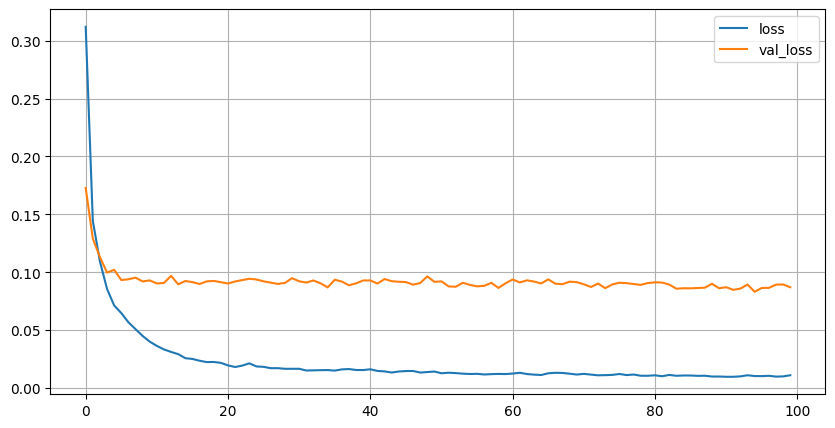

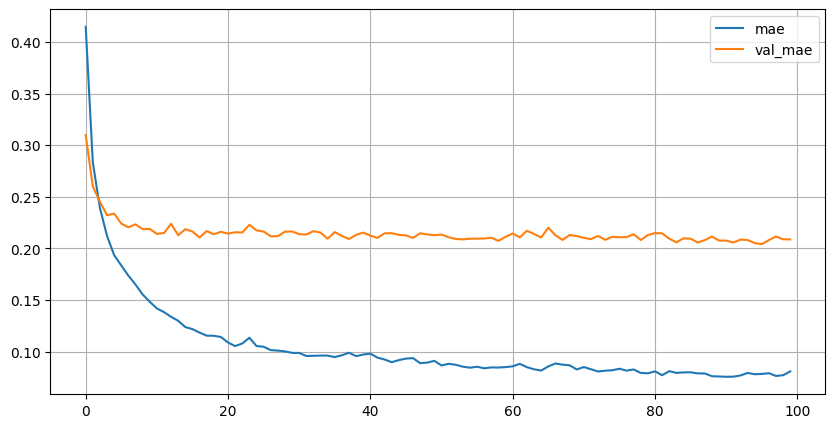

Epoch 1/100
23/23 [==============================] - 1s 28ms/step - loss: 0.0088 - mae: 0.0711 - val_loss: 0.0854 - val_mae: 0.2044
Epoch 2/100
23/23 [==============================] - 1s 22ms/step - loss: 0.0074 - mae: 0.0657 - val_loss: 0.0854 - val_mae: 0.2048
Epoch 3/100
23/23 [==============================] - 1s 23ms/step - loss: 0.0069 - mae: 0.0635 - val_loss: 0.0836 - val_mae: 0.2026
Epoch 4/100
23/23 [==============================] - 1s 23ms/step - loss: 0.0066 - mae: 0.0627 - val_loss: 0.0846 - val_mae: 0.2037
Epoch 5/100
23/23 [==============================] - 1s 23ms/step - loss: 0.0068 - mae: 0.0628 - val_loss: 0.0844 - val_mae: 0.2034
Epoch 6/100
23/23 [==============================] - 1s 30ms/step - loss: 0.0064 - mae: 0.0607 - val_loss: 0.0835 - val_mae: 0.2026
Epoch 7/100
23/23 [==============================] - 1s 33ms/step - loss: 0.0063 - mae: 0.0605 - val_loss: 0.0839 - val_mae: 0.2023
Epoch 8/100
23/23 [==============================] - 1s 35ms/step - loss: 0.

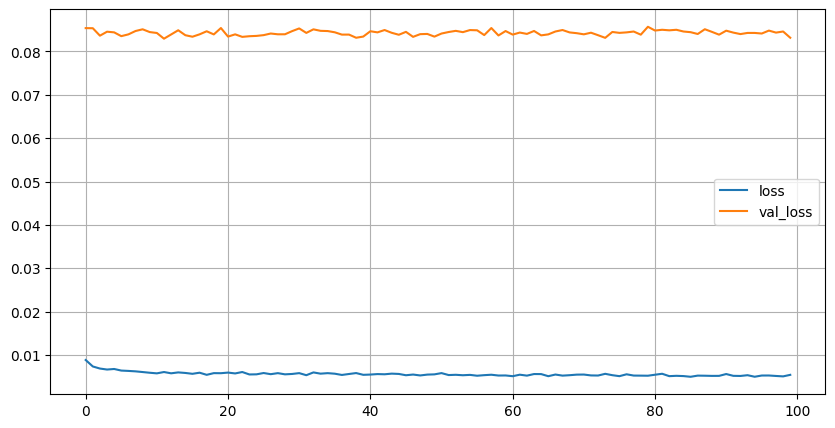

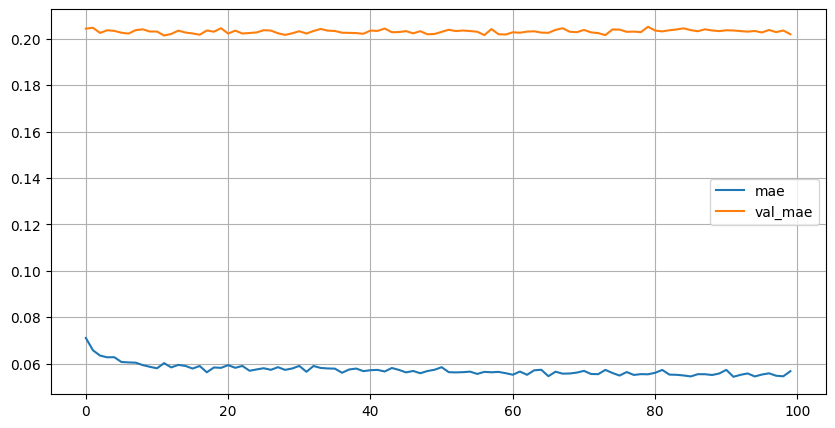

10/10 [==============================] - 0s 4ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6681.8 : 5526.8 :2.22e-02:6.64e-02|  45.1  :  26.8  :1.23e-04:1.55e-04|  0.7%  :  0.5%  :  0.6%  :  0.2%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.1))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

print(model.summary())

Epoch 1/100
23/23 [==============================] - 1s 21ms/step - loss: 0.3792 - mae: 0.4593 - val_loss: 0.1758 - val_mae: 0.3084
Epoch 2/100
23/23 [==============================] - 0s 15ms/step - loss: 0.1570 - mae: 0.2950 - val_loss: 0.1195 - val_mae: 0.2568
Epoch 3/100
23/23 [==============================] - 0s 14ms/step - loss: 0.1231 - mae: 0.2593 - val_loss: 0.1198 - val_mae: 0.2538
Epoch 4/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0984 - mae: 0.2315 - val_loss: 0.1082 - val_mae: 0.2432
Epoch 5/100
23/23 [==============================] - 0s 14ms/step - loss: 0.0827 - mae: 0.2142 - val_loss: 0.1054 - val_mae: 0.2380
Epoch 6/100
23/23 [==============================] - 0s 15ms/step - loss: 0.0761 - mae: 0.2040 - val_loss: 0.1144 - val_mae: 0.2453
Epoch 7/100
23/23 [==============================] - 0s 15ms/step - loss: 0.0686 - mae: 0.1953 - val_loss: 0.0978 - val_mae: 0.2267
Epoch 8/100
23/23 [==============================] - 0s 15ms/step - loss: 0.

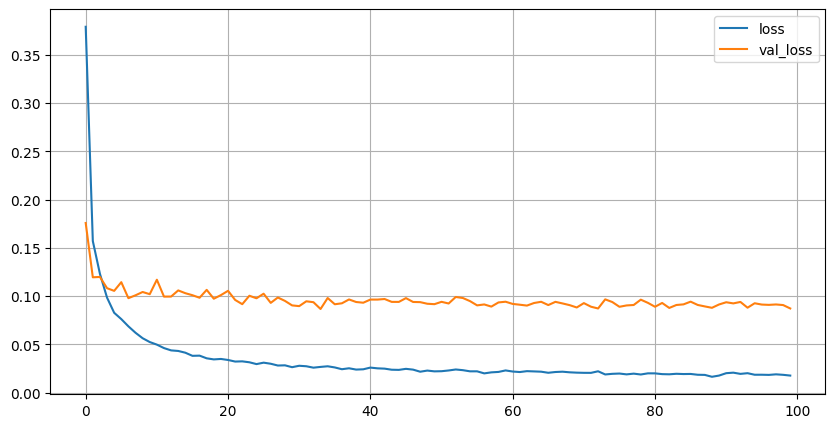

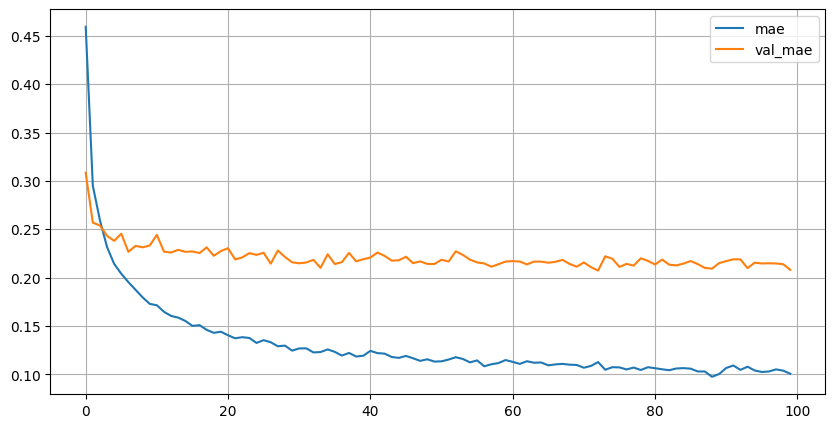

Epoch 1/100
23/23 [==============================] - 2s 40ms/step - loss: 0.0150 - mae: 0.0935 - val_loss: 0.0874 - val_mae: 0.2080
Epoch 2/100
23/23 [==============================] - 0s 15ms/step - loss: 0.0134 - mae: 0.0883 - val_loss: 0.0876 - val_mae: 0.2079
Epoch 3/100
23/23 [==============================] - 0s 15ms/step - loss: 0.0128 - mae: 0.0871 - val_loss: 0.0870 - val_mae: 0.2068
Epoch 4/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0132 - mae: 0.0877 - val_loss: 0.0868 - val_mae: 0.2070
Epoch 5/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0129 - mae: 0.0867 - val_loss: 0.0869 - val_mae: 0.2074
Epoch 6/100
23/23 [==============================] - 0s 14ms/step - loss: 0.0122 - mae: 0.0850 - val_loss: 0.0853 - val_mae: 0.2057
Epoch 7/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0121 - mae: 0.0843 - val_loss: 0.0856 - val_mae: 0.2065
Epoch 8/100
23/23 [==============================] - 0s 16ms/step - loss: 0.

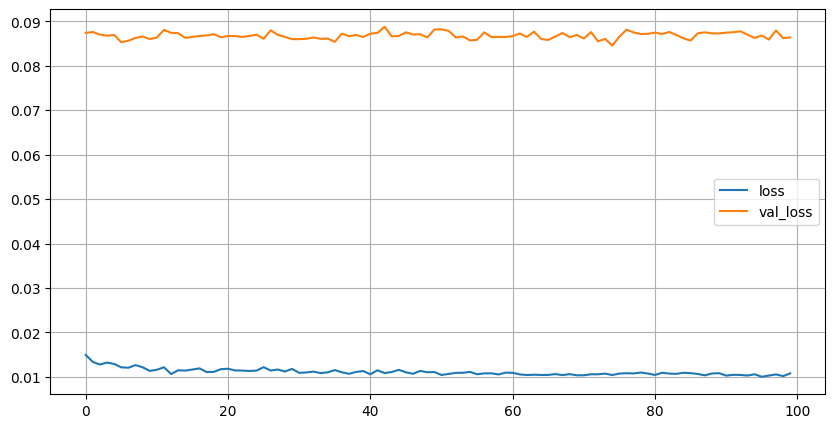

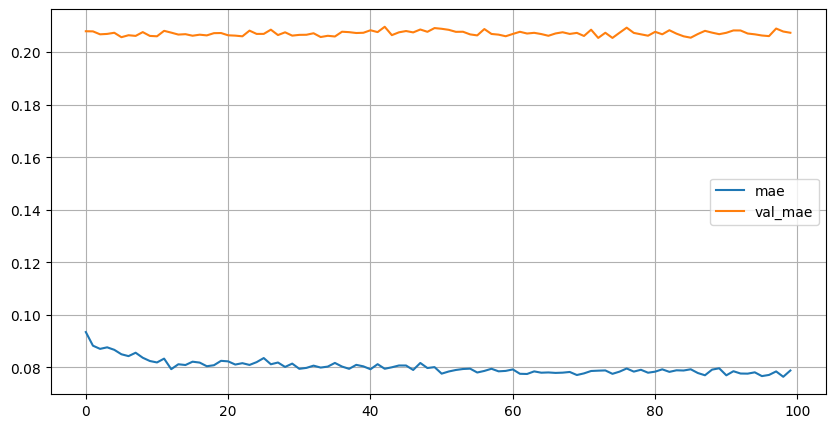

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6693.4 : 5496.4 :2.22e-02:6.58e-02|  56.6  :  3.6   :8.30e-05:4.08e-04|  0.9%  :  0.1%  :  0.4%  :  0.6%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(256, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/100
23/23 [==============================] - 2s 16ms/step - loss: 0.8726 - mae: 0.7412 - val_loss: 0.5996 - val_mae: 0.6168
Epoch 2/100
23/23 [==============================] - 0s 5ms/step - loss: 0.5816 - mae: 0.5977 - val_loss: 0.3778 - val_mae: 0.4857
Epoch 3/100
23/23 [==============================] - 0s 4ms/step - loss: 0.4614 - mae: 0.5278 - val_loss: 0.2682 - val_mae: 0.4044
Epoch 4/100
23/23 [==============================] - 0s 5ms/step - loss: 0.3806 - mae: 0.4802 - val_loss: 0.2340 - val_mae: 0.3714
Epoch 5/100
23/23 [==============================] - 0s 4ms/step - loss: 0.3468 - mae: 0.4605 - val_loss: 0.2145 - val_mae: 0.3555
Epoch 6/100
23/23 [==============================] - 0s 4ms/step - loss: 0.3481 - mae: 0.4600 - val_loss: 0.2080 - val_mae: 0.3477
Epoch 7/100
23/23 [==============================] - 0s 4ms/step - loss: 0.3235 - mae: 0.4438 - val_loss: 0.1989 - val_mae: 0.3390
Epoch 8/100
23/23 [==============================] - 0s 5ms/step - loss: 0.3058 - 

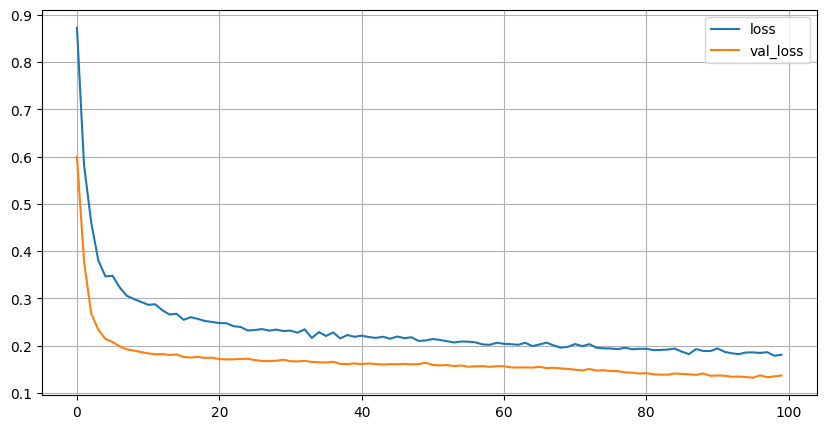

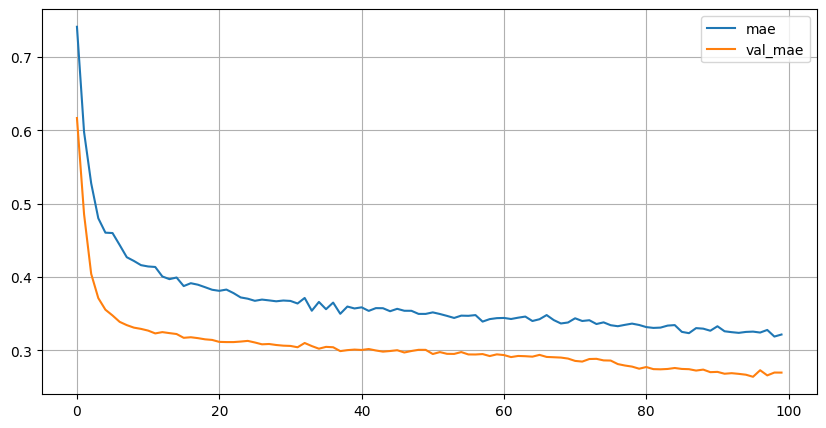

Epoch 1/100
23/23 [==============================] - 1s 10ms/step - loss: 0.1798 - mae: 0.3206 - val_loss: 0.1340 - val_mae: 0.2667
Epoch 2/100
23/23 [==============================] - 0s 3ms/step - loss: 0.1729 - mae: 0.3139 - val_loss: 0.1331 - val_mae: 0.2657
Epoch 3/100
23/23 [==============================] - 0s 3ms/step - loss: 0.1782 - mae: 0.3183 - val_loss: 0.1329 - val_mae: 0.2656
Epoch 4/100
23/23 [==============================] - 0s 4ms/step - loss: 0.1822 - mae: 0.3227 - val_loss: 0.1329 - val_mae: 0.2655
Epoch 5/100
23/23 [==============================] - 0s 4ms/step - loss: 0.1804 - mae: 0.3212 - val_loss: 0.1338 - val_mae: 0.2664
Epoch 6/100
23/23 [==============================] - 0s 3ms/step - loss: 0.1771 - mae: 0.3196 - val_loss: 0.1333 - val_mae: 0.2660
Epoch 7/100
23/23 [==============================] - 0s 3ms/step - loss: 0.1783 - mae: 0.3193 - val_loss: 0.1325 - val_mae: 0.2648
Epoch 8/100
23/23 [==============================] - 0s 3ms/step - loss: 0.1813 - 

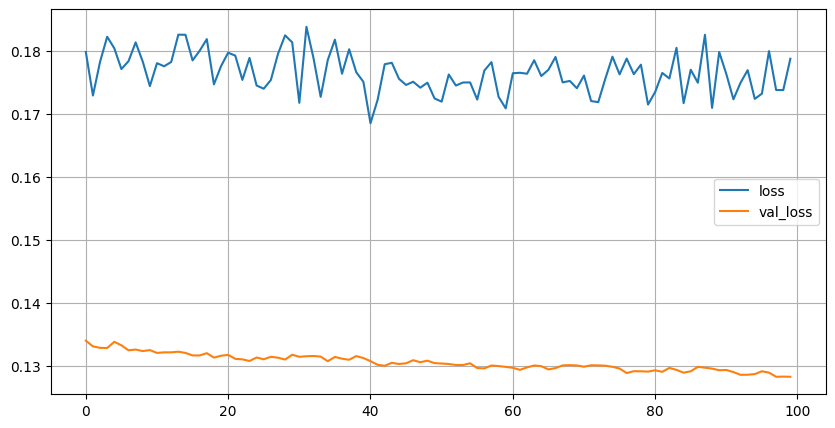

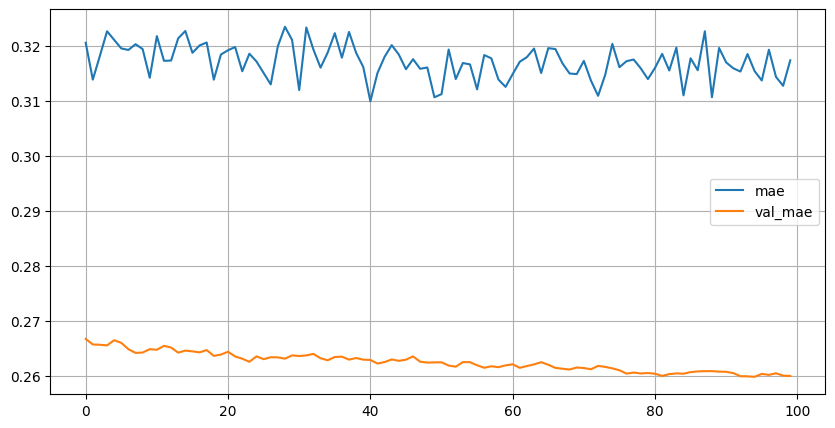

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6704.1 : 5489.4 :2.20e-02:6.82e-02|  67.4  :  10.6  :2.67e-04:1.94e-03|  1.0%  :  0.2%  :  1.2%  :  2.9%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(32, activation='tanh'))
model.add(Dropout(.1))
model.add(Dense(32, activation='tanh'))
model.add(Dropout(.1))
model.add(Dense(32, activation='tanh'))
model.add(Dropout(.1))
model.add(Dense(32, activation='tanh'))
model.add(Dropout(.1))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 1024)              24576     
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 512)               524800    
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 4)                

Epoch 1/100
12/12 [==============================] - 3s 61ms/step - loss: 0.5191 - mae: 0.5446 - val_loss: 0.1796 - val_mae: 0.3288
Epoch 2/100
12/12 [==============================] - 0s 29ms/step - loss: 0.2291 - mae: 0.3740 - val_loss: 0.1575 - val_mae: 0.3052
Epoch 3/100
12/12 [==============================] - 0s 29ms/step - loss: 0.1787 - mae: 0.3212 - val_loss: 0.1334 - val_mae: 0.2727
Epoch 4/100
12/12 [==============================] - 0s 28ms/step - loss: 0.1562 - mae: 0.3000 - val_loss: 0.1228 - val_mae: 0.2616
Epoch 5/100
12/12 [==============================] - 0s 28ms/step - loss: 0.1406 - mae: 0.2829 - val_loss: 0.1162 - val_mae: 0.2516
Epoch 6/100
12/12 [==============================] - 0s 23ms/step - loss: 0.1294 - mae: 0.2714 - val_loss: 0.1105 - val_mae: 0.2432
Epoch 7/100
12/12 [==============================] - 0s 23ms/step - loss: 0.1154 - mae: 0.2551 - val_loss: 0.1055 - val_mae: 0.2398
Epoch 8/100
12/12 [==============================] - 0s 27ms/step - loss: 0.

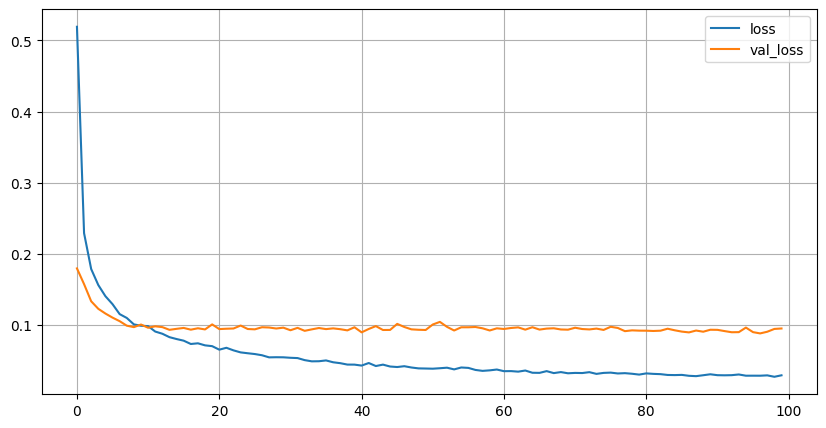

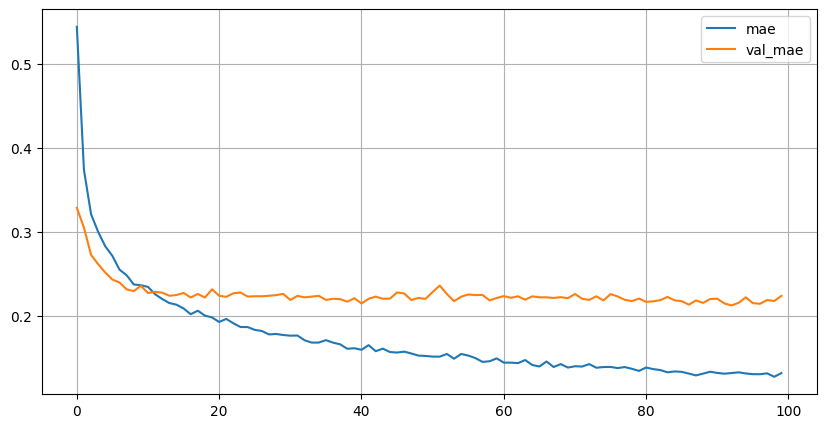

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6638.1 : 5348.6 :2.22e-02:6.54e-02|  1.4   : 151.4  :1.38e-04:9.07e-04|  0.0%  :  2.8%  :  0.6%  :  1.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/100
12/12 [==============================] - 2s 85ms/step - loss: 0.5361 - mae: 0.5581 - val_loss: 0.2050 - val_mae: 0.3338
Epoch 2/100
12/12 [==============================] - 0s 40ms/step - loss: 0.1992 - mae: 0.3387 - val_loss: 0.1682 - val_mae: 0.3174
Epoch 3/100
12/12 [==============================] - 1s 49ms/step - loss: 0.1741 - mae: 0.3194 - val_loss: 0.1468 - val_mae: 0.2881
Epoch 4/100
12/12 [==============================] - 0s 41ms/step - loss: 0.1544 - mae: 0.2947 - val_loss: 0.1659 - val_mae: 0.2970
Epoch 5/100
12/12 [==============================] - 0s 42ms/step - loss: 0.1382 - mae: 0.2722 - val_loss: 0.1516 - val_mae: 0.2968
Epoch 6/100
12/12 [==============================] - 0s 38ms/step - loss: 0.1338 - mae: 0.2768 - val_loss: 0.1145 - val_mae: 0.2566
Epoch 7/100
12/12 [==============================] - 0s 34ms/step - loss: 0.1263 - mae: 0.2715 - val_loss: 0.1141 - val_mae: 0.2548
Epoch 8/100
12/12 [==============================] - 0s 29ms/step - loss: 0.

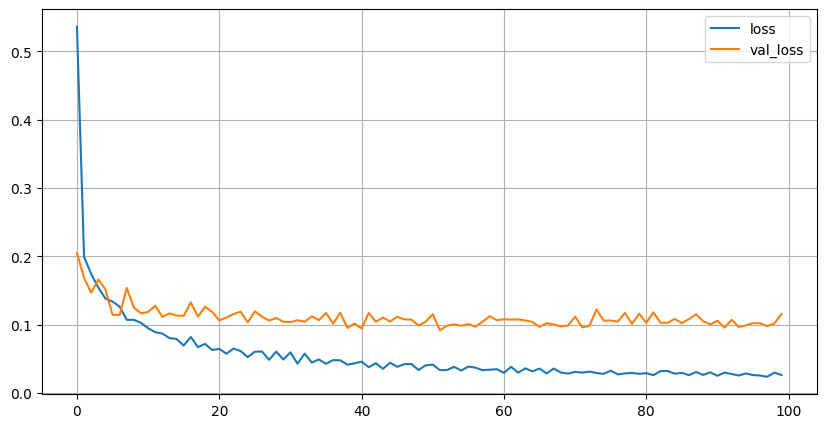

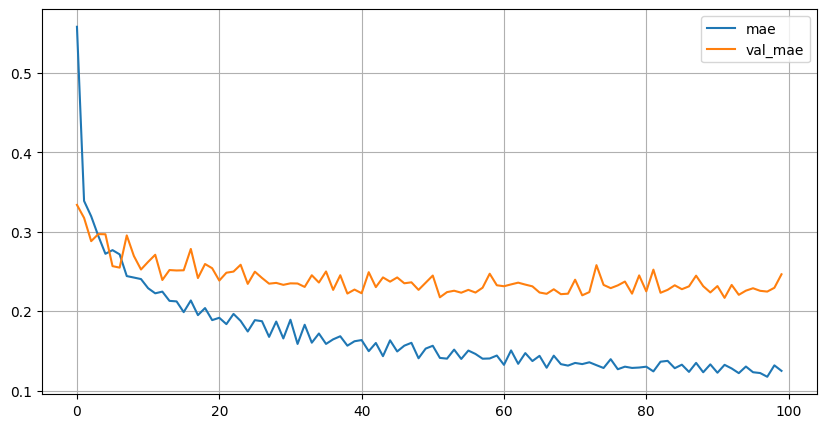

Epoch 1/100
12/12 [==============================] - 1s 33ms/step - loss: 0.0241 - mae: 0.1189 - val_loss: 0.0957 - val_mae: 0.2179
Epoch 2/100
12/12 [==============================] - 0s 18ms/step - loss: 0.0215 - mae: 0.1122 - val_loss: 0.0943 - val_mae: 0.2160
Epoch 3/100
12/12 [==============================] - 0s 16ms/step - loss: 0.0210 - mae: 0.1107 - val_loss: 0.0932 - val_mae: 0.2149
Epoch 4/100
12/12 [==============================] - 0s 17ms/step - loss: 0.0200 - mae: 0.1091 - val_loss: 0.0939 - val_mae: 0.2152
Epoch 5/100
12/12 [==============================] - 0s 16ms/step - loss: 0.0189 - mae: 0.1058 - val_loss: 0.0941 - val_mae: 0.2157
Epoch 6/100
12/12 [==============================] - 0s 17ms/step - loss: 0.0193 - mae: 0.1074 - val_loss: 0.0944 - val_mae: 0.2155
Epoch 7/100
12/12 [==============================] - 0s 18ms/step - loss: 0.0196 - mae: 0.1088 - val_loss: 0.0944 - val_mae: 0.2160
Epoch 8/100
12/12 [==============================] - 0s 19ms/step - loss: 0.

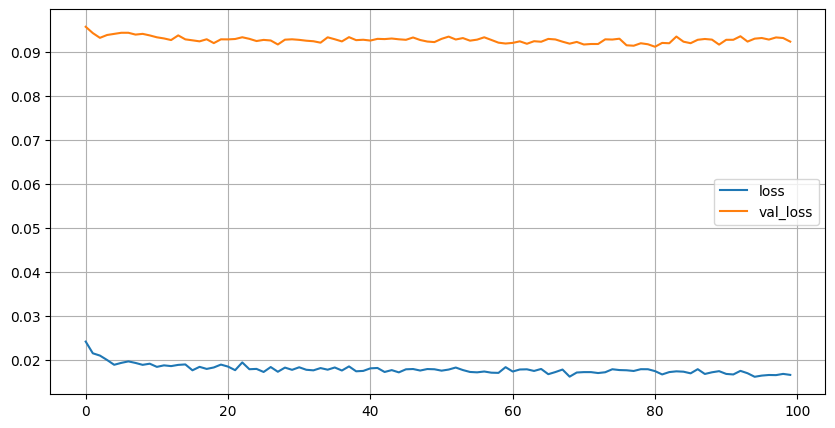

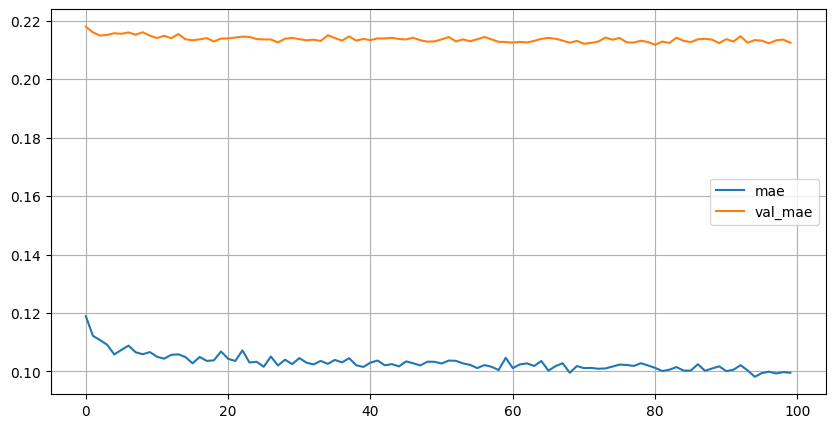

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6635.3 : 5438.7 :2.21e-02:6.66e-02|  1.5   :  61.3  :1.74e-04:2.93e-04|  0.0%  :  1.1%  :  0.8%  :  0.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=RMSprop(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/100
12/12 [==============================] - 2s 49ms/step - loss: 0.5214 - mae: 0.5563 - val_loss: 0.2160 - val_mae: 0.3674
Epoch 2/100
12/12 [==============================] - 0s 28ms/step - loss: 0.2023 - mae: 0.3426 - val_loss: 0.2723 - val_mae: 0.4137
Epoch 3/100
12/12 [==============================] - 0s 31ms/step - loss: 0.2068 - mae: 0.3481 - val_loss: 0.1503 - val_mae: 0.2978
Epoch 4/100
12/12 [==============================] - 0s 30ms/step - loss: 0.1705 - mae: 0.3163 - val_loss: 0.1424 - val_mae: 0.2850
Epoch 5/100
12/12 [==============================] - 0s 27ms/step - loss: 0.1558 - mae: 0.2985 - val_loss: 0.1341 - val_mae: 0.2691
Epoch 6/100
12/12 [==============================] - 0s 25ms/step - loss: 0.1513 - mae: 0.2914 - val_loss: 0.1201 - val_mae: 0.2576
Epoch 7/100
12/12 [==============================] - 0s 32ms/step - loss: 0.1355 - mae: 0.2769 - val_loss: 0.1403 - val_mae: 0.2865
Epoch 8/100
12/12 [==============================] - 0s 36ms/step - loss: 0.

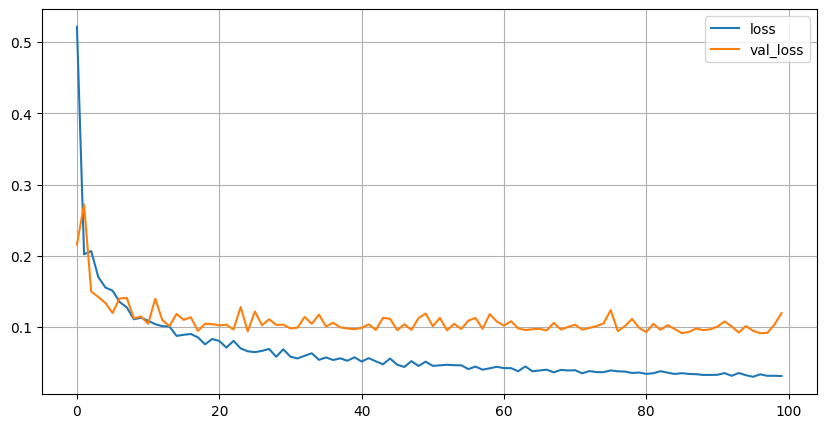

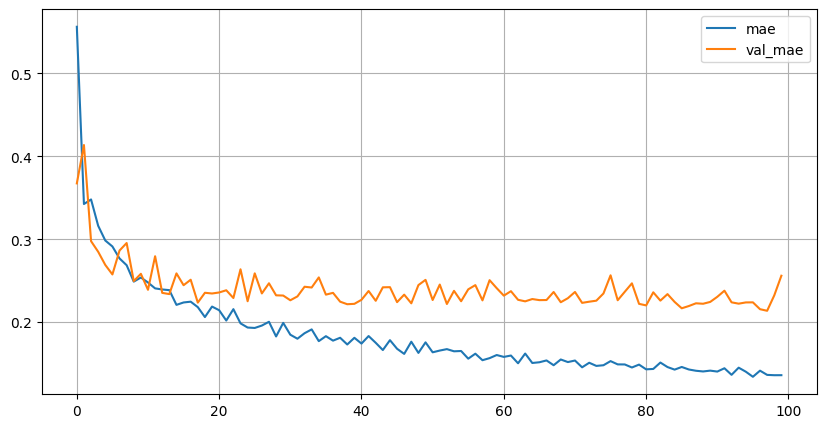

Epoch 1/100
12/12 [==============================] - 1s 26ms/step - loss: 0.0387 - mae: 0.1506 - val_loss: 0.0958 - val_mae: 0.2158
Epoch 2/100
12/12 [==============================] - 0s 15ms/step - loss: 0.0324 - mae: 0.1379 - val_loss: 0.0908 - val_mae: 0.2162
Epoch 3/100
12/12 [==============================] - 0s 16ms/step - loss: 0.0304 - mae: 0.1335 - val_loss: 0.1015 - val_mae: 0.2283
Epoch 4/100
12/12 [==============================] - 0s 14ms/step - loss: 0.0317 - mae: 0.1378 - val_loss: 0.0937 - val_mae: 0.2167
Epoch 5/100
12/12 [==============================] - 0s 14ms/step - loss: 0.0292 - mae: 0.1297 - val_loss: 0.0981 - val_mae: 0.2203
Epoch 6/100
12/12 [==============================] - 0s 15ms/step - loss: 0.0326 - mae: 0.1379 - val_loss: 0.0961 - val_mae: 0.2253
Epoch 7/100
12/12 [==============================] - 0s 13ms/step - loss: 0.0323 - mae: 0.1371 - val_loss: 0.0921 - val_mae: 0.2197
Epoch 8/100
12/12 [==============================] - 0s 13ms/step - loss: 0.

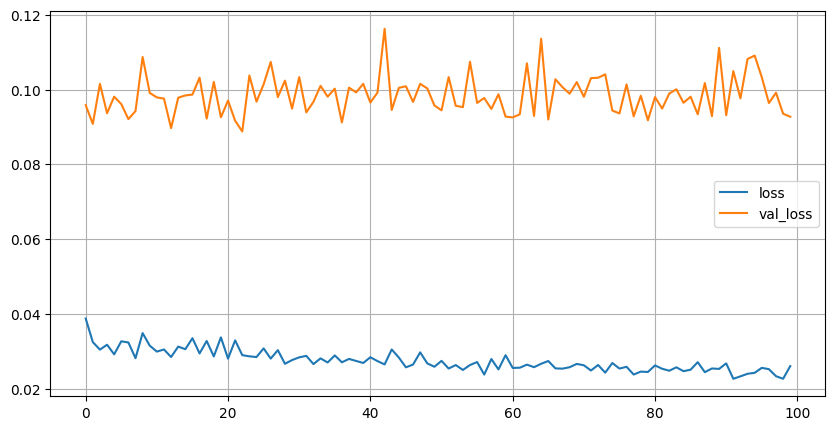

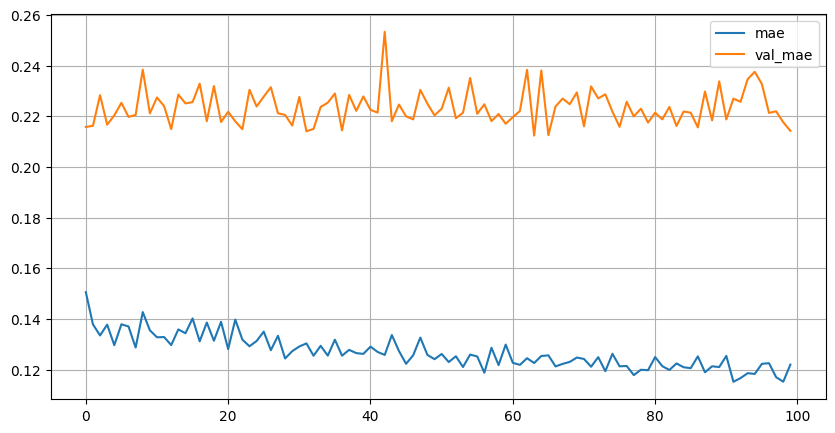

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6635.7 : 5392.0 :2.22e-02:6.70e-02|  1.0   : 108.0  :1.33e-04:6.97e-04|  0.0%  :  2.0%  :  0.6%  :  1.1%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
# model.add(Dense(32, activation='relu'))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

### Best model

Epoch 1/50
46/46 [==============================] - 2s 13ms/step - loss: 0.7132 - mae: 0.5996 - val_loss: 0.2834 - val_mae: 0.4100
Epoch 2/50
46/46 [==============================] - 0s 10ms/step - loss: 0.3105 - mae: 0.4266 - val_loss: 0.1825 - val_mae: 0.3333
Epoch 3/50
46/46 [==============================] - 1s 13ms/step - loss: 0.2500 - mae: 0.3814 - val_loss: 0.2183 - val_mae: 0.3617
Epoch 4/50
46/46 [==============================] - 1s 15ms/step - loss: 0.2448 - mae: 0.3750 - val_loss: 0.2046 - val_mae: 0.3525
Epoch 5/50
46/46 [==============================] - 1s 15ms/step - loss: 0.2604 - mae: 0.3860 - val_loss: 0.1877 - val_mae: 0.3404
Epoch 6/50
46/46 [==============================] - 1s 12ms/step - loss: 0.2462 - mae: 0.3805 - val_loss: 0.1696 - val_mae: 0.3120
Epoch 7/50
46/46 [==============================] - 0s 11ms/step - loss: 0.2245 - mae: 0.3604 - val_loss: 0.1869 - val_mae: 0.3380
Epoch 8/50
46/46 [==============================] - 0s 11ms/step - loss: 0.2174 - m

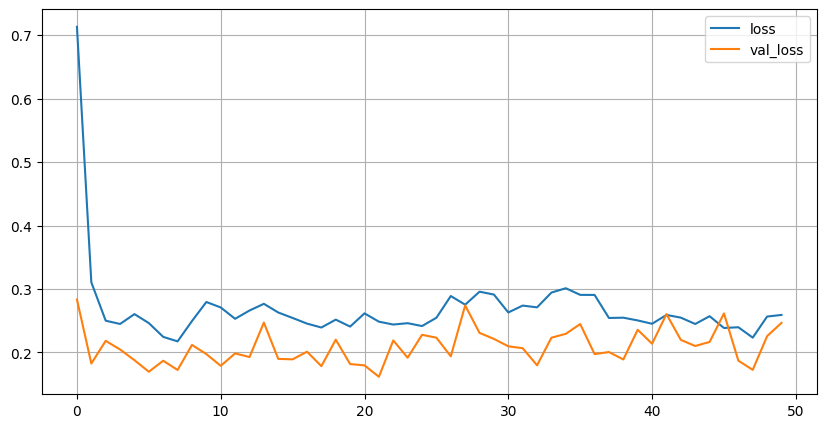

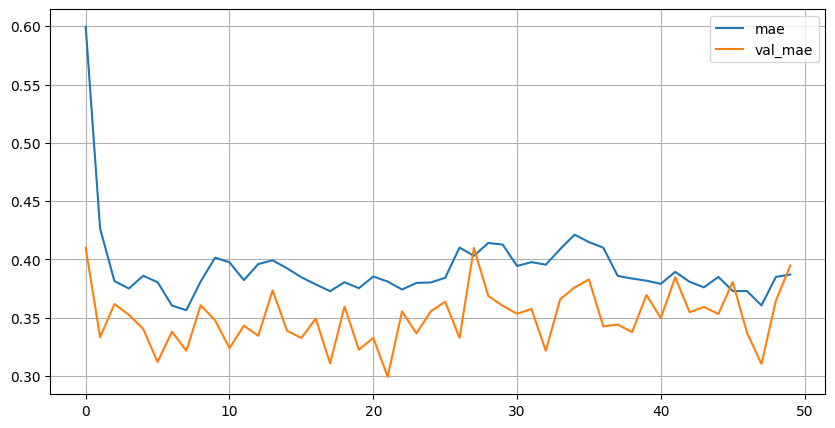

Epoch 1/50
46/46 [==============================] - 1s 14ms/step - loss: 0.2085 - mae: 0.3497 - val_loss: 0.1625 - val_mae: 0.3086
Epoch 2/50
46/46 [==============================] - 1s 11ms/step - loss: 0.1825 - mae: 0.3240 - val_loss: 0.1531 - val_mae: 0.3007
Epoch 3/50
46/46 [==============================] - 1s 11ms/step - loss: 0.1705 - mae: 0.3163 - val_loss: 0.1509 - val_mae: 0.2963
Epoch 4/50
46/46 [==============================] - 1s 11ms/step - loss: 0.1668 - mae: 0.3093 - val_loss: 0.1412 - val_mae: 0.2877
Epoch 5/50
46/46 [==============================] - 0s 11ms/step - loss: 0.1666 - mae: 0.3067 - val_loss: 0.1380 - val_mae: 0.2854
Epoch 6/50
46/46 [==============================] - 1s 11ms/step - loss: 0.1565 - mae: 0.3025 - val_loss: 0.1337 - val_mae: 0.2748
Epoch 7/50
46/46 [==============================] - 0s 11ms/step - loss: 0.1593 - mae: 0.3034 - val_loss: 0.1371 - val_mae: 0.2820
Epoch 8/50
46/46 [==============================] - 1s 11ms/step - loss: 0.1470 - m

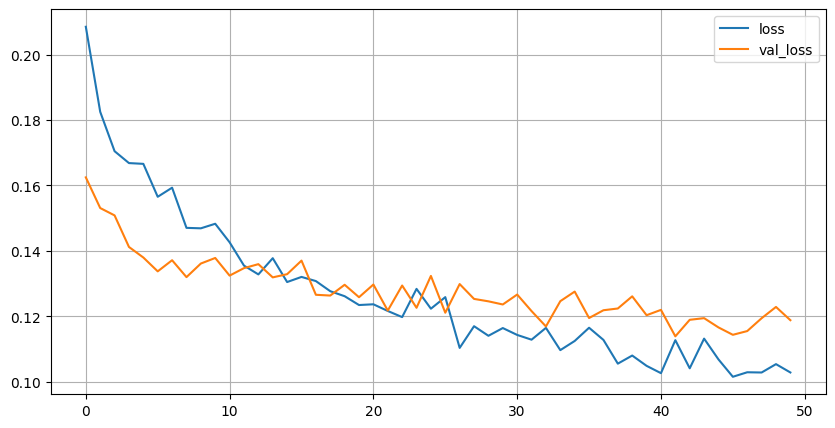

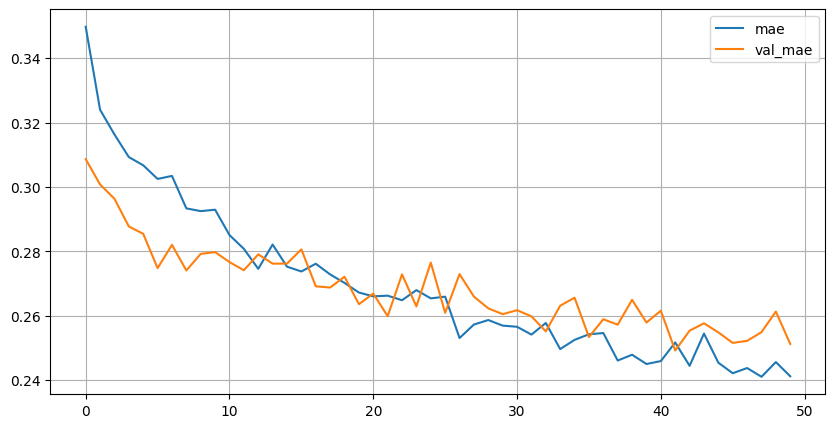

Epoch 1/50
46/46 [==============================] - 2s 14ms/step - loss: 0.0968 - mae: 0.2359 - val_loss: 0.1178 - val_mae: 0.2519
Epoch 2/50
46/46 [==============================] - 1s 12ms/step - loss: 0.1012 - mae: 0.2395 - val_loss: 0.1186 - val_mae: 0.2532
Epoch 3/50
46/46 [==============================] - 1s 11ms/step - loss: 0.0966 - mae: 0.2364 - val_loss: 0.1164 - val_mae: 0.2503
Epoch 4/50
46/46 [==============================] - 1s 11ms/step - loss: 0.0986 - mae: 0.2372 - val_loss: 0.1164 - val_mae: 0.2498
Epoch 5/50
46/46 [==============================] - 1s 13ms/step - loss: 0.1005 - mae: 0.2372 - val_loss: 0.1145 - val_mae: 0.2483
Epoch 6/50
46/46 [==============================] - 1s 11ms/step - loss: 0.0962 - mae: 0.2344 - val_loss: 0.1186 - val_mae: 0.2543
Epoch 7/50
46/46 [==============================] - 1s 11ms/step - loss: 0.0959 - mae: 0.2338 - val_loss: 0.1174 - val_mae: 0.2522
Epoch 8/50
46/46 [==============================] - 1s 12ms/step - loss: 0.0939 - m

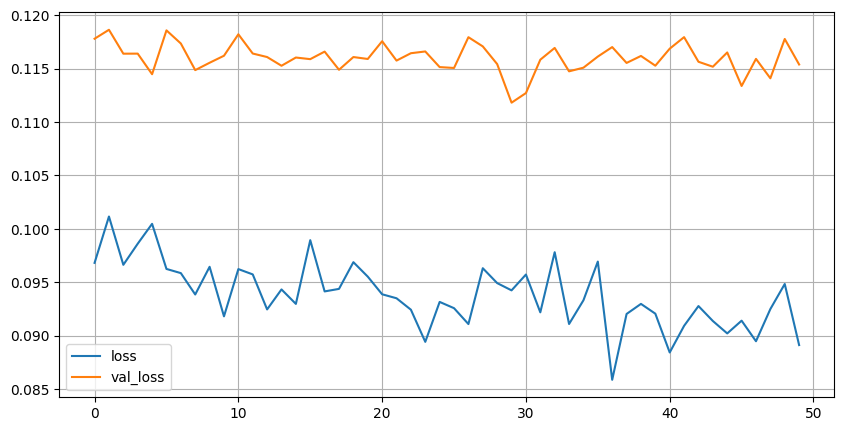

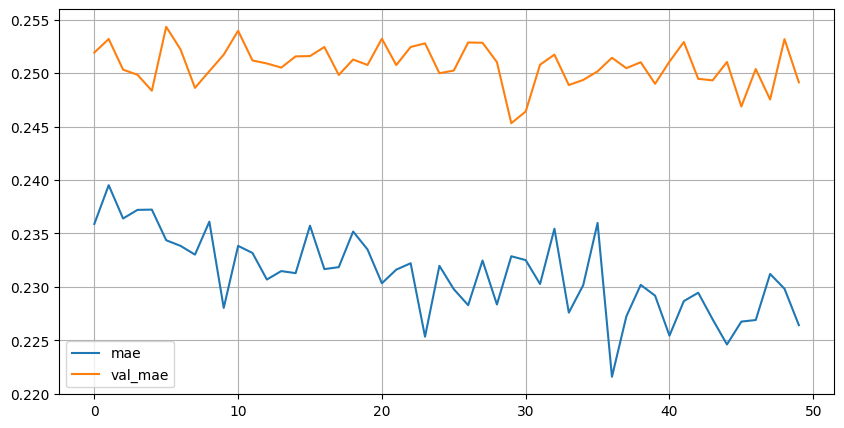

10/10 [==============================] - 0s 4ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6575.5 : 5286.2 :2.20e-02:6.63e-02|  61.2  : 213.8  :2.48e-04:1.08e-05|  0.9%  :  3.9%  :  1.1%  :  0.0%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(256, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-2, 1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=32, epochs=50, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

Epoch 1/50
46/46 [==============================] - 1s 14ms/step - loss: 3336491.7500 - mae: 997.4185 - val_loss: 319131.2812 - val_mae: 353.4876
Epoch 2/50
46/46 [==============================] - 1s 11ms/step - loss: 336603.4688 - mae: 355.8411 - val_loss: 190195.4531 - val_mae: 261.9460
Epoch 3/50
46/46 [==============================] - 1s 12ms/step - loss: 233077.6094 - mae: 285.2880 - val_loss: 187216.4688 - val_mae: 253.0442
Epoch 4/50
46/46 [==============================] - 1s 11ms/step - loss: 213819.8125 - mae: 263.6245 - val_loss: 156002.0156 - val_mae: 227.2006
Epoch 5/50
46/46 [==============================] - 0s 11ms/step - loss: 188009.6562 - mae: 244.0211 - val_loss: 142029.2656 - val_mae: 210.5647
Epoch 6/50
46/46 [==============================] - 1s 11ms/step - loss: 182212.3438 - mae: 238.2632 - val_loss: 147489.2656 - val_mae: 210.1567
Epoch 7/50
46/46 [==============================] - 1s 12ms/step - loss: 169236.7969 - mae: 228.4072 - val_loss: 116348.4219 - va

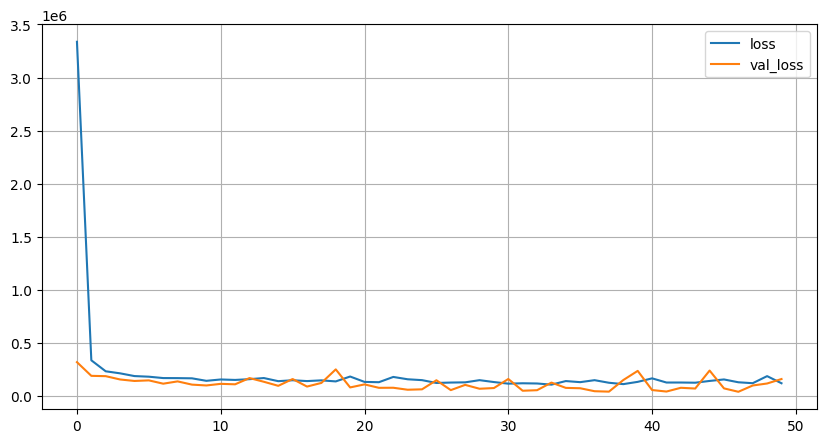

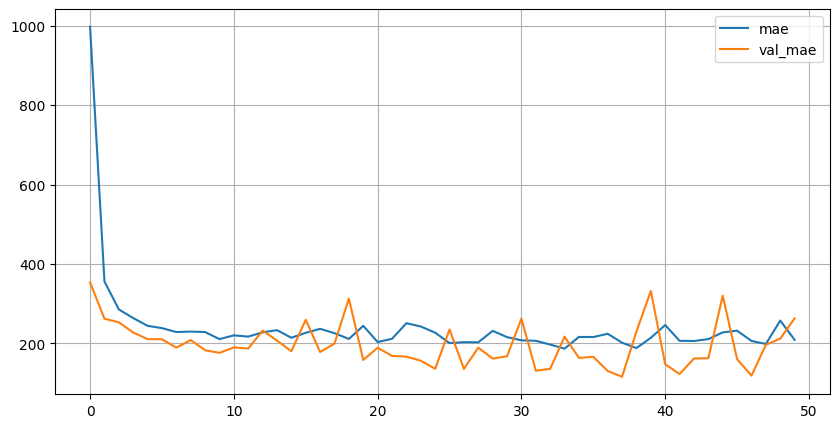

Epoch 1/50
46/46 [==============================] - 1s 15ms/step - loss: 98960.2188 - mae: 183.7922 - val_loss: 26492.2188 - val_mae: 92.1467
Epoch 2/50
46/46 [==============================] - 1s 11ms/step - loss: 81339.5703 - mae: 162.6931 - val_loss: 25751.7832 - val_mae: 88.8257
Epoch 3/50
46/46 [==============================] - 0s 10ms/step - loss: 83329.4922 - mae: 161.6430 - val_loss: 23156.9238 - val_mae: 82.9165
Epoch 4/50
46/46 [==============================] - 1s 11ms/step - loss: 79950.5625 - mae: 157.8162 - val_loss: 23721.4336 - val_mae: 85.4430
Epoch 5/50
46/46 [==============================] - 1s 11ms/step - loss: 77208.8672 - mae: 154.6335 - val_loss: 23395.9688 - val_mae: 84.9053
Epoch 6/50
46/46 [==============================] - 1s 13ms/step - loss: 85160.0078 - mae: 161.2229 - val_loss: 24715.8770 - val_mae: 86.5917
Epoch 7/50
46/46 [==============================] - 1s 15ms/step - loss: 84437.8594 - mae: 160.8565 - val_loss: 28481.3906 - val_mae: 93.5198
Epoch 

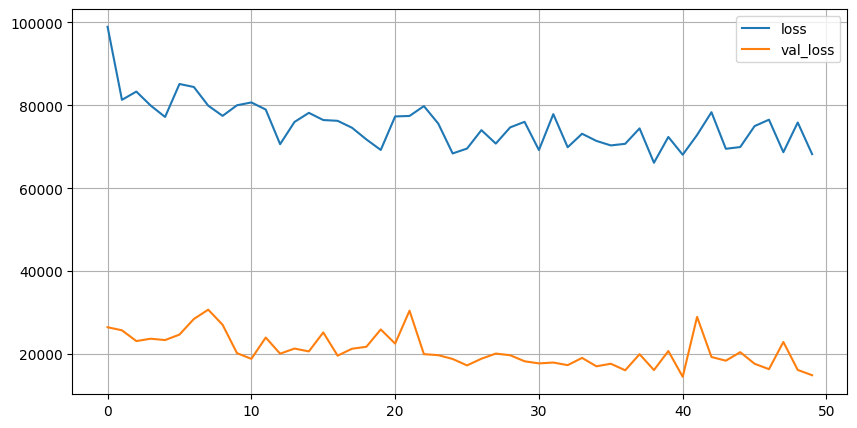

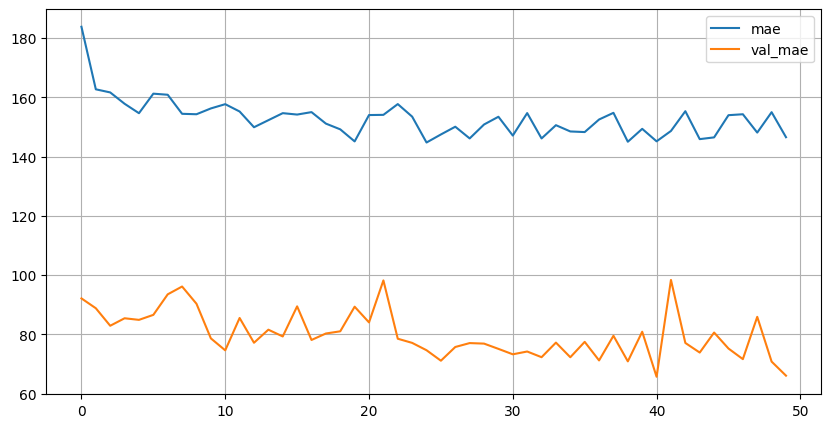

Epoch 1/50
46/46 [==============================] - 1s 14ms/step - loss: 66785.5859 - mae: 144.8147 - val_loss: 13981.5244 - val_mae: 64.9395
Epoch 2/50
46/46 [==============================] - 1s 12ms/step - loss: 67942.8672 - mae: 144.0471 - val_loss: 14125.4854 - val_mae: 64.8654
Epoch 3/50
46/46 [==============================] - 1s 12ms/step - loss: 64726.2773 - mae: 140.8940 - val_loss: 14230.6377 - val_mae: 65.1855
Epoch 4/50
46/46 [==============================] - 1s 12ms/step - loss: 66980.7969 - mae: 143.8678 - val_loss: 14210.8076 - val_mae: 64.9732
Epoch 5/50
46/46 [==============================] - 1s 11ms/step - loss: 64179.6055 - mae: 138.9816 - val_loss: 14086.3467 - val_mae: 65.1944
Epoch 6/50
46/46 [==============================] - 1s 11ms/step - loss: 67685.4844 - mae: 144.0657 - val_loss: 14181.1650 - val_mae: 65.3846
Epoch 7/50
46/46 [==============================] - 1s 12ms/step - loss: 66352.7266 - mae: 143.5439 - val_loss: 14096.4502 - val_mae: 64.9163
Epoch 

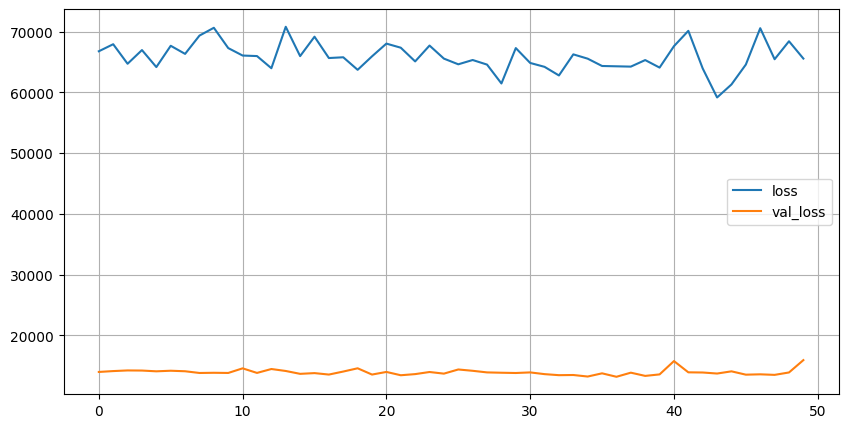

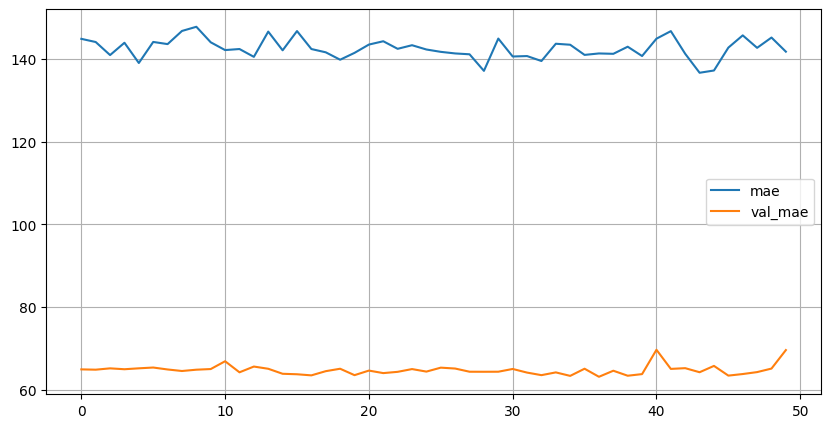

10/10 [==============================] - 0s 2ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6915.7 : 5642.3 :6.23e-02:9.21e-02| 278.9  : 142.3  :4.00e-02:2.59e-02|  4.2%  :  2.6%  : 179.5% : 39.1%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(256, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-2, 1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train, batch_size=32, epochs=50, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = model.predict(x_scaler.transform(x_test))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

Epoch 1/100
23/23 [==============================] - 3s 39ms/step - loss: 0.3356 - mae: 0.4291 - val_loss: 0.1741 - val_mae: 0.3211
Epoch 2/100
23/23 [==============================] - 1s 31ms/step - loss: 0.1464 - mae: 0.2835 - val_loss: 0.1231 - val_mae: 0.2621
Epoch 3/100
23/23 [==============================] - 0s 15ms/step - loss: 0.1085 - mae: 0.2412 - val_loss: 0.1087 - val_mae: 0.2450
Epoch 4/100
23/23 [==============================] - 0s 14ms/step - loss: 0.0898 - mae: 0.2202 - val_loss: 0.1048 - val_mae: 0.2352
Epoch 5/100
23/23 [==============================] - 0s 12ms/step - loss: 0.0780 - mae: 0.2053 - val_loss: 0.1008 - val_mae: 0.2338
Epoch 6/100
23/23 [==============================] - 0s 12ms/step - loss: 0.0700 - mae: 0.1935 - val_loss: 0.1003 - val_mae: 0.2324
Epoch 7/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0626 - mae: 0.1847 - val_loss: 0.0966 - val_mae: 0.2270
Epoch 8/100
23/23 [==============================] - 0s 15ms/step - loss: 0.

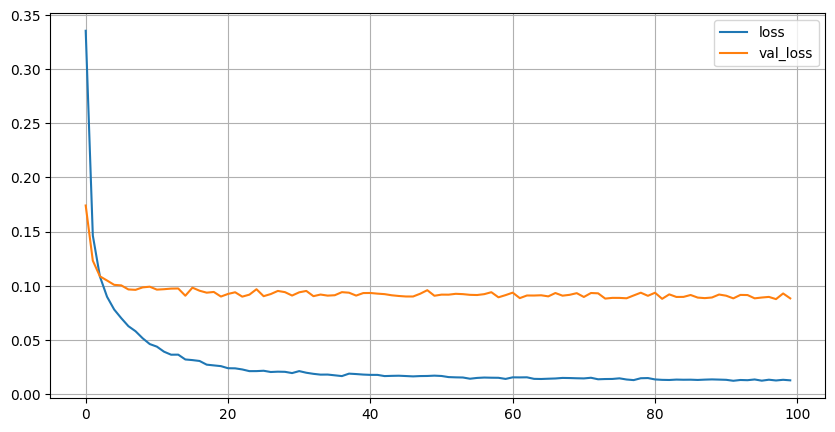

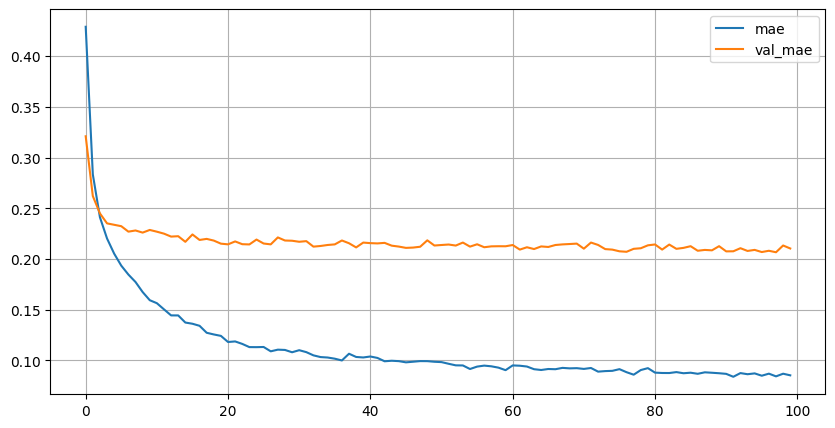

Epoch 1/100
23/23 [==============================] - 1s 21ms/step - loss: 0.0104 - mae: 0.0779 - val_loss: 0.0875 - val_mae: 0.2064
Epoch 2/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0092 - mae: 0.0729 - val_loss: 0.0863 - val_mae: 0.2044
Epoch 3/100
23/23 [==============================] - 0s 15ms/step - loss: 0.0087 - mae: 0.0716 - val_loss: 0.0869 - val_mae: 0.2046
Epoch 4/100
23/23 [==============================] - 0s 14ms/step - loss: 0.0090 - mae: 0.0721 - val_loss: 0.0859 - val_mae: 0.2039
Epoch 5/100
23/23 [==============================] - 0s 15ms/step - loss: 0.0085 - mae: 0.0701 - val_loss: 0.0863 - val_mae: 0.2042
Epoch 6/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0082 - mae: 0.0694 - val_loss: 0.0867 - val_mae: 0.2041
Epoch 7/100
23/23 [==============================] - 0s 13ms/step - loss: 0.0079 - mae: 0.0682 - val_loss: 0.0856 - val_mae: 0.2040
Epoch 8/100
23/23 [==============================] - 0s 12ms/step - loss: 0.

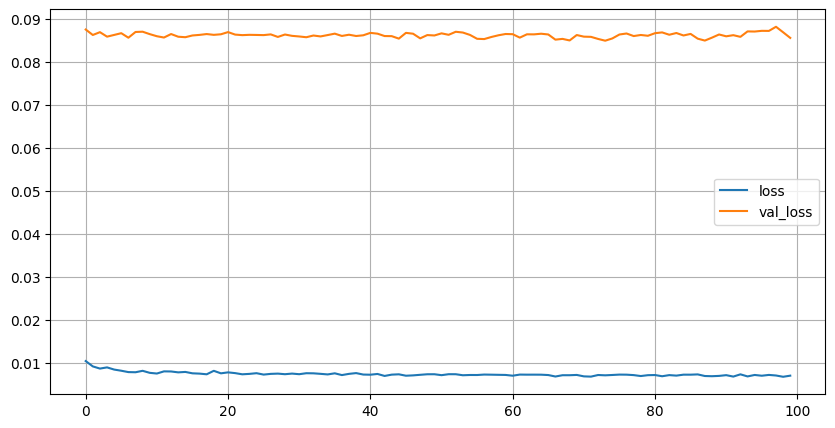

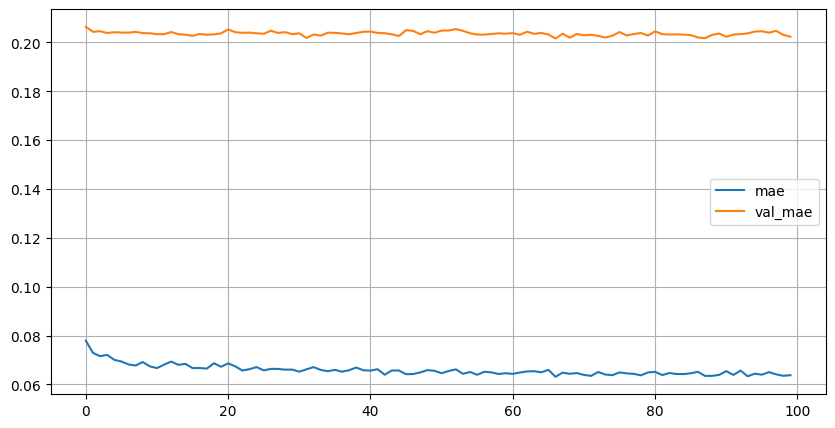

10/10 [==============================] - 0s 4ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6700.5 : 5519.3 :2.22e-02:6.63e-02|  63.8  :  19.3  :9.60e-05:2.87e-05|  1.0%  :  0.4%  :  0.4%  :  0.0%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

Epoch 1/100
23/23 [==============================] - 4s 39ms/step - loss: 0.3472 - mae: 0.4361 - val_loss: 0.1785 - val_mae: 0.3115
Epoch 2/100
23/23 [==============================] - 0s 17ms/step - loss: 0.1517 - mae: 0.2894 - val_loss: 0.1174 - val_mae: 0.2582
Epoch 3/100
23/23 [==============================] - 0s 18ms/step - loss: 0.1130 - mae: 0.2456 - val_loss: 0.1073 - val_mae: 0.2422
Epoch 4/100
23/23 [==============================] - 0s 17ms/step - loss: 0.0898 - mae: 0.2189 - val_loss: 0.1019 - val_mae: 0.2348
Epoch 5/100
23/23 [==============================] - 0s 19ms/step - loss: 0.0800 - mae: 0.2061 - val_loss: 0.1004 - val_mae: 0.2321
Epoch 6/100
23/23 [==============================] - 0s 17ms/step - loss: 0.0718 - mae: 0.1948 - val_loss: 0.0935 - val_mae: 0.2233
Epoch 7/100
23/23 [==============================] - 0s 17ms/step - loss: 0.0637 - mae: 0.1854 - val_loss: 0.0986 - val_mae: 0.2301
Epoch 8/100
23/23 [==============================] - 0s 18ms/step - loss: 0.

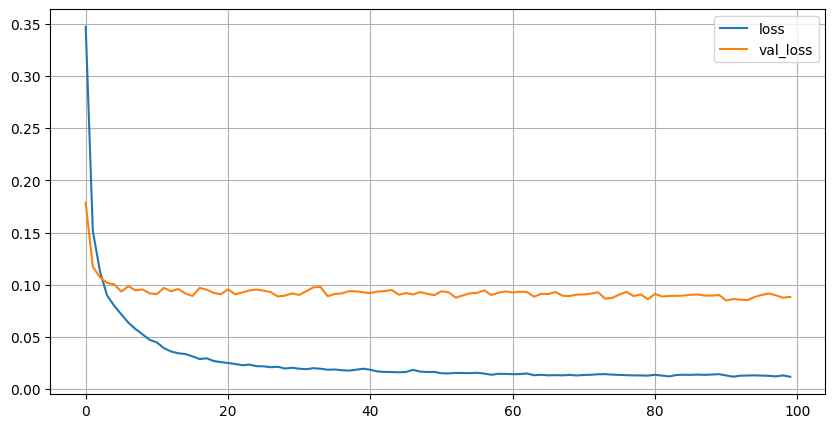

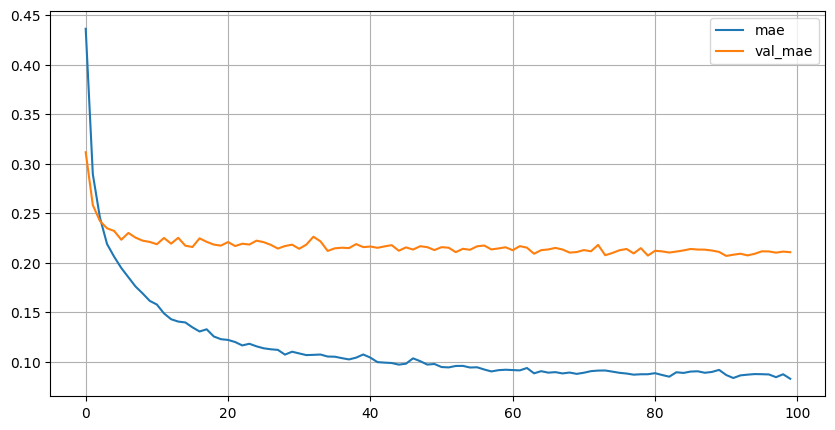

Epoch 1/100
23/23 [==============================] - 1s 25ms/step - loss: 0.0100 - mae: 0.0763 - val_loss: 0.0867 - val_mae: 0.2056
Epoch 2/100
23/23 [==============================] - 1s 26ms/step - loss: 0.0091 - mae: 0.0728 - val_loss: 0.0863 - val_mae: 0.2050
Epoch 3/100
23/23 [==============================] - 1s 26ms/step - loss: 0.0090 - mae: 0.0730 - val_loss: 0.0851 - val_mae: 0.2041
Epoch 4/100
23/23 [==============================] - 1s 27ms/step - loss: 0.0088 - mae: 0.0721 - val_loss: 0.0859 - val_mae: 0.2058
Epoch 5/100
23/23 [==============================] - 1s 30ms/step - loss: 0.0086 - mae: 0.0705 - val_loss: 0.0847 - val_mae: 0.2037
Epoch 6/100
23/23 [==============================] - 1s 24ms/step - loss: 0.0082 - mae: 0.0698 - val_loss: 0.0846 - val_mae: 0.2040
Epoch 7/100
23/23 [==============================] - 0s 17ms/step - loss: 0.0085 - mae: 0.0704 - val_loss: 0.0854 - val_mae: 0.2048
Epoch 8/100
23/23 [==============================] - 0s 18ms/step - loss: 0.

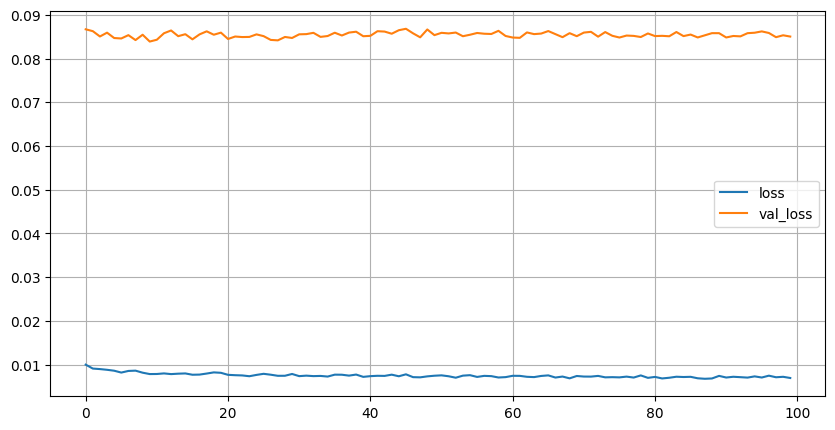

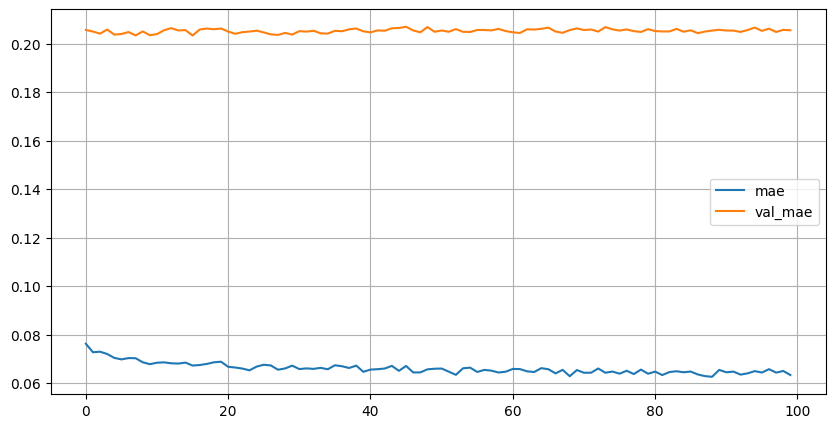

10/10 [==============================] - 0s 3ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6695.3 : 5507.8 :2.22e-02:6.66e-02|  58.6  :  7.8   :8.58e-05:3.36e-04|  0.9%  :  0.1%  :  0.4%  :  0.5%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

In [ ]:
model = Sequential()

model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

Epoch 1/100
23/23 [==============================] - 3s 37ms/step - loss: 0.3783 - mae: 0.4600 - val_loss: 0.1616 - val_mae: 0.3042
Epoch 2/100
23/23 [==============================] - 0s 16ms/step - loss: 0.1583 - mae: 0.3004 - val_loss: 0.1309 - val_mae: 0.2719
Epoch 3/100
23/23 [==============================] - 0s 17ms/step - loss: 0.1244 - mae: 0.2615 - val_loss: 0.1179 - val_mae: 0.2596
Epoch 4/100
23/23 [==============================] - 0s 16ms/step - loss: 0.1062 - mae: 0.2419 - val_loss: 0.1116 - val_mae: 0.2491
Epoch 5/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0938 - mae: 0.2267 - val_loss: 0.1053 - val_mae: 0.2358
Epoch 6/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0838 - mae: 0.2131 - val_loss: 0.0995 - val_mae: 0.2332
Epoch 7/100
23/23 [==============================] - 0s 16ms/step - loss: 0.0802 - mae: 0.2108 - val_loss: 0.1040 - val_mae: 0.2365
Epoch 8/100
23/23 [==============================] - 0s 22ms/step - loss: 0.

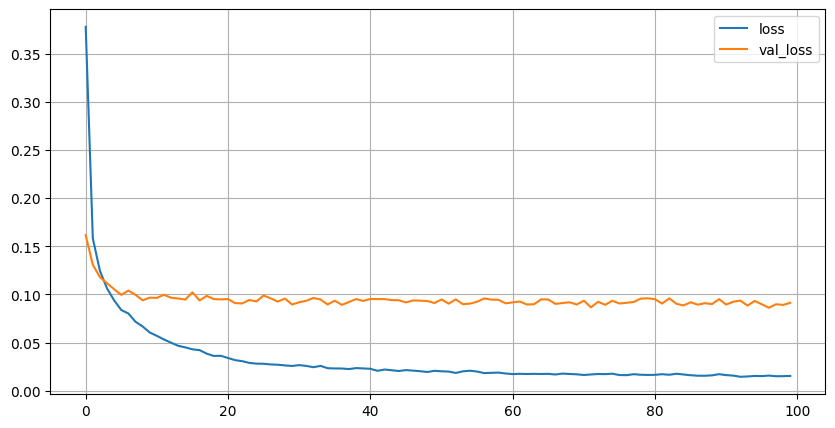

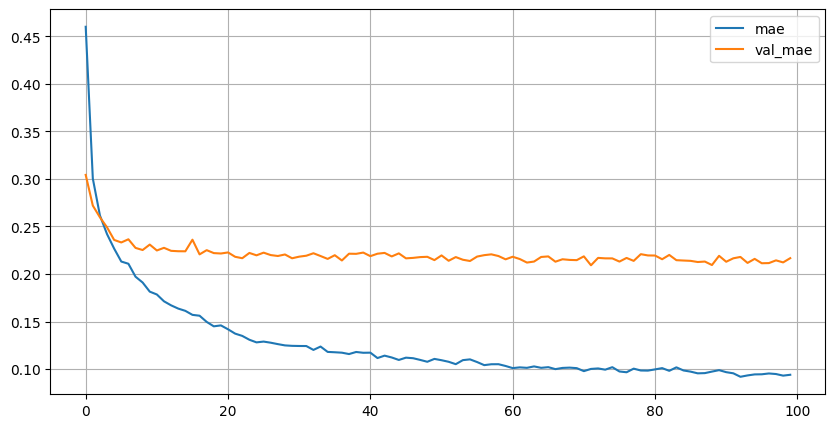

Epoch 1/100
23/23 [==============================] - 1s 17ms/step - loss: 0.0134 - mae: 0.0888 - val_loss: 0.0873 - val_mae: 0.2110
Epoch 2/100
23/23 [==============================] - 0s 12ms/step - loss: 0.0118 - mae: 0.0834 - val_loss: 0.0877 - val_mae: 0.2110
Epoch 3/100
23/23 [==============================] - 0s 11ms/step - loss: 0.0114 - mae: 0.0825 - val_loss: 0.0860 - val_mae: 0.2096
Epoch 4/100
23/23 [==============================] - 0s 12ms/step - loss: 0.0116 - mae: 0.0828 - val_loss: 0.0868 - val_mae: 0.2094
Epoch 5/100
23/23 [==============================] - 0s 10ms/step - loss: 0.0116 - mae: 0.0829 - val_loss: 0.0862 - val_mae: 0.2091
Epoch 6/100
23/23 [==============================] - 0s 11ms/step - loss: 0.0112 - mae: 0.0819 - val_loss: 0.0865 - val_mae: 0.2094
Epoch 7/100
23/23 [==============================] - 0s 11ms/step - loss: 0.0112 - mae: 0.0809 - val_loss: 0.0864 - val_mae: 0.2090
Epoch 8/100
23/23 [==============================] - 0s 11ms/step - loss: 0.

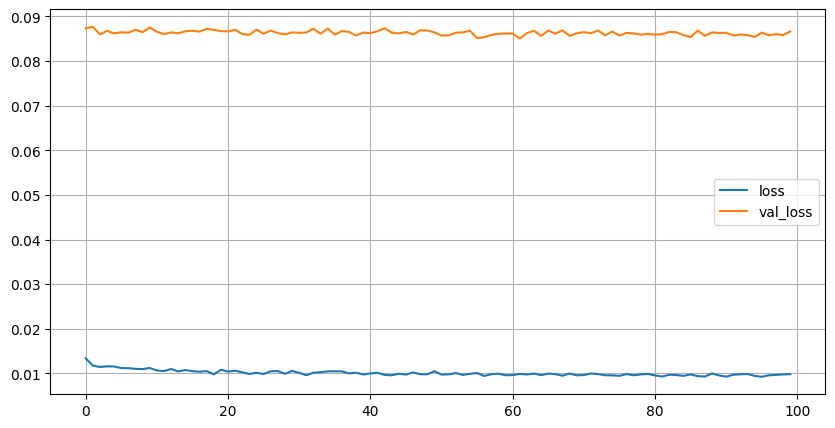

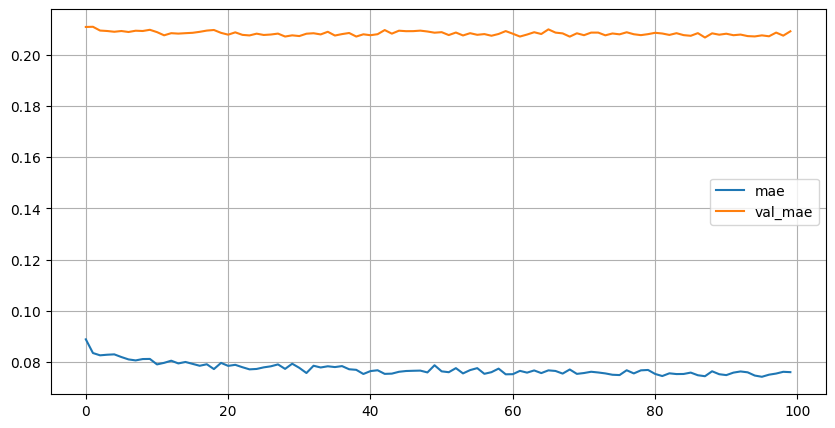

10/10 [==============================] - 0s 3ms/step
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ID  |               TEST                |               PRED                |                AE                 |              APE, %               |
-------------------------------------------------------------------------------------------------------------------------------------------------------
| ##  |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
-------------------------------------------------------------------------------------------------------------------------------------------------------
|  0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6694.8 : 5475.9 :2.22e-02:6.62e-02|  58.1  :  24.0  :9.56e-05:7.57e-05|  0.9%  :  0.4%  :  0.4%  :  0.1%  |
|  1  | 6214.0 : 3890.5 :2.21e-02:6

In [ ]:
model = Sequential()

model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))
# model.add(Dense(256, activation='relu'))
# model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=100, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=None, return_stats=False)

### Simple models


Epoch 1/200
12/12 [==============================] - 2s 39ms/step - loss: 0.4345 - mae: 0.4917 - val_loss: 0.2188 - val_mae: 0.3628
Epoch 2/200
12/12 [==============================] - 0s 26ms/step - loss: 0.1906 - mae: 0.3338 - val_loss: 0.1658 - val_mae: 0.3134
Epoch 3/200
12/12 [==============================] - 1s 43ms/step - loss: 0.1384 - mae: 0.2778 - val_loss: 0.1242 - val_mae: 0.2606
Epoch 4/200
12/12 [==============================] - 1s 41ms/step - loss: 0.1138 - mae: 0.2504 - val_loss: 0.1121 - val_mae: 0.2483
Epoch 5/200
12/12 [==============================] - 0s 34ms/step - loss: 0.0955 - mae: 0.2267 - val_loss: 0.1066 - val_mae: 0.2396
Epoch 6/200
12/12 [==============================] - 0s 33ms/step - loss: 0.0835 - mae: 0.2102 - val_loss: 0.0991 - val_mae: 0.2308
Epoch 7/200
12/12 [==============================] - 0s 29ms/step - loss: 0.0752 - mae: 0.1999 - val_loss: 0.0971 - val_mae: 0.2270
Epoch 8/200
12/12 [==============================] - 0s 26ms/step - loss: 0.

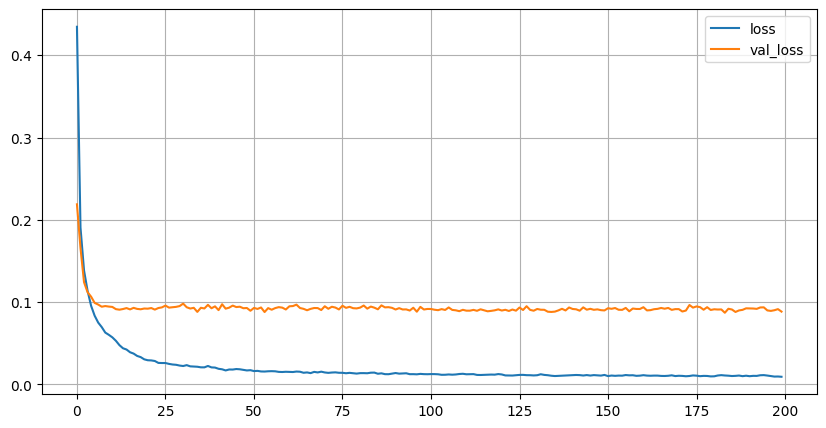

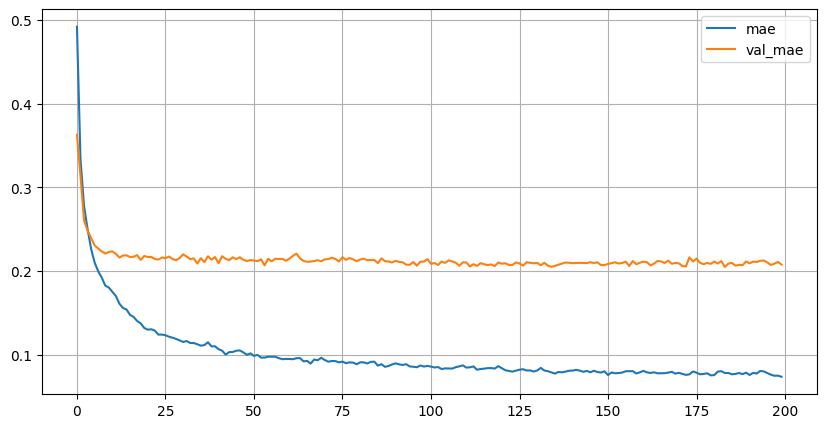

Epoch 1/200
12/12 [==============================] - 1s 31ms/step - loss: 0.0085 - mae: 0.0702 - val_loss: 0.0888 - val_mae: 0.2068
Epoch 2/200
12/12 [==============================] - 0s 20ms/step - loss: 0.0078 - mae: 0.0675 - val_loss: 0.0880 - val_mae: 0.2049
Epoch 3/200
12/12 [==============================] - 0s 22ms/step - loss: 0.0076 - mae: 0.0666 - val_loss: 0.0884 - val_mae: 0.2064
Epoch 4/200
12/12 [==============================] - 0s 19ms/step - loss: 0.0077 - mae: 0.0672 - val_loss: 0.0886 - val_mae: 0.2057
Epoch 5/200
12/12 [==============================] - 0s 19ms/step - loss: 0.0074 - mae: 0.0660 - val_loss: 0.0886 - val_mae: 0.2065
Epoch 6/200
12/12 [==============================] - 0s 18ms/step - loss: 0.0073 - mae: 0.0660 - val_loss: 0.0881 - val_mae: 0.2057
Epoch 7/200
12/12 [==============================] - 0s 18ms/step - loss: 0.0074 - mae: 0.0660 - val_loss: 0.0886 - val_mae: 0.2065
Epoch 8/200
12/12 [==============================] - 0s 20ms/step - loss: 0.

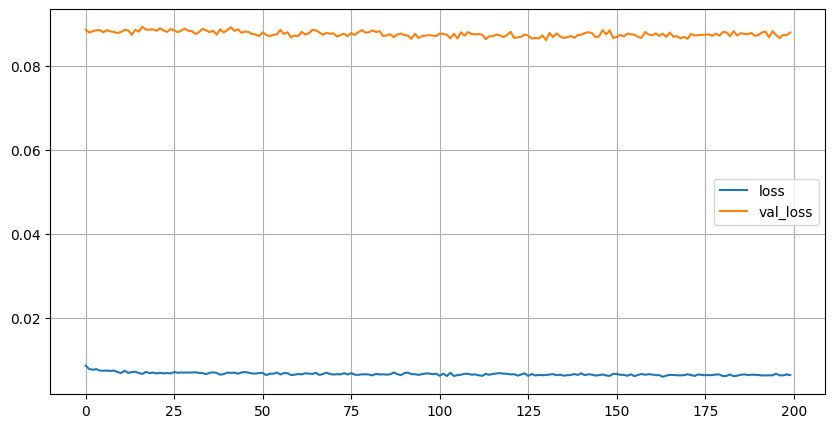

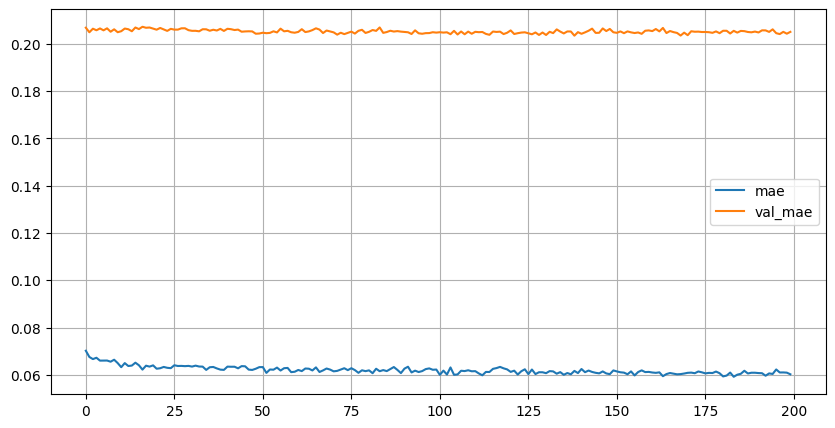

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6704.6 : 5461.2 :2.22e-02:6.60e-02|  67.8  :  38.8  :1.18e-04:2.71e-04|  1.0%  :  0.7%  :  0.5%  :  0.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=200, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/1000
12/12 [==============================] - 2s 40ms/step - loss: 0.4364 - mae: 0.4865 - val_loss: 0.1884 - val_mae: 0.3336
Epoch 2/1000
12/12 [==============================] - 0s 24ms/step - loss: 0.1813 - mae: 0.3208 - val_loss: 0.1620 - val_mae: 0.3091
Epoch 3/1000
12/12 [==============================] - 0s 26ms/step - loss: 0.1357 - mae: 0.2759 - val_loss: 0.1198 - val_mae: 0.2567
Epoch 4/1000
12/12 [==============================] - 0s 26ms/step - loss: 0.1114 - mae: 0.2457 - val_loss: 0.1119 - val_mae: 0.2483
Epoch 5/1000
12/12 [==============================] - 0s 29ms/step - loss: 0.0970 - mae: 0.2288 - val_loss: 0.1122 - val_mae: 0.2452
Epoch 6/1000
12/12 [==============================] - 0s 29ms/step - loss: 0.0843 - mae: 0.2128 - val_loss: 0.1012 - val_mae: 0.2338
Epoch 7/1000
12/12 [==============================] - 0s 27ms/step - loss: 0.0765 - mae: 0.2040 - val_loss: 0.1010 - val_mae: 0.2311
Epoch 8/1000
12/12 [==============================] - 0s 28ms/step - 

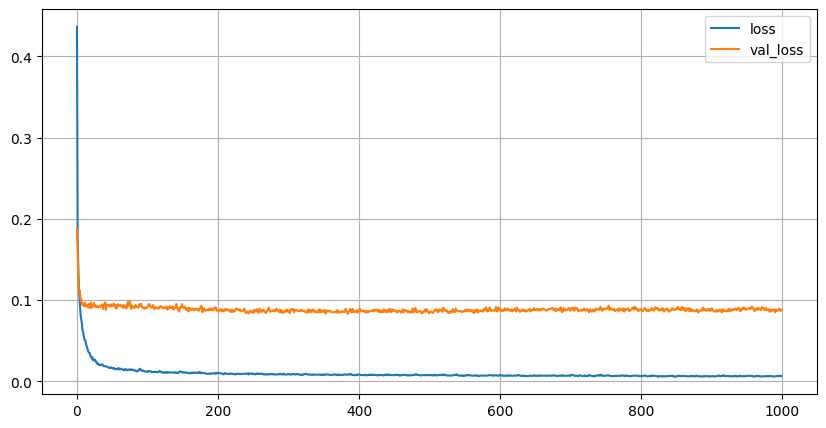

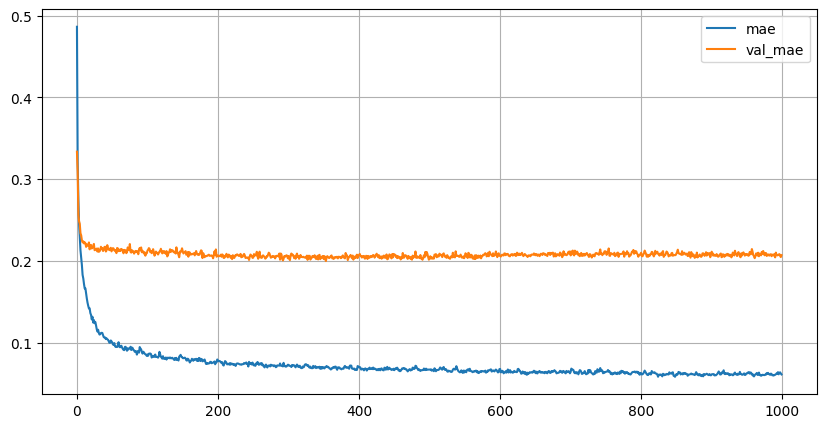

Epoch 1/1000
12/12 [==============================] - 1s 35ms/step - loss: 0.0058 - mae: 0.0580 - val_loss: 0.0871 - val_mae: 0.2054
Epoch 2/1000
12/12 [==============================] - 0s 27ms/step - loss: 0.0058 - mae: 0.0569 - val_loss: 0.0860 - val_mae: 0.2037
Epoch 3/1000
12/12 [==============================] - 0s 30ms/step - loss: 0.0051 - mae: 0.0540 - val_loss: 0.0866 - val_mae: 0.2046
Epoch 4/1000
12/12 [==============================] - 0s 28ms/step - loss: 0.0050 - mae: 0.0534 - val_loss: 0.0861 - val_mae: 0.2038
Epoch 5/1000
12/12 [==============================] - 0s 26ms/step - loss: 0.0048 - mae: 0.0525 - val_loss: 0.0864 - val_mae: 0.2041
Epoch 6/1000
12/12 [==============================] - 0s 24ms/step - loss: 0.0047 - mae: 0.0520 - val_loss: 0.0860 - val_mae: 0.2039
Epoch 7/1000
12/12 [==============================] - 0s 28ms/step - loss: 0.0048 - mae: 0.0530 - val_loss: 0.0860 - val_mae: 0.2041
Epoch 8/1000
12/12 [==============================] - 0s 24ms/step - 

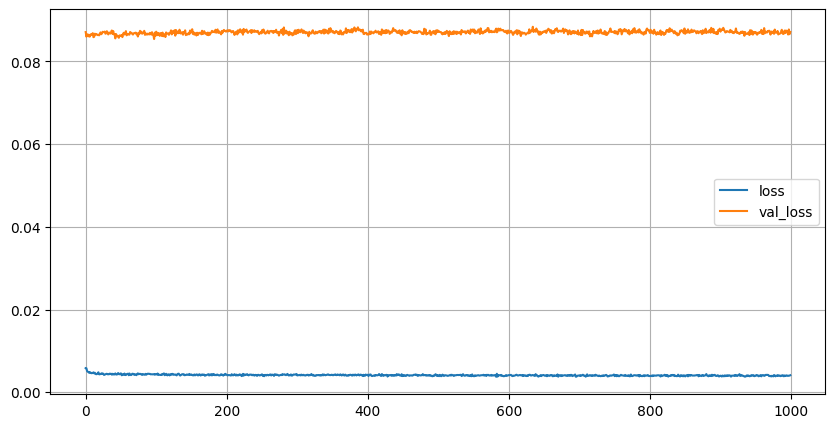

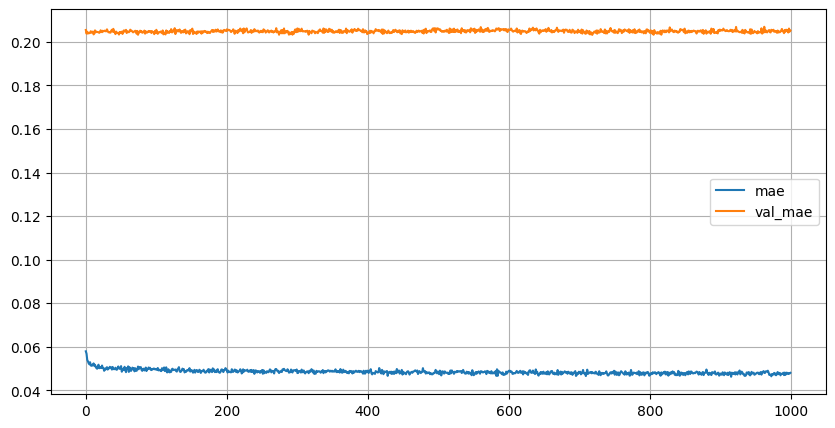

10/10 [==============================] - 0s 3ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6627.3 : 5428.8 :2.22e-02:6.64e-02|  9.4   :  71.2  :1.14e-04:1.09e-04|  0.1%  :  1.3%  :  0.5%  :  0.2%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=1000, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/1000
23/23 [==============================] - 3s 47ms/step - loss: 0.3592 - mae: 0.4446 - val_loss: 0.1582 - val_mae: 0.2975
Epoch 2/1000
23/23 [==============================] - 1s 33ms/step - loss: 0.1477 - mae: 0.2847 - val_loss: 0.1198 - val_mae: 0.2556
Epoch 3/1000
23/23 [==============================] - 1s 48ms/step - loss: 0.1096 - mae: 0.2399 - val_loss: 0.1081 - val_mae: 0.2418
Epoch 4/1000
23/23 [==============================] - 1s 26ms/step - loss: 0.0890 - mae: 0.2171 - val_loss: 0.1033 - val_mae: 0.2312
Epoch 5/1000
23/23 [==============================] - 1s 22ms/step - loss: 0.0822 - mae: 0.2086 - val_loss: 0.0960 - val_mae: 0.2270
Epoch 6/1000
23/23 [==============================] - 1s 23ms/step - loss: 0.0721 - mae: 0.1937 - val_loss: 0.1009 - val_mae: 0.2276
Epoch 7/1000
23/23 [==============================] - 0s 21ms/step - loss: 0.0633 - mae: 0.1834 - val_loss: 0.0933 - val_mae: 0.2226
Epoch 8/1000
23/23 [==============================] - 1s 22ms/step - 

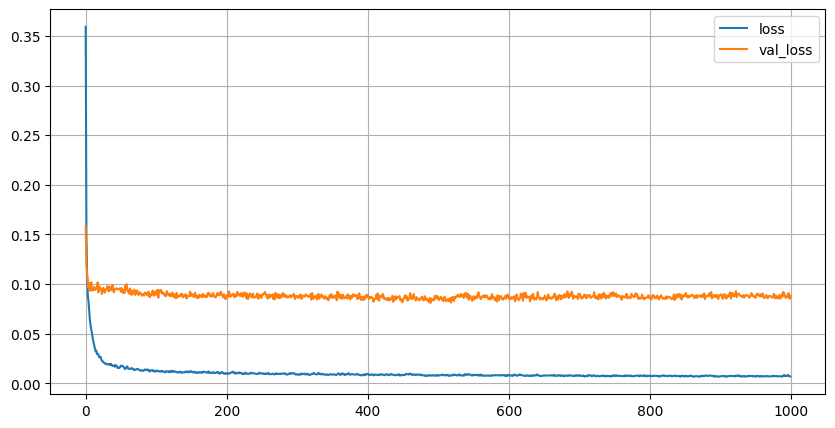

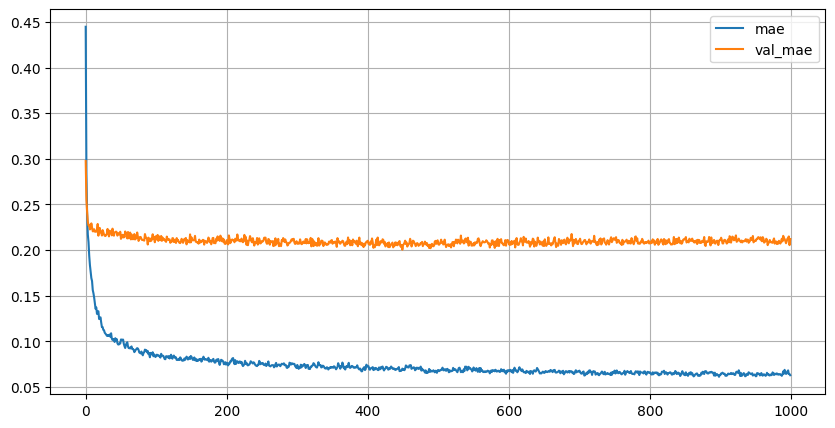

Epoch 1/1000
23/23 [==============================] - 1s 29ms/step - loss: 0.0062 - mae: 0.0596 - val_loss: 0.0861 - val_mae: 0.2073
Epoch 2/1000
23/23 [==============================] - 0s 18ms/step - loss: 0.0054 - mae: 0.0554 - val_loss: 0.0870 - val_mae: 0.2091
Epoch 3/1000
23/23 [==============================] - 0s 17ms/step - loss: 0.0053 - mae: 0.0551 - val_loss: 0.0869 - val_mae: 0.2083
Epoch 4/1000
23/23 [==============================] - 0s 21ms/step - loss: 0.0054 - mae: 0.0550 - val_loss: 0.0863 - val_mae: 0.2074
Epoch 5/1000
23/23 [==============================] - 1s 22ms/step - loss: 0.0048 - mae: 0.0529 - val_loss: 0.0865 - val_mae: 0.2080
Epoch 6/1000
23/23 [==============================] - 1s 24ms/step - loss: 0.0051 - mae: 0.0535 - val_loss: 0.0869 - val_mae: 0.2085
Epoch 7/1000
23/23 [==============================] - 1s 23ms/step - loss: 0.0050 - mae: 0.0532 - val_loss: 0.0873 - val_mae: 0.2095
Epoch 8/1000
23/23 [==============================] - 0s 19ms/step - 

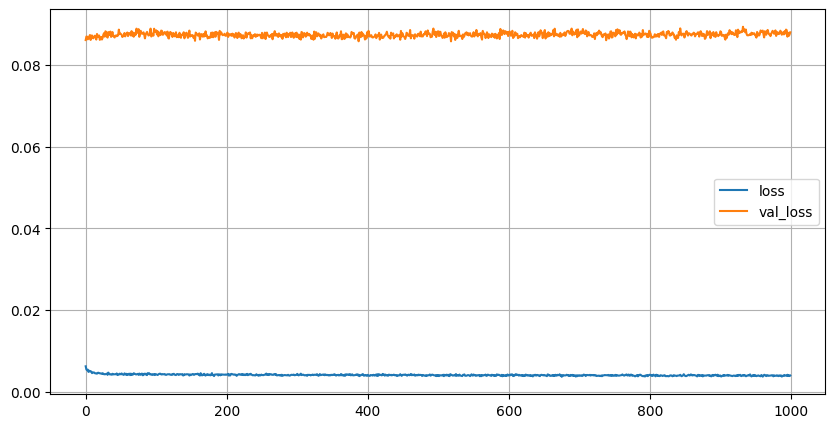

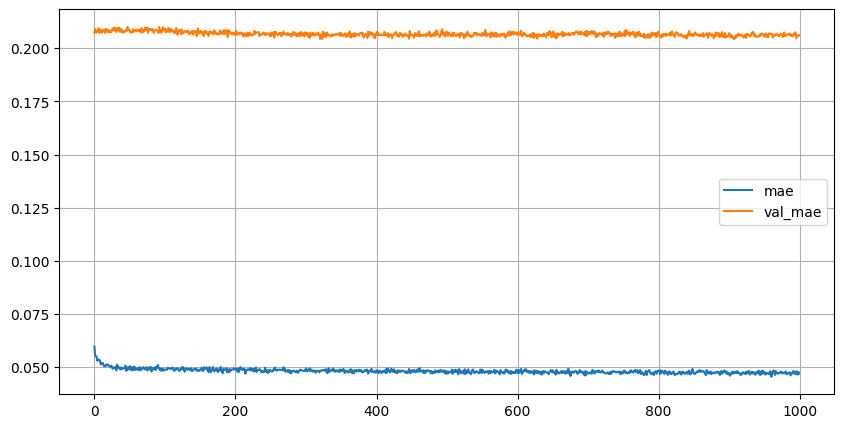

10/10 [==============================] - 0s 4ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6658.8 : 5436.6 :2.21e-02:6.64e-02|  22.1  :  63.4  :2.21e-04:1.46e-04|  0.3%  :  1.2%  :  1.0%  :  0.2%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=64, epochs=1000, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=256, epochs=1000, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/1000
12/12 [==============================] - 2s 57ms/step - loss: 15036511.0000 - mae: 2691.2646 - val_loss: 15145757.0000 - val_mae: 2705.0210
Epoch 2/1000
12/12 [==============================] - 0s 39ms/step - loss: 14920006.0000 - mae: 2680.8230 - val_loss: 14965294.0000 - val_mae: 2688.6396
Epoch 3/1000
12/12 [==============================] - 0s 30ms/step - loss: 14667069.0000 - mae: 2657.8311 - val_loss: 14599950.0000 - val_mae: 2654.9329
Epoch 4/1000
12/12 [==============================] - 0s 28ms/step - loss: 14179890.0000 - mae: 2612.5715 - val_loss: 13940523.0000 - val_mae: 2593.0359
Epoch 5/1000
12/12 [==============================] - 0s 28ms/step - loss: 13344436.0000 - mae: 2532.7971 - val_loss: 12873840.0000 - val_mae: 2489.0505
Epoch 6/1000
12/12 [==============================] - 0s 27ms/step - loss: 12046224.0000 - mae: 2403.0256 - val_loss: 11306789.0000 - val_mae: 2328.0862
Epoch 7/1000
12/12 [==============================] - 0s 30ms/step - loss: 1022785

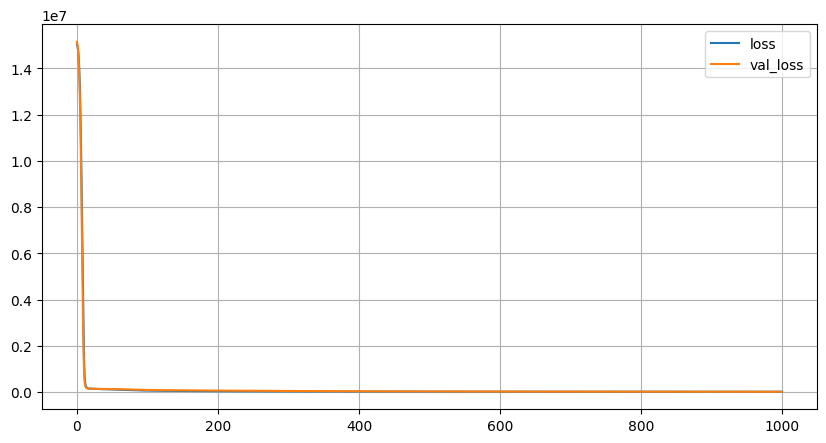

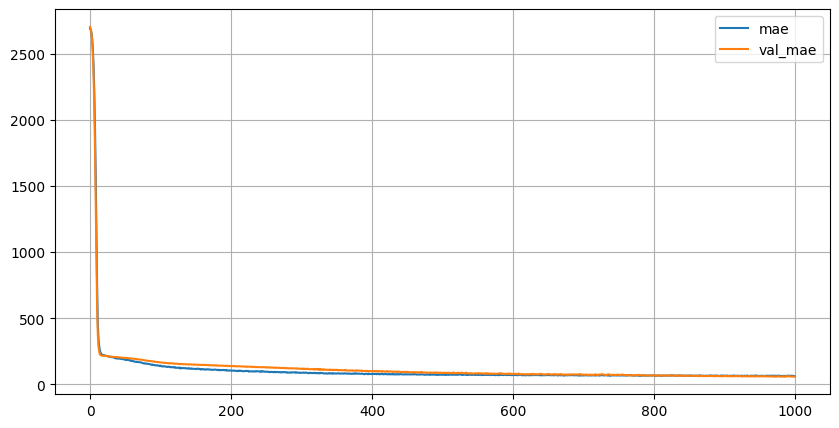

Epoch 1/1000
12/12 [==============================] - 52s 47ms/step - loss: 12665.1611 - mae: 62.9950 - val_loss: 11625.3076 - val_mae: 60.5740
Epoch 2/1000
12/12 [==============================] - 0s 31ms/step - loss: 13362.6934 - mae: 64.0699 - val_loss: 11113.5957 - val_mae: 59.4223
Epoch 3/1000
12/12 [==============================] - 0s 29ms/step - loss: 12646.3076 - mae: 62.5755 - val_loss: 10653.2607 - val_mae: 58.1244
Epoch 4/1000
12/12 [==============================] - 0s 30ms/step - loss: 13351.9141 - mae: 63.5164 - val_loss: 11078.6826 - val_mae: 59.0665
Epoch 5/1000
12/12 [==============================] - 0s 33ms/step - loss: 12898.5938 - mae: 63.0405 - val_loss: 10712.5156 - val_mae: 57.9108
Epoch 6/1000
12/12 [==============================] - 0s 30ms/step - loss: 13075.1680 - mae: 63.3400 - val_loss: 10706.1943 - val_mae: 57.9713
Epoch 7/1000
12/12 [==============================] - 0s 25ms/step - loss: 12635.2178 - mae: 63.0337 - val_loss: 10694.6846 - val_mae: 57.962

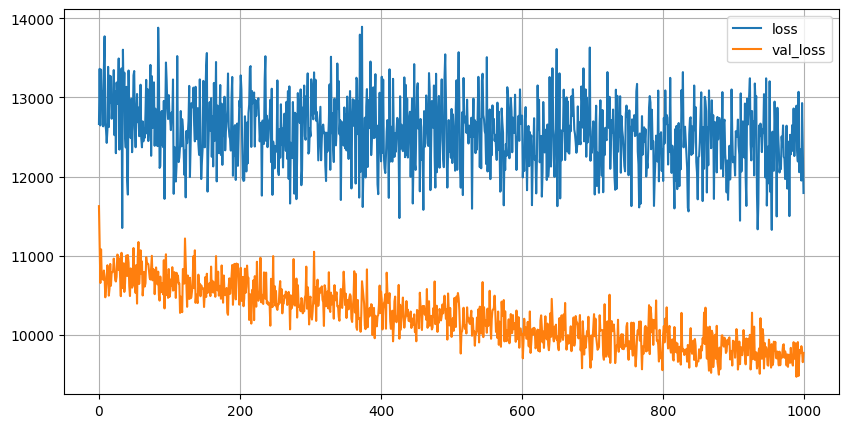

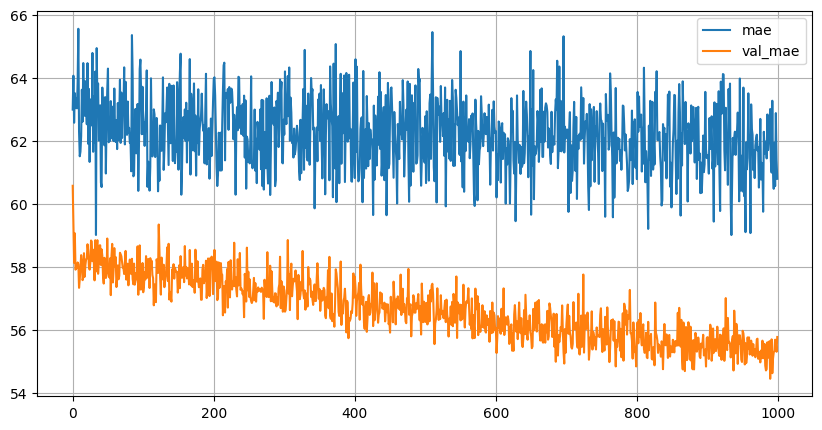

10/10 [==============================] - 0s 4ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6734.8 : 5570.3 :5.71e-02:9.37e-02|  98.1  :  70.3  :3.48e-02:2.74e-02|  1.5%  :  1.3%  : 156.0% : 41.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.1))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train, batch_size=128, epochs=1000, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = model.predict(x_scaler.transform(x_test))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/60
12/12 [==============================] - 2s 50ms/step - loss: 0.5354 - mae: 0.5528 - val_loss: 0.2050 - val_mae: 0.3464
Epoch 2/60
12/12 [==============================] - 0s 23ms/step - loss: 0.2356 - mae: 0.3739 - val_loss: 0.1645 - val_mae: 0.2974
Epoch 3/60
12/12 [==============================] - 0s 21ms/step - loss: 0.1842 - mae: 0.3279 - val_loss: 0.1356 - val_mae: 0.2726
Epoch 4/60
12/12 [==============================] - 0s 19ms/step - loss: 0.1576 - mae: 0.2995 - val_loss: 0.1229 - val_mae: 0.2610
Epoch 5/60
12/12 [==============================] - 0s 21ms/step - loss: 0.1405 - mae: 0.2823 - val_loss: 0.1163 - val_mae: 0.2502
Epoch 6/60
12/12 [==============================] - 0s 19ms/step - loss: 0.1261 - mae: 0.2664 - val_loss: 0.1161 - val_mae: 0.2475
Epoch 7/60
12/12 [==============================] - 0s 21ms/step - loss: 0.1196 - mae: 0.2595 - val_loss: 0.1092 - val_mae: 0.2411
Epoch 8/60
12/12 [==============================] - 0s 18ms/step - loss: 0.1143 - m

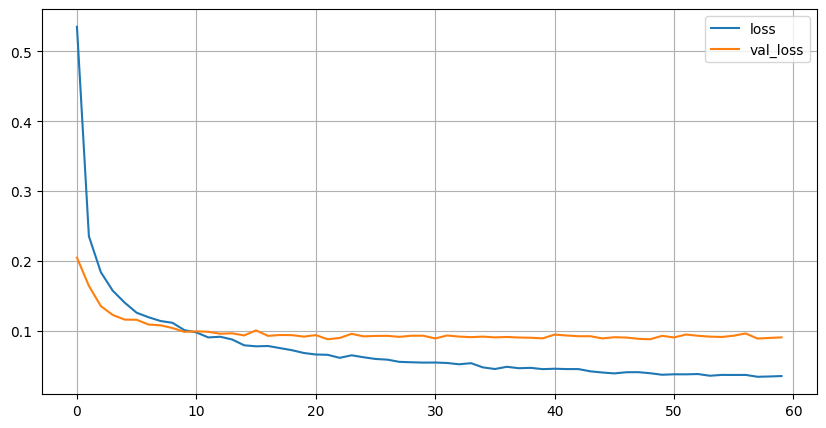

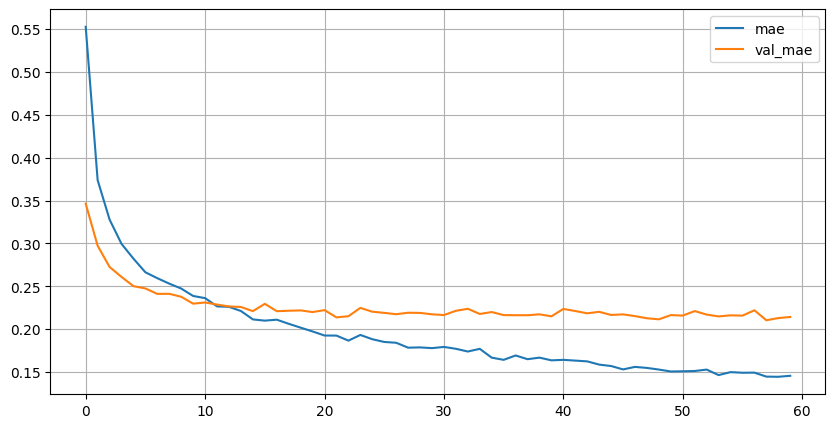

Epoch 1/60
12/12 [==============================] - 1s 28ms/step - loss: 0.0331 - mae: 0.1408 - val_loss: 0.0908 - val_mae: 0.2136
Epoch 2/60
12/12 [==============================] - 0s 14ms/step - loss: 0.0323 - mae: 0.1383 - val_loss: 0.0899 - val_mae: 0.2130
Epoch 3/60
12/12 [==============================] - 0s 15ms/step - loss: 0.0316 - mae: 0.1376 - val_loss: 0.0882 - val_mae: 0.2112
Epoch 4/60
12/12 [==============================] - 0s 15ms/step - loss: 0.0319 - mae: 0.1383 - val_loss: 0.0888 - val_mae: 0.2111
Epoch 5/60
12/12 [==============================] - 0s 13ms/step - loss: 0.0318 - mae: 0.1372 - val_loss: 0.0906 - val_mae: 0.2135
Epoch 6/60
12/12 [==============================] - 0s 14ms/step - loss: 0.0316 - mae: 0.1380 - val_loss: 0.0904 - val_mae: 0.2136
Epoch 7/60
12/12 [==============================] - 0s 15ms/step - loss: 0.0310 - mae: 0.1354 - val_loss: 0.0907 - val_mae: 0.2131
Epoch 8/60
12/12 [==============================] - 0s 15ms/step - loss: 0.0317 - m

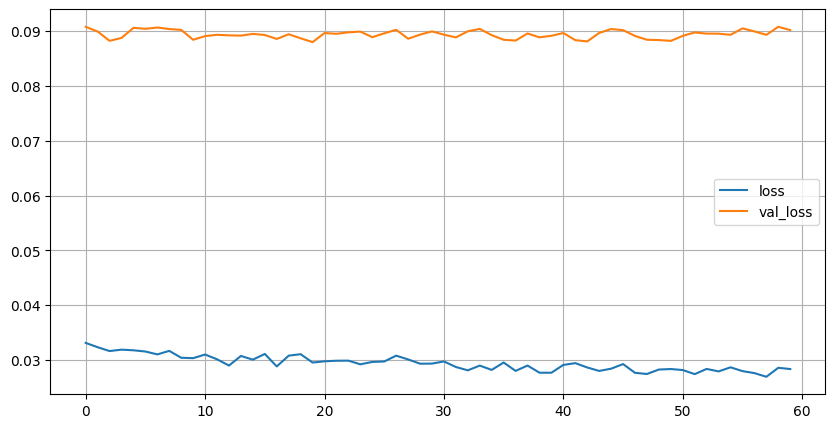

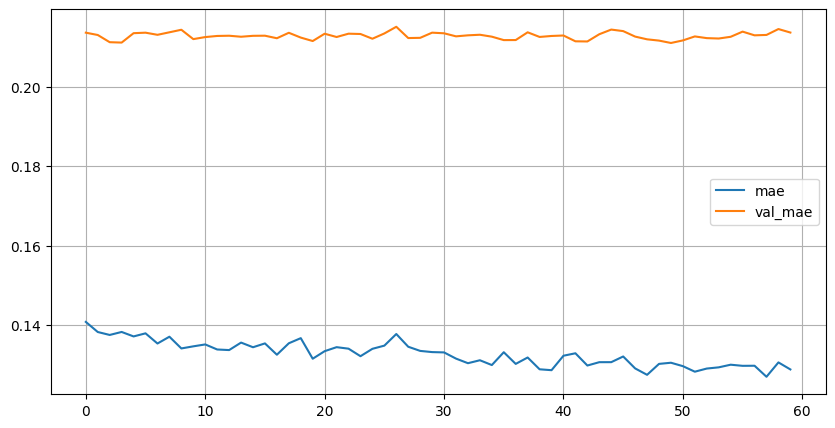

10/10 [==============================] - 0s 2ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6686.7 : 5426.6 :2.21e-02:6.58e-02|  50.0  :  73.3  :1.56e-04:4.52e-04|  0.8%  :  1.3%  :  0.7%  :  0.7%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=60, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/1000
12/12 [==============================] - 3s 139ms/step - loss: 0.4039 - mae: 0.4798 - val_loss: 0.1510 - val_mae: 0.2983
Epoch 2/1000
12/12 [==============================] - 1s 90ms/step - loss: 0.1682 - mae: 0.3044 - val_loss: 0.1370 - val_mae: 0.2778
Epoch 3/1000
12/12 [==============================] - 1s 95ms/step - loss: 0.1264 - mae: 0.2589 - val_loss: 0.1189 - val_mae: 0.2568
Epoch 4/1000
12/12 [==============================] - 1s 80ms/step - loss: 0.1011 - mae: 0.2303 - val_loss: 0.1012 - val_mae: 0.2356
Epoch 5/1000
12/12 [==============================] - 1s 93ms/step - loss: 0.0865 - mae: 0.2144 - val_loss: 0.0955 - val_mae: 0.2272
Epoch 6/1000
12/12 [==============================] - 1s 96ms/step - loss: 0.0777 - mae: 0.2003 - val_loss: 0.0899 - val_mae: 0.2203
Epoch 7/1000
12/12 [==============================] - 1s 98ms/step - loss: 0.0695 - mae: 0.1932 - val_loss: 0.0924 - val_mae: 0.2208
Epoch 8/1000
12/12 [==============================] - 1s 96ms/step -

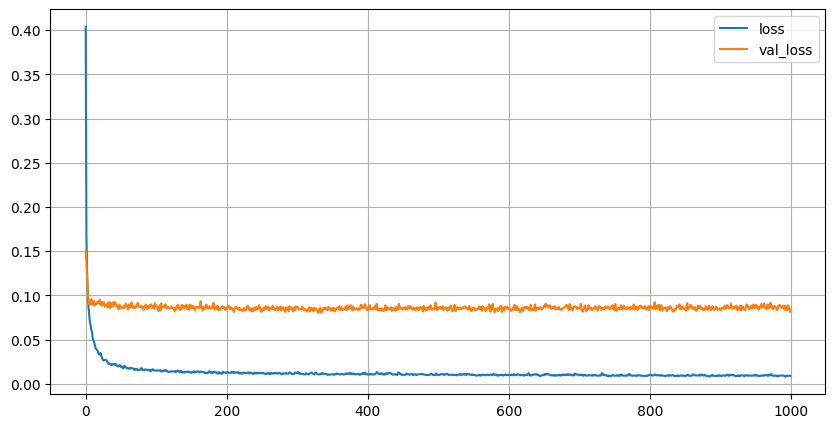

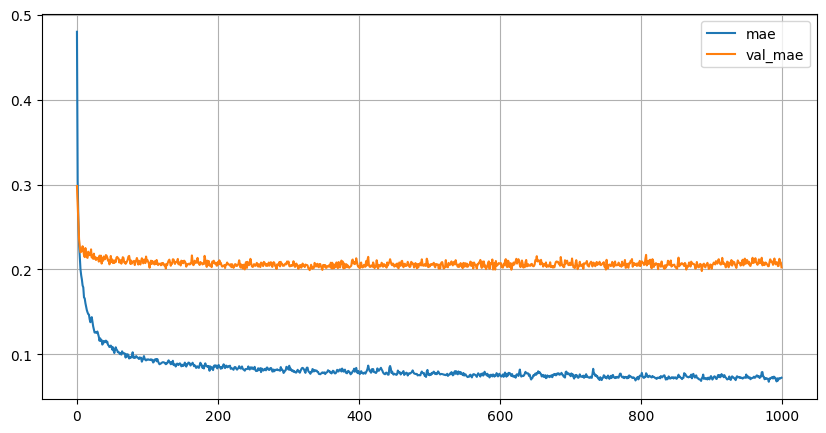

Epoch 1/1000
12/12 [==============================] - 3s 137ms/step - loss: 0.0080 - mae: 0.0677 - val_loss: 0.0844 - val_mae: 0.2055
Epoch 2/1000
12/12 [==============================] - 1s 79ms/step - loss: 0.0072 - mae: 0.0640 - val_loss: 0.0838 - val_mae: 0.2039
Epoch 3/1000
12/12 [==============================] - 1s 79ms/step - loss: 0.0071 - mae: 0.0631 - val_loss: 0.0851 - val_mae: 0.2058
Epoch 4/1000
12/12 [==============================] - 1s 77ms/step - loss: 0.0067 - mae: 0.0617 - val_loss: 0.0839 - val_mae: 0.2038
Epoch 5/1000
12/12 [==============================] - 1s 91ms/step - loss: 0.0071 - mae: 0.0628 - val_loss: 0.0851 - val_mae: 0.2050
Epoch 6/1000
12/12 [==============================] - 1s 97ms/step - loss: 0.0064 - mae: 0.0611 - val_loss: 0.0840 - val_mae: 0.2039
Epoch 7/1000
12/12 [==============================] - 1s 95ms/step - loss: 0.0065 - mae: 0.0610 - val_loss: 0.0844 - val_mae: 0.2036
Epoch 8/1000
12/12 [==============================] - 1s 97ms/step -

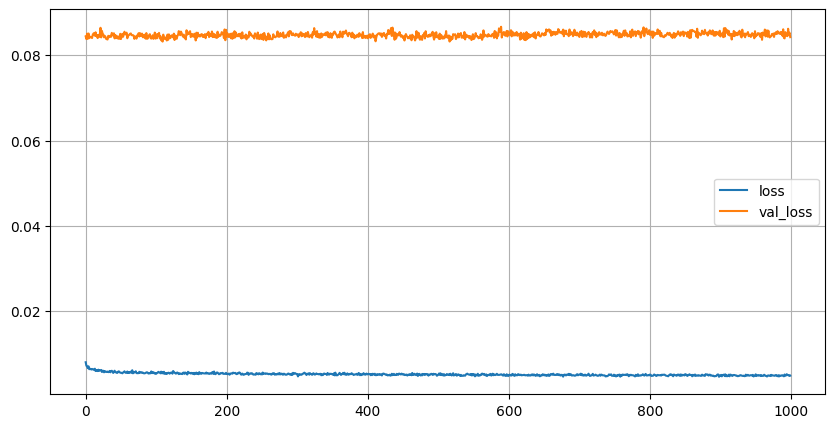

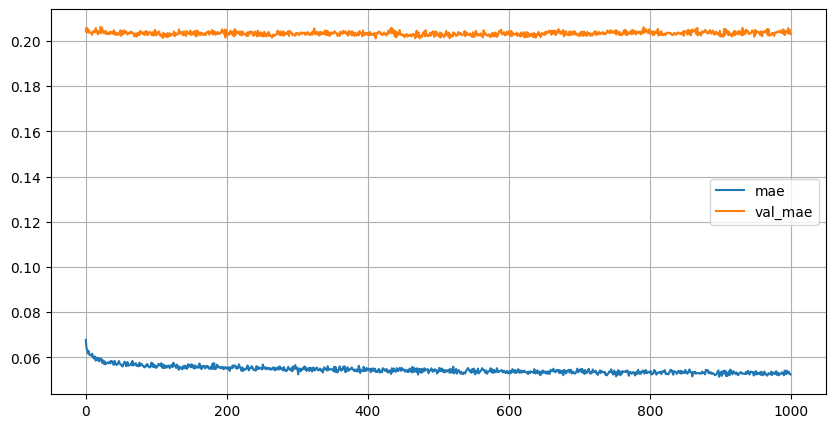

10/10 [==============================] - 0s 7ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6653.6 : 5421.3 :2.21e-02:6.65e-02|  16.9  :  78.6  :1.52e-04:2.54e-04|  0.3%  :  1.4%  :  0.7%  :  0.4%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(2048, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=1000, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/500
12/12 [==============================] - 5s 248ms/step - loss: 0.4503 - mae: 0.5049 - val_loss: 0.2298 - val_mae: 0.3646
Epoch 2/500
12/12 [==============================] - 3s 216ms/step - loss: 0.1950 - mae: 0.3316 - val_loss: 0.1295 - val_mae: 0.2700
Epoch 3/500
12/12 [==============================] - 1s 117ms/step - loss: 0.1459 - mae: 0.2869 - val_loss: 0.1184 - val_mae: 0.2556
Epoch 4/500
12/12 [==============================] - 2s 146ms/step - loss: 0.1165 - mae: 0.2541 - val_loss: 0.1060 - val_mae: 0.2399
Epoch 5/500
12/12 [==============================] - 2s 152ms/step - loss: 0.0999 - mae: 0.2335 - val_loss: 0.1046 - val_mae: 0.2362
Epoch 6/500
12/12 [==============================] - 3s 234ms/step - loss: 0.0875 - mae: 0.2203 - val_loss: 0.1026 - val_mae: 0.2310
Epoch 7/500
12/12 [==============================] - 2s 178ms/step - loss: 0.0792 - mae: 0.2119 - val_loss: 0.1078 - val_mae: 0.2400
Epoch 8/500
12/12 [==============================] - 1s 110ms/step - 

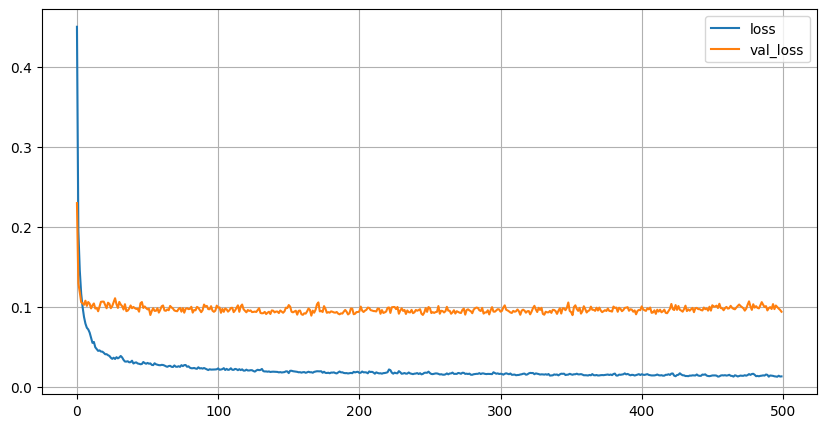

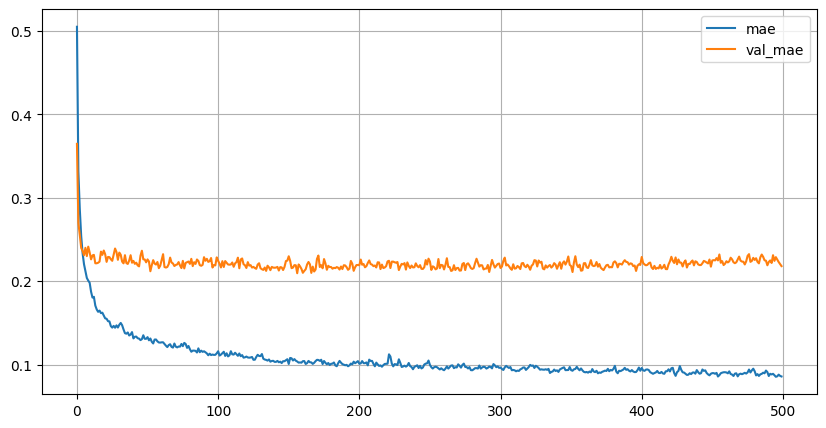

Epoch 1/500
12/12 [==============================] - 3s 129ms/step - loss: 0.0113 - mae: 0.0801 - val_loss: 0.0965 - val_mae: 0.2207
Epoch 2/500
12/12 [==============================] - 1s 98ms/step - loss: 0.0110 - mae: 0.0797 - val_loss: 0.0936 - val_mae: 0.2172
Epoch 3/500
12/12 [==============================] - 1s 112ms/step - loss: 0.0107 - mae: 0.0771 - val_loss: 0.0957 - val_mae: 0.2189
Epoch 4/500
12/12 [==============================] - 1s 110ms/step - loss: 0.0104 - mae: 0.0768 - val_loss: 0.0940 - val_mae: 0.2178
Epoch 5/500
12/12 [==============================] - 1s 103ms/step - loss: 0.0103 - mae: 0.0758 - val_loss: 0.0951 - val_mae: 0.2185
Epoch 6/500
12/12 [==============================] - 2s 126ms/step - loss: 0.0094 - mae: 0.0739 - val_loss: 0.0941 - val_mae: 0.2173
Epoch 7/500
12/12 [==============================] - 2s 166ms/step - loss: 0.0094 - mae: 0.0736 - val_loss: 0.0961 - val_mae: 0.2200
Epoch 8/500
12/12 [==============================] - 1s 114ms/step - l

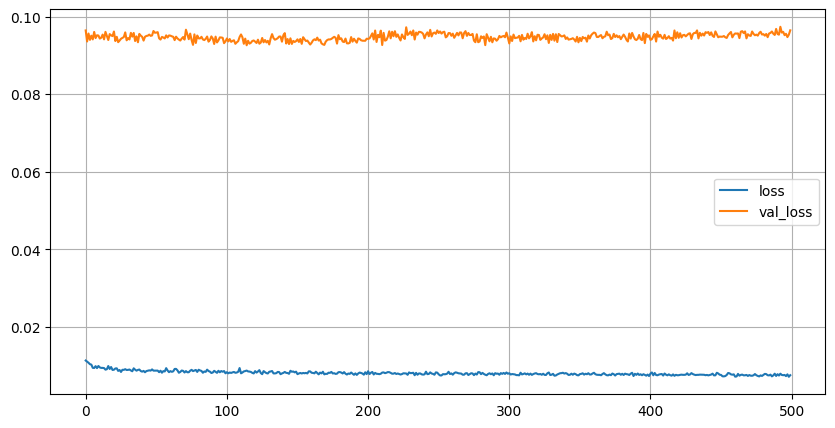

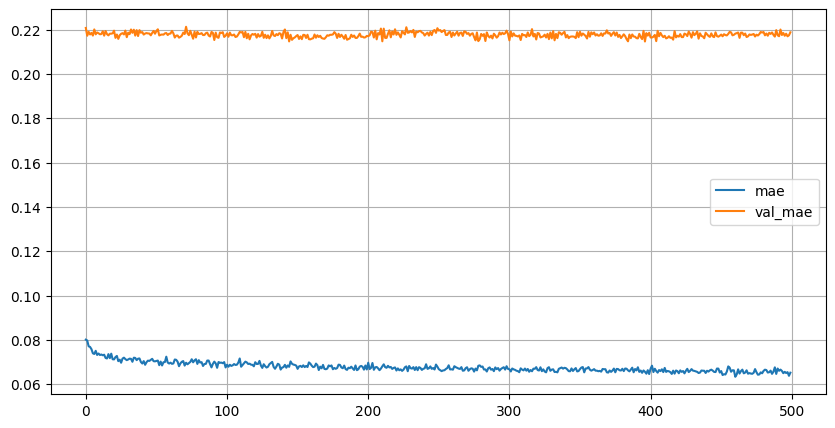

Epoch 1/500
12/12 [==============================] - 2s 116ms/step - loss: 0.0072 - mae: 0.0645 - val_loss: 0.0961 - val_mae: 0.2180
Epoch 2/500
12/12 [==============================] - 1s 103ms/step - loss: 0.0073 - mae: 0.0638 - val_loss: 0.0959 - val_mae: 0.2178
Epoch 3/500
12/12 [==============================] - 1s 111ms/step - loss: 0.0072 - mae: 0.0643 - val_loss: 0.0958 - val_mae: 0.2175
Epoch 4/500
12/12 [==============================] - 1s 113ms/step - loss: 0.0075 - mae: 0.0648 - val_loss: 0.0955 - val_mae: 0.2171
Epoch 5/500
12/12 [==============================] - 1s 100ms/step - loss: 0.0068 - mae: 0.0621 - val_loss: 0.0956 - val_mae: 0.2173
Epoch 6/500
12/12 [==============================] - 2s 141ms/step - loss: 0.0076 - mae: 0.0656 - val_loss: 0.0956 - val_mae: 0.2174
Epoch 7/500
12/12 [==============================] - 2s 147ms/step - loss: 0.0070 - mae: 0.0636 - val_loss: 0.0956 - val_mae: 0.2174
Epoch 8/500
12/12 [==============================] - 1s 110ms/step - 

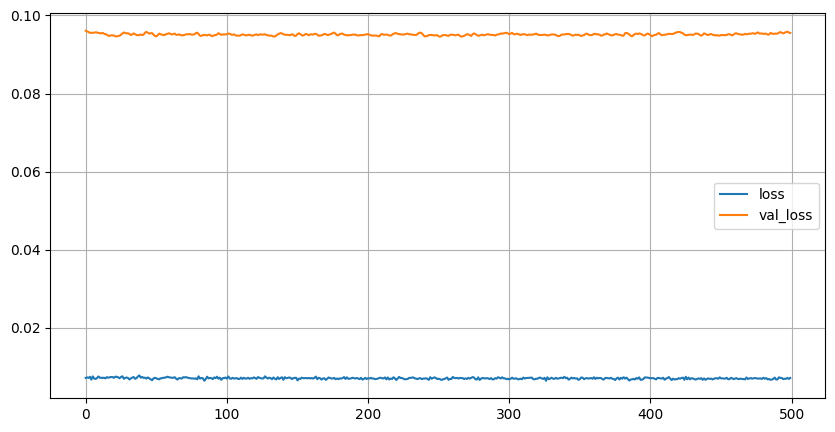

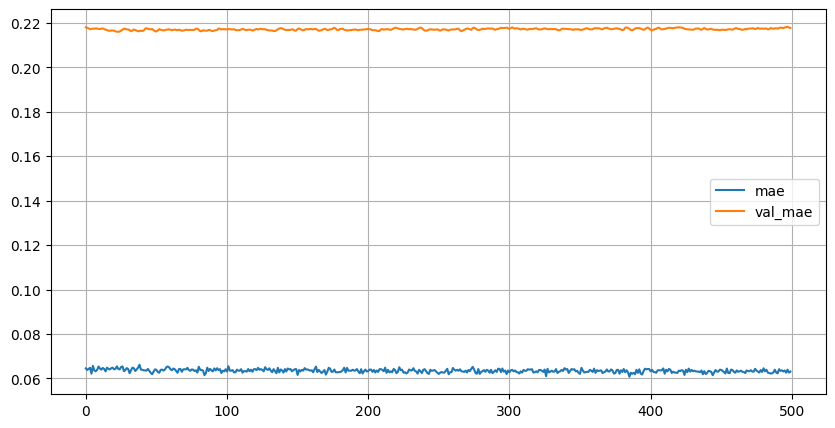

10/10 [==============================] - 0s 15ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6658.0 : 5449.1 :2.21e-02:6.62e-02|  21.3  :  50.9  :1.42e-04:2.04e-05|  0.3%  :  0.9%  :  0.6%  :  0.0%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-0

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(2048, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4, 1e-5]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=500, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/500
12/12 [==============================] - 6s 170ms/step - loss: 0.4520 - mae: 0.5121 - val_loss: 0.2228 - val_mae: 0.3625
Epoch 2/500
12/12 [==============================] - 2s 150ms/step - loss: 0.2084 - mae: 0.3485 - val_loss: 0.1397 - val_mae: 0.2826
Epoch 3/500
12/12 [==============================] - 2s 174ms/step - loss: 0.1495 - mae: 0.2890 - val_loss: 0.1132 - val_mae: 0.2523
Epoch 4/500
12/12 [==============================] - 1s 102ms/step - loss: 0.1243 - mae: 0.2632 - val_loss: 0.1167 - val_mae: 0.2510
Epoch 5/500
12/12 [==============================] - 1s 79ms/step - loss: 0.1053 - mae: 0.2392 - val_loss: 0.1066 - val_mae: 0.2445
Epoch 6/500
12/12 [==============================] - 1s 73ms/step - loss: 0.0942 - mae: 0.2292 - val_loss: 0.1086 - val_mae: 0.2442
Epoch 7/500
12/12 [==============================] - 1s 85ms/step - loss: 0.0887 - mae: 0.2226 - val_loss: 0.1033 - val_mae: 0.2284
Epoch 8/500
12/12 [==============================] - 1s 78ms/step - loss

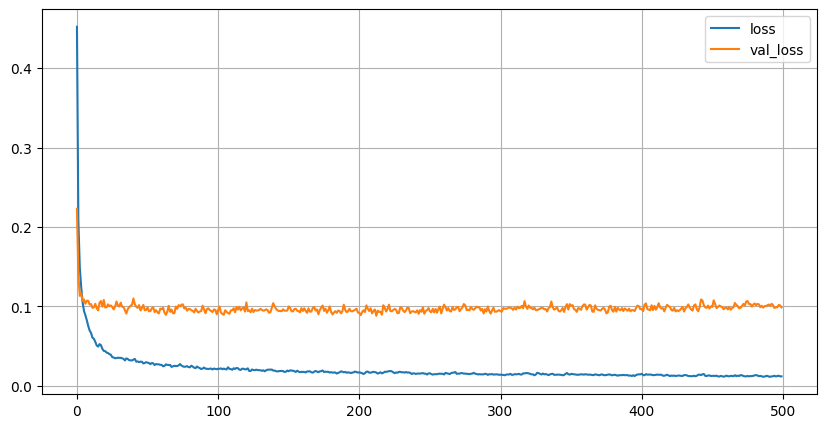

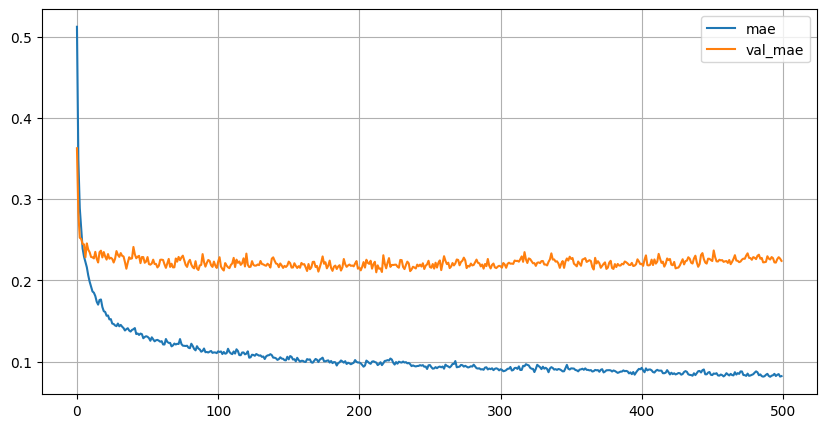

Epoch 1/500
12/12 [==============================] - 3s 153ms/step - loss: 0.0107 - mae: 0.0780 - val_loss: 0.0989 - val_mae: 0.2243
Epoch 2/500
12/12 [==============================] - 1s 90ms/step - loss: 0.0094 - mae: 0.0738 - val_loss: 0.0983 - val_mae: 0.2234
Epoch 3/500
12/12 [==============================] - 1s 87ms/step - loss: 0.0087 - mae: 0.0714 - val_loss: 0.0968 - val_mae: 0.2213
Epoch 4/500
12/12 [==============================] - 1s 90ms/step - loss: 0.0087 - mae: 0.0710 - val_loss: 0.0963 - val_mae: 0.2204
Epoch 5/500
12/12 [==============================] - 1s 73ms/step - loss: 0.0086 - mae: 0.0705 - val_loss: 0.0976 - val_mae: 0.2222
Epoch 6/500
12/12 [==============================] - 1s 82ms/step - loss: 0.0083 - mae: 0.0696 - val_loss: 0.0968 - val_mae: 0.2214
Epoch 7/500
12/12 [==============================] - 1s 76ms/step - loss: 0.0083 - mae: 0.0685 - val_loss: 0.0966 - val_mae: 0.2203
Epoch 8/500
12/12 [==============================] - 1s 81ms/step - loss: 0

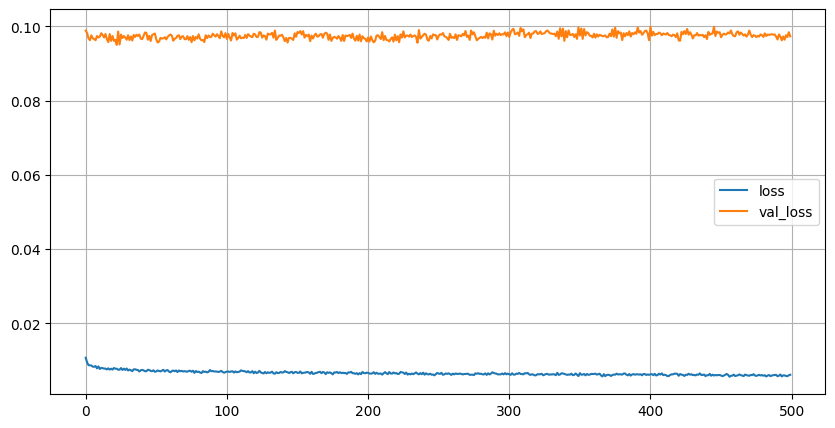

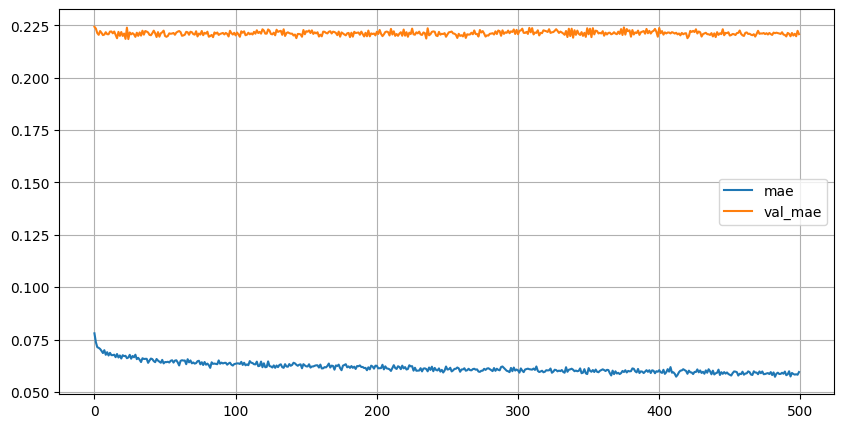

Epoch 1/500
12/12 [==============================] - 2s 86ms/step - loss: 0.0058 - mae: 0.0579 - val_loss: 0.0975 - val_mae: 0.2210
Epoch 2/500
12/12 [==============================] - 1s 106ms/step - loss: 0.0060 - mae: 0.0590 - val_loss: 0.0976 - val_mae: 0.2211
Epoch 3/500
12/12 [==============================] - 1s 103ms/step - loss: 0.0059 - mae: 0.0584 - val_loss: 0.0976 - val_mae: 0.2211
Epoch 4/500
12/12 [==============================] - 1s 76ms/step - loss: 0.0061 - mae: 0.0592 - val_loss: 0.0973 - val_mae: 0.2207
Epoch 5/500
12/12 [==============================] - 1s 83ms/step - loss: 0.0058 - mae: 0.0583 - val_loss: 0.0971 - val_mae: 0.2206
Epoch 6/500
12/12 [==============================] - 1s 82ms/step - loss: 0.0058 - mae: 0.0576 - val_loss: 0.0970 - val_mae: 0.2203
Epoch 7/500
12/12 [==============================] - 1s 73ms/step - loss: 0.0060 - mae: 0.0587 - val_loss: 0.0973 - val_mae: 0.2206
Epoch 8/500
12/12 [==============================] - 1s 71ms/step - loss: 

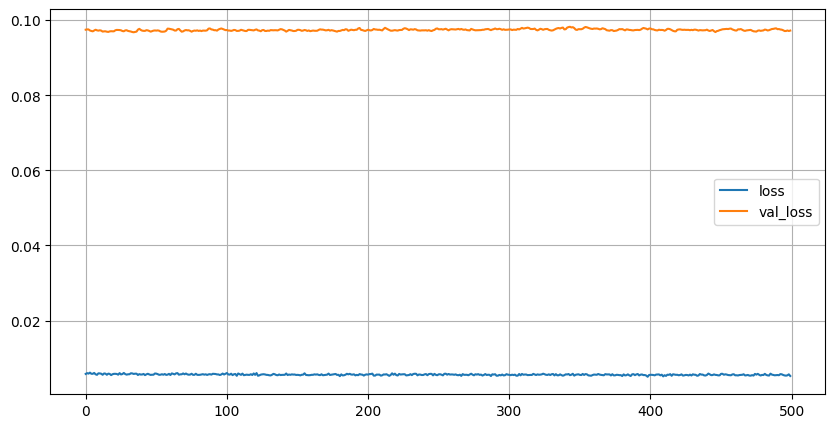

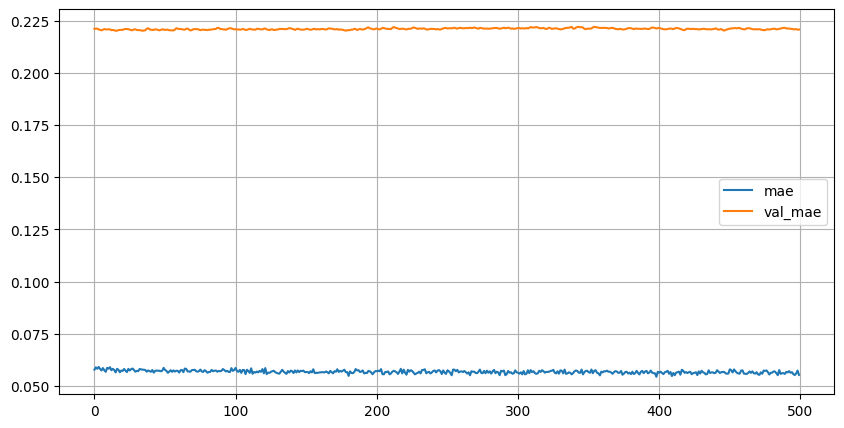

10/10 [==============================] - 0s 9ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6687.7 : 5465.6 :2.21e-02:6.63e-02|  50.9  :  34.4  :2.05e-04:7.99e-05|  0.8%  :  0.6%  :  0.9%  :  0.1%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-02

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4, 1e-5]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=500, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

Epoch 1/500
12/12 [==============================] - 3s 139ms/step - loss: 0.5386 - mae: 0.5678 - val_loss: 0.2328 - val_mae: 0.3614
Epoch 2/500
12/12 [==============================] - 1s 100ms/step - loss: 0.2299 - mae: 0.3661 - val_loss: 0.1462 - val_mae: 0.2852
Epoch 3/500
12/12 [==============================] - 1s 117ms/step - loss: 0.1726 - mae: 0.3142 - val_loss: 0.1433 - val_mae: 0.2832
Epoch 4/500
12/12 [==============================] - 1s 122ms/step - loss: 0.1465 - mae: 0.2883 - val_loss: 0.1062 - val_mae: 0.2394
Epoch 5/500
12/12 [==============================] - 1s 114ms/step - loss: 0.1193 - mae: 0.2579 - val_loss: 0.1145 - val_mae: 0.2549
Epoch 6/500
12/12 [==============================] - 2s 153ms/step - loss: 0.1155 - mae: 0.2556 - val_loss: 0.0999 - val_mae: 0.2376
Epoch 7/500
12/12 [==============================] - 1s 102ms/step - loss: 0.1033 - mae: 0.2419 - val_loss: 0.1118 - val_mae: 0.2398
Epoch 8/500
12/12 [==============================] - 1s 115ms/step - 

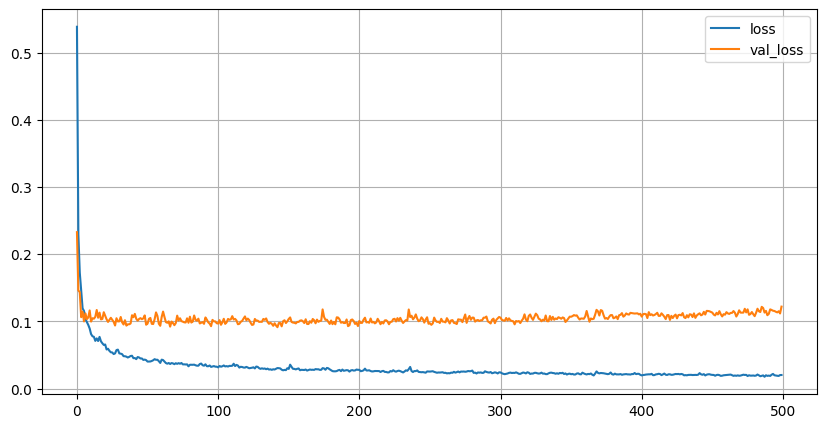

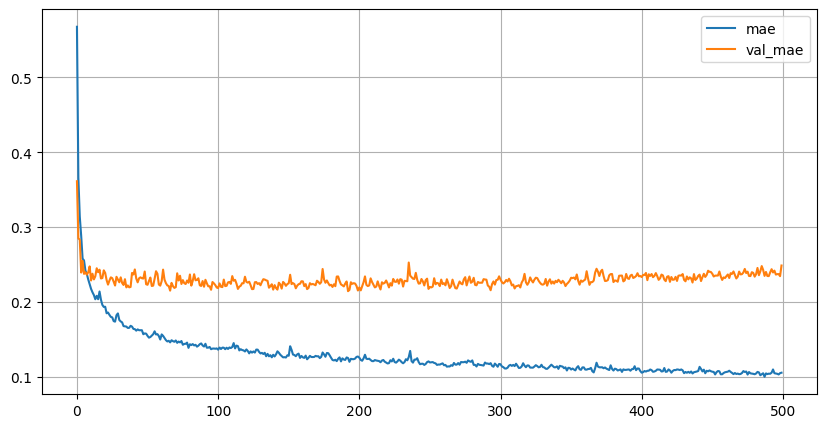

Epoch 1/500
12/12 [==============================] - 3s 118ms/step - loss: 0.0183 - mae: 0.1022 - val_loss: 0.1160 - val_mae: 0.2398
Epoch 2/500
12/12 [==============================] - 1s 113ms/step - loss: 0.0168 - mae: 0.0973 - val_loss: 0.1137 - val_mae: 0.2359
Epoch 3/500
12/12 [==============================] - 1s 115ms/step - loss: 0.0157 - mae: 0.0945 - val_loss: 0.1128 - val_mae: 0.2353
Epoch 4/500
12/12 [==============================] - 1s 125ms/step - loss: 0.0167 - mae: 0.0963 - val_loss: 0.1124 - val_mae: 0.2339
Epoch 5/500
12/12 [==============================] - 2s 159ms/step - loss: 0.0154 - mae: 0.0931 - val_loss: 0.1148 - val_mae: 0.2375
Epoch 6/500
12/12 [==============================] - 1s 101ms/step - loss: 0.0150 - mae: 0.0918 - val_loss: 0.1114 - val_mae: 0.2329
Epoch 7/500
12/12 [==============================] - 1s 114ms/step - loss: 0.0154 - mae: 0.0930 - val_loss: 0.1115 - val_mae: 0.2330
Epoch 8/500
12/12 [==============================] - 1s 109ms/step - 

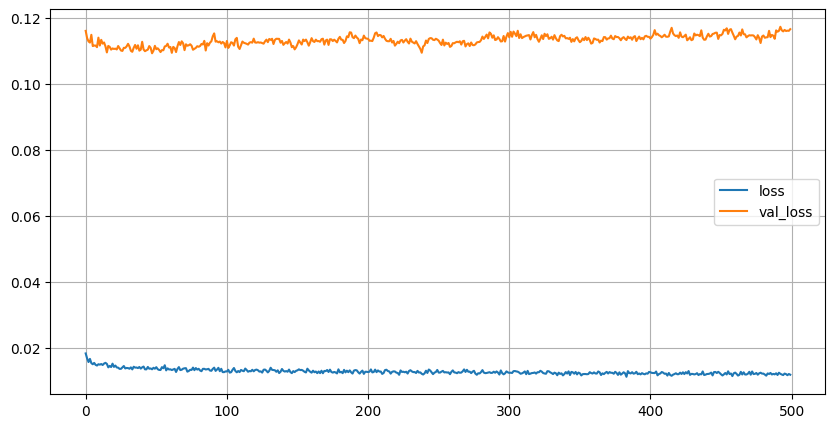

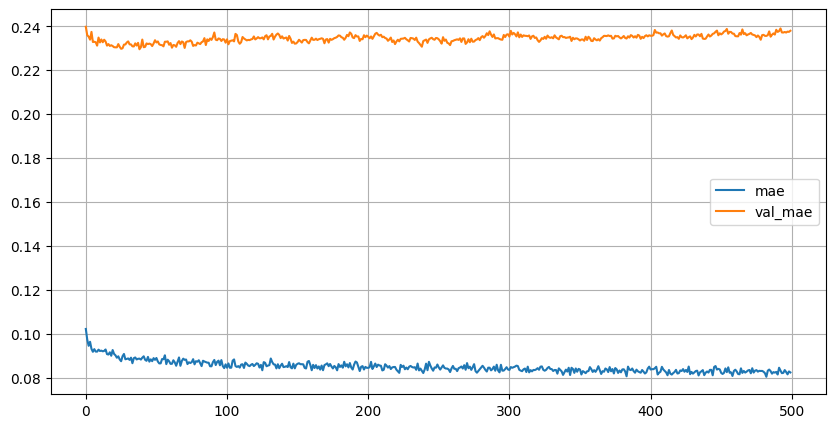

Epoch 1/500
12/12 [==============================] - 3s 132ms/step - loss: 0.0122 - mae: 0.0825 - val_loss: 0.1161 - val_mae: 0.2376
Epoch 2/500
12/12 [==============================] - 1s 120ms/step - loss: 0.0117 - mae: 0.0815 - val_loss: 0.1158 - val_mae: 0.2374
Epoch 3/500
12/12 [==============================] - 1s 103ms/step - loss: 0.0121 - mae: 0.0821 - val_loss: 0.1155 - val_mae: 0.2370
Epoch 4/500
12/12 [==============================] - 1s 99ms/step - loss: 0.0120 - mae: 0.0826 - val_loss: 0.1153 - val_mae: 0.2369
Epoch 5/500
12/12 [==============================] - 1s 99ms/step - loss: 0.0122 - mae: 0.0825 - val_loss: 0.1152 - val_mae: 0.2368
Epoch 6/500
12/12 [==============================] - 1s 101ms/step - loss: 0.0118 - mae: 0.0820 - val_loss: 0.1152 - val_mae: 0.2369
Epoch 7/500
12/12 [==============================] - 1s 121ms/step - loss: 0.0117 - mae: 0.0805 - val_loss: 0.1152 - val_mae: 0.2368
Epoch 8/500
12/12 [==============================] - 2s 140ms/step - lo

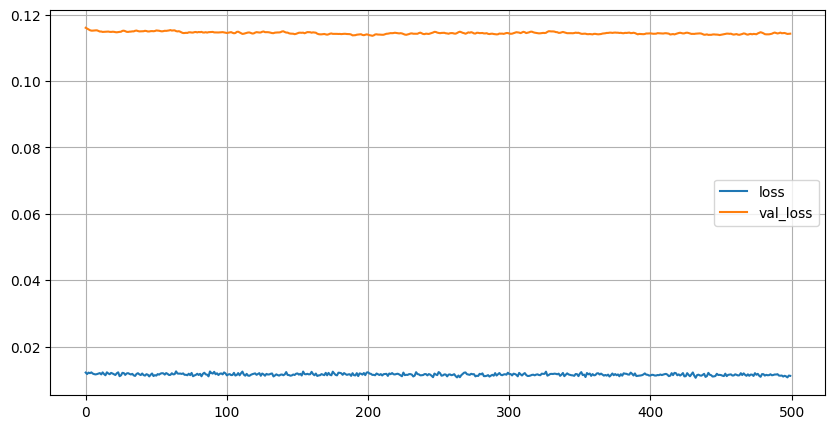

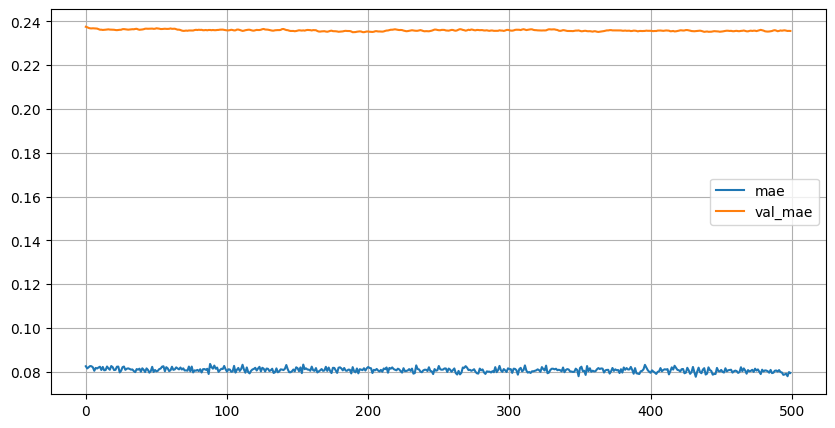

10/10 [==============================] - 0s 10ms/step
------------------------------------------------------------------------------------------------------------------------------------------------------
| ID |               TEST                |               PRED                |                AE                 |              APE, %               |
------------------------------------------------------------------------------------------------------------------------------------------------------
| ## |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |  tors  :  bend  : f_tors : f_bend |
------------------------------------------------------------------------------------------------------------------------------------------------------
| 0  | 6636.7 : 5500.0 :2.23e-02:6.63e-02| 6697.3 : 5482.7 :2.22e-02:6.63e-02|  60.6  :  17.3  :1.24e-04:7.98e-05|  0.9%  :  0.3%  :  0.6%  :  0.1%  |
| 1  | 6214.0 : 3890.5 :2.21e-02:6.18e-0

In [ ]:
model = Sequential()

# model.add(Dense(8, activation='relu'))
# model.add(Dropout(.1))
model.add(Dense(2048, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.2))
model.add(Dense(256, activation='relu'))
model.add(Dropout(.2))

model.add(Dense(4, activation='linear'))

for lr in [1e-3, 1e-4, 1e-5]:
  model.compile(optimizer=Adam(learning_rate=lr), loss='mse', metrics=['mae'])
  h = model.fit(x_train_scaled, y_train_scaled, batch_size=128, epochs=500, validation_split=VAL_SPLIT)
  plot_history(h)

y_pred = y_scaler.inverse_transform(model.predict(x_scaler.transform(x_test)))

evaluate_model(y_pred=y_pred, y_test=y_test, target_names=['tors', 'bend', 'f_tors', 'f_bend'], table_len=3, return_stats=False)

# TODO:

Visualisation-Plots-